In [1]:
from matplotlib import rc
rc('font',**{'family':'serif','serif':['Times']})
rc('text', usetex=True)

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import glob
import sncosmo
from scipy import signal
from matplotlib.backends.backend_pdf import PdfPages
from scipy.optimize import minimize
from scipy.interpolate import interp1d
from sklearn.gaussian_process.kernels import WhiteKernel, Matern, RBF, RationalQuadratic, ExpSineSquared
from sklearn.gaussian_process import GaussianProcessRegressor
from matplotlib.ticker import ScalarFormatter
from scipy.interpolate import RegularGridInterpolator
from tqdm import tqdm
import GPy
import pickle
import bz2
import emcee
from multiprocessing import Pool
import warnings
from IPython.display import display
warnings.filterwarnings("ignore", category=RuntimeWarning)

In [3]:
plt.rcParams['font.size'] = 20.

In [4]:
p_grid=np.arange(-10,51,1)
w_grid_reg=np.arange(3310,8585,10)
w_grid_plot=np.arange(3350,8585,50) # ATENÇÃO

In [5]:
class ScalarFormatterClass1(ScalarFormatter):
    def _set_format(self):
        self.format = "%1.1f"

## Reading interpolated spectra data and Hsiao template

In [6]:
interpolated_reg_data={}

for file in glob.glob("../Interpolating_the_spectra/interpolated_spectras/Train_SN88_v2.pkl"):
    sn=file.split("/")[3].split(".")[0]
    f=bz2.BZ2File(file,'rb')
    interpolated_reg_data[sn]=pickle.load(f)
    f.close()

In [7]:
Hsiao_temp=pd.read_csv("/home/cassia/SNANA/snroot/snsed/Hsiao07.dat",header=None,sep="\\s+")
Hsiao_temp.columns=["phase","wave","flux"]  # unit of erg/s/cm^2/A

In [8]:
#Hsiao_temp["flux"]=Hsiao_temp["flux"]/np.max(Hsiao_temp["flux"])

In [9]:
#Hsiao_temp_reduced=Hsiao_temp[(Hsiao_temp["phase"]>=-20.) & (Hsiao_temp["phase"]<=70.) & (Hsiao_temp["wave"]>=3000) & (Hsiao_temp["wave"]<=9000)].reset_index(drop=True)

In [10]:
#Hsiao_interp = RegularGridInterpolator((Hsiao_temp_reduced["phase"].unique(), Hsiao_temp_reduced["wave"].unique()), Hsiao_temp_reduced["flux"].values.reshape(61,601))

In [11]:
ph=[]
wl=[]
fl=[]
erfl=[]

In [12]:
for p in interpolated_reg_data["Train_SN88_v2"].keys():
    if (p>=-20 and p<=70.):
        ph.append(np.array([p]*len(interpolated_reg_data["Train_SN88_v2"][p]["wave"])))
        wl.append(interpolated_reg_data["Train_SN88_v2"][p]["wave"].values)
        fl.append(interpolated_reg_data["Train_SN88_v2"][p]["flux"].values)
        erfl.append(interpolated_reg_data["Train_SN88_v2"][p]["eflux"].values)
    else:
        continue

In [13]:
def gp_w_prior(sn,wave,p,flux,fluxerr):
    kern1=GPy.kern.Matern52(1,variance=0.1, lengthscale=15.0)+GPy.kern.Fixed(1,np.diag(fluxerr**2))
    
    temp_hsiao_flux=Hsiao_temp[Hsiao_temp["wave"]==wave]["flux"].values
    temp_hsiao_phase=Hsiao_temp[Hsiao_temp["wave"]==wave]["phase"].values
    temp=interp1d(temp_hsiao_phase,temp_hsiao_flux)   

    def chi2(a):
        return np.sum((flux-(a*temp(p)))**2/fluxerr**2)

    res=minimize(chi2,[1],method="Nelder-Mead")
    result=[res.x[0]]

    def mean(x):
        return result[0]*temp(x)
    
    var_res=np.std(mean(p)-flux)**2
    
    mf = GPy.core.Mapping(1,1)
    mf.f = mean
    mf.update_gradients = lambda a,b: None

    prior1 = GPy.priors.Gaussian(mu=12.,sigma=0.2*12.)
    prior1.domain="positive"
    prior2 = GPy.priors.Gaussian(mu=var_res,sigma=0.1*var_res)
    prior2.domain="positive"
    prior3 = GPy.priors.Gaussian(mu=0.2*var_res,sigma=0.1*0.2*var_res)
    prior3.domain="positive"
    
    model=GPy.models.GPRegression(p.reshape(-1, 1),flux.reshape(-1, 1),kernel=kern1,mean_function=mf)
    model.kern.Mat52.lengthscale.set_prior(prior1,warning=False)
    model.kern.Mat52.variance.set_prior(prior2,warning=False)
    model.Gaussian_noise.variance.set_prior(prior3,warning=False)
    model.kern.fixed.variance.fix()
    
    model.optimize_restarts(num_restarts = 10, optimizer='bfgs')
    display(model)

    #fig = model.plot()
          
    kern2 = GPy.kern.Matern52(1,variance= model.param_array[0], lengthscale=model.param_array[1])
    y_mean, y_var=model.predict(p_grid.reshape(-1, 1),kern=kern2)
        
    return y_mean, y_var,  mean(np.arange(-10,51,1)), model.param_array
    

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Optimization restart 1/10, f = -14.285914183211109
Optimization restart 2/10, f = -14.285914183210993
Optimization restart 3/10, f = -14.28591418321109
Optimization restart 4/10, f = -14.28591418320847
Optimization restart 5/10, f = -14.28591418319726
Optimization restart 6/10, f = -14.285914183211107
Optimization restart 7/10, f = -14.28591418319912
Optimization restart 8/10, f = -14.285914183210288
Optimization restart 9/10, f = -14.28591418316576
Optimization restart 10/10, f = -14.285914183187973


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006672843742914088,+ve,"N(0.0066, 0.00066)"
sum.Mat52.lengthscale,11.936188355798361,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0013335744619902223,+ve,"N(0.0013, 0.00013)"


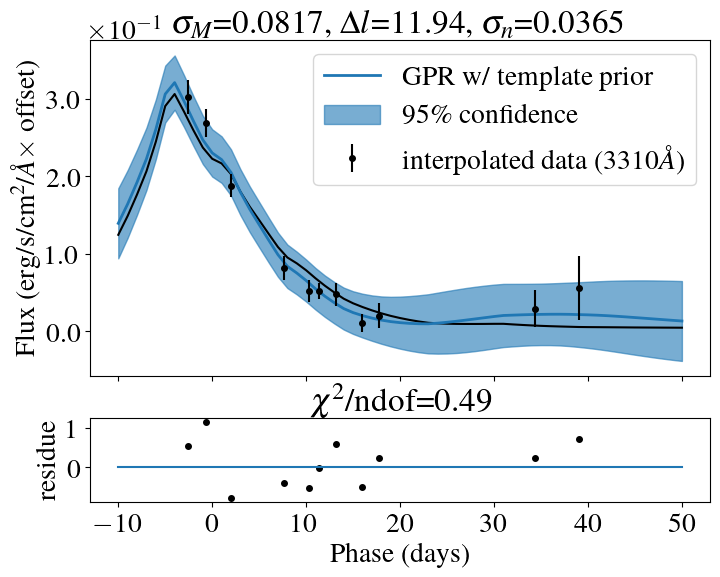

Optimization restart 1/10, f = -15.569968738737881
Optimization restart 2/10, f = -15.569968738736357
Optimization restart 3/10, f = -15.569968738724821
Optimization restart 4/10, f = -15.569968738270775
Optimization restart 5/10, f = -15.569968716486043
Optimization restart 6/10, f = -15.569968738737511
Optimization restart 7/10, f = -15.569968738728482
Optimization restart 8/10, f = -15.569968738733484
Optimization restart 9/10, f = -15.569968729934017
Optimization restart 10/10, f = -15.569968738737758


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.00695928128961499,+ve,"N(0.0069, 0.00069)"
sum.Mat52.lengthscale,11.833818155624297,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0013988497216934528,+ve,"N(0.0014, 0.00014)"


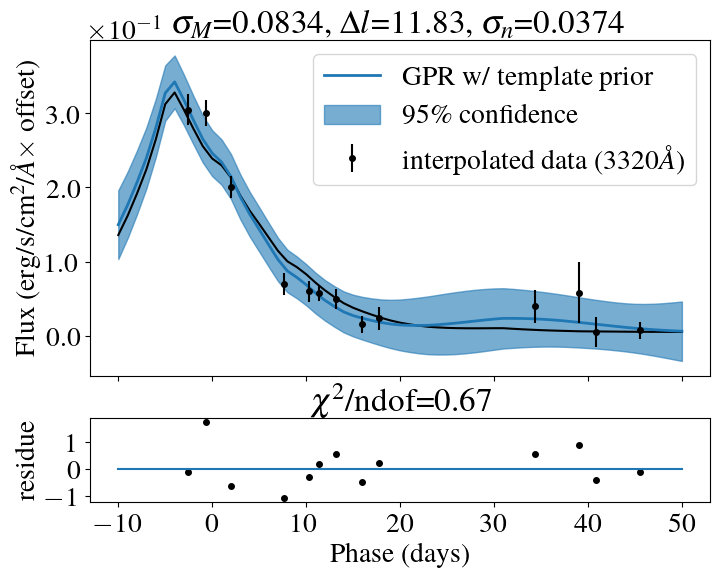

Optimization restart 1/10, f = -17.739749906082203
Optimization restart 2/10, f = -17.73974990608184
Optimization restart 3/10, f = -17.739749904931656
Optimization restart 4/10, f = -17.739749905868994
Optimization restart 5/10, f = -17.739749906049862
Optimization restart 6/10, f = -17.7397499060098
Optimization restart 7/10, f = -17.739749906075993
Optimization restart 8/10, f = -17.739749906081833
Optimization restart 9/10, f = -17.739749906082015
Optimization restart 10/10, f = -17.73974990608221


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004462849346318765,+ve,"N(0.0044, 0.00044)"
sum.Mat52.lengthscale,11.644278572867192,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0008962110276257158,+ve,"N(0.00089, 8.9e-05)"


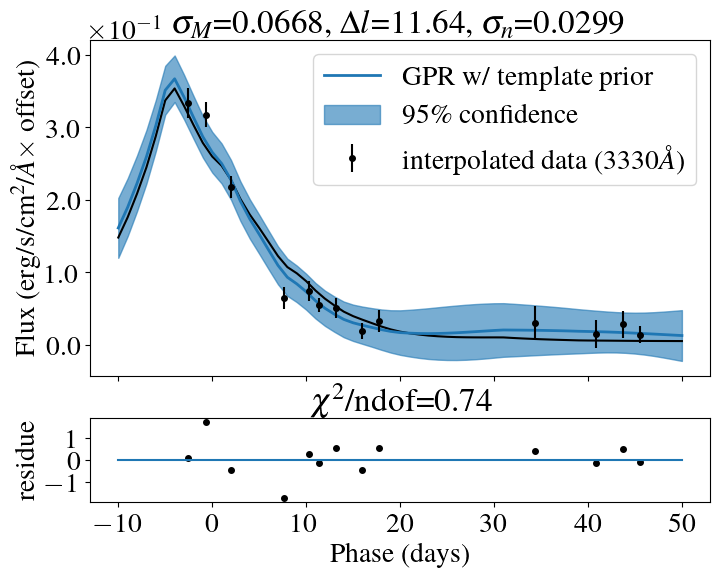

Optimization restart 1/10, f = -19.336776196329964
Optimization restart 2/10, f = -19.33677619633051
Optimization restart 3/10, f = -19.336776195992638
Optimization restart 4/10, f = -19.336776196326372
Optimization restart 5/10, f = -19.336776196266335
Optimization restart 6/10, f = -19.33677619608507
Optimization restart 7/10, f = -19.33677619633039
Optimization restart 8/10, f = -19.33677619633051
Optimization restart 9/10, f = -19.33677619633051
Optimization restart 10/10, f = -19.336776196327822


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005159403848397574,+ve,"N(0.0052, 0.00052)"
sum.Mat52.lengthscale,11.649437465163237,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0010348777486445995,+ve,"N(0.001, 0.0001)"


Optimization restart 1/10, f = -8.746471513569196
Optimization restart 2/10, f = -8.746471512049439
Optimization restart 3/10, f = -8.746471513569151
Optimization restart 4/10, f = -8.746471508624204
Optimization restart 5/10, f = -8.746471513569084
Optimization restart 6/10, f = -8.746471513567425
Optimization restart 7/10, f = -8.746471513563908
Optimization restart 8/10, f = -8.746471513569263
Optimization restart 9/10, f = -8.746471513562703
Optimization restart 10/10, f = -8.746471513569109


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.01178530393088298,+ve,"N(0.012, 0.0012)"
sum.Mat52.lengthscale,11.512507720905608,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0023991269456705593,+ve,"N(0.0023, 0.00023)"


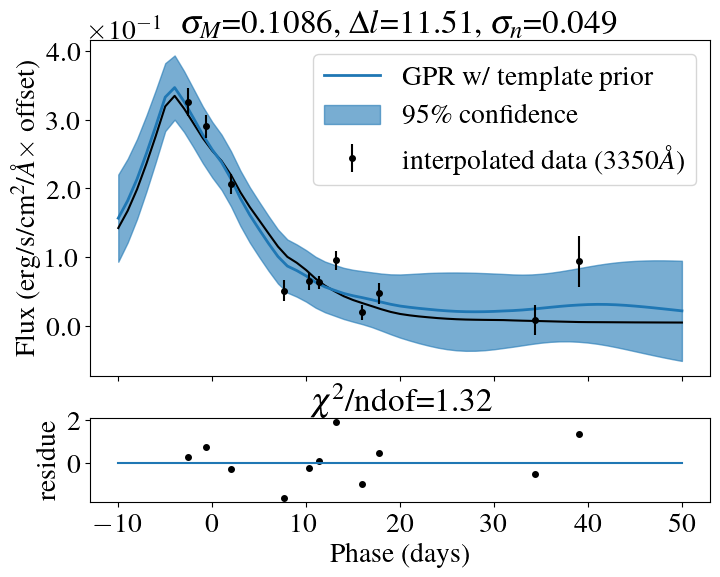

Optimization restart 1/10, f = -21.16326351897966
Optimization restart 2/10, f = -21.163263522388025
Optimization restart 3/10, f = -21.163263522318935
Optimization restart 4/10, f = -21.163263522360037
Optimization restart 5/10, f = -21.163263521282616
Optimization restart 6/10, f = -21.163263522379758
Optimization restart 7/10, f = -21.163263522344465
Optimization restart 8/10, f = -21.163263522387943
Optimization restart 9/10, f = -21.163263522386153
Optimization restart 10/10, f = -21.16326352238797


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.002359330374306113,+ve,"N(0.0024, 0.00024)"
sum.Mat52.lengthscale,12.09923523171467,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0004783549821716985,+ve,"N(0.00047, 4.7e-05)"


Optimization restart 1/10, f = -14.700693456321474
Optimization restart 2/10, f = -14.700693456297856
Optimization restart 3/10, f = -14.700693456319518
Optimization restart 4/10, f = -14.700693456316415
Optimization restart 5/10, f = -14.700693456317957
Optimization restart 6/10, f = -14.700693456091166
Optimization restart 7/10, f = -14.700693456320064
Optimization restart 8/10, f = -14.700693455966652
Optimization restart 9/10, f = -14.700693456318982
Optimization restart 10/10, f = -14.70069345632098


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.011271257543902166,+ve,"N(0.011, 0.0011)"
sum.Mat52.lengthscale,12.640989146305541,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0022832011438546763,+ve,"N(0.0023, 0.00023)"


Optimization restart 1/10, f = -16.332880447303882
Optimization restart 2/10, f = -16.332880446887536
Optimization restart 3/10, f = -16.332880447303758
Optimization restart 4/10, f = -16.33288044729635
Optimization restart 5/10, f = -16.33288044687882
Optimization restart 6/10, f = -16.33288044730216
Optimization restart 7/10, f = -16.33288044730331
Optimization restart 8/10, f = -16.332880447303786
Optimization restart 9/10, f = -16.33288044730388
Optimization restart 10/10, f = -16.33288044470316


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.007745086606051278,+ve,"N(0.0078, 0.00078)"
sum.Mat52.lengthscale,12.175348959655718,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0015742098745913304,+ve,"N(0.0016, 0.00016)"


Optimization restart 1/10, f = -18.92220546837725
Optimization restart 2/10, f = -18.922205468377303
Optimization restart 3/10, f = -18.922205468376593
Optimization restart 4/10, f = -18.922205468367103
Optimization restart 5/10, f = -18.92220546837717
Optimization restart 6/10, f = -18.922205468370432
Optimization restart 7/10, f = -18.922205468376234
Optimization restart 8/10, f = -18.922205468376553
Optimization restart 9/10, f = -18.922205468371054
Optimization restart 10/10, f = -18.922205468377243


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003586037101085434,+ve,"N(0.0036, 0.00036)"
sum.Mat52.lengthscale,12.155031957454382,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0007235979423999421,+ve,"N(0.00072, 7.2e-05)"


Optimization restart 1/10, f = -21.157863643082827
Optimization restart 2/10, f = -21.157863643077537
Optimization restart 3/10, f = -21.157863643081445
Optimization restart 4/10, f = -21.157863641959686
Optimization restart 5/10, f = -21.157863642328802
Optimization restart 6/10, f = -21.157863640348836
Optimization restart 7/10, f = -21.15786364193421
Optimization restart 8/10, f = -21.157863643073725
Optimization restart 9/10, f = -21.15786364115411
Optimization restart 10/10, f = -21.157863643053336


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.00206792123140002,+ve,"N(0.0021, 0.00021)"
sum.Mat52.lengthscale,12.08157652366026,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00041588390556399063,+ve,"N(0.00041, 4.1e-05)"


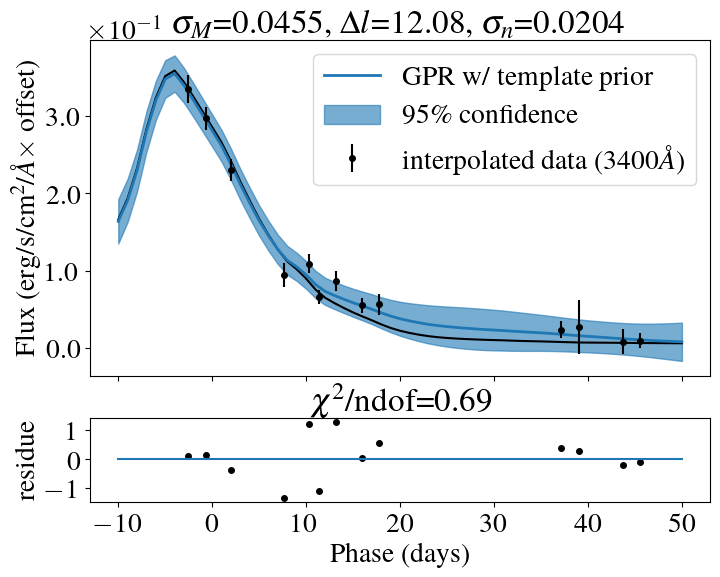

Optimization restart 1/10, f = -18.571965848548587
Optimization restart 2/10, f = -18.571965848554605
Optimization restart 3/10, f = -18.5719658336321
Optimization restart 4/10, f = -18.571965848527924
Optimization restart 5/10, f = -18.571965848554616
Optimization restart 6/10, f = -18.571965848554314
Optimization restart 7/10, f = -18.571965848554616
Optimization restart 8/10, f = -18.57196584820312
Optimization restart 9/10, f = -18.57196584770665
Optimization restart 10/10, f = -18.57196584854558


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003306752743044627,+ve,"N(0.0033, 0.00033)"
sum.Mat52.lengthscale,11.96914632949105,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0006649400089735628,+ve,"N(0.00066, 6.6e-05)"


Optimization restart 1/10, f = -18.464636126286887
Optimization restart 2/10, f = -18.464636126394215
Optimization restart 3/10, f = -18.46463612637792
Optimization restart 4/10, f = -18.464636126396623
Optimization restart 5/10, f = -18.464636118289697
Optimization restart 6/10, f = -18.464636124400304
Optimization restart 7/10, f = -18.464636126398396
Optimization restart 8/10, f = -18.46463612639854
Optimization restart 9/10, f = -18.464636126390804
Optimization restart 10/10, f = -18.464636126200304


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0026448105675327648,+ve,"N(0.0026, 0.00026)"
sum.Mat52.lengthscale,12.196481889008394,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0005327141756478163,+ve,"N(0.00053, 5.3e-05)"


Optimization restart 1/10, f = -22.928717979698817
Optimization restart 2/10, f = -22.92871797956721
Optimization restart 3/10, f = -22.928717978391866
Optimization restart 4/10, f = -22.928717979632488
Optimization restart 5/10, f = -22.928717972531693
Optimization restart 6/10, f = -22.928717979694497
Optimization restart 7/10, f = -22.928717979691633
Optimization restart 8/10, f = -22.9287179796988
Optimization restart 9/10, f = -22.928717965866984
Optimization restart 10/10, f = -22.928717979652273


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0014566742637731362,+ve,"N(0.0015, 0.00015)"
sum.Mat52.lengthscale,12.07325301769528,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00029458386929573393,+ve,"N(0.00029, 2.9e-05)"


Optimization restart 1/10, f = -26.181872250531455
Optimization restart 2/10, f = -26.18187225053072
Optimization restart 3/10, f = -26.18187225053175
Optimization restart 4/10, f = -26.18187225053116
Optimization restart 5/10, f = -26.181872250531573
Optimization restart 6/10, f = -26.18187225053034
Optimization restart 7/10, f = -26.181872250531285
Optimization restart 8/10, f = -26.181872250531303
Optimization restart 9/10, f = -26.181872250531804
Optimization restart 10/10, f = -26.181872250531825


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.000827368970300802,+ve,"N(0.00083, 8.3e-05)"
sum.Mat52.lengthscale,12.070014562957965,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00016635974474504928,+ve,"N(0.00017, 1.7e-05)"


Optimization restart 1/10, f = -26.740470257123622
Optimization restart 2/10, f = -26.740470257125256
Optimization restart 3/10, f = -26.740470257129445
Optimization restart 4/10, f = -26.740470257129434
Optimization restart 5/10, f = -26.74047025712932
Optimization restart 6/10, f = -26.740470257114552
Optimization restart 7/10, f = -26.740470257079384
Optimization restart 8/10, f = -26.740470243548245
Optimization restart 9/10, f = -26.740470257128912
Optimization restart 10/10, f = -26.740470257129065


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0012387550200675338,+ve,"N(0.0012, 0.00012)"
sum.Mat52.lengthscale,12.065470835580658,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00024863433897503746,+ve,"N(0.00025, 2.5e-05)"


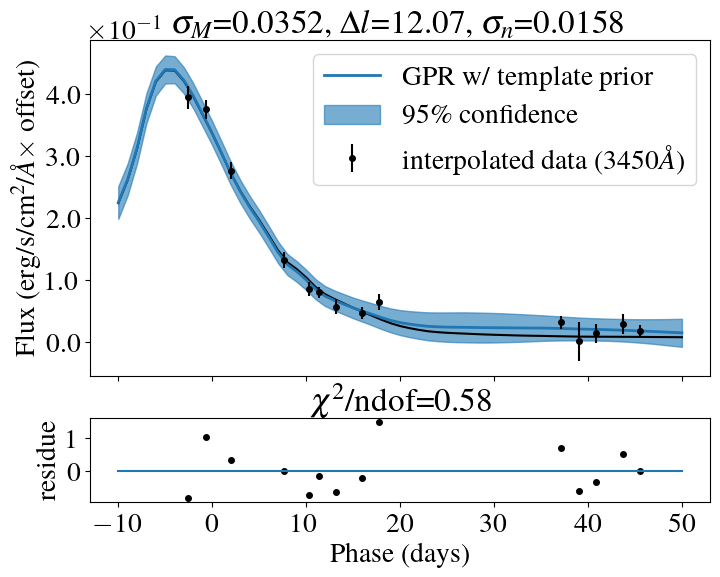

Optimization restart 1/10, f = -25.431002687798145
Optimization restart 2/10, f = -25.431002687785906
Optimization restart 3/10, f = -25.431002687797385
Optimization restart 4/10, f = -25.431002687658562
Optimization restart 5/10, f = -25.431002687608245
Optimization restart 6/10, f = -25.431002687792635
Optimization restart 7/10, f = -25.431002687769634
Optimization restart 8/10, f = -25.43100268779724
Optimization restart 9/10, f = -25.431002685031267
Optimization restart 10/10, f = -25.43100268779812


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.001421965572409473,+ve,"N(0.0014, 0.00014)"
sum.Mat52.lengthscale,11.506996163121824,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00028586435202891214,+ve,"N(0.00028, 2.8e-05)"


Optimization restart 1/10, f = -24.29457575460524
Optimization restart 2/10, f = -24.29457575460519
Optimization restart 3/10, f = -24.29457575459854
Optimization restart 4/10, f = -24.29457575459164
Optimization restart 5/10, f = -24.294575754604764
Optimization restart 6/10, f = -24.294575754599755
Optimization restart 7/10, f = -24.294575754605116
Optimization restart 8/10, f = -24.294575754513446
Optimization restart 9/10, f = -24.29457575460496
Optimization restart 10/10, f = -24.294575754605027


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0014286235725511373,+ve,"N(0.0014, 0.00014)"
sum.Mat52.lengthscale,11.853473562892155,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.000287929710807549,+ve,"N(0.00029, 2.9e-05)"


Optimization restart 1/10, f = -23.610227868155945
Optimization restart 2/10, f = -23.610227866969208
Optimization restart 3/10, f = -23.610227868165488
Optimization restart 4/10, f = -23.610227868160507
Optimization restart 5/10, f = -23.61022786814864
Optimization restart 6/10, f = -23.610227868120354
Optimization restart 7/10, f = -23.610227868135276
Optimization restart 8/10, f = -23.61022786816551
Optimization restart 9/10, f = -23.610227868166742
Optimization restart 10/10, f = -23.61022786156643


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0012264926230053535,+ve,"N(0.0012, 0.00012)"
sum.Mat52.lengthscale,11.82693716614548,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00024647212194937564,+ve,"N(0.00024, 2.4e-05)"


Optimization restart 1/10, f = -23.106332720028888
Optimization restart 2/10, f = -23.10633272003037
Optimization restart 3/10, f = -23.10633271891988
Optimization restart 4/10, f = -23.106332720026174
Optimization restart 5/10, f = -23.10633271997571
Optimization restart 6/10, f = -23.106332704702016
Optimization restart 7/10, f = -23.106332720030398
Optimization restart 8/10, f = -23.10633272003056
Optimization restart 9/10, f = -23.106332719814716
Optimization restart 10/10, f = -23.10633272003046


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.001386400647940009,+ve,"N(0.0014, 0.00014)"
sum.Mat52.lengthscale,11.817197990711861,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00027837896958996785,+ve,"N(0.00028, 2.8e-05)"


Optimization restart 1/10, f = -20.432057943656474
Optimization restart 2/10, f = -20.432057941391154
Optimization restart 3/10, f = -20.43205794064723
Optimization restart 4/10, f = -20.432057943661132
Optimization restart 5/10, f = -20.432057943660205
Optimization restart 6/10, f = -20.432057943660446
Optimization restart 7/10, f = -20.432057943660993
Optimization restart 8/10, f = -20.43205794366144
Optimization restart 9/10, f = -20.432057943645596
Optimization restart 10/10, f = -20.43205794365258


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0023577087280229267,+ve,"N(0.0024, 0.00024)"
sum.Mat52.lengthscale,12.08747144810712,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0004785187343362643,+ve,"N(0.00047, 4.7e-05)"


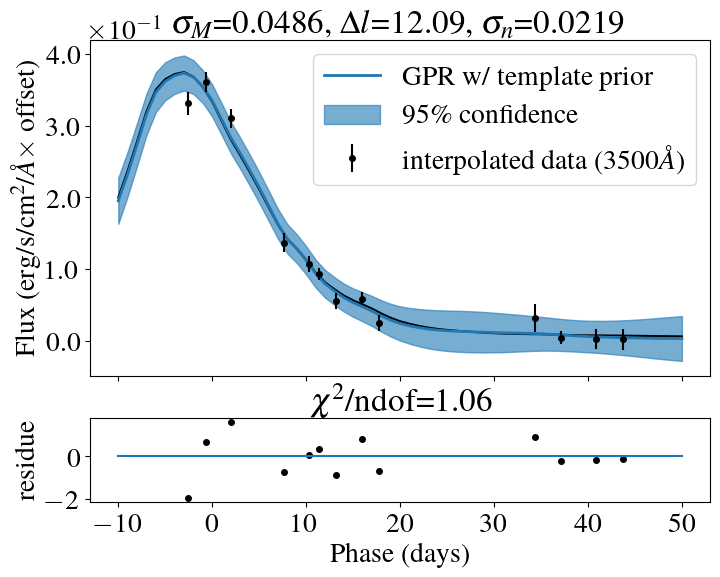

Optimization restart 1/10, f = -19.189393102312636
Optimization restart 2/10, f = -19.189393114046236
Optimization restart 3/10, f = -19.1893931140608
Optimization restart 4/10, f = -19.189393113988146
Optimization restart 5/10, f = -19.189393114063513
Optimization restart 6/10, f = -19.18939311300791
Optimization restart 7/10, f = -19.189393114063556
Optimization restart 8/10, f = -19.18939311406044
Optimization restart 9/10, f = -19.189393110273446
Optimization restart 10/10, f = -19.18939290848259


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.00299713321962928,+ve,"N(0.003, 0.0003)"
sum.Mat52.lengthscale,12.280392785356604,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.000615635053489727,+ve,"N(0.0006, 6e-05)"


Optimization restart 1/10, f = -18.94417458852034
Optimization restart 2/10, f = -18.944174590008707
Optimization restart 3/10, f = -18.94417458972225
Optimization restart 4/10, f = -18.944174589776985
Optimization restart 5/10, f = -18.944174590130736
Optimization restart 6/10, f = -18.94417459012977
Optimization restart 7/10, f = -18.944174590130736
Optimization restart 8/10, f = -18.94417455893392
Optimization restart 9/10, f = -18.94417458494676
Optimization restart 10/10, f = -18.94417459013053


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0017459315548936753,+ve,"N(0.0017, 0.00017)"
sum.Mat52.lengthscale,12.21839891222154,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00035317104559818663,+ve,"N(0.00035, 3.5e-05)"


Optimization restart 1/10, f = -24.19086179669199
Optimization restart 2/10, f = -24.190861796693206
Optimization restart 3/10, f = -24.190861796693202
Optimization restart 4/10, f = -24.19086179663681
Optimization restart 5/10, f = -24.190861796693063
Optimization restart 6/10, f = -24.190861796638472
Optimization restart 7/10, f = -24.190861796693135
Optimization restart 8/10, f = -24.190861796693227
Optimization restart 9/10, f = -24.190861796693238
Optimization restart 10/10, f = -24.190861796693213


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0010455903655553374,+ve,"N(0.001, 0.0001)"
sum.Mat52.lengthscale,12.155453943652324,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0002101135619100248,+ve,"N(0.00021, 2.1e-05)"


Optimization restart 1/10, f = -25.999841277948796
Optimization restart 2/10, f = -25.99984127794072
Optimization restart 3/10, f = -25.999841277947706
Optimization restart 4/10, f = -25.999841277948725
Optimization restart 5/10, f = -25.99984127794877
Optimization restart 6/10, f = -25.99984127794728
Optimization restart 7/10, f = -25.999841262411387
Optimization restart 8/10, f = -25.999841277944792
Optimization restart 9/10, f = -25.99984127793808
Optimization restart 10/10, f = -25.99984127794508


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0010899437770967287,+ve,"N(0.0011, 0.00011)"
sum.Mat52.lengthscale,11.93816127689996,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00021931402589595391,+ve,"N(0.00022, 2.2e-05)"


Optimization restart 1/10, f = -22.169118279422452
Optimization restart 2/10, f = -22.169118279426925
Optimization restart 3/10, f = -22.1691182794266
Optimization restart 4/10, f = -22.16911827942699
Optimization restart 5/10, f = -22.169118279424236
Optimization restart 6/10, f = -22.169118279426872
Optimization restart 7/10, f = -22.169118279416796
Optimization restart 8/10, f = -22.169118279427032
Optimization restart 9/10, f = -22.169118278146804
Optimization restart 10/10, f = -22.16911827939


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0015015613693971077,+ve,"N(0.0015, 0.00015)"
sum.Mat52.lengthscale,12.070770691442721,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0003031607053219197,+ve,"N(0.0003, 3e-05)"


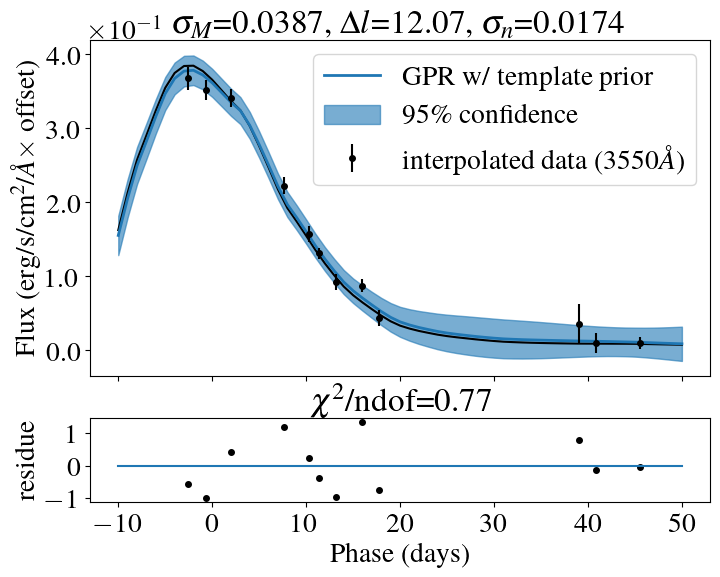

Optimization restart 1/10, f = -26.825226668518845
Optimization restart 2/10, f = -26.825226668517473
Optimization restart 3/10, f = -26.825226668517963
Optimization restart 4/10, f = -26.825226668519072
Optimization restart 5/10, f = -26.825226668518532
Optimization restart 6/10, f = -26.825226668515434
Optimization restart 7/10, f = -26.825226668504772
Optimization restart 8/10, f = -26.825226668447527
Optimization restart 9/10, f = -26.825226668492576
Optimization restart 10/10, f = -26.82522666850327


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0016581455840105153,+ve,"N(0.0017, 0.00017)"
sum.Mat52.lengthscale,12.37771233815814,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00033478259722624865,+ve,"N(0.00033, 3.3e-05)"


Optimization restart 1/10, f = -28.95632699204079
Optimization restart 2/10, f = -28.956326991396637
Optimization restart 3/10, f = -28.956326991798893
Optimization restart 4/10, f = -28.9563269920409
Optimization restart 5/10, f = -28.956326992040747
Optimization restart 6/10, f = -28.956326992023016
Optimization restart 7/10, f = -28.95632699204105
Optimization restart 8/10, f = -28.95632699203241
Optimization restart 9/10, f = -28.95632699167814
Optimization restart 10/10, f = -28.95632699204091


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0011610536626778395,+ve,"N(0.0012, 0.00012)"
sum.Mat52.lengthscale,12.268838918074424,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00023380027271221066,+ve,"N(0.00023, 2.3e-05)"


Optimization restart 1/10, f = -24.764201141416343
Optimization restart 2/10, f = -24.76420114140696
Optimization restart 3/10, f = -24.764201141390096
Optimization restart 4/10, f = -24.764201141416187
Optimization restart 5/10, f = -24.764201141296304
Optimization restart 6/10, f = -24.764201141407227
Optimization restart 7/10, f = -24.764201141349165
Optimization restart 8/10, f = -24.76420114122403
Optimization restart 9/10, f = -24.76420113983333
Optimization restart 10/10, f = -24.76420114058157


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.000837897413345352,+ve,"N(0.00084, 8.4e-05)"
sum.Mat52.lengthscale,12.068442192868773,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0001687577544958905,+ve,"N(0.00017, 1.7e-05)"


Optimization restart 1/10, f = -28.794584655016095
Optimization restart 2/10, f = -28.79458465501701
Optimization restart 3/10, f = -28.794584654986895
Optimization restart 4/10, f = -28.79458465309279
Optimization restart 5/10, f = -28.794584655017257
Optimization restart 6/10, f = -28.794584655015854
Optimization restart 7/10, f = -28.794584653227957
Optimization restart 8/10, f = -28.794584655016678
Optimization restart 9/10, f = -28.79458465486917
Optimization restart 10/10, f = -28.794584655012965


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0006691893942041452,+ve,"N(0.00067, 6.7e-05)"
sum.Mat52.lengthscale,12.100303515472275,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00013458469204165473,+ve,"N(0.00013, 1.3e-05)"


Optimization restart 1/10, f = -29.097296837678286
Optimization restart 2/10, f = -29.097296837673785
Optimization restart 3/10, f = -29.097296837630694
Optimization restart 4/10, f = -29.097296837338348
Optimization restart 5/10, f = -29.09729683769351
Optimization restart 6/10, f = -29.09729683768292
Optimization restart 7/10, f = -29.097296837692063
Optimization restart 8/10, f = -29.09729683768713
Optimization restart 9/10, f = -29.097296837692205
Optimization restart 10/10, f = -29.097296837691808


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0012399503122443225,+ve,"N(0.0012, 0.00012)"
sum.Mat52.lengthscale,11.870644157857006,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0002494767366765708,+ve,"N(0.00025, 2.5e-05)"


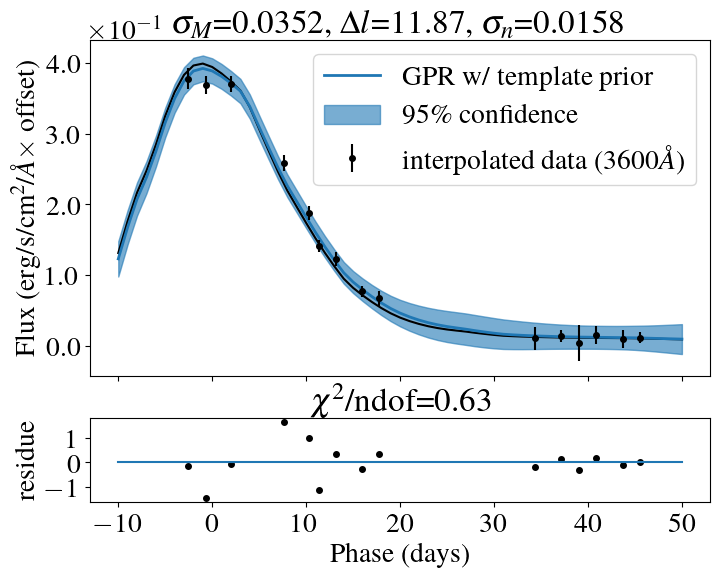

Optimization restart 1/10, f = -28.993266797521798
Optimization restart 2/10, f = -28.99326679752202
Optimization restart 3/10, f = -28.9932667975209
Optimization restart 4/10, f = -28.993266797522036
Optimization restart 5/10, f = -28.993266797517254
Optimization restart 6/10, f = -28.9932667972938
Optimization restart 7/10, f = -28.993266797522
Optimization restart 8/10, f = -28.993266797522057
Optimization restart 9/10, f = -28.99326679752133
Optimization restart 10/10, f = -28.993266797489945


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0010744081228232824,+ve,"N(0.0011, 0.00011)"
sum.Mat52.lengthscale,11.935190046676324,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00021722340435725244,+ve,"N(0.00022, 2.2e-05)"


Optimization restart 1/10, f = -28.33117779239678
Optimization restart 2/10, f = -28.331177791846173
Optimization restart 3/10, f = -28.33117779239267
Optimization restart 4/10, f = -28.33117779239862
Optimization restart 5/10, f = -28.331177792222793
Optimization restart 6/10, f = -28.33117779110595
Optimization restart 7/10, f = -28.331177788726457
Optimization restart 8/10, f = -28.33117779239752
Optimization restart 9/10, f = -28.331177792397284
Optimization restart 10/10, f = -28.331177792397867


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0008456090441420306,+ve,"N(0.00085, 8.5e-05)"
sum.Mat52.lengthscale,12.040376688646727,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00017086411344317747,+ve,"N(0.00017, 1.7e-05)"


Optimization restart 1/10, f = -29.63701670334012
Optimization restart 2/10, f = -29.63701670334451
Optimization restart 3/10, f = -29.637016703341097
Optimization restart 4/10, f = -29.637016703310888
Optimization restart 5/10, f = -29.637016670005117
Optimization restart 6/10, f = -29.637016703344862
Optimization restart 7/10, f = -29.63701670330194
Optimization restart 8/10, f = -29.637016703344884
Optimization restart 9/10, f = -29.637016703340056
Optimization restart 10/10, f = -29.637016703303388


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0008651259932604015,+ve,"N(0.00087, 8.7e-05)"
sum.Mat52.lengthscale,12.312414810636476,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00017560551024354401,+ve,"N(0.00017, 1.7e-05)"


Optimization restart 1/10, f = -27.185567421754243
Optimization restart 2/10, f = -27.18556742177091
Optimization restart 3/10, f = -27.185567422037533
Optimization restart 4/10, f = -27.185567422039675
Optimization restart 5/10, f = -27.185567422013673
Optimization restart 6/10, f = -27.185567422014284
Optimization restart 7/10, f = -27.185567403844317
Optimization restart 8/10, f = -27.185567420054227
Optimization restart 9/10, f = -27.185567421998527
Optimization restart 10/10, f = -27.185567422038922


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0017791916309099934,+ve,"N(0.0018, 0.00018)"
sum.Mat52.lengthscale,12.336626481545064,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0003602383215464979,+ve,"N(0.00036, 3.6e-05)"


Optimization restart 1/10, f = -26.447377945336477
Optimization restart 2/10, f = -26.447377945328654
Optimization restart 3/10, f = -26.447377945318415
Optimization restart 4/10, f = -26.447377945336495
Optimization restart 5/10, f = -26.44737794533654
Optimization restart 6/10, f = -26.447377938806085
Optimization restart 7/10, f = -26.44737794533628
Optimization restart 8/10, f = -26.4473779453355
Optimization restart 9/10, f = -26.44737794495296
Optimization restart 10/10, f = -26.447377945323826


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0015196807106493105,+ve,"N(0.0015, 0.00015)"
sum.Mat52.lengthscale,12.308734991887365,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00030571218966905567,+ve,"N(0.0003, 3e-05)"


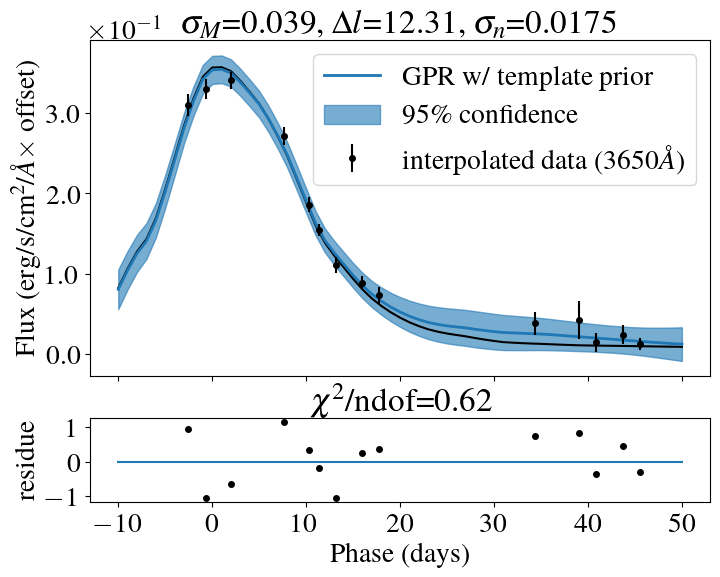

Optimization restart 1/10, f = -26.492435151397974
Optimization restart 2/10, f = -26.492435154347923
Optimization restart 3/10, f = -26.49243514268906
Optimization restart 4/10, f = -26.49243515436327
Optimization restart 5/10, f = -26.492435154363335
Optimization restart 6/10, f = -26.492435153815144
Optimization restart 7/10, f = -26.492435149616014
Optimization restart 8/10, f = -26.492435154363243
Optimization restart 9/10, f = -26.492435154362905
Optimization restart 10/10, f = -26.49243515436316


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.001687356789774844,+ve,"N(0.0017, 0.00017)"
sum.Mat52.lengthscale,11.941070725464275,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0003396365110882019,+ve,"N(0.00034, 3.4e-05)"


Optimization restart 1/10, f = -21.31327135867426
Optimization restart 2/10, f = -21.31327135615689
Optimization restart 3/10, f = -21.31327135873162
Optimization restart 4/10, f = -21.313271358744444
Optimization restart 5/10, f = -21.31327135690521
Optimization restart 6/10, f = -21.313271358760215
Optimization restart 7/10, f = -21.31327135876138
Optimization restart 8/10, f = -21.3132713587624
Optimization restart 9/10, f = -21.313271358762034
Optimization restart 10/10, f = -21.31327135876242


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0033257072414118387,+ve,"N(0.0033, 0.00033)"
sum.Mat52.lengthscale,11.36459798185229,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0006712415239758772,+ve,"N(0.00066, 6.6e-05)"


Optimization restart 1/10, f = -18.669488489435803
Optimization restart 2/10, f = -18.669488489456512
Optimization restart 3/10, f = -18.66948848945715
Optimization restart 4/10, f = -18.669488489306513
Optimization restart 5/10, f = -18.66948848844799
Optimization restart 6/10, f = -18.669488489439445
Optimization restart 7/10, f = -18.669488489453293
Optimization restart 8/10, f = -18.669488489455794
Optimization restart 9/10, f = -18.669488489454523
Optimization restart 10/10, f = -18.669488489457162


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0041530043021312975,+ve,"N(0.0041, 0.00041)"
sum.Mat52.lengthscale,10.629952943115105,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0008317449664751769,+ve,"N(0.00082, 8.2e-05)"


Optimization restart 1/10, f = -17.91115700123476
Optimization restart 2/10, f = -17.911157002616626
Optimization restart 3/10, f = -17.91115700261754
Optimization restart 4/10, f = -17.911157002616612
Optimization restart 5/10, f = -17.911157002606185
Optimization restart 6/10, f = -17.911157002565858
Optimization restart 7/10, f = -17.911157002616903
Optimization restart 8/10, f = -17.91115700260388
Optimization restart 9/10, f = -17.911157002614743
Optimization restart 10/10, f = -17.911157002517008


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005118944607158026,+ve,"N(0.0051, 0.00051)"
sum.Mat52.lengthscale,10.395330493171615,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001028780908555644,+ve,"N(0.001, 0.0001)"


Optimization restart 1/10, f = -17.932164009279433
Optimization restart 2/10, f = -17.9321640067545
Optimization restart 3/10, f = -17.93216400928584
Optimization restart 4/10, f = -17.932164009264362
Optimization restart 5/10, f = -17.93216400918775
Optimization restart 6/10, f = -17.93216400906617
Optimization restart 7/10, f = -17.93216400927681
Optimization restart 8/10, f = -17.93216400928536
Optimization restart 9/10, f = -17.932164009282417
Optimization restart 10/10, f = -17.932163980530717


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004057375411506396,+ve,"N(0.004, 0.0004)"
sum.Mat52.lengthscale,11.147300029161462,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0008266591439594499,+ve,"N(0.00081, 8.1e-05)"


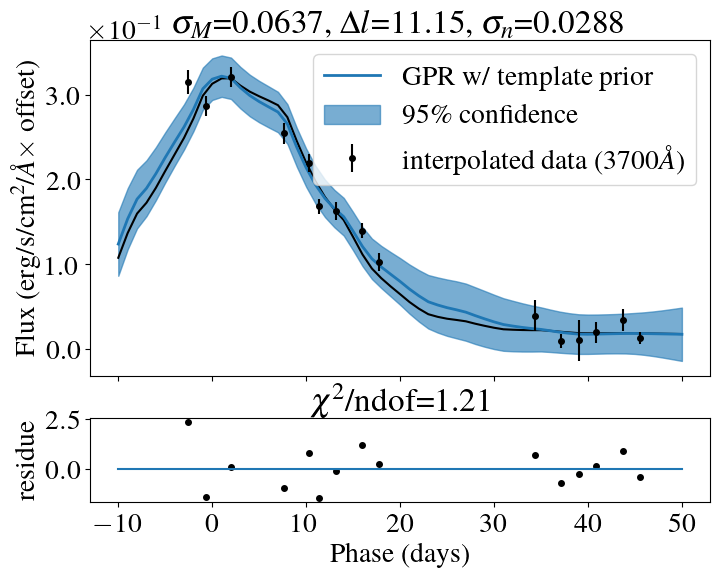

Optimization restart 1/10, f = -17.408823914293013
Optimization restart 2/10, f = -17.40882391426747
Optimization restart 3/10, f = -17.408823913690675
Optimization restart 4/10, f = -17.408823914293038
Optimization restart 5/10, f = -17.408823914291116
Optimization restart 6/10, f = -17.408823914292924
Optimization restart 7/10, f = -17.408823914292814
Optimization restart 8/10, f = -17.408823914290725
Optimization restart 9/10, f = -17.408823914059237
Optimization restart 10/10, f = -17.408823913387877


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005790843770032191,+ve,"N(0.0058, 0.00058)"
sum.Mat52.lengthscale,11.349995281163425,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0011731012192634424,+ve,"N(0.0012, 0.00012)"


Optimization restart 1/10, f = -18.94882966836343
Optimization restart 2/10, f = -18.94882966805276
Optimization restart 3/10, f = -18.948829668381727
Optimization restart 4/10, f = -18.948829665343084
Optimization restart 5/10, f = -18.948829668381762
Optimization restart 6/10, f = -18.948829668357277
Optimization restart 7/10, f = -18.948829658227616
Optimization restart 8/10, f = -18.948829668204276
Optimization restart 9/10, f = -18.94882966838172
Optimization restart 10/10, f = -18.94882966838167


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005667278529564187,+ve,"N(0.0056, 0.00056)"
sum.Mat52.lengthscale,11.064780335116085,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0011345930797211602,+ve,"N(0.0011, 0.00011)"


Optimization restart 1/10, f = -21.23478795770808
Optimization restart 2/10, f = -21.234787957707717
Optimization restart 3/10, f = -21.234787947541342
Optimization restart 4/10, f = -21.234787957707994
Optimization restart 5/10, f = -21.234787957708026
Optimization restart 6/10, f = -21.234787957708054
Optimization restart 7/10, f = -21.234787957708065
Optimization restart 8/10, f = -21.23478795643986
Optimization restart 9/10, f = -21.234787957705134
Optimization restart 10/10, f = -21.234787957698302


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003910327223111392,+ve,"N(0.0038, 0.00038)"
sum.Mat52.lengthscale,10.050550523520014,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0007736148026605028,+ve,"N(0.00077, 7.7e-05)"


Optimization restart 1/10, f = -18.141953557327305
Optimization restart 2/10, f = -18.141953557323994
Optimization restart 3/10, f = -18.141953557328588
Optimization restart 4/10, f = -18.141953557328844
Optimization restart 5/10, f = -18.141953557328744
Optimization restart 6/10, f = -18.14195355732857
Optimization restart 7/10, f = -18.141953557325987
Optimization restart 8/10, f = -18.14195355718661
Optimization restart 9/10, f = -18.14195355028092
Optimization restart 10/10, f = -18.141953506337664


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004843112085488016,+ve,"N(0.0047, 0.00047)"
sum.Mat52.lengthscale,9.852729358098301,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0009604893892976218,+ve,"N(0.00095, 9.5e-05)"


Optimization restart 1/10, f = -21.727076798473064
Optimization restart 2/10, f = -21.727076798473195
Optimization restart 3/10, f = -21.72707679781616
Optimization restart 4/10, f = -21.727076798464026
Optimization restart 5/10, f = -21.72707679847318
Optimization restart 6/10, f = -21.727076798269895
Optimization restart 7/10, f = -21.727076789636868
Optimization restart 8/10, f = -21.727076797786623
Optimization restart 9/10, f = -21.727076798464545
Optimization restart 10/10, f = -21.72707679846608


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0032040599931958506,+ve,"N(0.0032, 0.00032)"
sum.Mat52.lengthscale,10.04163073898426,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0006398573777097815,+ve,"N(0.00063, 6.3e-05)"


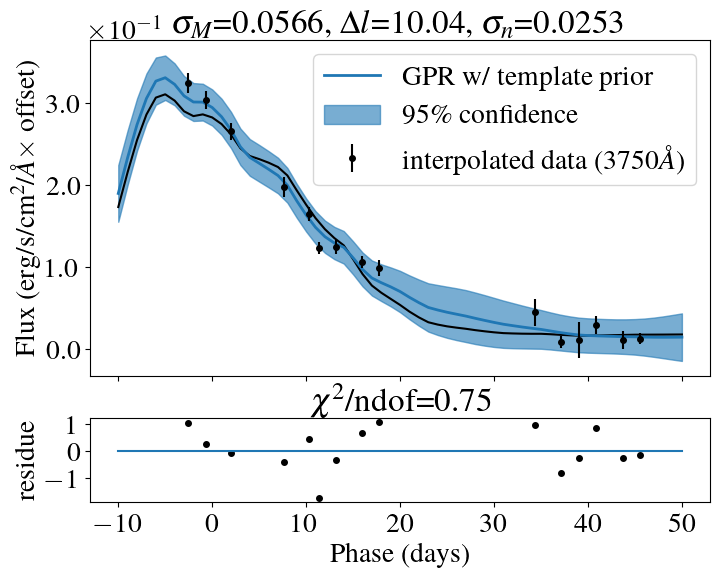

Optimization restart 1/10, f = -21.73781825494674
Optimization restart 2/10, f = -21.73781825501244
Optimization restart 3/10, f = -21.737818254896457
Optimization restart 4/10, f = -21.737818252246843
Optimization restart 5/10, f = -21.737818254998466
Optimization restart 6/10, f = -21.737818255010048
Optimization restart 7/10, f = -21.73781825501183
Optimization restart 8/10, f = -21.737818255009497
Optimization restart 9/10, f = -21.737818255012478
Optimization restart 10/10, f = -21.737818254858055


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0033652895077746553,+ve,"N(0.0033, 0.00033)"
sum.Mat52.lengthscale,10.231633399611416,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0006682902467693187,+ve,"N(0.00066, 6.6e-05)"


Optimization restart 1/10, f = -23.058457488442535
Optimization restart 2/10, f = -23.05845748844254
Optimization restart 3/10, f = -23.058457488442475
Optimization restart 4/10, f = -23.058457488314545
Optimization restart 5/10, f = -23.058457488387948
Optimization restart 6/10, f = -23.058457488440705
Optimization restart 7/10, f = -23.05845748844252
Optimization restart 8/10, f = -23.058457488441036
Optimization restart 9/10, f = -23.058457488380277
Optimization restart 10/10, f = -23.058457487815406


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.002803113762144964,+ve,"N(0.0028, 0.00028)"
sum.Mat52.lengthscale,10.299738201185955,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0005567874693227336,+ve,"N(0.00055, 5.5e-05)"


Optimization restart 1/10, f = -22.645059693556483
Optimization restart 2/10, f = -22.64505969355593
Optimization restart 3/10, f = -22.645059693554614
Optimization restart 4/10, f = -22.645059693513595
Optimization restart 5/10, f = -22.645059693554167
Optimization restart 6/10, f = -22.645059693556345
Optimization restart 7/10, f = -22.645059693526804
Optimization restart 8/10, f = -22.645059693555858
Optimization restart 9/10, f = -22.645059691664216
Optimization restart 10/10, f = -22.64505969355558


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0029094657932815134,+ve,"N(0.0029, 0.00029)"
sum.Mat52.lengthscale,10.17922527035645,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0005779885427250424,+ve,"N(0.00058, 5.8e-05)"


Optimization restart 1/10, f = -16.76687619419799
Optimization restart 2/10, f = -16.766876194218305
Optimization restart 3/10, f = -16.76687619239678
Optimization restart 4/10, f = -16.766876194218046
Optimization restart 5/10, f = -16.766876194218547
Optimization restart 6/10, f = -16.766876194218185
Optimization restart 7/10, f = -16.76687619421441
Optimization restart 8/10, f = -16.766876194144874
Optimization restart 9/10, f = -16.766876194208507
Optimization restart 10/10, f = -16.766876194207867


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004783540436986243,+ve,"N(0.0047, 0.00047)"
sum.Mat52.lengthscale,10.359600482967627,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0009542109192185115,+ve,"N(0.00095, 9.5e-05)"


Optimization restart 1/10, f = -19.882527844740295
Optimization restart 2/10, f = -19.88252784474212
Optimization restart 3/10, f = -19.882527844570276
Optimization restart 4/10, f = -19.882527844741915
Optimization restart 5/10, f = -19.882527844608717
Optimization restart 6/10, f = -19.882527844739222
Optimization restart 7/10, f = -19.882527825824873
Optimization restart 8/10, f = -19.882527844737062
Optimization restart 9/10, f = -19.882527844742185
Optimization restart 10/10, f = -19.882527844742192


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0036327344291210866,+ve,"N(0.0036, 0.00036)"
sum.Mat52.lengthscale,10.94672529029481,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0007259270280534092,+ve,"N(0.00072, 7.2e-05)"


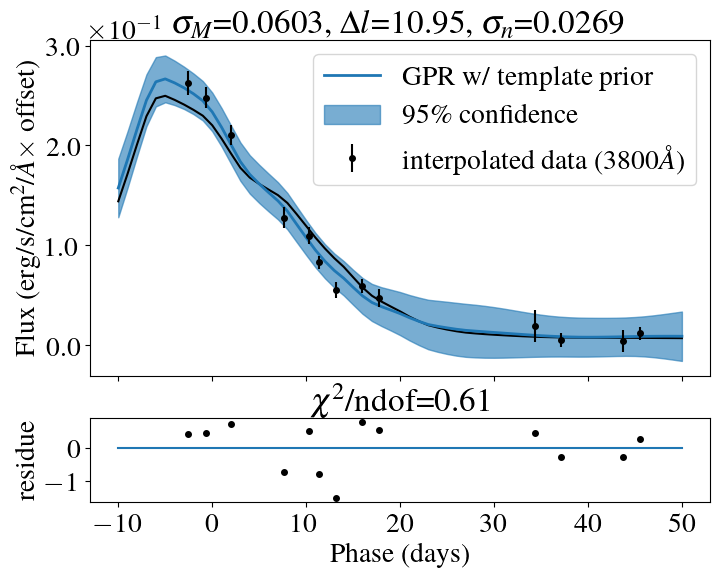

Optimization restart 1/10, f = -22.064973866160233
Optimization restart 2/10, f = -22.064973866162404
Optimization restart 3/10, f = -22.06497386354264
Optimization restart 4/10, f = -22.064973866157494
Optimization restart 5/10, f = -22.06497386615782
Optimization restart 6/10, f = -22.06497386244622
Optimization restart 7/10, f = -22.06497386588404
Optimization restart 8/10, f = -22.064973866162397
Optimization restart 9/10, f = -22.06497386577041
Optimization restart 10/10, f = -22.06497386588122


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003208447733466048,+ve,"N(0.0032, 0.00032)"
sum.Mat52.lengthscale,11.28531388513141,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0006410885441303633,+ve,"N(0.00064, 6.4e-05)"


Optimization restart 1/10, f = -25.36475087755821
Optimization restart 2/10, f = -25.36475087759711
Optimization restart 3/10, f = -25.36475087759699
Optimization restart 4/10, f = -25.3647508775971
Optimization restart 5/10, f = -25.364750877597103
Optimization restart 6/10, f = -25.36475087758646
Optimization restart 7/10, f = -25.364750876258253
Optimization restart 8/10, f = -25.364750877597103
Optimization restart 9/10, f = -25.36475087573521
Optimization restart 10/10, f = -25.364750877597082


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0018351293283820427,+ve,"N(0.0018, 0.00018)"
sum.Mat52.lengthscale,11.589584682952555,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0003688832801992661,+ve,"N(0.00037, 3.7e-05)"


Optimization restart 1/10, f = -25.911506251127804
Optimization restart 2/10, f = -25.91150625114709
Optimization restart 3/10, f = -25.911506251187973
Optimization restart 4/10, f = -25.911506251189024
Optimization restart 5/10, f = -25.911506251183503
Optimization restart 6/10, f = -25.911506241224302
Optimization restart 7/10, f = -25.911506251186296
Optimization restart 8/10, f = -25.911506251186196
Optimization restart 9/10, f = -25.91150625117691
Optimization restart 10/10, f = -25.911506251189152


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0018343587421591567,+ve,"N(0.0018, 0.00018)"
sum.Mat52.lengthscale,11.624461919216797,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0003690747043906253,+ve,"N(0.00037, 3.7e-05)"


Optimization restart 1/10, f = -17.017772530723448
Optimization restart 2/10, f = -17.017772530720553
Optimization restart 3/10, f = -17.01777253072322
Optimization restart 4/10, f = -17.017772494496967
Optimization restart 5/10, f = -17.017772530604184
Optimization restart 6/10, f = -17.0177725307234
Optimization restart 7/10, f = -17.01777253072342
Optimization restart 8/10, f = -17.01777253071982
Optimization restart 9/10, f = -17.017772530723438
Optimization restart 10/10, f = -17.01777253071989


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004743057831338695,+ve,"N(0.0047, 0.00047)"
sum.Mat52.lengthscale,11.244954721723778,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0009625043841916032,+ve,"N(0.00094, 9.4e-05)"


Optimization restart 1/10, f = -20.999364845690884
Optimization restart 2/10, f = -20.999364843872605
Optimization restart 3/10, f = -20.999364845691623
Optimization restart 4/10, f = -20.99936484569156
Optimization restart 5/10, f = -20.999364845611492
Optimization restart 6/10, f = -20.999364845679835
Optimization restart 7/10, f = -20.999364845691453
Optimization restart 8/10, f = -20.99936484566883
Optimization restart 9/10, f = -20.999364845624395
Optimization restart 10/10, f = -20.99936484524057


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003270622093413064,+ve,"N(0.0033, 0.00033)"
sum.Mat52.lengthscale,11.189095962149622,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0006624860883387696,+ve,"N(0.00065, 6.5e-05)"


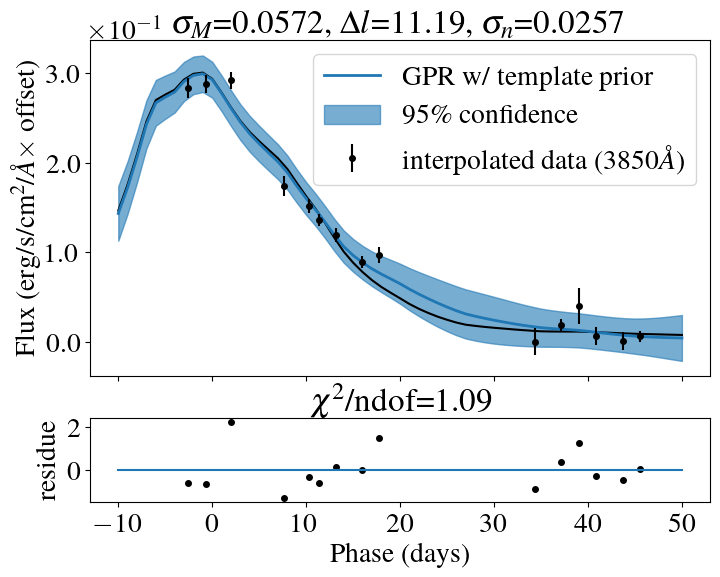

Optimization restart 1/10, f = -20.756602165508756
Optimization restart 2/10, f = -20.756602165506607
Optimization restart 3/10, f = -20.756602163758238
Optimization restart 4/10, f = -20.756602165500713
Optimization restart 5/10, f = -20.75660216290411
Optimization restart 6/10, f = -20.756602165507914
Optimization restart 7/10, f = -20.75660216550859
Optimization restart 8/10, f = -20.756602165277517
Optimization restart 9/10, f = -20.75660216550787
Optimization restart 10/10, f = -20.7566021650631


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004323885772536336,+ve,"N(0.0043, 0.00043)"
sum.Mat52.lengthscale,11.637982570074284,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0008738521107950859,+ve,"N(0.00086, 8.6e-05)"


Optimization restart 1/10, f = -20.244072188576016
Optimization restart 2/10, f = -20.244072188575885
Optimization restart 3/10, f = -20.244072188573824
Optimization restart 4/10, f = -20.244072188576062
Optimization restart 5/10, f = -20.24407218844086
Optimization restart 6/10, f = -20.244072188567955
Optimization restart 7/10, f = -20.244072188575608
Optimization restart 8/10, f = -20.244072183895575
Optimization restart 9/10, f = -20.244072188569707
Optimization restart 10/10, f = -20.244072188575952


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004454617522762732,+ve,"N(0.0044, 0.00044)"
sum.Mat52.lengthscale,11.564173911165552,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0009021973908361221,+ve,"N(0.00089, 8.9e-05)"


Optimization restart 1/10, f = -19.643293755345187
Optimization restart 2/10, f = -19.643293748613573
Optimization restart 3/10, f = -19.643293755311987
Optimization restart 4/10, f = -19.643293755343514
Optimization restart 5/10, f = -19.643293755343745
Optimization restart 6/10, f = -19.64329374739888
Optimization restart 7/10, f = -19.643293755345137
Optimization restart 8/10, f = -19.64329375534318
Optimization restart 9/10, f = -19.64329375534322
Optimization restart 10/10, f = -19.6432937546165


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003695883429547315,+ve,"N(0.0037, 0.00037)"
sum.Mat52.lengthscale,11.054292468900618,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0007550598860676875,+ve,"N(0.00073, 7.3e-05)"


Optimization restart 1/10, f = -15.629597233609754
Optimization restart 2/10, f = -15.629597233605676
Optimization restart 3/10, f = -15.629597233609493
Optimization restart 4/10, f = -15.629597233609527
Optimization restart 5/10, f = -15.629597233609747
Optimization restart 6/10, f = -15.629597233609747
Optimization restart 7/10, f = -15.629597233608568
Optimization restart 8/10, f = -15.629597233609754
Optimization restart 9/10, f = -15.629597233594442
Optimization restart 10/10, f = -15.629597232075918


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004214321882498773,+ve,"N(0.0042, 0.00042)"
sum.Mat52.lengthscale,11.767087333972725,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0008525305898019667,+ve,"N(0.00084, 8.4e-05)"


Optimization restart 1/10, f = -24.54647342025007
Optimization restart 2/10, f = -24.546473410620912
Optimization restart 3/10, f = -24.546473419909447
Optimization restart 4/10, f = -24.54647342024936
Optimization restart 5/10, f = -24.546473420238375
Optimization restart 6/10, f = -24.54647342011917
Optimization restart 7/10, f = -24.546473420110956
Optimization restart 8/10, f = -24.54647342025005
Optimization restart 9/10, f = -24.54647342025008
Optimization restart 10/10, f = -24.546473420249438


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.002398700746226291,+ve,"N(0.0024, 0.00024)"
sum.Mat52.lengthscale,11.86232742450261,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00048141496668183066,+ve,"N(0.00048, 4.8e-05)"


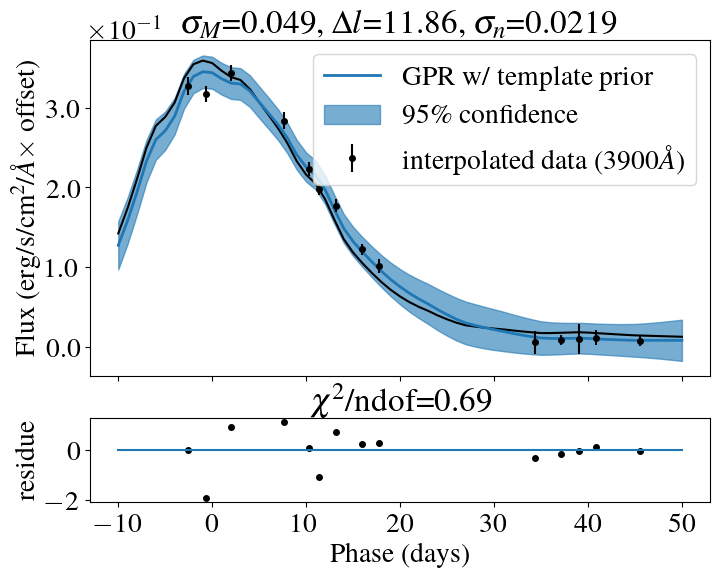

Optimization restart 1/10, f = -24.805789533272872
Optimization restart 2/10, f = -24.805789527042492
Optimization restart 3/10, f = -24.805789533081192
Optimization restart 4/10, f = -24.805789532744974
Optimization restart 5/10, f = -24.80578953243124
Optimization restart 6/10, f = -24.805789533259627
Optimization restart 7/10, f = -24.805789533269355
Optimization restart 8/10, f = -24.80578953305932
Optimization restart 9/10, f = -24.805789533251012
Optimization restart 10/10, f = -24.805789533233103


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0019052843912678596,+ve,"N(0.0019, 0.00019)"
sum.Mat52.lengthscale,12.049343928157514,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0003850434180825086,+ve,"N(0.00038, 3.8e-05)"


Optimization restart 1/10, f = -24.506590892181556
Optimization restart 2/10, f = -24.506590892120357
Optimization restart 3/10, f = -24.50659089218575
Optimization restart 4/10, f = -24.506590892187127
Optimization restart 5/10, f = -24.50659089218709
Optimization restart 6/10, f = -24.50659089218715
Optimization restart 7/10, f = -24.506590892186132
Optimization restart 8/10, f = -24.50659089218717
Optimization restart 9/10, f = -24.50659089168758
Optimization restart 10/10, f = -24.50659089217502


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0020547469521279803,+ve,"N(0.002, 0.0002)"
sum.Mat52.lengthscale,11.778100118082385,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0004196513267546161,+ve,"N(0.00041, 4.1e-05)"


Optimization restart 1/10, f = -26.424901575453735
Optimization restart 2/10, f = -26.424901575432052
Optimization restart 3/10, f = -26.424901574541707
Optimization restart 4/10, f = -26.424901575433886
Optimization restart 5/10, f = -26.424901575452566
Optimization restart 6/10, f = -26.42490157507108
Optimization restart 7/10, f = -26.42490157301267
Optimization restart 8/10, f = -26.42490157538507
Optimization restart 9/10, f = -26.424901575452417
Optimization restart 10/10, f = -26.42490157544503


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0013049435138820684,+ve,"N(0.0013, 0.00013)"
sum.Mat52.lengthscale,10.364978905129934,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00026394516251644645,+ve,"N(0.00026, 2.6e-05)"


Optimization restart 1/10, f = -23.871044155400668
Optimization restart 2/10, f = -23.871044155392514
Optimization restart 3/10, f = -23.871044155400263
Optimization restart 4/10, f = -23.87104415409246
Optimization restart 5/10, f = -23.871044151246057
Optimization restart 6/10, f = -23.871044155392536
Optimization restart 7/10, f = -23.871044155400398
Optimization restart 8/10, f = -23.871044155335664
Optimization restart 9/10, f = -23.871044155367763
Optimization restart 10/10, f = -23.871044155392745


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0015781620244710373,+ve,"N(0.0016, 0.00016)"
sum.Mat52.lengthscale,9.54270651717501,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0003202032402688208,+ve,"N(0.00031, 3.1e-05)"


Optimization restart 1/10, f = -23.11620286263711
Optimization restart 2/10, f = -23.116202862637124
Optimization restart 3/10, f = -23.116202862566276
Optimization restart 4/10, f = -23.116202862636356
Optimization restart 5/10, f = -23.116202862462817
Optimization restart 6/10, f = -23.116202862636992
Optimization restart 7/10, f = -23.116202862635753
Optimization restart 8/10, f = -23.116202862625403
Optimization restart 9/10, f = -23.116202862303474
Optimization restart 10/10, f = -23.116202862631916


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0014556093878231133,+ve,"N(0.0014, 0.00014)"
sum.Mat52.lengthscale,9.813356516011178,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00029886684310169746,+ve,"N(0.00029, 2.9e-05)"


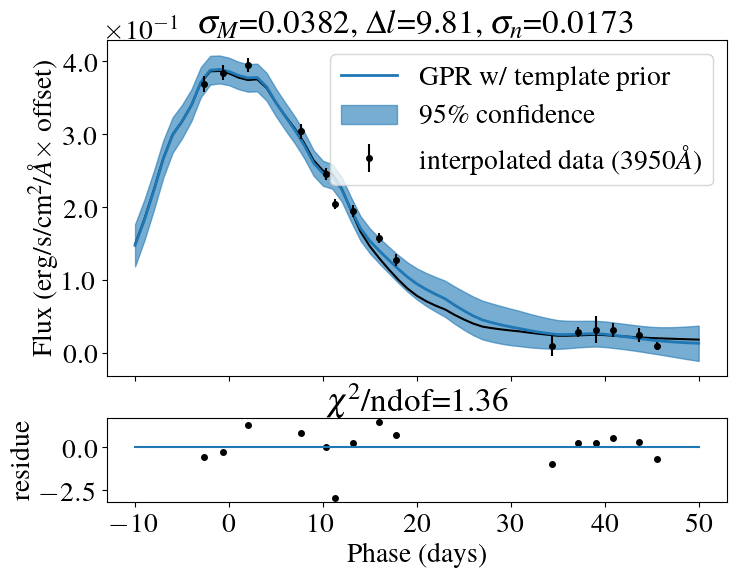

Optimization restart 1/10, f = -23.71113249844266
Optimization restart 2/10, f = -23.711132498444393
Optimization restart 3/10, f = -23.711132496600303
Optimization restart 4/10, f = -23.71113241517441
Optimization restart 5/10, f = -23.71113249844246
Optimization restart 6/10, f = -23.71113249457791
Optimization restart 7/10, f = -23.711132498415566
Optimization restart 8/10, f = -23.71113249843099
Optimization restart 9/10, f = -23.71113249839148
Optimization restart 10/10, f = -23.711132498443675


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0013254555022017426,+ve,"N(0.0013, 0.00013)"
sum.Mat52.lengthscale,10.41920862679094,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0002729354924549776,+ve,"N(0.00026, 2.6e-05)"


Optimization restart 1/10, f = -27.595018614800107
Optimization restart 2/10, f = -27.595018614803305
Optimization restart 3/10, f = -27.595018614802573
Optimization restart 4/10, f = -27.595018614803365
Optimization restart 5/10, f = -27.595018614803422
Optimization restart 6/10, f = -27.595018614803095
Optimization restart 7/10, f = -27.595018614801127
Optimization restart 8/10, f = -27.59501861477701
Optimization restart 9/10, f = -27.595018614803273
Optimization restart 10/10, f = -27.595018614803422


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0011498430101051808,+ve,"N(0.0011, 0.00011)"
sum.Mat52.lengthscale,10.367362220681871,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00023108716331200486,+ve,"N(0.00023, 2.3e-05)"


Optimization restart 1/10, f = -22.716151693766083
Optimization restart 2/10, f = -22.71615169374017
Optimization restart 3/10, f = -22.7161516937606
Optimization restart 4/10, f = -22.716151693415014
Optimization restart 5/10, f = -22.716151693765966
Optimization restart 6/10, f = -22.71615169376433
Optimization restart 7/10, f = -22.716151693199023
Optimization restart 8/10, f = -22.71615169376414
Optimization restart 9/10, f = -22.716151693741224
Optimization restart 10/10, f = -22.716151693764452


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0017649834672009914,+ve,"N(0.0017, 0.00017)"
sum.Mat52.lengthscale,9.444749909619325,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00036024292919914627,+ve,"N(0.00035, 3.5e-05)"


Optimization restart 1/10, f = -26.46307816238624
Optimization restart 2/10, f = -26.46307816428206
Optimization restart 3/10, f = -26.463078164282834
Optimization restart 4/10, f = -26.46307816428279
Optimization restart 5/10, f = -26.463078142512966
Optimization restart 6/10, f = -26.463078164279082
Optimization restart 7/10, f = -26.4630781638144
Optimization restart 8/10, f = -26.463078131187334
Optimization restart 9/10, f = -26.4630781642799
Optimization restart 10/10, f = -26.46307816428269


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.001204701946084403,+ve,"N(0.0012, 0.00012)"
sum.Mat52.lengthscale,10.516834506137615,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0002445162066064313,+ve,"N(0.00024, 2.4e-05)"


Optimization restart 1/10, f = -25.950561917607263
Optimization restart 2/10, f = -25.950561917405874
Optimization restart 3/10, f = -25.950561917607452
Optimization restart 4/10, f = -25.95056191758627
Optimization restart 5/10, f = -25.950561917606063
Optimization restart 6/10, f = -25.950561917601593
Optimization restart 7/10, f = -25.95056191753713
Optimization restart 8/10, f = -25.950561917509546
Optimization restart 9/10, f = -25.950561917585794
Optimization restart 10/10, f = -25.950561917592914


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0013478710555823584,+ve,"N(0.0013, 0.00013)"
sum.Mat52.lengthscale,10.803707572105399,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00027338566773824714,+ve,"N(0.00027, 2.7e-05)"


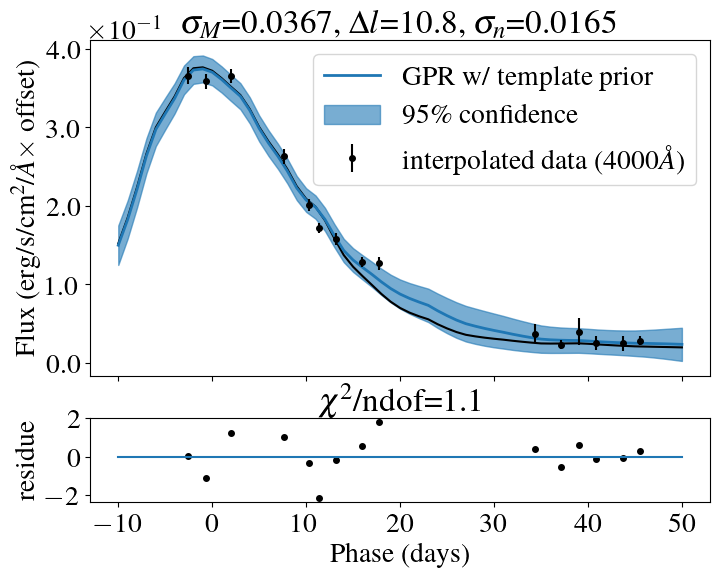

Optimization restart 1/10, f = -22.27433949828834
Optimization restart 2/10, f = -22.274339498319918
Optimization restart 3/10, f = -22.274339498326896
Optimization restart 4/10, f = -22.274339498314788
Optimization restart 5/10, f = -22.274339498327393
Optimization restart 6/10, f = -22.27433949832662
Optimization restart 7/10, f = -22.27433949828852
Optimization restart 8/10, f = -22.274339498327123
Optimization restart 9/10, f = -22.274339498327336
Optimization restart 10/10, f = -22.27433949819956


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0019015079978003404,+ve,"N(0.0019, 0.00019)"
sum.Mat52.lengthscale,10.449661668437415,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00038926245404725875,+ve,"N(0.00038, 3.8e-05)"


Optimization restart 1/10, f = -27.93004933391681
Optimization restart 2/10, f = -27.930049333911377
Optimization restart 3/10, f = -27.930049333913047
Optimization restart 4/10, f = -27.930049333919712
Optimization restart 5/10, f = -27.93004933237632
Optimization restart 6/10, f = -27.930049333916774
Optimization restart 7/10, f = -27.930049332870947
Optimization restart 8/10, f = -27.930049332033814
Optimization restart 9/10, f = -27.930049333920202
Optimization restart 10/10, f = -27.930049333389967


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0011577638957115809,+ve,"N(0.0011, 0.00011)"
sum.Mat52.lengthscale,11.3349640421423,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0002339314492102301,+ve,"N(0.00023, 2.3e-05)"


Optimization restart 1/10, f = -28.284188658247448
Optimization restart 2/10, f = -28.284188658251484
Optimization restart 3/10, f = -28.284188658251452
Optimization restart 4/10, f = -28.28418865738446
Optimization restart 5/10, f = -28.28418865818552
Optimization restart 6/10, f = -28.284188658250336
Optimization restart 7/10, f = -28.28418865356435
Optimization restart 8/10, f = -28.28418865822792
Optimization restart 9/10, f = -28.28418864851189
Optimization restart 10/10, f = -28.28418865036451


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0009253122851085203,+ve,"N(0.00092, 9.2e-05)"
sum.Mat52.lengthscale,11.893327846485713,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00018730157702476024,+ve,"N(0.00018, 1.8e-05)"


Optimization restart 1/10, f = -27.732697920656022
Optimization restart 2/10, f = -27.73269792065593
Optimization restart 3/10, f = -27.73269791787088
Optimization restart 4/10, f = -27.732697920623604
Optimization restart 5/10, f = -27.732697918048522
Optimization restart 6/10, f = -27.73269792065607
Optimization restart 7/10, f = -27.732697920655877
Optimization restart 8/10, f = -27.732697919934957
Optimization restart 9/10, f = -27.732697920655475
Optimization restart 10/10, f = -27.732697920655816


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0011881808439841764,+ve,"N(0.0012, 0.00012)"
sum.Mat52.lengthscale,11.926301177042754,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00024009667541327332,+ve,"N(0.00024, 2.4e-05)"


Optimization restart 1/10, f = -28.366768327019024
Optimization restart 2/10, f = -28.366768327091286
Optimization restart 3/10, f = -28.36676832708638
Optimization restart 4/10, f = -28.366768292050967
Optimization restart 5/10, f = -28.36676832709145
Optimization restart 6/10, f = -28.366768324817095
Optimization restart 7/10, f = -28.3667683270912
Optimization restart 8/10, f = -28.366768327072133
Optimization restart 9/10, f = -28.3667683226871
Optimization restart 10/10, f = -28.366768327089936


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0020722481598653116,+ve,"N(0.0021, 0.00021)"
sum.Mat52.lengthscale,11.715236993088086,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0004127613308869032,+ve,"N(0.00041, 4.1e-05)"


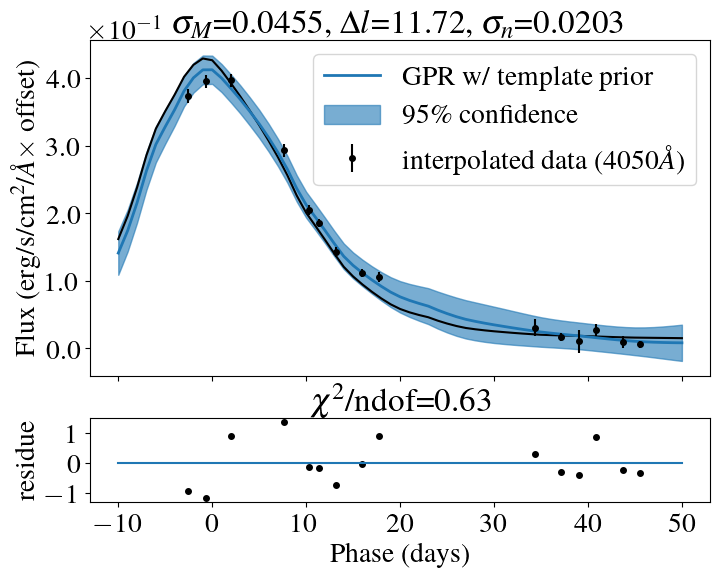

Optimization restart 1/10, f = -25.904172643113057
Optimization restart 2/10, f = -25.90417263528682
Optimization restart 3/10, f = -25.90417263439872
Optimization restart 4/10, f = -25.904172643103443
Optimization restart 5/10, f = -25.90417264310299
Optimization restart 6/10, f = -25.90417264309933
Optimization restart 7/10, f = -25.904172643111664
Optimization restart 8/10, f = -25.90417264311296
Optimization restart 9/10, f = -25.90417257926303
Optimization restart 10/10, f = -25.90417264310104


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.002513792303209655,+ve,"N(0.0025, 0.00025)"
sum.Mat52.lengthscale,11.775192787044569,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0005062877630237555,+ve,"N(0.0005, 5e-05)"


Optimization restart 1/10, f = -23.693607894879214
Optimization restart 2/10, f = -23.69360789122042
Optimization restart 3/10, f = -23.693607894878898
Optimization restart 4/10, f = -23.693607894879218
Optimization restart 5/10, f = -23.693607894858697
Optimization restart 6/10, f = -23.69360789376821
Optimization restart 7/10, f = -23.693607894859856
Optimization restart 8/10, f = -23.693607894853503
Optimization restart 9/10, f = -23.693607893947615
Optimization restart 10/10, f = -23.693607894879314


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003216938883631705,+ve,"N(0.0032, 0.00032)"
sum.Mat52.lengthscale,11.571500698526968,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0006504761774956573,+ve,"N(0.00064, 6.4e-05)"


Optimization restart 1/10, f = -24.21665708815992
Optimization restart 2/10, f = -24.216657090095012
Optimization restart 3/10, f = -24.216657090094778
Optimization restart 4/10, f = -24.216657090095207
Optimization restart 5/10, f = -24.216657083039276
Optimization restart 6/10, f = -24.216657090091985
Optimization restart 7/10, f = -24.21665708951577
Optimization restart 8/10, f = -24.216657088899584
Optimization restart 9/10, f = -24.216657090095413
Optimization restart 10/10, f = -24.216657090076275


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0031521851677247144,+ve,"N(0.0031, 0.00031)"
sum.Mat52.lengthscale,11.391958219660737,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0006347804761860108,+ve,"N(0.00062, 6.2e-05)"


Optimization restart 1/10, f = -24.04671859060928
Optimization restart 2/10, f = -24.046718586220994
Optimization restart 3/10, f = -24.046718590625275
Optimization restart 4/10, f = -24.046718590625364
Optimization restart 5/10, f = -24.046718590619463
Optimization restart 6/10, f = -24.04671859062531
Optimization restart 7/10, f = -24.04671859062443
Optimization restart 8/10, f = -24.04671859061309
Optimization restart 9/10, f = -24.04671859062498
Optimization restart 10/10, f = -24.04671859062507


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0024414520787621303,+ve,"N(0.0024, 0.00024)"
sum.Mat52.lengthscale,11.767457912640266,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.000492753458543338,+ve,"N(0.00049, 4.9e-05)"


Optimization restart 1/10, f = -26.470825626522178
Optimization restart 2/10, f = -26.4708256257868
Optimization restart 3/10, f = -26.470825626534214
Optimization restart 4/10, f = -26.4708256264933
Optimization restart 5/10, f = -26.470825626533244
Optimization restart 6/10, f = -26.470825626533987
Optimization restart 7/10, f = -26.470825626501995
Optimization restart 8/10, f = -26.470825626509225
Optimization restart 9/10, f = -26.47082562501217
Optimization restart 10/10, f = -26.470825613559832


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003378318698805127,+ve,"N(0.0033, 0.00033)"
sum.Mat52.lengthscale,11.093664403155612,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0006650109148679201,+ve,"N(0.00067, 6.7e-05)"


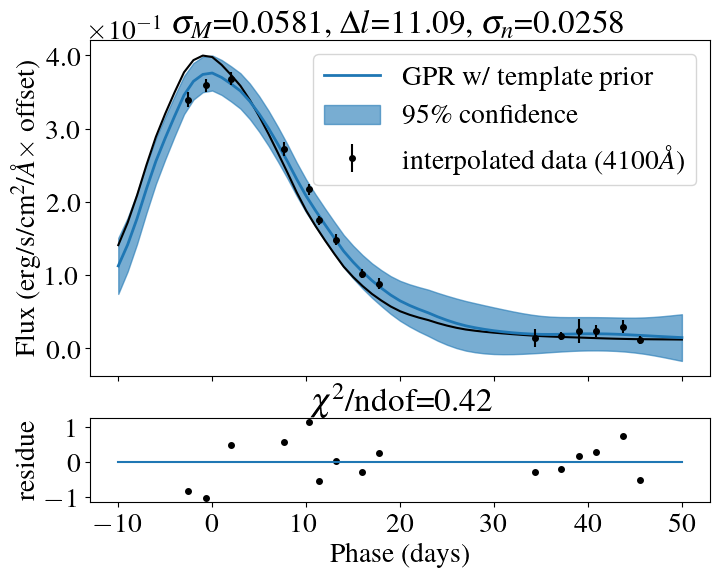

Optimization restart 1/10, f = -27.775823523080177
Optimization restart 2/10, f = -27.775823523068546
Optimization restart 3/10, f = -27.77582352294905
Optimization restart 4/10, f = -27.775823523078405
Optimization restart 5/10, f = -27.77582352307992
Optimization restart 6/10, f = -27.775823523071967
Optimization restart 7/10, f = -27.77582352289305
Optimization restart 8/10, f = -27.775823520566362
Optimization restart 9/10, f = -27.775823523079836
Optimization restart 10/10, f = -27.775823523073434


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0028796490436739774,+ve,"N(0.0028, 0.00028)"
sum.Mat52.lengthscale,11.099605240342486,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0005658821116612735,+ve,"N(0.00057, 5.7e-05)"


Optimization restart 1/10, f = -29.436113134178928
Optimization restart 2/10, f = -29.436113134180133
Optimization restart 3/10, f = -29.436113134132206
Optimization restart 4/10, f = -29.43611313417123
Optimization restart 5/10, f = -29.436113134180104
Optimization restart 6/10, f = -29.4361131341799
Optimization restart 7/10, f = -29.436113134179696
Optimization restart 8/10, f = -29.436113134177326
Optimization restart 9/10, f = -29.436113134179163
Optimization restart 10/10, f = -29.43611313416868


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0019762682783640165,+ve,"N(0.002, 0.0002)"
sum.Mat52.lengthscale,11.19188179058256,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0003909892171921177,+ve,"N(0.00039, 3.9e-05)"


Optimization restart 1/10, f = -26.790697675069488
Optimization restart 2/10, f = -26.790697675070426
Optimization restart 3/10, f = -26.79069767504756
Optimization restart 4/10, f = -26.79069767507041
Optimization restart 5/10, f = -26.790697675069197
Optimization restart 6/10, f = -26.790697675070113
Optimization restart 7/10, f = -26.790697675067555
Optimization restart 8/10, f = -26.790697675070422
Optimization restart 9/10, f = -26.790697675070298
Optimization restart 10/10, f = -26.790697675070057


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0026577799216028113,+ve,"N(0.0026, 0.00026)"
sum.Mat52.lengthscale,11.123077427246661,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0005267881425105314,+ve,"N(0.00053, 5.3e-05)"


Optimization restart 1/10, f = -28.068944438419486
Optimization restart 2/10, f = -28.068944438376974
Optimization restart 3/10, f = -28.068944438418672
Optimization restart 4/10, f = -28.06894443818927
Optimization restart 5/10, f = -28.06894443804232
Optimization restart 6/10, f = -28.068944438419035
Optimization restart 7/10, f = -28.068944438400038
Optimization restart 8/10, f = -28.068944438419308
Optimization restart 9/10, f = -28.068944438403445
Optimization restart 10/10, f = -28.06894443841898


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.002005520408064407,+ve,"N(0.002, 0.0002)"
sum.Mat52.lengthscale,11.45217699403242,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.000399941023719645,+ve,"N(0.0004, 4e-05)"


Optimization restart 1/10, f = -27.13662091876499
Optimization restart 2/10, f = -27.136620917324223
Optimization restart 3/10, f = -27.136620918764518
Optimization restart 4/10, f = -27.136620918758425
Optimization restart 5/10, f = -27.13662091876499
Optimization restart 6/10, f = -27.136620918263777
Optimization restart 7/10, f = -27.136620918763665
Optimization restart 8/10, f = -27.13662090997347
Optimization restart 9/10, f = -27.136620918764976
Optimization restart 10/10, f = -27.13662091872019


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0016526464786591308,+ve,"N(0.0016, 0.00016)"
sum.Mat52.lengthscale,11.69963592395618,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0003308249188469016,+ve,"N(0.00033, 3.3e-05)"


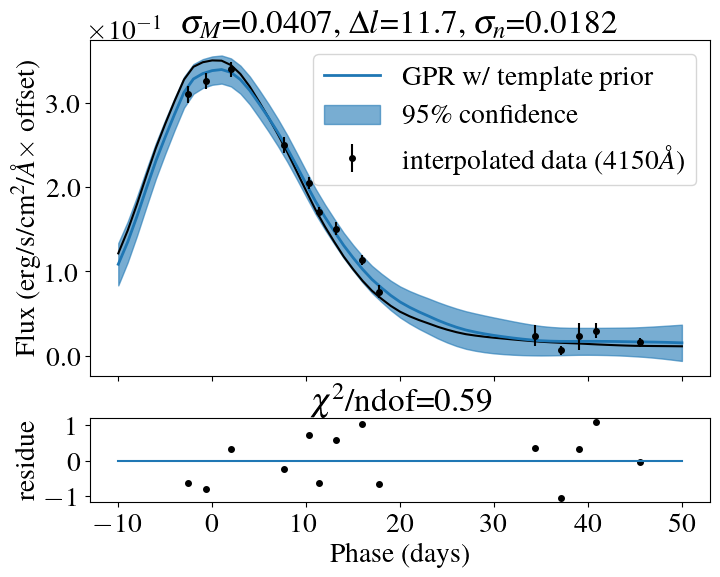

Optimization restart 1/10, f = -26.5302806192485
Optimization restart 2/10, f = -26.53028061920766
Optimization restart 3/10, f = -26.530280619344367
Optimization restart 4/10, f = -26.530280619276713
Optimization restart 5/10, f = -26.530280619344758
Optimization restart 6/10, f = -26.53028061934487
Optimization restart 7/10, f = -26.530280619341124
Optimization restart 8/10, f = -26.53028061007973
Optimization restart 9/10, f = -26.530280619344225
Optimization restart 10/10, f = -26.530280619344804


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.001884675053053177,+ve,"N(0.0019, 0.00019)"
sum.Mat52.lengthscale,11.795022330056433,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00037718692204115014,+ve,"N(0.00037, 3.7e-05)"


Optimization restart 1/10, f = -28.02118281570402
Optimization restart 2/10, f = -28.021182815703988
Optimization restart 3/10, f = -28.0211828157008
Optimization restart 4/10, f = -28.021182815704016
Optimization restart 5/10, f = -28.02118279999549
Optimization restart 6/10, f = -28.021182815701785
Optimization restart 7/10, f = -28.021182815701305
Optimization restart 8/10, f = -28.02118281570249
Optimization restart 9/10, f = -28.021182814681453
Optimization restart 10/10, f = -28.02118281568887


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.00266814583665364,+ve,"N(0.0026, 0.00026)"
sum.Mat52.lengthscale,11.842474187662784,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0005274387573270902,+ve,"N(0.00053, 5.3e-05)"


Optimization restart 1/10, f = -25.176641848563495
Optimization restart 2/10, f = -25.17664184837246
Optimization restart 3/10, f = -25.17664184856328
Optimization restart 4/10, f = -25.176641848542708
Optimization restart 5/10, f = -25.17664184856349
Optimization restart 6/10, f = -25.176641848563456
Optimization restart 7/10, f = -25.176641848560923
Optimization restart 8/10, f = -25.17664184856332
Optimization restart 9/10, f = -25.176641848563158
Optimization restart 10/10, f = -25.176641848562966


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0038338015856031415,+ve,"N(0.0038, 0.00038)"
sum.Mat52.lengthscale,11.662652006856167,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0007581074733585749,+ve,"N(0.00076, 7.6e-05)"


Optimization restart 1/10, f = -23.485503170155006
Optimization restart 2/10, f = -23.485503157227477
Optimization restart 3/10, f = -23.48550317015669
Optimization restart 4/10, f = -23.48550317015683
Optimization restart 5/10, f = -23.485503169997514
Optimization restart 6/10, f = -23.485503170156814
Optimization restart 7/10, f = -23.48550316506374
Optimization restart 8/10, f = -23.485503170156846
Optimization restart 9/10, f = -23.48550317012669
Optimization restart 10/10, f = -23.485503170138383


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.00483740922614375,+ve,"N(0.0048, 0.00048)"
sum.Mat52.lengthscale,11.700402135624651,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0009575327837303321,+ve,"N(0.00096, 9.6e-05)"


Optimization restart 1/10, f = -21.063290205402268
Optimization restart 2/10, f = -21.06329020540226
Optimization restart 3/10, f = -21.0632902054014
Optimization restart 4/10, f = -21.063290205401643
Optimization restart 5/10, f = -21.06329020181756
Optimization restart 6/10, f = -21.06329020540213
Optimization restart 7/10, f = -21.063290205402275
Optimization restart 8/10, f = -21.063290205395624
Optimization restart 9/10, f = -21.063290202714477
Optimization restart 10/10, f = -21.063290205402076


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006193419253287053,+ve,"N(0.0061, 0.00061)"
sum.Mat52.lengthscale,11.909682078780286,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0012374911405670969,+ve,"N(0.0012, 0.00012)"


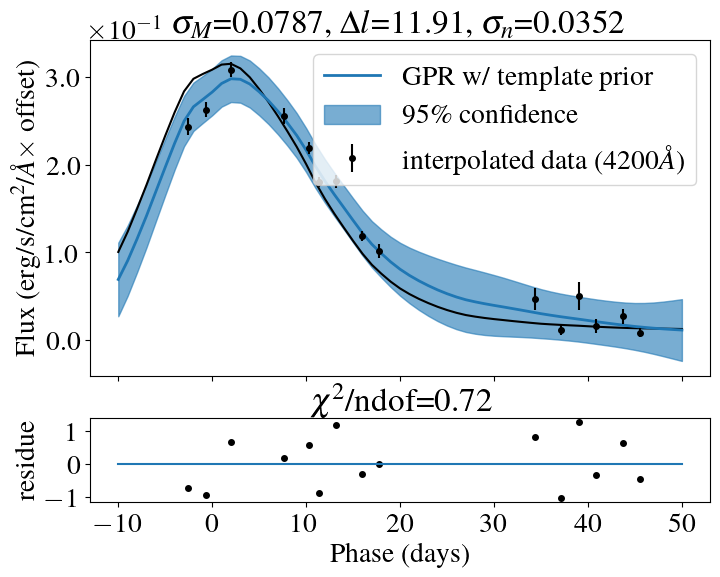

Optimization restart 1/10, f = -20.48563025820833
Optimization restart 2/10, f = -20.48563025821867
Optimization restart 3/10, f = -20.48563025817632
Optimization restart 4/10, f = -20.48563025676205
Optimization restart 5/10, f = -20.485630258220368
Optimization restart 6/10, f = -20.48563025819195
Optimization restart 7/10, f = -20.4856302582137
Optimization restart 8/10, f = -20.485630247132676
Optimization restart 9/10, f = -20.485630258216027
Optimization restart 10/10, f = -20.485630258220347


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006850972808080831,+ve,"N(0.0068, 0.00068)"
sum.Mat52.lengthscale,11.689355754038173,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0013639699344023264,+ve,"N(0.0014, 0.00014)"


Optimization restart 1/10, f = -22.119241595646894
Optimization restart 2/10, f = -22.119241557740903
Optimization restart 3/10, f = -22.119241595646734
Optimization restart 4/10, f = -22.119241595646788
Optimization restart 5/10, f = -22.11924159549487
Optimization restart 6/10, f = -22.11924159564689
Optimization restart 7/10, f = -22.119241595646237
Optimization restart 8/10, f = -22.11924159524447
Optimization restart 9/10, f = -22.119241595640993
Optimization restart 10/10, f = -22.119241595591134


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006130730747567865,+ve,"N(0.0061, 0.00061)"
sum.Mat52.lengthscale,11.797553474106222,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0012133677299121766,+ve,"N(0.0012, 0.00012)"


Optimization restart 1/10, f = -24.25119912511298
Optimization restart 2/10, f = -24.251199125086373
Optimization restart 3/10, f = -24.251199125111363
Optimization restart 4/10, f = -24.251199125105376
Optimization restart 5/10, f = -24.251199125105703
Optimization restart 6/10, f = -24.251199125114148
Optimization restart 7/10, f = -24.251199125113985
Optimization restart 8/10, f = -24.251199125083186
Optimization restart 9/10, f = -24.251199122181674
Optimization restart 10/10, f = -24.251199125100094


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005068590326298831,+ve,"N(0.005, 0.0005)"
sum.Mat52.lengthscale,11.97456127101762,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0009976844208541681,+ve,"N(0.001, 0.0001)"


Optimization restart 1/10, f = -22.769876226947478
Optimization restart 2/10, f = -22.769876226933306
Optimization restart 3/10, f = -22.769876224258486
Optimization restart 4/10, f = -22.769876226940134
Optimization restart 5/10, f = -22.769876226948305
Optimization restart 6/10, f = -22.76987622693691
Optimization restart 7/10, f = -22.76987622693005
Optimization restart 8/10, f = -22.769876226944827
Optimization restart 9/10, f = -22.769876226947787
Optimization restart 10/10, f = -22.769876226933327


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006558964255312518,+ve,"N(0.0065, 0.00065)"
sum.Mat52.lengthscale,12.041811251358984,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0012857603588579535,+ve,"N(0.0013, 0.00013)"


Optimization restart 1/10, f = -24.673420852654896
Optimization restart 2/10, f = -24.67342085272173
Optimization restart 3/10, f = -24.673420852687144
Optimization restart 4/10, f = -24.673420852710336
Optimization restart 5/10, f = -24.67342085271825
Optimization restart 6/10, f = -24.67342085265056
Optimization restart 7/10, f = -24.67342085265296
Optimization restart 8/10, f = -24.67342085271559
Optimization restart 9/10, f = -24.67342085272289
Optimization restart 10/10, f = -24.673420852724345


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0034180732816566748,+ve,"N(0.0034, 0.00034)"
sum.Mat52.lengthscale,11.972350759894473,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0006809542390525361,+ve,"N(0.00068, 6.8e-05)"


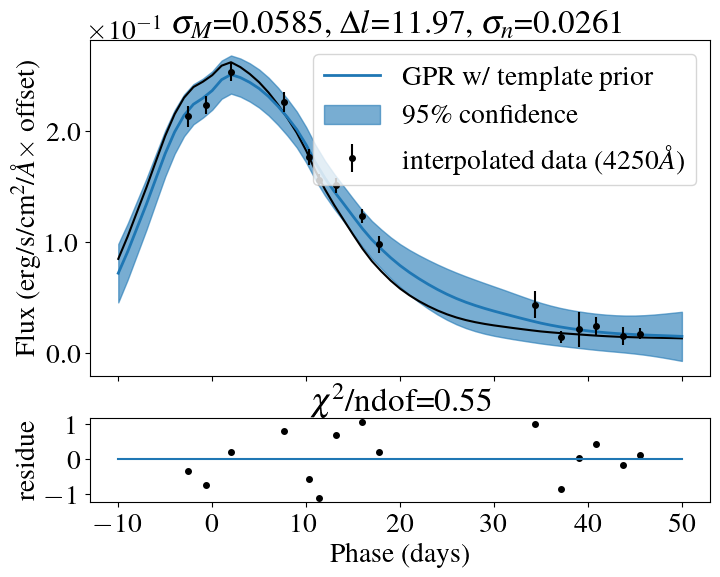

Optimization restart 1/10, f = -24.614635923303304
Optimization restart 2/10, f = -24.614635923297442
Optimization restart 3/10, f = -24.614635923207153
Optimization restart 4/10, f = -24.614635923303254
Optimization restart 5/10, f = -24.61463589900619
Optimization restart 6/10, f = -24.614635923239586
Optimization restart 7/10, f = -24.614635839548306
Optimization restart 8/10, f = -24.61463592330328
Optimization restart 9/10, f = -24.614635923301737
Optimization restart 10/10, f = -24.614635923170102


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.002475296384256946,+ve,"N(0.0025, 0.00025)"
sum.Mat52.lengthscale,11.99109648794883,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0004992110011924914,+ve,"N(0.00049, 4.9e-05)"


Optimization restart 1/10, f = -20.819863662126508
Optimization restart 2/10, f = -20.819863662091713
Optimization restart 3/10, f = -20.819863662134672
Optimization restart 4/10, f = -20.819863662134843
Optimization restart 5/10, f = -20.819863645429116
Optimization restart 6/10, f = -20.819863662134864
Optimization restart 7/10, f = -20.819863662132544
Optimization restart 8/10, f = -20.819863662050146
Optimization restart 9/10, f = -20.81986366212584
Optimization restart 10/10, f = -20.819863662120433


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005743566310553237,+ve,"N(0.0057, 0.00057)"
sum.Mat52.lengthscale,11.620078991624652,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0011452764217489094,+ve,"N(0.0011, 0.00011)"


Optimization restart 1/10, f = -21.958652173149428
Optimization restart 2/10, f = -21.95865217294976
Optimization restart 3/10, f = -21.958652173149176
Optimization restart 4/10, f = -21.958652173149456
Optimization restart 5/10, f = -21.958652173148913
Optimization restart 6/10, f = -21.958652172721834
Optimization restart 7/10, f = -21.95865216769882
Optimization restart 8/10, f = -21.95865217266266
Optimization restart 9/10, f = -21.95865217235526
Optimization restart 10/10, f = -21.958652173149307


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0041524450769409305,+ve,"N(0.0041, 0.00041)"
sum.Mat52.lengthscale,11.699586262357247,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0008318854901735299,+ve,"N(0.00082, 8.2e-05)"


Optimization restart 1/10, f = -21.484078390336286
Optimization restart 2/10, f = -21.48407839033625
Optimization restart 3/10, f = -21.484078390336226
Optimization restart 4/10, f = -21.48407838966461
Optimization restart 5/10, f = -21.48407839033623
Optimization restart 6/10, f = -21.484078388380468
Optimization restart 7/10, f = -21.48407839033559
Optimization restart 8/10, f = -21.48407839033627
Optimization restart 9/10, f = -21.484078390335885
Optimization restart 10/10, f = -21.484078390336265


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0040036161719733876,+ve,"N(0.004, 0.0004)"
sum.Mat52.lengthscale,11.339808906853566,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0008035477006271139,+ve,"N(0.00079, 7.9e-05)"


Optimization restart 1/10, f = -19.72677465383149
Optimization restart 2/10, f = -19.726774653794116
Optimization restart 3/10, f = -19.726774637242016
Optimization restart 4/10, f = -19.726774653831455
Optimization restart 5/10, f = -19.726774653742243
Optimization restart 6/10, f = -19.72677465383149
Optimization restart 7/10, f = -19.72677465382282
Optimization restart 8/10, f = -19.726774653734427
Optimization restart 9/10, f = -19.72677465383162
Optimization restart 10/10, f = -19.726774653830844


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004533081535029585,+ve,"N(0.0045, 0.00045)"
sum.Mat52.lengthscale,10.859225988601878,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0009125065989824603,+ve,"N(0.0009, 9e-05)"


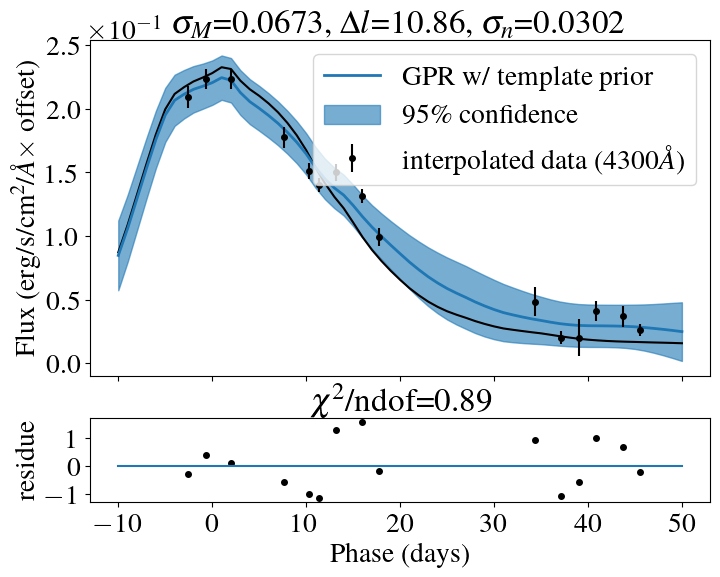

Optimization restart 1/10, f = -23.389659285462592
Optimization restart 2/10, f = -23.389659285449625
Optimization restart 3/10, f = -23.389659278303903
Optimization restart 4/10, f = -23.389659285400242
Optimization restart 5/10, f = -23.389659285330218
Optimization restart 6/10, f = -23.389659285406843
Optimization restart 7/10, f = -23.38965928544333
Optimization restart 8/10, f = -23.38965928545366
Optimization restart 9/10, f = -23.38965928544826
Optimization restart 10/10, f = -23.38965928528195


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003237585337838831,+ve,"N(0.0032, 0.00032)"
sum.Mat52.lengthscale,10.965736911381207,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.000643419788917649,+ve,"N(0.00064, 6.4e-05)"


Optimization restart 1/10, f = -24.537068279183906
Optimization restart 2/10, f = -24.537068279183636
Optimization restart 3/10, f = -24.53706827779578
Optimization restart 4/10, f = -24.53706827916207
Optimization restart 5/10, f = -24.537068277243737
Optimization restart 6/10, f = -24.537068279128356
Optimization restart 7/10, f = -24.537068278971425
Optimization restart 8/10, f = -24.537068279179874
Optimization restart 9/10, f = -24.53706827915531
Optimization restart 10/10, f = -24.537068277018108


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.002885715715217665,+ve,"N(0.0029, 0.00029)"
sum.Mat52.lengthscale,11.621303233405659,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00057533761228319,+ve,"N(0.00057, 5.7e-05)"


Optimization restart 1/10, f = -25.47533051973597
Optimization restart 2/10, f = -25.475330511857933
Optimization restart 3/10, f = -25.47533051966444
Optimization restart 4/10, f = -25.47533051939268
Optimization restart 5/10, f = -25.47533051973798
Optimization restart 6/10, f = -25.47533051972535
Optimization restart 7/10, f = -25.475330512531293
Optimization restart 8/10, f = -25.47533051973602
Optimization restart 9/10, f = -25.475330519738016
Optimization restart 10/10, f = -25.475330519658705


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.002379936143552232,+ve,"N(0.0024, 0.00024)"
sum.Mat52.lengthscale,11.97791793465833,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00047687981413784534,+ve,"N(0.00047, 4.7e-05)"


Optimization restart 1/10, f = -26.059986073688787
Optimization restart 2/10, f = -26.05998607368894
Optimization restart 3/10, f = -26.059986073688776
Optimization restart 4/10, f = -26.059986072318978
Optimization restart 5/10, f = -26.059986073688965
Optimization restart 6/10, f = -26.059986073671922
Optimization restart 7/10, f = -26.05998607368872
Optimization restart 8/10, f = -26.05998607368888
Optimization restart 9/10, f = -26.059986073649654
Optimization restart 10/10, f = -26.059986073688034


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0016765629825096742,+ve,"N(0.0017, 0.00017)"
sum.Mat52.lengthscale,12.19223573761276,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0003408396526885479,+ve,"N(0.00034, 3.4e-05)"


Optimization restart 1/10, f = -28.781974793605137
Optimization restart 2/10, f = -28.781974791974193
Optimization restart 3/10, f = -28.781974793605475
Optimization restart 4/10, f = -28.781974793592376
Optimization restart 5/10, f = -28.781974793581707
Optimization restart 6/10, f = -28.781974793605457
Optimization restart 7/10, f = -28.781974793602217
Optimization restart 8/10, f = -28.781974792868496
Optimization restart 9/10, f = -28.78197479360518
Optimization restart 10/10, f = -28.781974786950684


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0009404358719521951,+ve,"N(0.00094, 9.4e-05)"
sum.Mat52.lengthscale,12.154490844532157,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00019147472650454876,+ve,"N(0.00019, 1.9e-05)"


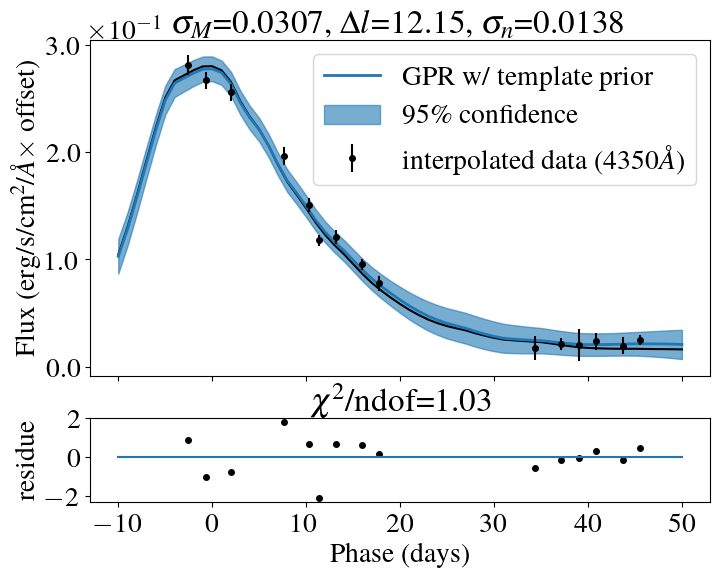

Optimization restart 1/10, f = -28.72869657321025
Optimization restart 2/10, f = -28.728696544283196
Optimization restart 3/10, f = -28.728696570216766
Optimization restart 4/10, f = -28.728696571944624
Optimization restart 5/10, f = -28.728696573209227
Optimization restart 6/10, f = -28.728696573210552
Optimization restart 7/10, f = -28.728696573056304
Optimization restart 8/10, f = -28.728696573210506
Optimization restart 9/10, f = -28.72869657319206
Optimization restart 10/10, f = -28.728696573188543


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0010547644482057402,+ve,"N(0.0011, 0.00011)"
sum.Mat52.lengthscale,12.131325409143413,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00021489055240186643,+ve,"N(0.00021, 2.1e-05)"


Optimization restart 1/10, f = -29.706986927296235
Optimization restart 2/10, f = -29.706986927293336
Optimization restart 3/10, f = -29.70698692719956
Optimization restart 4/10, f = -29.706986927296356
Optimization restart 5/10, f = -29.70698692522874
Optimization restart 6/10, f = -29.706986927296064
Optimization restart 7/10, f = -29.70698692729668
Optimization restart 8/10, f = -29.706986927296743
Optimization restart 9/10, f = -29.7069869272594
Optimization restart 10/10, f = -29.70698692728782


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.000866706353355199,+ve,"N(0.00087, 8.7e-05)"
sum.Mat52.lengthscale,11.999841057174393,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00017611659905393537,+ve,"N(0.00017, 1.7e-05)"


Optimization restart 1/10, f = -26.119637964484447
Optimization restart 2/10, f = -26.11963796448069
Optimization restart 3/10, f = -26.119637964488795
Optimization restart 4/10, f = -26.119637963364127
Optimization restart 5/10, f = -26.119637964477565
Optimization restart 6/10, f = -26.11963796448783
Optimization restart 7/10, f = -26.119637964488838
Optimization restart 8/10, f = -26.119637926187863
Optimization restart 9/10, f = -26.119637964488845
Optimization restart 10/10, f = -26.119637964484156


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.001658779731594649,+ve,"N(0.0017, 0.00017)"
sum.Mat52.lengthscale,11.644554811420955,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.000337234089682149,+ve,"N(0.00033, 3.3e-05)"


Optimization restart 1/10, f = -21.060726713688048
Optimization restart 2/10, f = -21.0607267137069
Optimization restart 3/10, f = -21.060726713708476
Optimization restart 4/10, f = -21.06072670567896
Optimization restart 5/10, f = -21.060726713708938
Optimization restart 6/10, f = -21.060726713692556
Optimization restart 7/10, f = -21.060726713702316
Optimization restart 8/10, f = -21.060726713708668
Optimization restart 9/10, f = -21.060726713704085
Optimization restart 10/10, f = -21.06072671370488


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003355894814780226,+ve,"N(0.0033, 0.00033)"
sum.Mat52.lengthscale,10.840462318093685,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0006822329637766809,+ve,"N(0.00067, 6.7e-05)"


Optimization restart 1/10, f = -16.650649206481003
Optimization restart 2/10, f = -16.650649206480974
Optimization restart 3/10, f = -16.65064920647948
Optimization restart 4/10, f = -16.650649206480455
Optimization restart 5/10, f = -16.650649206480992
Optimization restart 6/10, f = -16.650649206481006
Optimization restart 7/10, f = -16.650649206298546
Optimization restart 8/10, f = -16.650649206481006
Optimization restart 9/10, f = -16.65064919068163
Optimization restart 10/10, f = -16.650649206480992


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006086999392160176,+ve,"N(0.006, 0.0006)"
sum.Mat52.lengthscale,10.06557756718239,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0012350252638234141,+ve,"N(0.0012, 0.00012)"


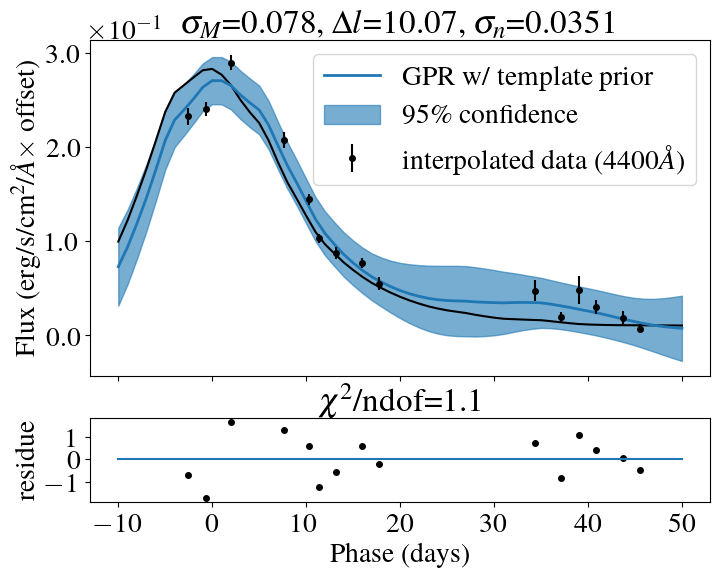

Optimization restart 1/10, f = -18.624322466464207
Optimization restart 2/10, f = -18.62432246645155
Optimization restart 3/10, f = -18.62432246646782
Optimization restart 4/10, f = -18.624322466467824
Optimization restart 5/10, f = -18.624322466467824
Optimization restart 6/10, f = -18.624322466467763
Optimization restart 7/10, f = -18.624322463320407
Optimization restart 8/10, f = -18.624322466429977
Optimization restart 9/10, f = -18.624322461978416
Optimization restart 10/10, f = -18.624322466458878


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005014435934203026,+ve,"N(0.005, 0.0005)"
sum.Mat52.lengthscale,10.66583018113139,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0010166171157305706,+ve,"N(0.00099, 9.9e-05)"


Optimization restart 1/10, f = -18.415711330418123
Optimization restart 2/10, f = -18.41571133041817
Optimization restart 3/10, f = -18.415711330416144
Optimization restart 4/10, f = -18.415711330417906
Optimization restart 5/10, f = -18.41571133038412
Optimization restart 6/10, f = -18.41571132969296
Optimization restart 7/10, f = -18.415711330310053
Optimization restart 8/10, f = -18.41571133020669
Optimization restart 9/10, f = -18.415711330418333
Optimization restart 10/10, f = -18.415711330418304


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005420637052791973,+ve,"N(0.0053, 0.00053)"
sum.Mat52.lengthscale,10.453211164592842,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0010859989223514633,+ve,"N(0.0011, 0.00011)"


Optimization restart 1/10, f = -19.99399356035594
Optimization restart 2/10, f = -19.99399356035518
Optimization restart 3/10, f = -19.993993560356458
Optimization restart 4/10, f = -19.993993560356248
Optimization restart 5/10, f = -19.99399356035645
Optimization restart 6/10, f = -19.99399356001121
Optimization restart 7/10, f = -19.99399356035542
Optimization restart 8/10, f = -19.993993560346844
Optimization restart 9/10, f = -19.993993560355783
Optimization restart 10/10, f = -19.99399356033986


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.00594571160704548,+ve,"N(0.0058, 0.00058)"
sum.Mat52.lengthscale,9.59470878296289,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001173569044694568,+ve,"N(0.0012, 0.00012)"


Optimization restart 1/10, f = -21.983875504199524
Optimization restart 2/10, f = -21.98387550426054
Optimization restart 3/10, f = -21.983875504262713
Optimization restart 4/10, f = -21.98387550426267
Optimization restart 5/10, f = -21.983875504261967
Optimization restart 6/10, f = -21.98387550033398
Optimization restart 7/10, f = -21.983875504239016
Optimization restart 8/10, f = -21.98387550426269
Optimization restart 9/10, f = -21.983875504251802
Optimization restart 10/10, f = -21.983875501109274


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004581997266475338,+ve,"N(0.0045, 0.00045)"
sum.Mat52.lengthscale,10.062316258975034,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0009064671746740946,+ve,"N(0.0009, 9e-05)"


Optimization restart 1/10, f = -23.672146311209865
Optimization restart 2/10, f = -23.67214631120895
Optimization restart 3/10, f = -23.672146311207378
Optimization restart 4/10, f = -23.672146311199697
Optimization restart 5/10, f = -23.672146303088137
Optimization restart 6/10, f = -23.672146311205797
Optimization restart 7/10, f = -23.672146311195778
Optimization restart 8/10, f = -23.672146310053243
Optimization restart 9/10, f = -23.672146295174315
Optimization restart 10/10, f = -23.672146306070164


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0038241955643011157,+ve,"N(0.0038, 0.00038)"
sum.Mat52.lengthscale,10.594240063377137,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0007578573110460589,+ve,"N(0.00075, 7.5e-05)"


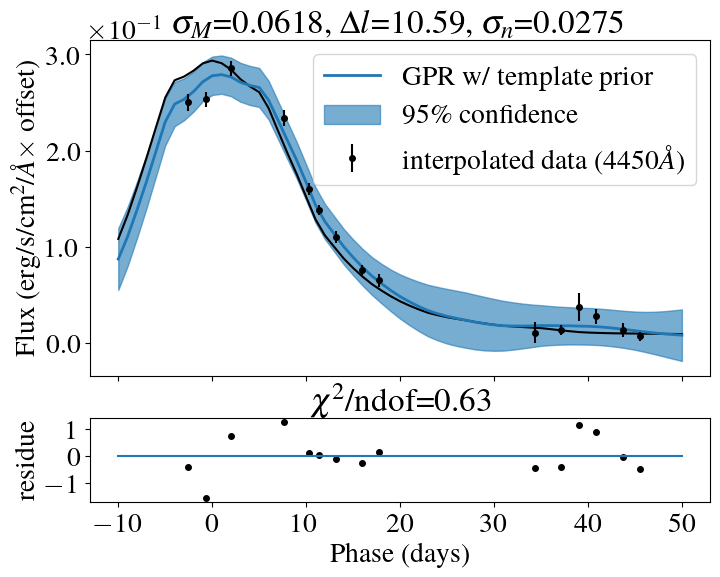

Optimization restart 1/10, f = -24.24544864516153
Optimization restart 2/10, f = -24.24544864596163
Optimization restart 3/10, f = -24.24544864596554
Optimization restart 4/10, f = -24.245448645971038
Optimization restart 5/10, f = -24.245448645971543
Optimization restart 6/10, f = -24.245448645879513
Optimization restart 7/10, f = -24.245448645970924
Optimization restart 8/10, f = -24.245448645971305
Optimization restart 9/10, f = -24.245448645959016
Optimization restart 10/10, f = -24.245448645680906


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003509495138962386,+ve,"N(0.0035, 0.00035)"
sum.Mat52.lengthscale,10.952021416040543,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0006987947977824116,+ve,"N(0.00069, 6.9e-05)"


Optimization restart 1/10, f = -23.953082195236664
Optimization restart 2/10, f = -23.95308219526642
Optimization restart 3/10, f = -23.953082195266237
Optimization restart 4/10, f = -23.95308219520705
Optimization restart 5/10, f = -23.953082195266422
Optimization restart 6/10, f = -23.953082195018062
Optimization restart 7/10, f = -23.953082195263235
Optimization restart 8/10, f = -23.953082195224056
Optimization restart 9/10, f = -23.95308219521667
Optimization restart 10/10, f = -23.953082195246193


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003908657961552826,+ve,"N(0.0039, 0.00039)"
sum.Mat52.lengthscale,11.08101531398464,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0007762794037193577,+ve,"N(0.00077, 7.7e-05)"


Optimization restart 1/10, f = -24.376024234003467
Optimization restart 2/10, f = -24.37602423398491
Optimization restart 3/10, f = -24.376024233949465
Optimization restart 4/10, f = -24.376024234004706
Optimization restart 5/10, f = -24.376024229139745
Optimization restart 6/10, f = -24.376024234004788
Optimization restart 7/10, f = -24.376024233980676
Optimization restart 8/10, f = -24.376024219743407
Optimization restart 9/10, f = -24.37602423400462
Optimization restart 10/10, f = -24.37602423400474


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003583843650690408,+ve,"N(0.0035, 0.00035)"
sum.Mat52.lengthscale,11.129452456102792,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0007124693784790452,+ve,"N(0.00071, 7.1e-05)"


Optimization restart 1/10, f = -25.09569787477466
Optimization restart 2/10, f = -25.09569787477465
Optimization restart 3/10, f = -25.095697874774636
Optimization restart 4/10, f = -25.095697874763438
Optimization restart 5/10, f = -25.09569787473402
Optimization restart 6/10, f = -25.095697874774658
Optimization restart 7/10, f = -25.09569787477457
Optimization restart 8/10, f = -25.095697874773855
Optimization restart 9/10, f = -25.095697874710737
Optimization restart 10/10, f = -25.09569787476362


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.002822303188966464,+ve,"N(0.0028, 0.00028)"
sum.Mat52.lengthscale,11.19964013376391,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0005646254212535389,+ve,"N(0.00056, 5.6e-05)"


Optimization restart 1/10, f = -28.79713713195482
Optimization restart 2/10, f = -28.797137131956916
Optimization restart 3/10, f = -28.79713713189637
Optimization restart 4/10, f = -28.79713713195403
Optimization restart 5/10, f = -28.797137131908393
Optimization restart 6/10, f = -28.79713713195717
Optimization restart 7/10, f = -28.797137131951647
Optimization restart 8/10, f = -28.79713713195693
Optimization restart 9/10, f = -28.797137131940875
Optimization restart 10/10, f = -28.79713713192659


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0018619844750606635,+ve,"N(0.0018, 0.00018)"
sum.Mat52.lengthscale,11.599633896488639,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0003707704048342072,+ve,"N(0.00037, 3.7e-05)"


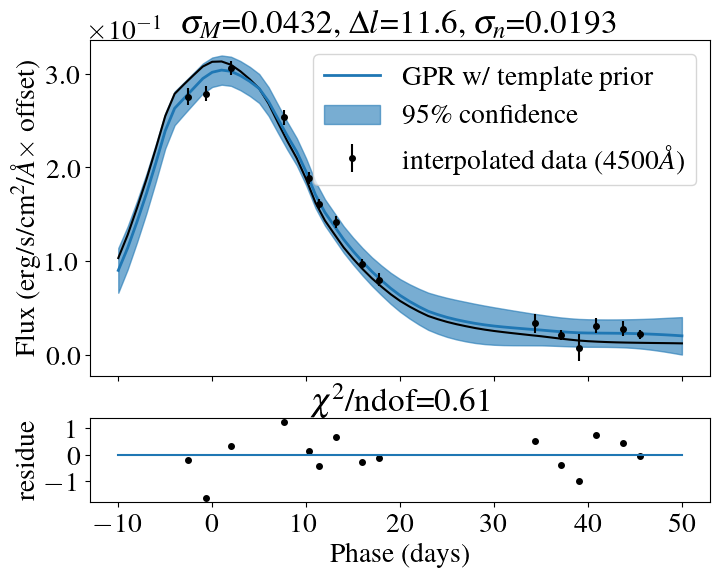

Optimization restart 1/10, f = -27.245948910536605
Optimization restart 2/10, f = -27.245948910520326
Optimization restart 3/10, f = -27.245948910537216
Optimization restart 4/10, f = -27.245948910406995
Optimization restart 5/10, f = -27.245948910536843
Optimization restart 6/10, f = -27.245948910536114
Optimization restart 7/10, f = -27.24594891053721
Optimization restart 8/10, f = -27.24594891053338
Optimization restart 9/10, f = -27.245948910537013
Optimization restart 10/10, f = -27.245948910527147


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0017941685144683126,+ve,"N(0.0018, 0.00018)"
sum.Mat52.lengthscale,11.662340310026238,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00035813157555704086,+ve,"N(0.00036, 3.6e-05)"


Optimization restart 1/10, f = -26.021850192157334
Optimization restart 2/10, f = -26.021850192228268
Optimization restart 3/10, f = -26.021850192227497
Optimization restart 4/10, f = -26.021850192227458
Optimization restart 5/10, f = -26.021850192228158
Optimization restart 6/10, f = -26.021850192228417
Optimization restart 7/10, f = -26.021850192223283
Optimization restart 8/10, f = -26.02185019222414
Optimization restart 9/10, f = -26.021850192227635
Optimization restart 10/10, f = -26.0218501922284


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0021880920353384826,+ve,"N(0.0022, 0.00022)"
sum.Mat52.lengthscale,11.5881245217795,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00044085273631575055,+ve,"N(0.00043, 4.3e-05)"


Optimization restart 1/10, f = -26.689744127582337
Optimization restart 2/10, f = -26.689744127751243
Optimization restart 3/10, f = -26.68974412774486
Optimization restart 4/10, f = -26.689744125549296
Optimization restart 5/10, f = -26.689744127751034
Optimization restart 6/10, f = -26.68974412775121
Optimization restart 7/10, f = -26.689744127748835
Optimization restart 8/10, f = -26.68974412762111
Optimization restart 9/10, f = -26.68974412731084
Optimization restart 10/10, f = -26.68974412633043


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.002178204878719544,+ve,"N(0.0022, 0.00022)"
sum.Mat52.lengthscale,12.17924592744107,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00043938302660985555,+ve,"N(0.00043, 4.3e-05)"


Optimization restart 1/10, f = -26.098270393270724
Optimization restart 2/10, f = -26.09827039471579
Optimization restart 3/10, f = -26.09827039471586
Optimization restart 4/10, f = -26.098270394614488
Optimization restart 5/10, f = -26.09827039465523
Optimization restart 6/10, f = -26.09827039469297
Optimization restart 7/10, f = -26.098270378344033
Optimization restart 8/10, f = -26.09827039471524
Optimization restart 9/10, f = -26.09827039471604
Optimization restart 10/10, f = -26.098270393167322


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0026530251142684886,+ve,"N(0.0026, 0.00026)"
sum.Mat52.lengthscale,12.429614442586562,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0005340715771940406,+ve,"N(0.00053, 5.3e-05)"


Optimization restart 1/10, f = -25.35750469134702
Optimization restart 2/10, f = -25.357504689696583
Optimization restart 3/10, f = -25.357504691346076
Optimization restart 4/10, f = -25.357504691292245
Optimization restart 5/10, f = -25.35750469134672
Optimization restart 6/10, f = -25.357504689679523
Optimization restart 7/10, f = -25.35750469134656
Optimization restart 8/10, f = -25.35750468953219
Optimization restart 9/10, f = -25.357504691323882
Optimization restart 10/10, f = -25.357504691346975


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0028350702746884936,+ve,"N(0.0028, 0.00028)"
sum.Mat52.lengthscale,12.111964322428495,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0005692175701791444,+ve,"N(0.00056, 5.6e-05)"


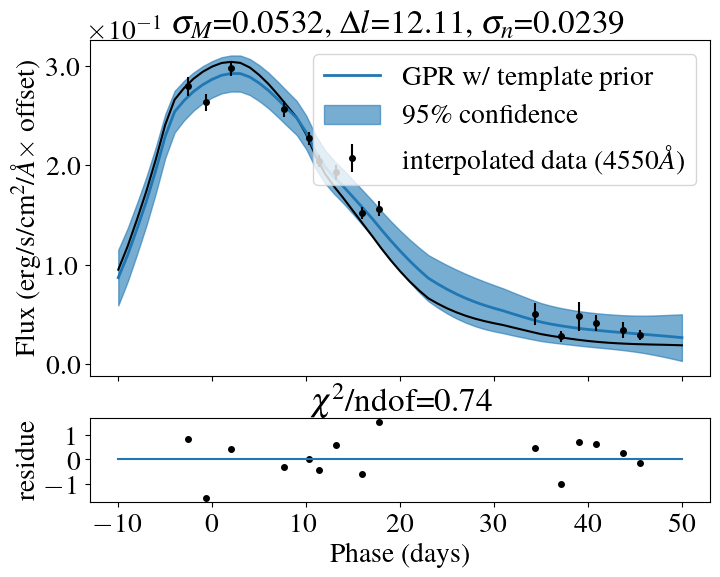

Optimization restart 1/10, f = -22.20420620058691
Optimization restart 2/10, f = -22.204206200566016
Optimization restart 3/10, f = -22.204206200586427
Optimization restart 4/10, f = -22.204206200587265
Optimization restart 5/10, f = -22.204206200587315
Optimization restart 6/10, f = -22.20420620058602
Optimization restart 7/10, f = -22.204206200587187
Optimization restart 8/10, f = -22.204206200587336
Optimization restart 9/10, f = -22.20420620058713
Optimization restart 10/10, f = -22.204206198449334


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0026469339659629166,+ve,"N(0.0026, 0.00026)"
sum.Mat52.lengthscale,11.660549552527543,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0005407564863525903,+ve,"N(0.00053, 5.3e-05)"


Optimization restart 1/10, f = -23.803246739917984
Optimization restart 2/10, f = -23.80324673991975
Optimization restart 3/10, f = -23.803246726352707
Optimization restart 4/10, f = -23.803246739848646
Optimization restart 5/10, f = -23.803246734773737
Optimization restart 6/10, f = -23.80324673992026
Optimization restart 7/10, f = -23.80324673992028
Optimization restart 8/10, f = -23.803246739250582
Optimization restart 9/10, f = -23.803246739742256
Optimization restart 10/10, f = -23.803246739842187


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.002370929878787848,+ve,"N(0.0023, 0.00023)"
sum.Mat52.lengthscale,10.76537913758857,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00047682915457106543,+ve,"N(0.00047, 4.7e-05)"


Optimization restart 1/10, f = -24.983300111828665
Optimization restart 2/10, f = -24.983300111831106
Optimization restart 3/10, f = -24.98330011180916
Optimization restart 4/10, f = -24.983300110654355
Optimization restart 5/10, f = -24.98330011183039
Optimization restart 6/10, f = -24.983300111831067
Optimization restart 7/10, f = -24.983300111831113
Optimization restart 8/10, f = -24.98330011182026
Optimization restart 9/10, f = -24.98330011183106
Optimization restart 10/10, f = -24.983300111828466


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.002339031128752111,+ve,"N(0.0023, 0.00023)"
sum.Mat52.lengthscale,9.924986101731612,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0004636301474065875,+ve,"N(0.00046, 4.6e-05)"


Optimization restart 1/10, f = -22.607034270078547
Optimization restart 2/10, f = -22.607034270083084
Optimization restart 3/10, f = -22.6070342700842
Optimization restart 4/10, f = -22.6070342700842
Optimization restart 5/10, f = -22.60703427008251
Optimization restart 6/10, f = -22.60703427008401
Optimization restart 7/10, f = -22.60703426199518
Optimization restart 8/10, f = -22.60703427008419
Optimization restart 9/10, f = -22.607034269865252
Optimization restart 10/10, f = -22.607034248814593


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0028132443617022514,+ve,"N(0.0028, 0.00028)"
sum.Mat52.lengthscale,10.687386211313164,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0005668248195784797,+ve,"N(0.00056, 5.6e-05)"


Optimization restart 1/10, f = -23.088003150436606
Optimization restart 2/10, f = -23.088003150436574
Optimization restart 3/10, f = -23.08800315043405
Optimization restart 4/10, f = -23.088003148944942
Optimization restart 5/10, f = -23.088003142088237
Optimization restart 6/10, f = -23.08800315036455
Optimization restart 7/10, f = -23.088003150417137
Optimization restart 8/10, f = -23.088003148005196
Optimization restart 9/10, f = -23.08800315043658
Optimization restart 10/10, f = -23.08800315043652


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0025854150333585175,+ve,"N(0.0026, 0.00026)"
sum.Mat52.lengthscale,11.042634332499874,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0005234712418308039,+ve,"N(0.00051, 5.1e-05)"


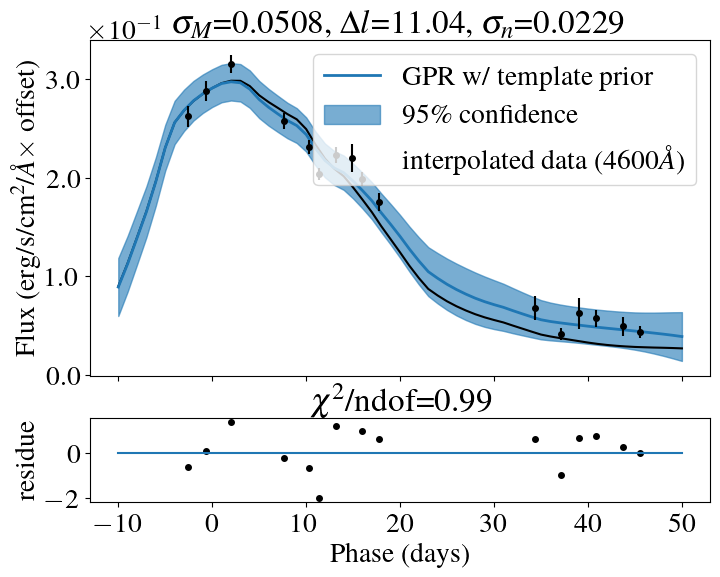

Optimization restart 1/10, f = -19.199308739245197
Optimization restart 2/10, f = -19.19930873924524
Optimization restart 3/10, f = -19.199308739053375
Optimization restart 4/10, f = -19.19930873924366
Optimization restart 5/10, f = -19.19930873924434
Optimization restart 6/10, f = -19.1993087392452
Optimization restart 7/10, f = -19.199308739245197
Optimization restart 8/10, f = -19.199308739236645
Optimization restart 9/10, f = -19.199308719479355
Optimization restart 10/10, f = -19.199308739244817


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003207741738389065,+ve,"N(0.0032, 0.00032)"
sum.Mat52.lengthscale,11.675279461033513,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0006648468169489178,+ve,"N(0.00064, 6.4e-05)"


Optimization restart 1/10, f = -19.37266972130289
Optimization restart 2/10, f = -19.37266972130984
Optimization restart 3/10, f = -19.372669721261822
Optimization restart 4/10, f = -19.37266972131041
Optimization restart 5/10, f = -19.372669721307176
Optimization restart 6/10, f = -19.372669721287792
Optimization restart 7/10, f = -19.3726697192473
Optimization restart 8/10, f = -19.37266972130555
Optimization restart 9/10, f = -19.37266971975135
Optimization restart 10/10, f = -19.37266972131041


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003225350963958382,+ve,"N(0.0032, 0.00032)"
sum.Mat52.lengthscale,11.754302315277496,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0006648417611177674,+ve,"N(0.00064, 6.4e-05)"


Optimization restart 1/10, f = -21.368236398305257
Optimization restart 2/10, f = -21.368236398292446
Optimization restart 3/10, f = -21.36823639827857
Optimization restart 4/10, f = -21.36823639830224
Optimization restart 5/10, f = -21.36823639817227
Optimization restart 6/10, f = -21.368236398264443
Optimization restart 7/10, f = -21.368236398301807
Optimization restart 8/10, f = -21.368236397490897
Optimization restart 9/10, f = -21.36823639829789
Optimization restart 10/10, f = -21.368236398302862


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0027990541138401106,+ve,"N(0.0028, 0.00028)"
sum.Mat52.lengthscale,11.931085546605459,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0005709500847129784,+ve,"N(0.00056, 5.6e-05)"


Optimization restart 1/10, f = -20.703774817393253
Optimization restart 2/10, f = -20.703774814217077
Optimization restart 3/10, f = -20.70377481739313
Optimization restart 4/10, f = -20.703774817393313
Optimization restart 5/10, f = -20.70377481694262
Optimization restart 6/10, f = -20.703774817374597
Optimization restart 7/10, f = -20.703774815804923
Optimization restart 8/10, f = -20.70377481734065
Optimization restart 9/10, f = -20.70377481739331
Optimization restart 10/10, f = -20.70377481738948


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.00352835110070774,+ve,"N(0.0035, 0.00035)"
sum.Mat52.lengthscale,12.02532046103176,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0007166917468483453,+ve,"N(0.00071, 7.1e-05)"


Optimization restart 1/10, f = -24.057405175285986
Optimization restart 2/10, f = -24.05740517527674
Optimization restart 3/10, f = -24.057405175285542
Optimization restart 4/10, f = -24.057405175280397
Optimization restart 5/10, f = -24.057405174017482
Optimization restart 6/10, f = -24.057405175286142
Optimization restart 7/10, f = -24.057405175098857
Optimization restart 8/10, f = -24.05740517527341
Optimization restart 9/10, f = -24.057405172592652
Optimization restart 10/10, f = -24.057405175286352


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0022008203923603357,+ve,"N(0.0022, 0.00022)"
sum.Mat52.lengthscale,11.976725862763866,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00044466785666479443,+ve,"N(0.00044, 4.4e-05)"


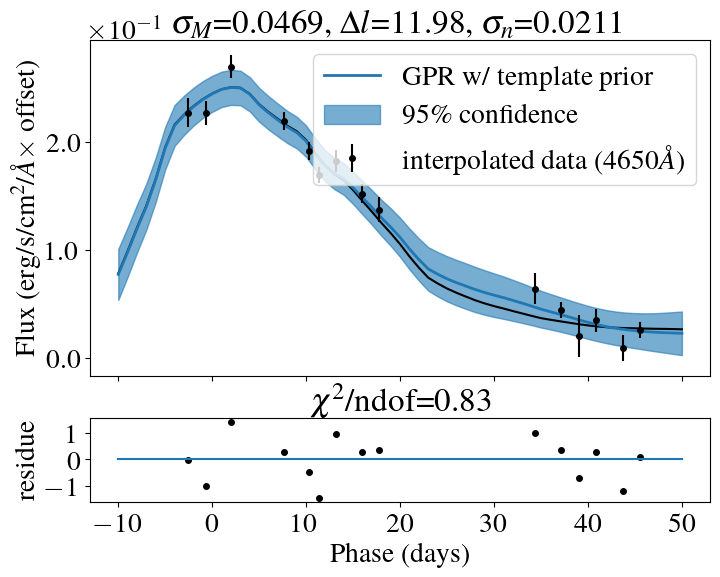

Optimization restart 1/10, f = -26.771403208441065
Optimization restart 2/10, f = -26.771403208428403
Optimization restart 3/10, f = -26.771403208439963
Optimization restart 4/10, f = -26.771403208441335
Optimization restart 5/10, f = -26.771403165358578
Optimization restart 6/10, f = -26.771403208423155
Optimization restart 7/10, f = -26.771403208401274
Optimization restart 8/10, f = -26.771403208441253
Optimization restart 9/10, f = -26.771403208440717
Optimization restart 10/10, f = -26.77140320841848


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0014064529712364512,+ve,"N(0.0014, 0.00014)"
sum.Mat52.lengthscale,12.130118718833641,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00028352811111106383,+ve,"N(0.00028, 2.8e-05)"


Optimization restart 1/10, f = -26.364966069975665
Optimization restart 2/10, f = -26.36496606887173
Optimization restart 3/10, f = -26.3649660684417
Optimization restart 4/10, f = -26.364966066889824
Optimization restart 5/10, f = -26.36496606997447
Optimization restart 6/10, f = -26.364966068300397
Optimization restart 7/10, f = -26.364966069714647
Optimization restart 8/10, f = -26.364966069958236
Optimization restart 9/10, f = -26.36496606707393
Optimization restart 10/10, f = -26.364966066373363


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0014014007734543873,+ve,"N(0.0014, 0.00014)"
sum.Mat52.lengthscale,12.086658625033426,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00028191613201795993,+ve,"N(0.00028, 2.8e-05)"


Optimization restart 1/10, f = -21.890518686161542
Optimization restart 2/10, f = -21.890518686163272
Optimization restart 3/10, f = -21.890518686037133
Optimization restart 4/10, f = -21.890518686162352
Optimization restart 5/10, f = -21.89051868616317
Optimization restart 6/10, f = -21.890518683944336
Optimization restart 7/10, f = -21.890518686131863
Optimization restart 8/10, f = -21.890518652105655
Optimization restart 9/10, f = -21.890518684967944
Optimization restart 10/10, f = -21.890518686163237


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0025103609155587574,+ve,"N(0.0025, 0.00025)"
sum.Mat52.lengthscale,12.219299181495746,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0005091852409361914,+ve,"N(0.0005, 5e-05)"


Optimization restart 1/10, f = -15.97152006804778
Optimization restart 2/10, f = -15.971514010550335
Optimization restart 3/10, f = -15.97152006832495
Optimization restart 4/10, f = -15.97152006846882
Optimization restart 5/10, f = -15.971520066426292
Optimization restart 6/10, f = -15.971520061300561
Optimization restart 7/10, f = -15.971520066944306
Optimization restart 8/10, f = -15.971520068470417
Optimization restart 9/10, f = -15.971520068469106
Optimization restart 10/10, f = -15.97152006847045


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0045129472572934355,+ve,"N(0.0045, 0.00045)"
sum.Mat52.lengthscale,12.29139998178354,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0009302915460100221,+ve,"N(0.00091, 9.1e-05)"


Optimization restart 1/10, f = -19.965306526306136
Optimization restart 2/10, f = -19.965306538327873
Optimization restart 3/10, f = -19.965306538380155
Optimization restart 4/10, f = -19.965306538379895
Optimization restart 5/10, f = -19.965306538369187
Optimization restart 6/10, f = -19.965306538378478
Optimization restart 7/10, f = -19.96530653836316
Optimization restart 8/10, f = -19.965306538380297
Optimization restart 9/10, f = -19.965306538375252
Optimization restart 10/10, f = -19.965306538252044


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004038460127095298,+ve,"N(0.0041, 0.00041)"
sum.Mat52.lengthscale,12.38475561284519,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0008221193357266086,+ve,"N(0.00081, 8.1e-05)"


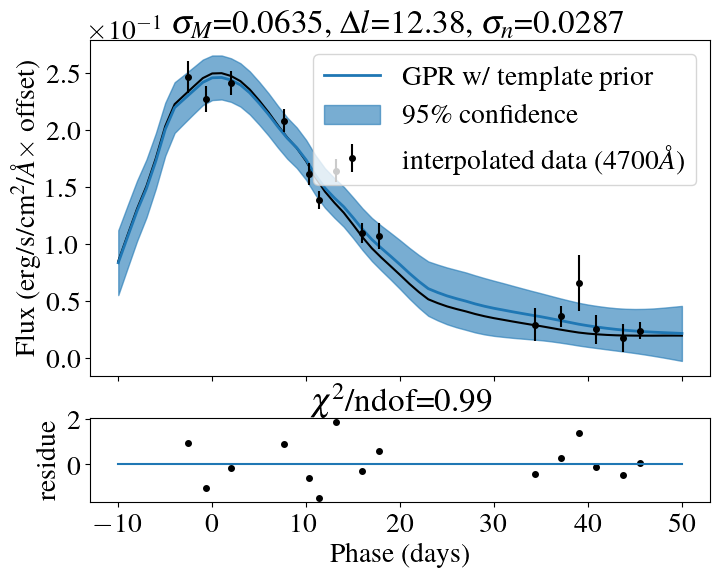

Optimization restart 1/10, f = -20.068652848044586
Optimization restart 2/10, f = -20.06865284804456
Optimization restart 3/10, f = -20.068652848044188
Optimization restart 4/10, f = -20.068652848008618
Optimization restart 5/10, f = -20.06865284804433
Optimization restart 6/10, f = -20.068652846917338
Optimization restart 7/10, f = -20.068652848028805
Optimization restart 8/10, f = -20.068652842930874
Optimization restart 9/10, f = -20.068652843620818
Optimization restart 10/10, f = -20.06865284804463


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003463497147386945,+ve,"N(0.0035, 0.00035)"
sum.Mat52.lengthscale,12.364539935104094,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0007070724694495103,+ve,"N(0.0007, 7e-05)"


Optimization restart 1/10, f = -19.7294526080388
Optimization restart 2/10, f = -19.72945260799531
Optimization restart 3/10, f = -19.729452607975688
Optimization restart 4/10, f = -19.729452607241576
Optimization restart 5/10, f = -19.729452608039207
Optimization restart 6/10, f = -19.72945260537326
Optimization restart 7/10, f = -19.729452608039225
Optimization restart 8/10, f = -19.72945260803921
Optimization restart 9/10, f = -19.729452608013354
Optimization restart 10/10, f = -19.729452608039217


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0026134006237542137,+ve,"N(0.0026, 0.00026)"
sum.Mat52.lengthscale,12.28562800166948,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0005352528946827639,+ve,"N(0.00053, 5.3e-05)"


Optimization restart 1/10, f = -23.517732794320878
Optimization restart 2/10, f = -23.51773279453449
Optimization restart 3/10, f = -23.517732794559556
Optimization restart 4/10, f = -23.517732793231797
Optimization restart 5/10, f = -23.517732794559336
Optimization restart 6/10, f = -23.517732794341164
Optimization restart 7/10, f = -23.517732794546088
Optimization restart 8/10, f = -23.517732794544393
Optimization restart 9/10, f = -23.517732794553332
Optimization restart 10/10, f = -23.517732794542574


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0018038273441241606,+ve,"N(0.0018, 0.00018)"
sum.Mat52.lengthscale,12.235263366987423,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0003646348484954552,+ve,"N(0.00036, 3.6e-05)"


Optimization restart 1/10, f = -26.572070630334295
Optimization restart 2/10, f = -26.572070630333002
Optimization restart 3/10, f = -26.57207063033025
Optimization restart 4/10, f = -26.572070630332377
Optimization restart 5/10, f = -26.572070630317118
Optimization restart 6/10, f = -26.57207063022878
Optimization restart 7/10, f = -26.572070624779922
Optimization restart 8/10, f = -26.572070630334146
Optimization restart 9/10, f = -26.57207063031992
Optimization restart 10/10, f = -26.572070630333712


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.001200779016613446,+ve,"N(0.0012, 0.00012)"
sum.Mat52.lengthscale,12.306062740354857,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00024076357781658477,+ve,"N(0.00024, 2.4e-05)"


Optimization restart 1/10, f = -23.421548023234013
Optimization restart 2/10, f = -23.42154802323398
Optimization restart 3/10, f = -23.421548023234
Optimization restart 4/10, f = -23.42154802323097
Optimization restart 5/10, f = -23.42154802323401
Optimization restart 6/10, f = -23.42154801590761
Optimization restart 7/10, f = -23.421548023234003
Optimization restart 8/10, f = -23.42154802323177
Optimization restart 9/10, f = -23.42154802105321
Optimization restart 10/10, f = -23.421548023233996


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0029692425992082533,+ve,"N(0.003, 0.0003)"
sum.Mat52.lengthscale,12.402201282227724,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0005949675076687756,+ve,"N(0.00059, 5.9e-05)"


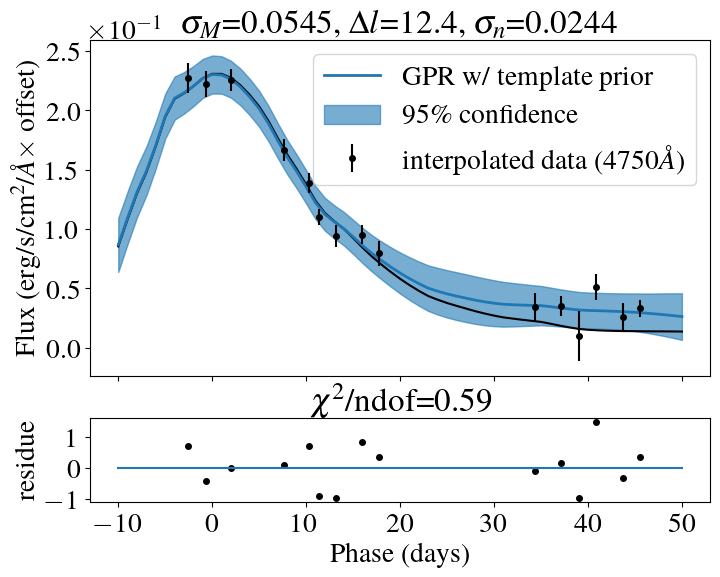

Optimization restart 1/10, f = -21.89339448622716
Optimization restart 2/10, f = -21.893394486228516
Optimization restart 3/10, f = -21.893394486229923
Optimization restart 4/10, f = -21.893394486229504
Optimization restart 5/10, f = -21.893394486230015
Optimization restart 6/10, f = -21.893394486229347
Optimization restart 7/10, f = -21.893394486229937
Optimization restart 8/10, f = -21.89339448567072
Optimization restart 9/10, f = -21.893394485382387
Optimization restart 10/10, f = -21.89339448622942


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003717051551107512,+ve,"N(0.0037, 0.00037)"
sum.Mat52.lengthscale,11.967516102431649,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0007451270549218408,+ve,"N(0.00074, 7.4e-05)"


Optimization restart 1/10, f = -22.50404872208669
Optimization restart 2/10, f = -22.504048722088882
Optimization restart 3/10, f = -22.504048722089962
Optimization restart 4/10, f = -22.504048722083603
Optimization restart 5/10, f = -22.50404872200001
Optimization restart 6/10, f = -22.50404871941582
Optimization restart 7/10, f = -22.50404872208948
Optimization restart 8/10, f = -22.5040487220899
Optimization restart 9/10, f = -22.50404872208998
Optimization restart 10/10, f = -22.50404872207158


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003365618323063104,+ve,"N(0.0033, 0.00033)"
sum.Mat52.lengthscale,12.048164684386784,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0006712848412933573,+ve,"N(0.00067, 6.7e-05)"


Optimization restart 1/10, f = -14.235064670518874
Optimization restart 2/10, f = -14.23506467051925
Optimization restart 3/10, f = -14.235064670519264
Optimization restart 4/10, f = -14.235064670372054
Optimization restart 5/10, f = -14.235064670516248
Optimization restart 6/10, f = -14.235064670519176
Optimization restart 7/10, f = -14.2350646705107
Optimization restart 8/10, f = -14.235064670482142
Optimization restart 9/10, f = -14.235064670470994
Optimization restart 10/10, f = -14.235064670518886


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.010737638519248728,+ve,"N(0.011, 0.0011)"
sum.Mat52.lengthscale,12.398260309009938,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.002138550596088419,+ve,"N(0.0021, 0.00021)"


Optimization restart 1/10, f = -21.487920041833473
Optimization restart 2/10, f = -21.48792004160717
Optimization restart 3/10, f = -21.487920041150716
Optimization restart 4/10, f = -21.487920041834148
Optimization restart 5/10, f = -21.487920002272674
Optimization restart 6/10, f = -21.48792004183307
Optimization restart 7/10, f = -21.487920041828165
Optimization restart 8/10, f = -21.487920041815922
Optimization restart 9/10, f = -21.487920039341887
Optimization restart 10/10, f = -21.48792000982896


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.002867691115822914,+ve,"N(0.0029, 0.00029)"
sum.Mat52.lengthscale,12.060612582330112,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0005740762915291552,+ve,"N(0.00057, 5.7e-05)"


Optimization restart 1/10, f = -16.060734909898947
Optimization restart 2/10, f = -16.06073490988469
Optimization restart 3/10, f = -16.06073490988829
Optimization restart 4/10, f = -16.060734909892034
Optimization restart 5/10, f = -16.060734909898926
Optimization restart 6/10, f = -16.06073490989886
Optimization restart 7/10, f = -16.060734909898944
Optimization restart 8/10, f = -16.060734909898848
Optimization restart 9/10, f = -16.060734909887984
Optimization restart 10/10, f = -16.060734908970595


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.008892966788274755,+ve,"N(0.0089, 0.00089)"
sum.Mat52.lengthscale,11.935167957211826,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0017932449019760358,+ve,"N(0.0018, 0.00018)"


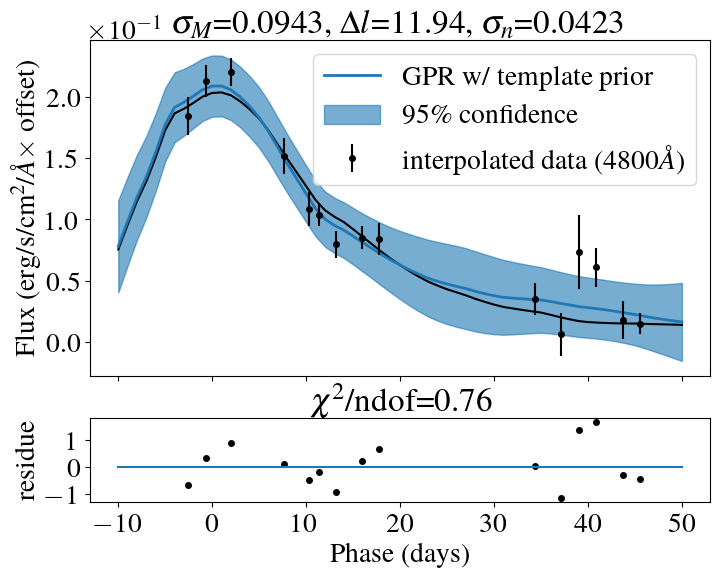

Optimization restart 1/10, f = -18.6709816786879
Optimization restart 2/10, f = -18.670981678668532
Optimization restart 3/10, f = -18.67098167868728
Optimization restart 4/10, f = -18.67098167856797
Optimization restart 5/10, f = -18.670981678687887
Optimization restart 6/10, f = -18.6709816718888
Optimization restart 7/10, f = -18.67098167868459
Optimization restart 8/10, f = -18.670981678687077
Optimization restart 9/10, f = -18.670981678057608
Optimization restart 10/10, f = -18.67098167868781


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.00533201502961754,+ve,"N(0.0053, 0.00053)"
sum.Mat52.lengthscale,11.756313831118266,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0010711382654852786,+ve,"N(0.0011, 0.00011)"


Optimization restart 1/10, f = -23.10476109038669
Optimization restart 2/10, f = -23.10476108017525
Optimization restart 3/10, f = -23.104761090399396
Optimization restart 4/10, f = -23.104761090299924
Optimization restart 5/10, f = -23.10476109026164
Optimization restart 6/10, f = -23.104761090434167
Optimization restart 7/10, f = -23.104761089342702
Optimization restart 8/10, f = -23.104761090434305
Optimization restart 9/10, f = -23.104761090434145
Optimization restart 10/10, f = -23.10476109032011


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0025403472181847212,+ve,"N(0.0025, 0.00025)"
sum.Mat52.lengthscale,11.70406704010206,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0005089918386120971,+ve,"N(0.00051, 5.1e-05)"


Optimization restart 1/10, f = -20.39617038486798
Optimization restart 2/10, f = -20.396170384858905
Optimization restart 3/10, f = -20.39617038485151
Optimization restart 4/10, f = -20.396170384867826
Optimization restart 5/10, f = -20.3961703609952
Optimization restart 6/10, f = -20.396170384867983
Optimization restart 7/10, f = -20.39617038484646
Optimization restart 8/10, f = -20.39617038486792
Optimization restart 9/10, f = -20.396170384867673
Optimization restart 10/10, f = -20.396170384867744


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0037609867184486556,+ve,"N(0.0038, 0.00038)"
sum.Mat52.lengthscale,11.80059108974074,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0007537856841086368,+ve,"N(0.00075, 7.5e-05)"


Optimization restart 1/10, f = -19.487775039956794
Optimization restart 2/10, f = -19.487775039956787
Optimization restart 3/10, f = -19.487775039937617
Optimization restart 4/10, f = -19.487775039956425
Optimization restart 5/10, f = -19.487775036227045
Optimization restart 6/10, f = -19.48777503995668
Optimization restart 7/10, f = -19.48777503995572
Optimization restart 8/10, f = -19.487775037867177
Optimization restart 9/10, f = -19.48777503991348
Optimization restart 10/10, f = -19.487775037201924


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005446370345070193,+ve,"N(0.0054, 0.00054)"
sum.Mat52.lengthscale,11.828542438474944,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0010920033630695616,+ve,"N(0.0011, 0.00011)"


Optimization restart 1/10, f = -17.96043543562349
Optimization restart 2/10, f = -17.960435435623136
Optimization restart 3/10, f = -17.960435435625392
Optimization restart 4/10, f = -17.960435427581313
Optimization restart 5/10, f = -17.960435435625396
Optimization restart 6/10, f = -17.960435435625335
Optimization restart 7/10, f = -17.960435435601113
Optimization restart 8/10, f = -17.960435435621733
Optimization restart 9/10, f = -17.96043543562515
Optimization restart 10/10, f = -17.960435435434473


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.007710597077978745,+ve,"N(0.0077, 0.00077)"
sum.Mat52.lengthscale,11.606349653974226,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0015384574528408297,+ve,"N(0.0015, 0.00015)"


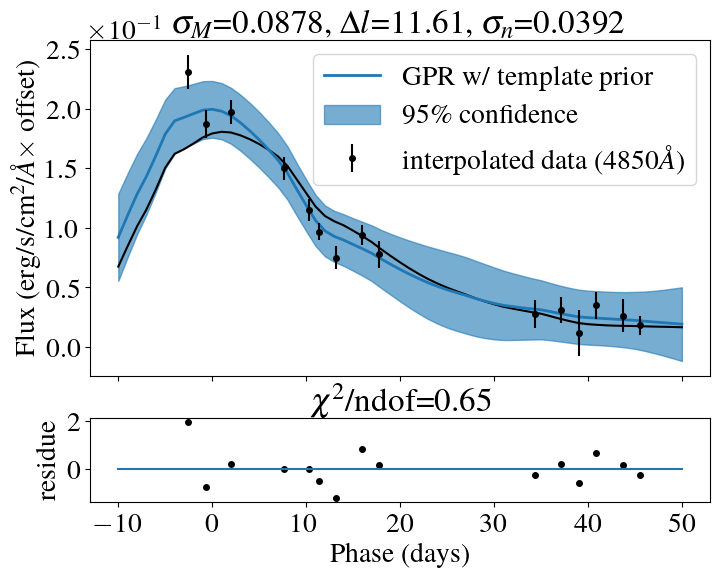

Optimization restart 1/10, f = -15.148148168497258
Optimization restart 2/10, f = -15.14814816464568
Optimization restart 3/10, f = -15.148148168465635
Optimization restart 4/10, f = -15.148148168426651
Optimization restart 5/10, f = -15.148148168496226
Optimization restart 6/10, f = -15.148148155449094
Optimization restart 7/10, f = -15.148148168454707
Optimization restart 8/10, f = -15.148148168492492
Optimization restart 9/10, f = -15.148148168490293
Optimization restart 10/10, f = -15.148148168497263


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.011679482797225735,+ve,"N(0.012, 0.0012)"
sum.Mat52.lengthscale,11.012927325914593,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0023047081839456325,+ve,"N(0.0023, 0.00023)"


Optimization restart 1/10, f = -16.07431618750224
Optimization restart 2/10, f = -16.07431618751272
Optimization restart 3/10, f = -16.07431618751179
Optimization restart 4/10, f = -16.074316187508707
Optimization restart 5/10, f = -16.07431618751373
Optimization restart 6/10, f = -16.074316187513897
Optimization restart 7/10, f = -16.074316187477926
Optimization restart 8/10, f = -16.074316186896244
Optimization restart 9/10, f = -16.074316187512352
Optimization restart 10/10, f = -16.074316187511492


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.011318158175309378,+ve,"N(0.011, 0.0011)"
sum.Mat52.lengthscale,10.985633730053154,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0022350714937955803,+ve,"N(0.0022, 0.00022)"


Optimization restart 1/10, f = -16.930278782850387
Optimization restart 2/10, f = -16.930278782877892
Optimization restart 3/10, f = -16.93027878288035
Optimization restart 4/10, f = -16.93027878287146
Optimization restart 5/10, f = -16.930278782880354
Optimization restart 6/10, f = -16.930278782880407
Optimization restart 7/10, f = -16.930278782869387
Optimization restart 8/10, f = -16.93027878287365
Optimization restart 9/10, f = -16.930278701541468
Optimization restart 10/10, f = -16.93027878288006


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.009542973603649748,+ve,"N(0.0094, 0.00094)"
sum.Mat52.lengthscale,10.657255348095788,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001888371988609148,+ve,"N(0.0019, 0.00019)"


Optimization restart 1/10, f = -15.097290647161424
Optimization restart 2/10, f = -15.097290647158879
Optimization restart 3/10, f = -15.097290647161449
Optimization restart 4/10, f = -15.09729064716141
Optimization restart 5/10, f = -15.09729064716138
Optimization restart 6/10, f = -15.097290647161408
Optimization restart 7/10, f = -15.097290647161433
Optimization restart 8/10, f = -15.09729064715777
Optimization restart 9/10, f = -15.097290647111086
Optimization restart 10/10, f = -15.097290647161401


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006891447130450785,+ve,"N(0.0068, 0.00068)"
sum.Mat52.lengthscale,9.79557433233529,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001383735764721206,+ve,"N(0.0014, 0.00014)"


Optimization restart 1/10, f = -15.440499463396245
Optimization restart 2/10, f = -15.440499463396236
Optimization restart 3/10, f = -15.440499463396247
Optimization restart 4/10, f = -15.440499463396094
Optimization restart 5/10, f = -15.440499463395488
Optimization restart 6/10, f = -15.440499463395774
Optimization restart 7/10, f = -15.440499463370681
Optimization restart 8/10, f = -15.440499463396145
Optimization restart 9/10, f = -15.440499463396216
Optimization restart 10/10, f = -15.440499463384368


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005124885940362937,+ve,"N(0.0051, 0.00051)"
sum.Mat52.lengthscale,9.90801121585034,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00103739198551221,+ve,"N(0.001, 0.0001)"


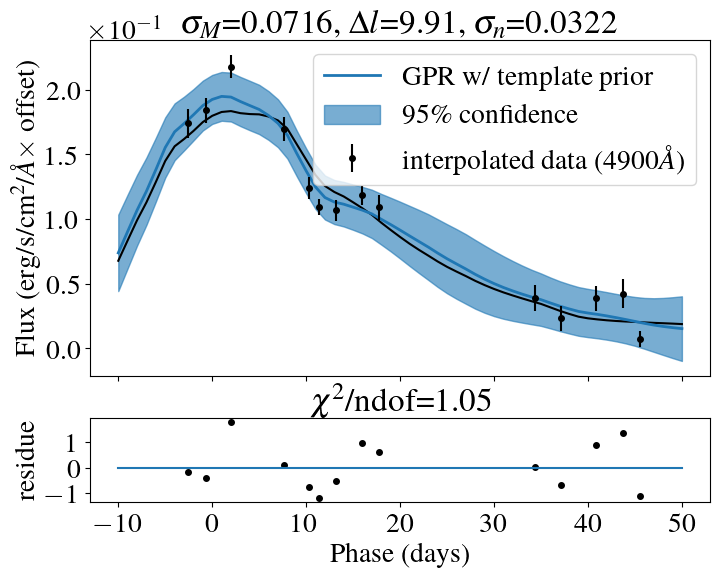

Optimization restart 1/10, f = -16.056455526484367
Optimization restart 2/10, f = -16.056455520211752
Optimization restart 3/10, f = -16.056455524369213
Optimization restart 4/10, f = -16.0564555264842
Optimization restart 5/10, f = -16.056455526466866
Optimization restart 6/10, f = -16.056455526484612
Optimization restart 7/10, f = -16.056455526482914
Optimization restart 8/10, f = -16.056455526477578
Optimization restart 9/10, f = -16.05645552646319
Optimization restart 10/10, f = -16.056455526484264


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003908002710095447,+ve,"N(0.0039, 0.00039)"
sum.Mat52.lengthscale,11.30266943950932,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0008010019206585925,+ve,"N(0.00078, 7.8e-05)"


Optimization restart 1/10, f = -18.41942089486299
Optimization restart 2/10, f = -18.419420894863137
Optimization restart 3/10, f = -18.41942088284754
Optimization restart 4/10, f = -18.419420894851676
Optimization restart 5/10, f = -18.41942089486308
Optimization restart 6/10, f = -18.419420894842347
Optimization restart 7/10, f = -18.419420894862874
Optimization restart 8/10, f = -18.419420894860956
Optimization restart 9/10, f = -18.41942089483601
Optimization restart 10/10, f = -18.419420852913873


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0036195711506316662,+ve,"N(0.0036, 0.00036)"
sum.Mat52.lengthscale,11.829737410775257,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0007408962681092365,+ve,"N(0.00073, 7.3e-05)"


Optimization restart 1/10, f = -17.949975806493082
Optimization restart 2/10, f = -17.949975806493104
Optimization restart 3/10, f = -17.94997580639842
Optimization restart 4/10, f = -17.94997580649307
Optimization restart 5/10, f = -17.949975806482286
Optimization restart 6/10, f = -17.949975806493136
Optimization restart 7/10, f = -17.949975806477156
Optimization restart 8/10, f = -17.94997580649054
Optimization restart 9/10, f = -17.949975806453683
Optimization restart 10/10, f = -17.9499758064921


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003981055533169901,+ve,"N(0.004, 0.0004)"
sum.Mat52.lengthscale,11.990732446925634,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0008146602271207574,+ve,"N(0.0008, 8e-05)"


Optimization restart 1/10, f = -14.904485451946202
Optimization restart 2/10, f = -14.90448545358015
Optimization restart 3/10, f = -14.904485443202397
Optimization restart 4/10, f = -14.90448545437092
Optimization restart 5/10, f = -14.904485454423902
Optimization restart 6/10, f = -14.904485454423034
Optimization restart 7/10, f = -14.904485454427634
Optimization restart 8/10, f = -14.904485441633732
Optimization restart 9/10, f = -14.904485454429052
Optimization restart 10/10, f = -14.904485454428574


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005482283259688236,+ve,"N(0.0055, 0.00055)"
sum.Mat52.lengthscale,12.274245581712542,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001133078751532957,+ve,"N(0.0011, 0.00011)"


Optimization restart 1/10, f = -13.139195363141784
Optimization restart 2/10, f = -13.13919536312872
Optimization restart 3/10, f = -13.139195363100717
Optimization restart 4/10, f = -13.139195363143786
Optimization restart 5/10, f = -13.139195363143804
Optimization restart 6/10, f = -13.139195363143141
Optimization restart 7/10, f = -13.139195363084784
Optimization restart 8/10, f = -13.139195363143077
Optimization restart 9/10, f = -13.139195363143466
Optimization restart 10/10, f = -13.139195363118455


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.007438251172897474,+ve,"N(0.0074, 0.00074)"
sum.Mat52.lengthscale,12.081812664338965,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001535814464360537,+ve,"N(0.0015, 0.00015)"


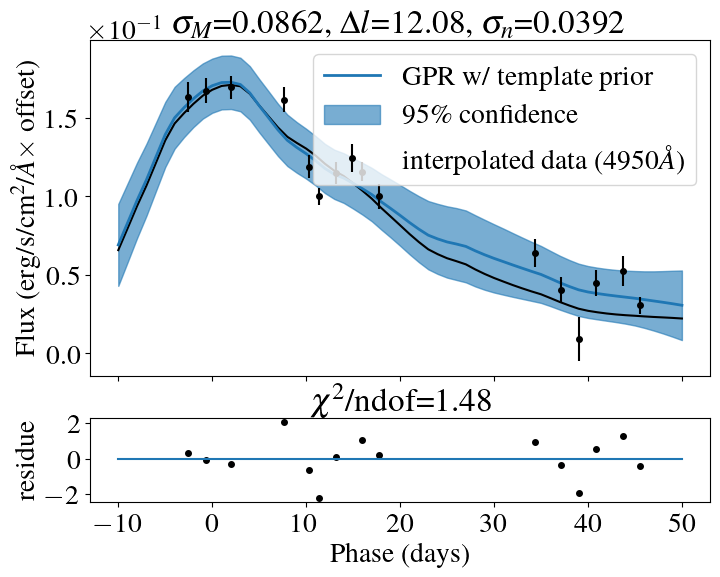

Optimization restart 1/10, f = -11.740365659794287
Optimization restart 2/10, f = -11.740365659543539
Optimization restart 3/10, f = -11.74036565979432
Optimization restart 4/10, f = -11.740365659792442
Optimization restart 5/10, f = -11.740365659793994
Optimization restart 6/10, f = -11.740365659791474
Optimization restart 7/10, f = -11.74036565971486
Optimization restart 8/10, f = -11.74036565977259
Optimization restart 9/10, f = -11.740365659789642
Optimization restart 10/10, f = -11.740365659787287


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.010029802418199566,+ve,"N(0.01, 0.001)"
sum.Mat52.lengthscale,11.414391475242548,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0020540694575640344,+ve,"N(0.002, 0.0002)"


Optimization restart 1/10, f = -17.55869492722857
Optimization restart 2/10, f = -17.558694927244687
Optimization restart 3/10, f = -17.5586949227482
Optimization restart 4/10, f = -17.5586949263596
Optimization restart 5/10, f = -17.55869492726178
Optimization restart 6/10, f = -17.55869492441994
Optimization restart 7/10, f = -17.558694927187332
Optimization restart 8/10, f = -17.558694927244275
Optimization restart 9/10, f = -17.55869492725875
Optimization restart 10/10, f = -17.558694926064256


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005417479921419549,+ve,"N(0.0054, 0.00054)"
sum.Mat52.lengthscale,11.949635574713104,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0010996197002408545,+ve,"N(0.0011, 0.00011)"


Optimization restart 1/10, f = -19.373019169046295
Optimization restart 2/10, f = -19.373019168214384
Optimization restart 3/10, f = -19.373019169159026
Optimization restart 4/10, f = -19.37301916915657
Optimization restart 5/10, f = -19.37301916915812
Optimization restart 6/10, f = -19.373019169156997
Optimization restart 7/10, f = -19.373019169159047
Optimization restart 8/10, f = -19.373019168842458
Optimization restart 9/10, f = -19.37301916913861
Optimization restart 10/10, f = -19.373019169147195


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004021359028104136,+ve,"N(0.004, 0.0004)"
sum.Mat52.lengthscale,11.857480488541416,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.000815194629782026,+ve,"N(0.0008, 8e-05)"


Optimization restart 1/10, f = -21.453790593600516
Optimization restart 2/10, f = -21.45379059359005
Optimization restart 3/10, f = -21.453790593601386
Optimization restart 4/10, f = -21.45379059356715
Optimization restart 5/10, f = -21.45379057425148
Optimization restart 6/10, f = -21.45379058744188
Optimization restart 7/10, f = -21.45379055600553
Optimization restart 8/10, f = -21.45379059354058
Optimization restart 9/10, f = -21.453790593601383
Optimization restart 10/10, f = -21.453790593601063


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0030524376065580463,+ve,"N(0.003, 0.0003)"
sum.Mat52.lengthscale,11.282613852034924,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0006162300846719134,+ve,"N(0.00061, 6.1e-05)"


Optimization restart 1/10, f = -22.8046573090734
Optimization restart 2/10, f = -22.804657309075182
Optimization restart 3/10, f = -22.80465730904711
Optimization restart 4/10, f = -22.80465730906983
Optimization restart 5/10, f = -22.804657309075242
Optimization restart 6/10, f = -22.8046573090323
Optimization restart 7/10, f = -22.804657309074877
Optimization restart 8/10, f = -22.804657307492675
Optimization restart 9/10, f = -22.80465730907535
Optimization restart 10/10, f = -22.804657309074425


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.002434288205951809,+ve,"N(0.0024, 0.00024)"
sum.Mat52.lengthscale,11.919125254776416,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0004928552850292485,+ve,"N(0.00049, 4.9e-05)"


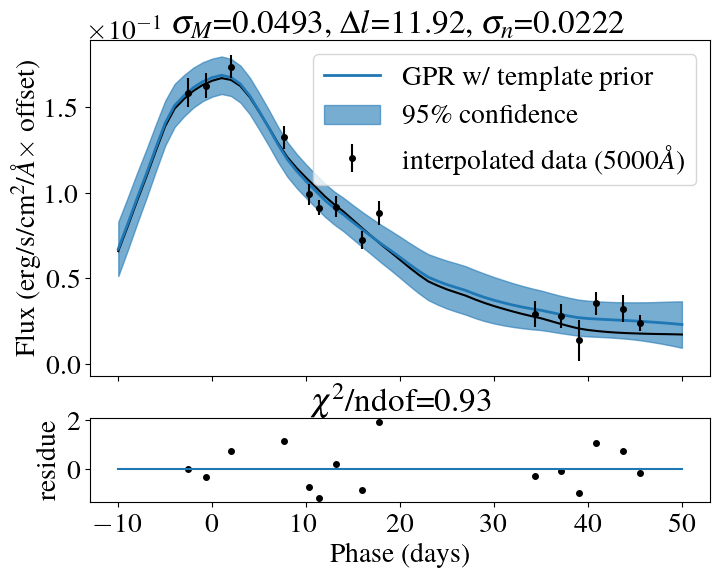

Optimization restart 1/10, f = -21.614879398123406
Optimization restart 2/10, f = -21.61487939812084
Optimization restart 3/10, f = -21.61487939812338
Optimization restart 4/10, f = -21.61487939812341
Optimization restart 5/10, f = -21.614879398112336
Optimization restart 6/10, f = -21.614879398101017
Optimization restart 7/10, f = -21.614879398122884
Optimization restart 8/10, f = -21.614879398122646
Optimization restart 9/10, f = -21.61487937856419
Optimization restart 10/10, f = -21.614879398055145


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003019753296787507,+ve,"N(0.003, 0.0003)"
sum.Mat52.lengthscale,12.065113846203355,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0006127780898164061,+ve,"N(0.0006, 6e-05)"


Optimization restart 1/10, f = -24.01973331547658
Optimization restart 2/10, f = -24.019733315460286
Optimization restart 3/10, f = -24.0197333152767
Optimization restart 4/10, f = -24.01973331547662
Optimization restart 5/10, f = -24.019733315475584
Optimization restart 6/10, f = -24.019733315444974
Optimization restart 7/10, f = -24.01973331547601
Optimization restart 8/10, f = -24.019733315476614
Optimization restart 9/10, f = -24.01973331518854
Optimization restart 10/10, f = -24.01973331539262


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.001946933692831756,+ve,"N(0.0019, 0.00019)"
sum.Mat52.lengthscale,11.945564533898098,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00039500084090633226,+ve,"N(0.00039, 3.9e-05)"


Optimization restart 1/10, f = -26.141150576937765
Optimization restart 2/10, f = -26.141150576937747
Optimization restart 3/10, f = -26.141150576928798
Optimization restart 4/10, f = -26.141150576923145
Optimization restart 5/10, f = -26.14115057693772
Optimization restart 6/10, f = -26.141150576937754
Optimization restart 7/10, f = -26.141150576937598
Optimization restart 8/10, f = -26.141150575805327
Optimization restart 9/10, f = -26.14115057693231
Optimization restart 10/10, f = -26.141150576887668


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0013440195914410295,+ve,"N(0.0013, 0.00013)"
sum.Mat52.lengthscale,11.982920341355248,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0002728588098677071,+ve,"N(0.00027, 2.7e-05)"


Optimization restart 1/10, f = -30.36618270438044
Optimization restart 2/10, f = -30.36618270428339
Optimization restart 3/10, f = -30.366182704436696
Optimization restart 4/10, f = -30.366182704437037
Optimization restart 5/10, f = -30.366182704282735
Optimization restart 6/10, f = -30.366182704435055
Optimization restart 7/10, f = -30.36618270443725
Optimization restart 8/10, f = -30.36618270443728
Optimization restart 9/10, f = -30.36618270398988
Optimization restart 10/10, f = -30.366182704435012


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0008080306932649959,+ve,"N(0.00081, 8.1e-05)"
sum.Mat52.lengthscale,12.185742175553475,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00016331810601090657,+ve,"N(0.00016, 1.6e-05)"


Optimization restart 1/10, f = -27.86147551602591
Optimization restart 2/10, f = -27.86147551602895
Optimization restart 3/10, f = -27.86147551602896
Optimization restart 4/10, f = -27.861475516020448
Optimization restart 5/10, f = -27.86147551361841
Optimization restart 6/10, f = -27.861475516026125
Optimization restart 7/10, f = -27.861475516028374
Optimization restart 8/10, f = -27.861475516028595
Optimization restart 9/10, f = -27.8614755159523
Optimization restart 10/10, f = -27.861475516028793


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.001210337331052731,+ve,"N(0.0012, 0.00012)"
sum.Mat52.lengthscale,12.119931428126842,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0002450777279645273,+ve,"N(0.00024, 2.4e-05)"


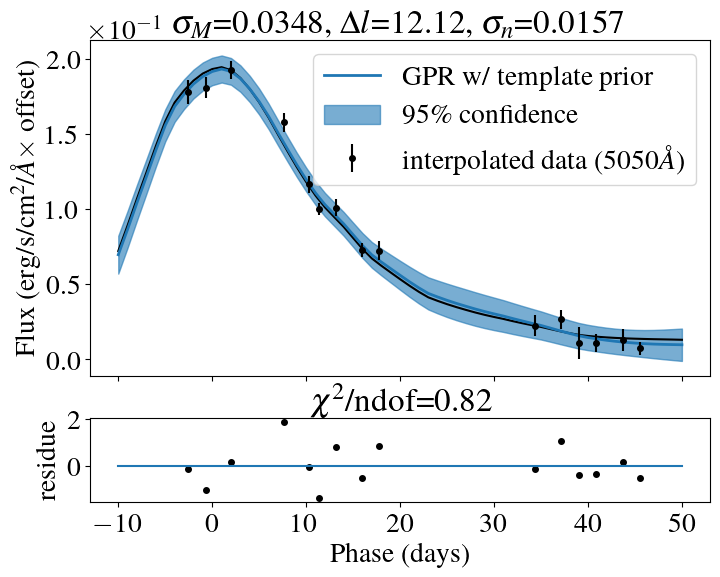

Optimization restart 1/10, f = -18.822688426608313
Optimization restart 2/10, f = -18.82268842659813
Optimization restart 3/10, f = -18.82268842660794
Optimization restart 4/10, f = -18.822688425830115
Optimization restart 5/10, f = -18.82268842656643
Optimization restart 6/10, f = -18.822688425479967
Optimization restart 7/10, f = -18.822688426603705
Optimization restart 8/10, f = -18.82268842660845
Optimization restart 9/10, f = -18.822688426608323
Optimization restart 10/10, f = -18.822688426608448


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0026916577570136302,+ve,"N(0.0027, 0.00027)"
sum.Mat52.lengthscale,11.859931649576067,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0005550528456624747,+ve,"N(0.00054, 5.4e-05)"


Optimization restart 1/10, f = -22.408091403100922
Optimization restart 2/10, f = -22.40809140310148
Optimization restart 3/10, f = -22.408091403100848
Optimization restart 4/10, f = -22.40809140308774
Optimization restart 5/10, f = -22.408091403100812
Optimization restart 6/10, f = -22.40809140310144
Optimization restart 7/10, f = -22.408091402902755
Optimization restart 8/10, f = -22.408091403099636
Optimization restart 9/10, f = -22.408091403095483
Optimization restart 10/10, f = -22.40809140310144


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0022988066798825756,+ve,"N(0.0023, 0.00023)"
sum.Mat52.lengthscale,11.987001215582461,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00047236276872364555,+ve,"N(0.00046, 4.6e-05)"


Optimization restart 1/10, f = -25.133719167037704
Optimization restart 2/10, f = -25.133719167031412
Optimization restart 3/10, f = -25.133719166837686
Optimization restart 4/10, f = -25.13371916703803
Optimization restart 5/10, f = -25.13371916701437
Optimization restart 6/10, f = -25.13371916703626
Optimization restart 7/10, f = -25.13371916703769
Optimization restart 8/10, f = -25.133719167034947
Optimization restart 9/10, f = -25.133719167037945
Optimization restart 10/10, f = -25.133719166814476


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0018728536845411612,+ve,"N(0.0019, 0.00019)"
sum.Mat52.lengthscale,11.947277368198142,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00038178337895562666,+ve,"N(0.00037, 3.7e-05)"


Optimization restart 1/10, f = -25.29241009897037
Optimization restart 2/10, f = -25.292410098920318
Optimization restart 3/10, f = -25.292410098425705
Optimization restart 4/10, f = -25.29241009853768
Optimization restart 5/10, f = -25.2924100989039
Optimization restart 6/10, f = -25.292410098941126
Optimization restart 7/10, f = -25.292410098501165
Optimization restart 8/10, f = -25.292410098969693
Optimization restart 9/10, f = -25.292410098932137
Optimization restart 10/10, f = -25.292410098959323


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0018714892323168652,+ve,"N(0.0019, 0.00019)"
sum.Mat52.lengthscale,11.937008788564714,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00038159557999456424,+ve,"N(0.00037, 3.7e-05)"


Optimization restart 1/10, f = -25.148983956077082
Optimization restart 2/10, f = -25.148983955519636
Optimization restart 3/10, f = -25.148983935801958
Optimization restart 4/10, f = -25.148983956077064
Optimization restart 5/10, f = -25.14898395607611
Optimization restart 6/10, f = -25.14898395607064
Optimization restart 7/10, f = -25.148983956077075
Optimization restart 8/10, f = -25.14898395556115
Optimization restart 9/10, f = -25.148983956077082
Optimization restart 10/10, f = -25.148983955937005


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0019363523699576072,+ve,"N(0.0019, 0.00019)"
sum.Mat52.lengthscale,12.049540828975863,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00039552861611092587,+ve,"N(0.00039, 3.9e-05)"


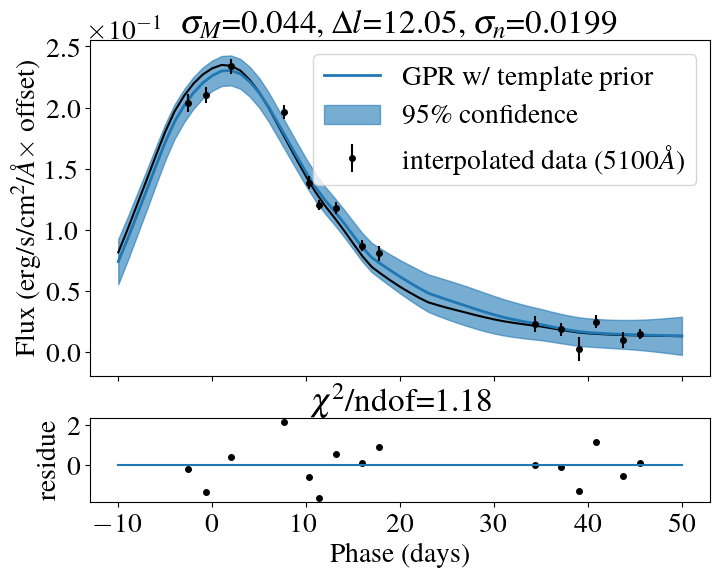

Optimization restart 1/10, f = -23.549869846830234
Optimization restart 2/10, f = -23.54986984676107
Optimization restart 3/10, f = -23.549869840857532
Optimization restart 4/10, f = -23.549869846830347
Optimization restart 5/10, f = -23.549869846827107
Optimization restart 6/10, f = -23.549869845422766
Optimization restart 7/10, f = -23.54986984682536
Optimization restart 8/10, f = -23.549869846823615
Optimization restart 9/10, f = -23.54986984680488
Optimization restart 10/10, f = -23.549869846830198


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0020689118822316533,+ve,"N(0.0021, 0.00021)"
sum.Mat52.lengthscale,11.755326093945234,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00042545683372620944,+ve,"N(0.00041, 4.1e-05)"


Optimization restart 1/10, f = -27.295677736334888
Optimization restart 2/10, f = -27.29567773654358
Optimization restart 3/10, f = -27.295677736535513
Optimization restart 4/10, f = -27.295677736541002
Optimization restart 5/10, f = -27.295677735597298
Optimization restart 6/10, f = -27.295677736543567
Optimization restart 7/10, f = -27.295677736498032
Optimization restart 8/10, f = -27.295677735659773
Optimization restart 9/10, f = -27.295677724987616
Optimization restart 10/10, f = -27.295677736543624


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0017426687386131727,+ve,"N(0.0017, 0.00017)"
sum.Mat52.lengthscale,12.01182544414201,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00035266810744857596,+ve,"N(0.00035, 3.5e-05)"


Optimization restart 1/10, f = -27.67956460387824
Optimization restart 2/10, f = -27.679564603877814
Optimization restart 3/10, f = -27.679564573794387
Optimization restart 4/10, f = -27.679564603874027
Optimization restart 5/10, f = -27.679564603857223
Optimization restart 6/10, f = -27.67956460386865
Optimization restart 7/10, f = -27.679564603808863
Optimization restart 8/10, f = -27.67956459703761
Optimization restart 9/10, f = -27.67956460387653
Optimization restart 10/10, f = -27.679564601337134


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0019676578339117017,+ve,"N(0.002, 0.0002)"
sum.Mat52.lengthscale,12.071390667715375,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00039594093389312777,+ve,"N(0.00039, 3.9e-05)"


Optimization restart 1/10, f = -26.523731505431194
Optimization restart 2/10, f = -26.523731501018343
Optimization restart 3/10, f = -26.523731505551623
Optimization restart 4/10, f = -26.52373150555993
Optimization restart 5/10, f = -26.523731505450748
Optimization restart 6/10, f = -26.5237315055492
Optimization restart 7/10, f = -26.523731505558203
Optimization restart 8/10, f = -26.52373150556001
Optimization restart 9/10, f = -26.52373150445812
Optimization restart 10/10, f = -26.523731505560022


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0021315629870321175,+ve,"N(0.0021, 0.00021)"
sum.Mat52.lengthscale,12.15072556588318,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0004309507006393508,+ve,"N(0.00042, 4.2e-05)"


Optimization restart 1/10, f = -24.53188333082407
Optimization restart 2/10, f = -24.531883330824165
Optimization restart 3/10, f = -24.531883330707863
Optimization restart 4/10, f = -24.53188333080557
Optimization restart 5/10, f = -24.531883330809677
Optimization restart 6/10, f = -24.5318833308241
Optimization restart 7/10, f = -24.531883329523424
Optimization restart 8/10, f = -24.531883330820747
Optimization restart 9/10, f = -24.53188333079406
Optimization restart 10/10, f = -24.531883329413624


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.002632843598431499,+ve,"N(0.0026, 0.00026)"
sum.Mat52.lengthscale,12.170161278639412,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.000534784941022626,+ve,"N(0.00052, 5.2e-05)"


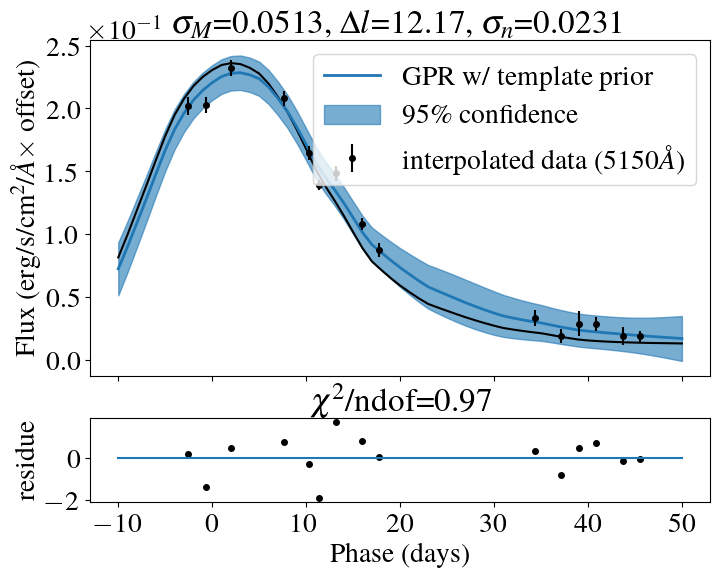

Optimization restart 1/10, f = -22.37525621336873
Optimization restart 2/10, f = -22.375256213368715
Optimization restart 3/10, f = -22.375256213306166
Optimization restart 4/10, f = -22.375256212785047
Optimization restart 5/10, f = -22.375256213349573
Optimization restart 6/10, f = -22.375256203189615
Optimization restart 7/10, f = -22.375256213355694
Optimization restart 8/10, f = -22.37525621336819
Optimization restart 9/10, f = -22.375256213368676
Optimization restart 10/10, f = -22.375256213368655


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003570083269407393,+ve,"N(0.0035, 0.00035)"
sum.Mat52.lengthscale,11.862750801917215,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0007242847316533982,+ve,"N(0.00071, 7.1e-05)"


Optimization restart 1/10, f = -22.05601921802283
Optimization restart 2/10, f = -22.056019218017234
Optimization restart 3/10, f = -22.05601921802276
Optimization restart 4/10, f = -22.05601921802124
Optimization restart 5/10, f = -22.056019218020687
Optimization restart 6/10, f = -22.05601921800799
Optimization restart 7/10, f = -22.0560083410358
Optimization restart 8/10, f = -22.056019218022417
Optimization restart 9/10, f = -22.056019218022826
Optimization restart 10/10, f = -22.05601921802282


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.002870455429256416,+ve,"N(0.0028, 0.00028)"
sum.Mat52.lengthscale,11.450479343785595,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.000586256163217042,+ve,"N(0.00057, 5.7e-05)"


Optimization restart 1/10, f = -18.43838878789265
Optimization restart 2/10, f = -18.438388786290126
Optimization restart 3/10, f = -18.438388787892833
Optimization restart 4/10, f = -18.438388787888506
Optimization restart 5/10, f = -18.438388787892265
Optimization restart 6/10, f = -18.438388783936404
Optimization restart 7/10, f = -18.438388768204458
Optimization restart 8/10, f = -18.438388787892656
Optimization restart 9/10, f = -18.438388787892755
Optimization restart 10/10, f = -18.43838878789276


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003291761855094386,+ve,"N(0.0033, 0.00033)"
sum.Mat52.lengthscale,10.675339378752474,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0006815022710546996,+ve,"N(0.00065, 6.5e-05)"


Optimization restart 1/10, f = -19.738303643517046
Optimization restart 2/10, f = -19.738303644944835
Optimization restart 3/10, f = -19.73830364499787
Optimization restart 4/10, f = -19.73830364500342
Optimization restart 5/10, f = -19.73830364500344
Optimization restart 6/10, f = -19.73830364500298
Optimization restart 7/10, f = -19.73830364496863
Optimization restart 8/10, f = -19.738303637284613
Optimization restart 9/10, f = -19.738303645003434
Optimization restart 10/10, f = -19.738303645003434


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003302509579391133,+ve,"N(0.0033, 0.00033)"
sum.Mat52.lengthscale,10.288490387257818,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0006738141046119689,+ve,"N(0.00065, 6.5e-05)"


Optimization restart 1/10, f = -19.76153763904839
Optimization restart 2/10, f = -19.761537639087887
Optimization restart 3/10, f = -19.761537639069072
Optimization restart 4/10, f = -19.76153763907922
Optimization restart 5/10, f = -19.761537639088594
Optimization restart 6/10, f = -19.76153763908484
Optimization restart 7/10, f = -19.76153763908832
Optimization restart 8/10, f = -19.761537639088218
Optimization restart 9/10, f = -19.76153763827609
Optimization restart 10/10, f = -19.761537638770818


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0036295626857348585,+ve,"N(0.0036, 0.00036)"
sum.Mat52.lengthscale,10.082969798187248,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0007332306321267795,+ve,"N(0.00071, 7.1e-05)"


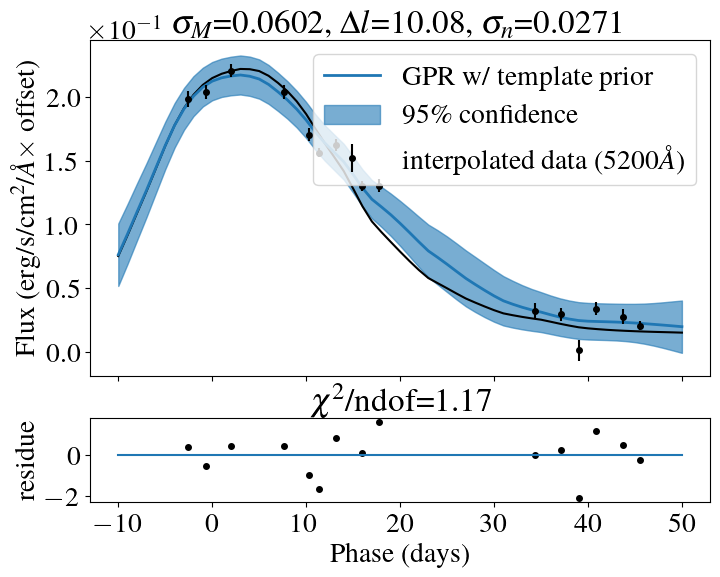

Optimization restart 1/10, f = -22.707916918756368
Optimization restart 2/10, f = -22.707916918756354
Optimization restart 3/10, f = -22.707916918756382
Optimization restart 4/10, f = -22.70791691864887
Optimization restart 5/10, f = -22.70791691875143
Optimization restart 6/10, f = -22.70791691875449
Optimization restart 7/10, f = -22.707916918544022
Optimization restart 8/10, f = -22.707916918665475
Optimization restart 9/10, f = -22.70791691862355
Optimization restart 10/10, f = -22.70791691870148


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0032843735931929394,+ve,"N(0.0032, 0.00032)"
sum.Mat52.lengthscale,10.112340794386178,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0006519489163805465,+ve,"N(0.00064, 6.4e-05)"


Optimization restart 1/10, f = -21.115705881162143
Optimization restart 2/10, f = -21.11570588116238
Optimization restart 3/10, f = -21.115705881151527
Optimization restart 4/10, f = -21.115705881162377
Optimization restart 5/10, f = -21.11570588116225
Optimization restart 6/10, f = -21.11570588116092
Optimization restart 7/10, f = -21.11570588116207
Optimization restart 8/10, f = -21.115705880834355
Optimization restart 9/10, f = -21.115705881162274
Optimization restart 10/10, f = -21.11570588116239


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0036617226640064636,+ve,"N(0.0036, 0.00036)"
sum.Mat52.lengthscale,9.751586540323752,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0007271052145285255,+ve,"N(0.00072, 7.2e-05)"


Optimization restart 1/10, f = -17.29713987682728
Optimization restart 2/10, f = -17.297139876836813
Optimization restart 3/10, f = -17.297139876837292
Optimization restart 4/10, f = -17.297139876726934
Optimization restart 5/10, f = -17.297139876836965
Optimization restart 6/10, f = -17.297139876836862
Optimization restart 7/10, f = -17.297139876835576
Optimization restart 8/10, f = -17.297139876837274
Optimization restart 9/10, f = -17.297139876837164
Optimization restart 10/10, f = -17.297139876830066


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005518628151117583,+ve,"N(0.0054, 0.00054)"
sum.Mat52.lengthscale,9.405484319674478,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001102571661305707,+ve,"N(0.0011, 0.00011)"


Optimization restart 1/10, f = -14.927653311225615
Optimization restart 2/10, f = -14.927653311226694
Optimization restart 3/10, f = -14.927653309277332
Optimization restart 4/10, f = -14.927653311039618
Optimization restart 5/10, f = -14.927653311226898
Optimization restart 6/10, f = -14.927653311199968
Optimization restart 7/10, f = -14.927653311226686
Optimization restart 8/10, f = -14.927653311226232
Optimization restart 9/10, f = -14.9276533112269
Optimization restart 10/10, f = -14.927653311226871


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006927594172173176,+ve,"N(0.0068, 0.00068)"
sum.Mat52.lengthscale,9.219072995998637,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0013887362234595592,+ve,"N(0.0014, 0.00014)"


Optimization restart 1/10, f = -13.084753171840406
Optimization restart 2/10, f = -13.084753171055961
Optimization restart 3/10, f = -13.084753171840736
Optimization restart 4/10, f = -13.084753171840797
Optimization restart 5/10, f = -13.084753171840783
Optimization restart 6/10, f = -13.084753171840626
Optimization restart 7/10, f = -13.084753171840555
Optimization restart 8/10, f = -13.08475317184074
Optimization restart 9/10, f = -13.084753171840605
Optimization restart 10/10, f = -13.08475317184013


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.00804016557066618,+ve,"N(0.0079, 0.00079)"
sum.Mat52.lengthscale,9.012027332733282,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001618605796447377,+ve,"N(0.0016, 0.00016)"


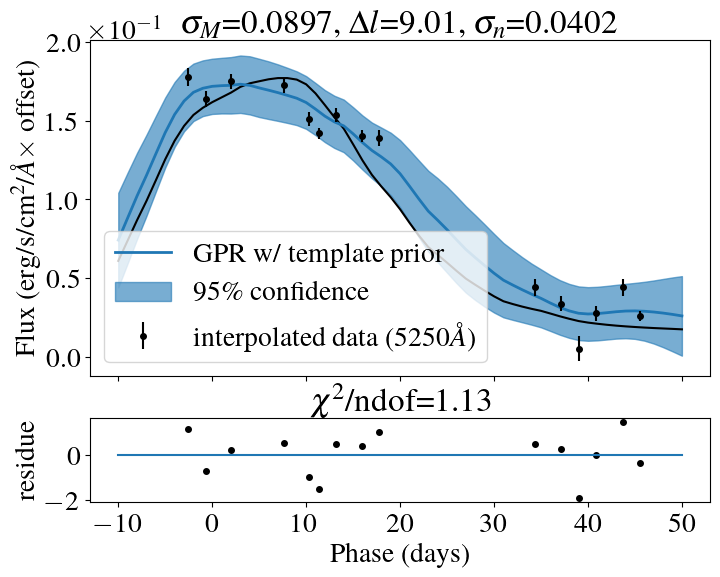

Optimization restart 1/10, f = -14.380103809076084
Optimization restart 2/10, f = -14.380103809075496
Optimization restart 3/10, f = -14.380103809075317
Optimization restart 4/10, f = -14.380103809073717
Optimization restart 5/10, f = -14.380103809076319
Optimization restart 6/10, f = -14.380103809010045
Optimization restart 7/10, f = -14.380103809052514
Optimization restart 8/10, f = -14.38010380907599
Optimization restart 9/10, f = -14.380103809039095
Optimization restart 10/10, f = -14.380103809076328


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.008284523361708838,+ve,"N(0.0081, 0.00081)"
sum.Mat52.lengthscale,8.195628015250989,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0016388075772329177,+ve,"N(0.0016, 0.00016)"


Optimization restart 1/10, f = -14.882568540976388
Optimization restart 2/10, f = -14.882568540957573
Optimization restart 3/10, f = -14.882568540976642
Optimization restart 4/10, f = -14.882568540976612
Optimization restart 5/10, f = -14.882568540976655
Optimization restart 6/10, f = -14.882568540972928
Optimization restart 7/10, f = -14.882568540976676
Optimization restart 8/10, f = -14.882568540872722
Optimization restart 9/10, f = -14.882568540976653
Optimization restart 10/10, f = -14.882568540971535


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.008410763745173763,+ve,"N(0.0082, 0.00082)"
sum.Mat52.lengthscale,7.8184156392298645,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001652527488586892,+ve,"N(0.0016, 0.00016)"


Optimization restart 1/10, f = -15.510069033226015
Optimization restart 2/10, f = -15.510069033221624
Optimization restart 3/10, f = -15.510069033220379
Optimization restart 4/10, f = -15.510069033141232
Optimization restart 5/10, f = -15.510069032391778
Optimization restart 6/10, f = -15.510069033232515
Optimization restart 7/10, f = -15.510069033061388
Optimization restart 8/10, f = -15.510069033232353
Optimization restart 9/10, f = -15.510069033125934
Optimization restart 10/10, f = -15.510069033232506


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.007389223784176085,+ve,"N(0.0072, 0.00072)"
sum.Mat52.lengthscale,8.139589607798372,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0014588915942271388,+ve,"N(0.0014, 0.00014)"


Optimization restart 1/10, f = -14.800989291988826
Optimization restart 2/10, f = -14.800989285789901
Optimization restart 3/10, f = -14.80098929197424
Optimization restart 4/10, f = -14.800989291988007
Optimization restart 5/10, f = -14.800989291988829
Optimization restart 6/10, f = -14.800989291507266
Optimization restart 7/10, f = -14.80098929198887
Optimization restart 8/10, f = -14.80098929193272
Optimization restart 9/10, f = -14.800989291988742
Optimization restart 10/10, f = -14.800989291943198


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006128786300780165,+ve,"N(0.006, 0.0006)"
sum.Mat52.lengthscale,8.430940705785185,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0012335908424489863,+ve,"N(0.0012, 0.00012)"


Optimization restart 1/10, f = -12.39797440061216
Optimization restart 2/10, f = -12.397974400611025
Optimization restart 3/10, f = -12.39797440060926
Optimization restart 4/10, f = -12.397974400608831
Optimization restart 5/10, f = -12.39797440061214
Optimization restart 6/10, f = -12.397974400581068
Optimization restart 7/10, f = -12.397974400295178
Optimization restart 8/10, f = -12.397974400612053
Optimization restart 9/10, f = -12.397974400612137
Optimization restart 10/10, f = -12.397974400612162


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005891739444548981,+ve,"N(0.0058, 0.00058)"
sum.Mat52.lengthscale,9.320204097125487,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0012251706810721998,+ve,"N(0.0012, 0.00012)"


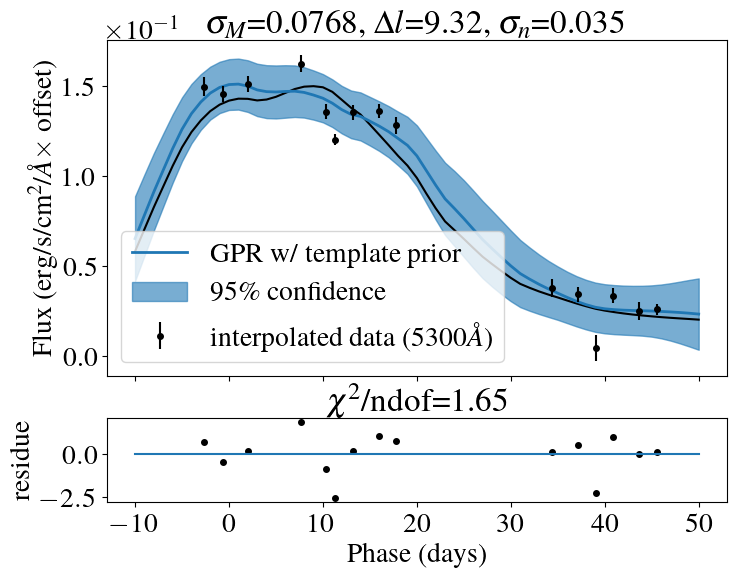

Optimization restart 1/10, f = -16.4284467544499
Optimization restart 2/10, f = -16.428446754445737
Optimization restart 3/10, f = -16.428446754449688
Optimization restart 4/10, f = -16.4284467544499
Optimization restart 5/10, f = -16.42844675444983
Optimization restart 6/10, f = -16.428446754449183
Optimization restart 7/10, f = -16.428446754449418
Optimization restart 8/10, f = -16.428446754449702
Optimization restart 9/10, f = -16.428446754449773
Optimization restart 10/10, f = -16.428446754447283


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004194743399581766,+ve,"N(0.0041, 0.00041)"
sum.Mat52.lengthscale,10.089210941958596,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0008621959476876614,+ve,"N(0.00083, 8.3e-05)"


Optimization restart 1/10, f = -19.13701849830001
Optimization restart 2/10, f = -19.13701849826727
Optimization restart 3/10, f = -19.13701849829996
Optimization restart 4/10, f = -19.137018498300023
Optimization restart 5/10, f = -19.13701849827985
Optimization restart 6/10, f = -19.137018498299664
Optimization restart 7/10, f = -19.13701849829989
Optimization restart 8/10, f = -19.137018498299813
Optimization restart 9/10, f = -19.137018498299906
Optimization restart 10/10, f = -19.137018498299746


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003548987188584419,+ve,"N(0.0035, 0.00035)"
sum.Mat52.lengthscale,10.641700950786682,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.000722360119540725,+ve,"N(0.0007, 7e-05)"


Optimization restart 1/10, f = -17.182160549022452
Optimization restart 2/10, f = -17.182160549021354
Optimization restart 3/10, f = -17.182160549022438
Optimization restart 4/10, f = -17.18216054901994
Optimization restart 5/10, f = -17.182160548267124
Optimization restart 6/10, f = -17.18216054902244
Optimization restart 7/10, f = -17.182160549022356
Optimization restart 8/10, f = -17.18216054902095
Optimization restart 9/10, f = -17.182160548756908
Optimization restart 10/10, f = -17.182160549017993


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004168737806412469,+ve,"N(0.0041, 0.00041)"
sum.Mat52.lengthscale,9.63860673668718,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0008486434802729476,+ve,"N(0.00082, 8.2e-05)"


Optimization restart 1/10, f = -16.05658055534919
Optimization restart 2/10, f = -16.05658055534804
Optimization restart 3/10, f = -16.056580555348248
Optimization restart 4/10, f = -16.056580555347814
Optimization restart 5/10, f = -16.056580555348006
Optimization restart 6/10, f = -16.05658055534868
Optimization restart 7/10, f = -16.056580555348795
Optimization restart 8/10, f = -16.056580555341093
Optimization restart 9/10, f = -16.056580555348404
Optimization restart 10/10, f = -16.056580555346578


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.00472355364608662,+ve,"N(0.0046, 0.00046)"
sum.Mat52.lengthscale,8.916724470461352,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0009613254535585016,+ve,"N(0.00093, 9.3e-05)"


Optimization restart 1/10, f = -17.674784884340653
Optimization restart 2/10, f = -17.674784884340067
Optimization restart 3/10, f = -17.67478488432628
Optimization restart 4/10, f = -17.674784884334418
Optimization restart 5/10, f = -17.67478488432858
Optimization restart 6/10, f = -17.67478488434326
Optimization restart 7/10, f = -17.674784884343268
Optimization restart 8/10, f = -17.674784884340912
Optimization restart 9/10, f = -17.674784882939953
Optimization restart 10/10, f = -17.674784884343268


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004656513127594263,+ve,"N(0.0046, 0.00046)"
sum.Mat52.lengthscale,8.688917521179716,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0009397560424666214,+ve,"N(0.00091, 9.1e-05)"


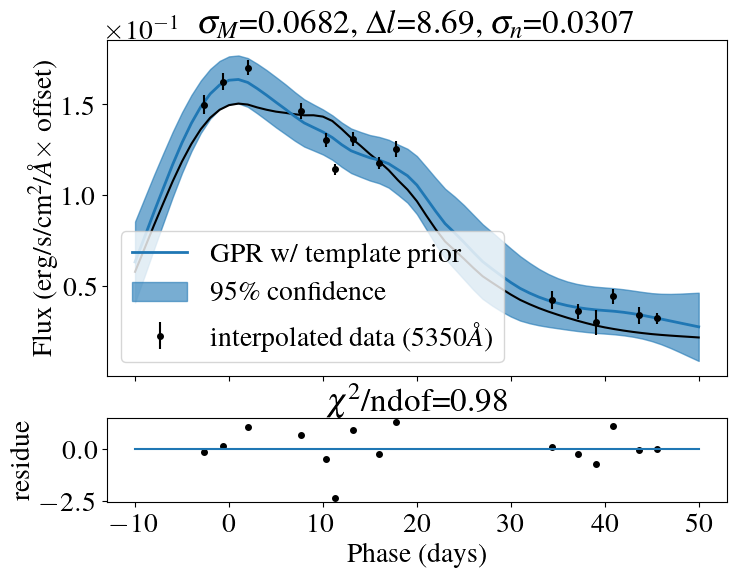

Optimization restart 1/10, f = -17.864865288205685
Optimization restart 2/10, f = -17.864865287160267
Optimization restart 3/10, f = -17.864865288178287
Optimization restart 4/10, f = -17.864865288205795
Optimization restart 5/10, f = -17.86486528819362
Optimization restart 6/10, f = -17.86486528657813
Optimization restart 7/10, f = -17.864865288205337
Optimization restart 8/10, f = -17.864865288205365
Optimization restart 9/10, f = -17.864865288190337
Optimization restart 10/10, f = -17.86486528820453


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005293213191952605,+ve,"N(0.0052, 0.00052)"
sum.Mat52.lengthscale,9.180584382112107,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0010656207997045794,+ve,"N(0.001, 0.0001)"


Optimization restart 1/10, f = -14.794591025420504
Optimization restart 2/10, f = -14.794591025422259
Optimization restart 3/10, f = -14.79459102487631
Optimization restart 4/10, f = -14.794591025413508
Optimization restart 5/10, f = -14.794591025377379
Optimization restart 6/10, f = -14.79459102541838
Optimization restart 7/10, f = -14.794591025422251
Optimization restart 8/10, f = -14.794591025422264
Optimization restart 9/10, f = -14.794590986165849
Optimization restart 10/10, f = -14.794591025420303


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.007511030555325337,+ve,"N(0.0074, 0.00074)"
sum.Mat52.lengthscale,9.825957860772307,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0015275616737703273,+ve,"N(0.0015, 0.00015)"


Optimization restart 1/10, f = -15.424882011155594
Optimization restart 2/10, f = -15.42488200903878
Optimization restart 3/10, f = -15.424882011144753
Optimization restart 4/10, f = -15.424882011155605
Optimization restart 5/10, f = -15.424882011155365
Optimization restart 6/10, f = -15.424882011155544
Optimization restart 7/10, f = -15.424882011087814
Optimization restart 8/10, f = -15.424882011106702
Optimization restart 9/10, f = -15.424882011155601
Optimization restart 10/10, f = -15.42488200974314


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.007772479508912442,+ve,"N(0.0076, 0.00076)"
sum.Mat52.lengthscale,9.66318445793923,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001574897494261858,+ve,"N(0.0015, 0.00015)"


Optimization restart 1/10, f = -15.863420225269705
Optimization restart 2/10, f = -15.863420225269548
Optimization restart 3/10, f = -15.863420225269609
Optimization restart 4/10, f = -15.863420225269346
Optimization restart 5/10, f = -15.863420225266383
Optimization restart 6/10, f = -15.863420225260297
Optimization restart 7/10, f = -15.863420225268788
Optimization restart 8/10, f = -15.8634202252685
Optimization restart 9/10, f = -15.863420222683413
Optimization restart 10/10, f = -15.863420224306727


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.008287547223351479,+ve,"N(0.0081, 0.00081)"
sum.Mat52.lengthscale,9.339644417589186,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001670568414521015,+ve,"N(0.0016, 0.00016)"


Optimization restart 1/10, f = -17.202894509185263
Optimization restart 2/10, f = -17.20289450918541
Optimization restart 3/10, f = -17.20289450918557
Optimization restart 4/10, f = -17.202894509181952
Optimization restart 5/10, f = -17.202894509183352
Optimization restart 6/10, f = -17.202894509185562
Optimization restart 7/10, f = -17.202894491072662
Optimization restart 8/10, f = -17.20289450918557
Optimization restart 9/10, f = -17.202894453491552
Optimization restart 10/10, f = -17.202894509185544


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.007467609628633121,+ve,"N(0.0073, 0.00073)"
sum.Mat52.lengthscale,9.155093194015834,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0014939321848557424,+ve,"N(0.0015, 0.00015)"


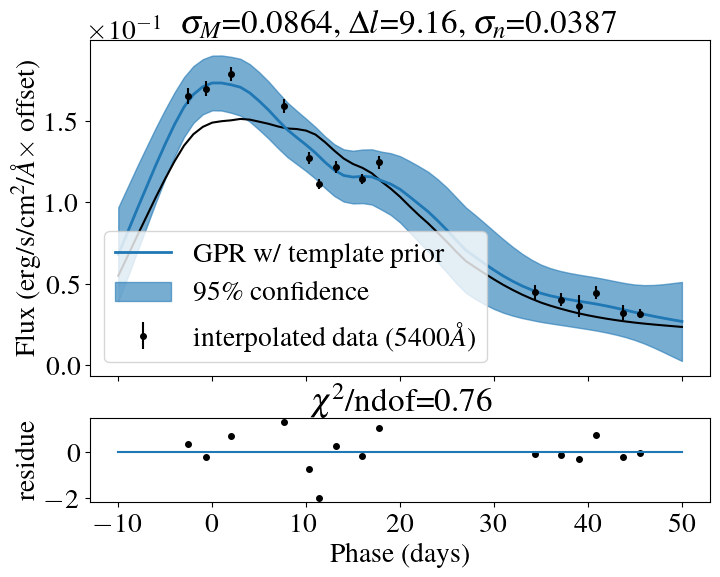

Optimization restart 1/10, f = -17.97956400969384
Optimization restart 2/10, f = -17.979564009693462
Optimization restart 3/10, f = -17.979564009693036
Optimization restart 4/10, f = -17.979564009692297
Optimization restart 5/10, f = -17.979564009692723
Optimization restart 6/10, f = -17.97956400968343
Optimization restart 7/10, f = -17.979564009689682
Optimization restart 8/10, f = -17.9795640096938
Optimization restart 9/10, f = -17.97956400954454
Optimization restart 10/10, f = -17.97956400969375


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006955765883470985,+ve,"N(0.0068, 0.00068)"
sum.Mat52.lengthscale,9.22423712479731,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0013887959807180061,+ve,"N(0.0014, 0.00014)"


Optimization restart 1/10, f = -18.534855227562957
Optimization restart 2/10, f = -18.534855227566112
Optimization restart 3/10, f = -18.534855220545428
Optimization restart 4/10, f = -18.53485522756285
Optimization restart 5/10, f = -18.534855227557966
Optimization restart 6/10, f = -18.53485522756319
Optimization restart 7/10, f = -18.534855227565696
Optimization restart 8/10, f = -18.534855226596626
Optimization restart 9/10, f = -18.534855227532795
Optimization restart 10/10, f = -18.534855227566126


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006694583057807828,+ve,"N(0.0066, 0.00066)"
sum.Mat52.lengthscale,10.226042425088703,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001345600900790505,+ve,"N(0.0013, 0.00013)"


Optimization restart 1/10, f = -17.88366278699344
Optimization restart 2/10, f = -17.88366278699575
Optimization restart 3/10, f = -17.883662786995686
Optimization restart 4/10, f = -17.883662786994208
Optimization restart 5/10, f = -17.883662786995657
Optimization restart 6/10, f = -17.88366278690867
Optimization restart 7/10, f = -17.88366278647341
Optimization restart 8/10, f = -17.883662786995735
Optimization restart 9/10, f = -17.883662784496334
Optimization restart 10/10, f = -17.883662786995693


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006802130436388195,+ve,"N(0.0067, 0.00067)"
sum.Mat52.lengthscale,10.728396651974967,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001377064877039999,+ve,"N(0.0013, 0.00013)"


Optimization restart 1/10, f = -18.04952908849426
Optimization restart 2/10, f = -18.049529088490186
Optimization restart 3/10, f = -18.04952908847833
Optimization restart 4/10, f = -18.049529088344848
Optimization restart 5/10, f = -18.04952908849608
Optimization restart 6/10, f = -18.049529088496037
Optimization restart 7/10, f = -18.049529087902812
Optimization restart 8/10, f = -18.049529088487702
Optimization restart 9/10, f = -18.049529088488928
Optimization restart 10/10, f = -18.04952905936146


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006579832534639267,+ve,"N(0.0065, 0.00065)"
sum.Mat52.lengthscale,10.70364773207179,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0013292459670711991,+ve,"N(0.0013, 0.00013)"


Optimization restart 1/10, f = -16.595642601859495
Optimization restart 2/10, f = -16.595642601865354
Optimization restart 3/10, f = -16.595642601863915
Optimization restart 4/10, f = -16.595642601865272
Optimization restart 5/10, f = -16.59564260186402
Optimization restart 6/10, f = -16.595642601618856
Optimization restart 7/10, f = -16.595642601864718
Optimization restart 8/10, f = -16.595642601861847
Optimization restart 9/10, f = -16.59564260184192
Optimization restart 10/10, f = -16.595642601865183


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.007427633457358619,+ve,"N(0.0073, 0.00073)"
sum.Mat52.lengthscale,10.838147201621448,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0015040571840843132,+ve,"N(0.0015, 0.00015)"


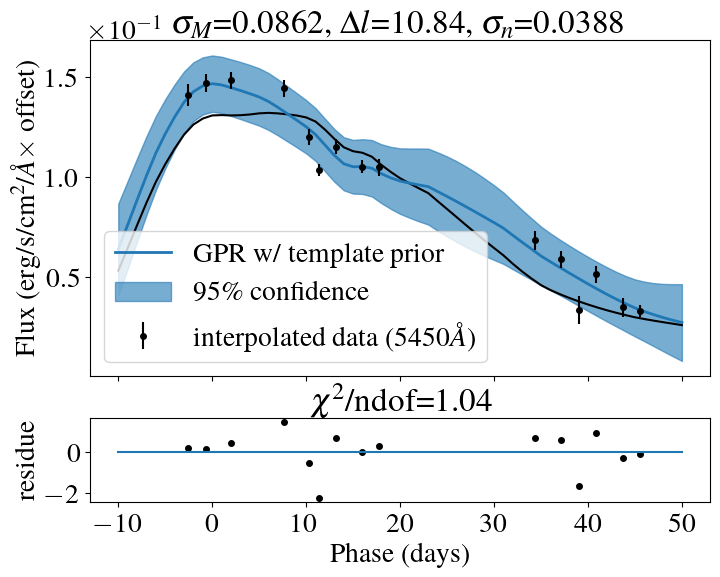

Optimization restart 1/10, f = -13.658161943700673
Optimization restart 2/10, f = -13.658161943537925
Optimization restart 3/10, f = -13.658161943700776
Optimization restart 4/10, f = -13.658161943700724
Optimization restart 5/10, f = -13.658161943657365
Optimization restart 6/10, f = -13.658161943658998
Optimization restart 7/10, f = -13.658161943698111
Optimization restart 8/10, f = -13.658161943700565
Optimization restart 9/10, f = -13.658161943700177
Optimization restart 10/10, f = -13.65816194369882


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.008787654194686313,+ve,"N(0.0087, 0.00087)"
sum.Mat52.lengthscale,11.051964207149702,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0017999425408178832,+ve,"N(0.0017, 0.00017)"


Optimization restart 1/10, f = -15.955754157022337
Optimization restart 2/10, f = -15.955754157022316
Optimization restart 3/10, f = -15.955754156810357
Optimization restart 4/10, f = -15.955754157020417
Optimization restart 5/10, f = -15.955754156879074
Optimization restart 6/10, f = -15.955754156893411
Optimization restart 7/10, f = -15.955754155975177
Optimization restart 8/10, f = -15.95575415702236
Optimization restart 9/10, f = -15.95575415702227
Optimization restart 10/10, f = -15.955754157002481


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.008338087601255744,+ve,"N(0.0082, 0.00082)"
sum.Mat52.lengthscale,11.009119869586542,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0016886094014830287,+ve,"N(0.0016, 0.00016)"


Optimization restart 1/10, f = -17.31794026986546
Optimization restart 2/10, f = -17.317940269842282
Optimization restart 3/10, f = -17.31794026910111
Optimization restart 4/10, f = -17.317940269865307
Optimization restart 5/10, f = -17.317940269843024
Optimization restart 6/10, f = -17.317940269671514
Optimization restart 7/10, f = -17.31794026986546
Optimization restart 8/10, f = -17.317940269864614
Optimization restart 9/10, f = -17.317940269850467
Optimization restart 10/10, f = -17.317940269865336


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.008208053827949953,+ve,"N(0.0081, 0.00081)"
sum.Mat52.lengthscale,11.033821093008976,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0016566005138815955,+ve,"N(0.0016, 0.00016)"


Optimization restart 1/10, f = -17.954950258236778
Optimization restart 2/10, f = -17.95495025823688
Optimization restart 3/10, f = -17.95495025823618
Optimization restart 4/10, f = -17.954950258236835
Optimization restart 5/10, f = -17.95495025823681
Optimization restart 6/10, f = -17.95495025821632
Optimization restart 7/10, f = -17.95495025823687
Optimization restart 8/10, f = -17.954950258133742
Optimization restart 9/10, f = -17.95495025817584
Optimization restart 10/10, f = -17.95495025823322


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006816977829162259,+ve,"N(0.0067, 0.00067)"
sum.Mat52.lengthscale,11.374256775459527,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0013868133928489602,+ve,"N(0.0013, 0.00013)"


Optimization restart 1/10, f = -17.153551065789024
Optimization restart 2/10, f = -17.153551065739407
Optimization restart 3/10, f = -17.15355106578901
Optimization restart 4/10, f = -17.15355106573587
Optimization restart 5/10, f = -17.153551065782718
Optimization restart 6/10, f = -17.153551065727846
Optimization restart 7/10, f = -17.153551065696043
Optimization restart 8/10, f = -17.15355106578869
Optimization restart 9/10, f = -17.15355106578872
Optimization restart 10/10, f = -17.153551065788996


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006107496599351001,+ve,"N(0.0061, 0.00061)"
sum.Mat52.lengthscale,11.456957760224984,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0012572055792549608,+ve,"N(0.0012, 0.00012)"


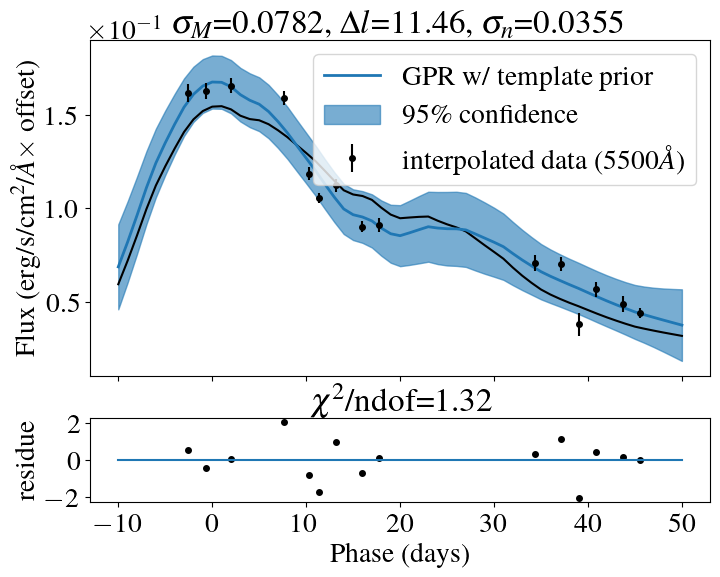

Optimization restart 1/10, f = -15.35239001741421
Optimization restart 2/10, f = -15.352390017412292
Optimization restart 3/10, f = -15.352390017100763
Optimization restart 4/10, f = -15.3523898665427
Optimization restart 5/10, f = -15.352390017411647
Optimization restart 6/10, f = -15.352390017409837
Optimization restart 7/10, f = -15.352390017411539
Optimization restart 8/10, f = -15.352390017413326
Optimization restart 9/10, f = -15.352390016647622
Optimization restart 10/10, f = -15.352390016877516


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005548201209108204,+ve,"N(0.0055, 0.00055)"
sum.Mat52.lengthscale,11.09067729005291,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0011594516107432762,+ve,"N(0.0011, 0.00011)"


Optimization restart 1/10, f = -13.947562103545762
Optimization restart 2/10, f = -13.947562103542031
Optimization restart 3/10, f = -13.947562103545762
Optimization restart 4/10, f = -13.947562103545732
Optimization restart 5/10, f = -13.947562103545682
Optimization restart 6/10, f = -13.947562103545305
Optimization restart 7/10, f = -13.947562103545675
Optimization restart 8/10, f = -13.947562103544373
Optimization restart 9/10, f = -13.947562103545625
Optimization restart 10/10, f = -13.94756210353487


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005256645875318039,+ve,"N(0.0052, 0.00052)"
sum.Mat52.lengthscale,10.603686169092125,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0011095851860920402,+ve,"N(0.001, 0.0001)"


Optimization restart 1/10, f = -17.609031205137402
Optimization restart 2/10, f = -17.60903120513751
Optimization restart 3/10, f = -17.609031205137093
Optimization restart 4/10, f = -17.609031205136365
Optimization restart 5/10, f = -17.60903120513758
Optimization restart 6/10, f = -17.609031204914324
Optimization restart 7/10, f = -17.609031205135608
Optimization restart 8/10, f = -17.609031205137416
Optimization restart 9/10, f = -17.609031205137022
Optimization restart 10/10, f = -17.609031205137562


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003916023889405177,+ve,"N(0.0039, 0.00039)"
sum.Mat52.lengthscale,10.736921071166107,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0008166948235463639,+ve,"N(0.00078, 7.8e-05)"


Optimization restart 1/10, f = -19.35576407707904
Optimization restart 2/10, f = -19.355764077079034
Optimization restart 3/10, f = -19.355764077046707
Optimization restart 4/10, f = -19.35576407707596
Optimization restart 5/10, f = -19.35576407707808
Optimization restart 6/10, f = -19.355764077073157
Optimization restart 7/10, f = -19.355764077078312
Optimization restart 8/10, f = -19.355764077079066
Optimization restart 9/10, f = -19.35576407696027
Optimization restart 10/10, f = -19.355764077067846


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003248412163509022,+ve,"N(0.0032, 0.00032)"
sum.Mat52.lengthscale,10.616721591366371,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0006741683852974189,+ve,"N(0.00064, 6.4e-05)"


Optimization restart 1/10, f = -17.742783772347778
Optimization restart 2/10, f = -17.74278377234767
Optimization restart 3/10, f = -17.742783772080344
Optimization restart 4/10, f = -17.74278377228117
Optimization restart 5/10, f = -17.742783772266115
Optimization restart 6/10, f = -17.742783772342364
Optimization restart 7/10, f = -17.742783772347742
Optimization restart 8/10, f = -17.74278377234276
Optimization restart 9/10, f = -17.742783772301983
Optimization restart 10/10, f = -17.742783772334164


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0034675535194301555,+ve,"N(0.0034, 0.00034)"
sum.Mat52.lengthscale,10.107467374740853,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0007225339909554978,+ve,"N(0.00069, 6.9e-05)"


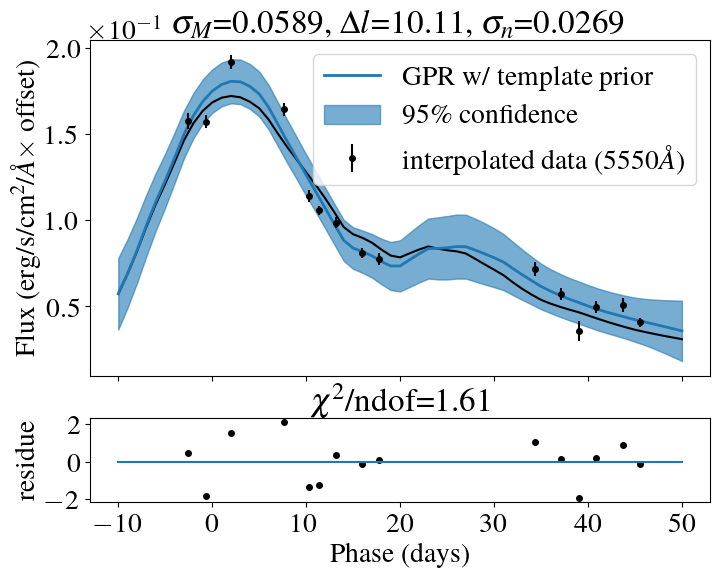

Optimization restart 1/10, f = -16.552660721145266
Optimization restart 2/10, f = -16.552660721156904
Optimization restart 3/10, f = -16.55266072115556
Optimization restart 4/10, f = -16.552660720307976
Optimization restart 5/10, f = -16.55266072115854
Optimization restart 6/10, f = -16.552660721158542
Optimization restart 7/10, f = -16.552660721158578
Optimization restart 8/10, f = -16.552660721116823
Optimization restart 9/10, f = -16.552660721048568
Optimization restart 10/10, f = -16.552660721158567


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.00374992088063547,+ve,"N(0.0037, 0.00037)"
sum.Mat52.lengthscale,8.897029109943004,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0007770212496375253,+ve,"N(0.00074, 7.4e-05)"


Optimization restart 1/10, f = -14.607748992218688
Optimization restart 2/10, f = -14.60774899222095
Optimization restart 3/10, f = -14.607748991867565
Optimization restart 4/10, f = -14.607748992220596
Optimization restart 5/10, f = -14.607748992217898
Optimization restart 6/10, f = -14.607748992206593
Optimization restart 7/10, f = -14.60774899215529
Optimization restart 8/10, f = -14.607748992220941
Optimization restart 9/10, f = -14.607748992218227
Optimization restart 10/10, f = -14.607748992206563


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004283319425260311,+ve,"N(0.0042, 0.00042)"
sum.Mat52.lengthscale,7.275519333183935,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0008815901927961047,+ve,"N(0.00084, 8.4e-05)"


Optimization restart 1/10, f = -15.090702838121564
Optimization restart 2/10, f = -15.090702838127509
Optimization restart 3/10, f = -15.090702838127214
Optimization restart 4/10, f = -15.090702838109952
Optimization restart 5/10, f = -15.090702838127068
Optimization restart 6/10, f = -15.090702838127509
Optimization restart 7/10, f = -15.090702838115256
Optimization restart 8/10, f = -15.090702838127354
Optimization restart 9/10, f = -15.090702838127529
Optimization restart 10/10, f = -15.090702838127294


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0041646711023494,+ve,"N(0.0041, 0.00041)"
sum.Mat52.lengthscale,7.900720014279162,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0008614219526381335,+ve,"N(0.00082, 8.2e-05)"


Optimization restart 1/10, f = -14.50181403413184
Optimization restart 2/10, f = -14.501814034131767
Optimization restart 3/10, f = -14.501814034127559
Optimization restart 4/10, f = -14.501814034131716
Optimization restart 5/10, f = -14.501814034131057
Optimization restart 6/10, f = -14.501814034109154
Optimization restart 7/10, f = -14.501814034131725
Optimization restart 8/10, f = -14.50181403175104
Optimization restart 9/10, f = -14.501814034130403
Optimization restart 10/10, f = -14.50181403413167


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004404610980535045,+ve,"N(0.0044, 0.00044)"
sum.Mat52.lengthscale,9.009303943348083,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0009236458079020122,+ve,"N(0.00087, 8.7e-05)"


Optimization restart 1/10, f = -15.455389877724748
Optimization restart 2/10, f = -15.455389877724734
Optimization restart 3/10, f = -15.455389877724476
Optimization restart 4/10, f = -15.455389877724688
Optimization restart 5/10, f = -15.455389877702885
Optimization restart 6/10, f = -15.455389871873642
Optimization restart 7/10, f = -15.455389877724624
Optimization restart 8/10, f = -15.455389877724723
Optimization restart 9/10, f = -15.455389877724233
Optimization restart 10/10, f = -15.455389877713342


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004411407983733913,+ve,"N(0.0044, 0.00044)"
sum.Mat52.lengthscale,9.662758123414473,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0009250323872199766,+ve,"N(0.00087, 8.7e-05)"


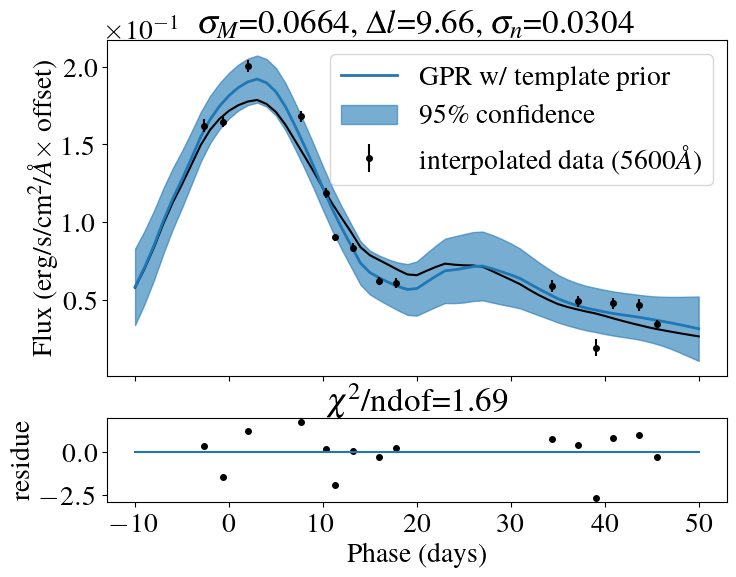

Optimization restart 1/10, f = -16.139421854400673
Optimization restart 2/10, f = -16.139421854400673
Optimization restart 3/10, f = -16.13942185440067
Optimization restart 4/10, f = -16.139421854400613
Optimization restart 5/10, f = -16.13942185437441
Optimization restart 6/10, f = -16.139421854400616
Optimization restart 7/10, f = -16.13942185438896
Optimization restart 8/10, f = -16.139421854390427
Optimization restart 9/10, f = -16.139421854400638
Optimization restart 10/10, f = -16.139421854393994


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004490086160816054,+ve,"N(0.0044, 0.00044)"
sum.Mat52.lengthscale,10.058433680315357,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0009402862681506018,+ve,"N(0.00089, 8.9e-05)"


Optimization restart 1/10, f = -19.091714867471165
Optimization restart 2/10, f = -19.091714867471097
Optimization restart 3/10, f = -19.09171486747114
Optimization restart 4/10, f = -19.091714867467427
Optimization restart 5/10, f = -19.091714867470163
Optimization restart 6/10, f = -19.091714867454463
Optimization restart 7/10, f = -19.091714867471055
Optimization restart 8/10, f = -19.09171485936163
Optimization restart 9/10, f = -19.091714858793747
Optimization restart 10/10, f = -19.091714867470472


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003459002536601811,+ve,"N(0.0034, 0.00034)"
sum.Mat52.lengthscale,9.833751591591007,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0007157183789541527,+ve,"N(0.00068, 6.8e-05)"


Optimization restart 1/10, f = -20.80586484369353
Optimization restart 2/10, f = -20.805864843693705
Optimization restart 3/10, f = -20.805864843693975
Optimization restart 4/10, f = -20.80586484369056
Optimization restart 5/10, f = -20.805864842797142
Optimization restart 6/10, f = -20.805864841080982
Optimization restart 7/10, f = -20.80586484366068
Optimization restart 8/10, f = -20.8058648436942
Optimization restart 9/10, f = -20.80586484369177
Optimization restart 10/10, f = -20.805864843640627


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0028114155069555945,+ve,"N(0.0028, 0.00028)"
sum.Mat52.lengthscale,9.683831387615584,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0005791130738638635,+ve,"N(0.00056, 5.6e-05)"


Optimization restart 1/10, f = -21.784954509516613
Optimization restart 2/10, f = -21.784954509412948
Optimization restart 3/10, f = -21.784954509452255
Optimization restart 4/10, f = -21.784954509517302
Optimization restart 5/10, f = -21.784954509517707
Optimization restart 6/10, f = -21.78495450951776
Optimization restart 7/10, f = -21.784954509517707
Optimization restart 8/10, f = -21.78495450949118
Optimization restart 9/10, f = -21.784954509510786
Optimization restart 10/10, f = -21.784954509506477


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0021532279480221714,+ve,"N(0.0021, 0.00021)"
sum.Mat52.lengthscale,9.200020361264889,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0004426150372239429,+ve,"N(0.00043, 4.3e-05)"


Optimization restart 1/10, f = -21.99461884601968
Optimization restart 2/10, f = -21.994618846100238
Optimization restart 3/10, f = -21.994618843854717
Optimization restart 4/10, f = -21.994618846102604
Optimization restart 5/10, f = -21.994618846102497
Optimization restart 6/10, f = -21.994618846102462
Optimization restart 7/10, f = -21.99461884608032
Optimization restart 8/10, f = -21.994618846102576
Optimization restart 9/10, f = -21.994618846102476
Optimization restart 10/10, f = -21.994618846100334


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0018404726032872456,+ve,"N(0.0018, 0.00018)"
sum.Mat52.lengthscale,9.513142627626355,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00038079906958648374,+ve,"N(0.00036, 3.6e-05)"


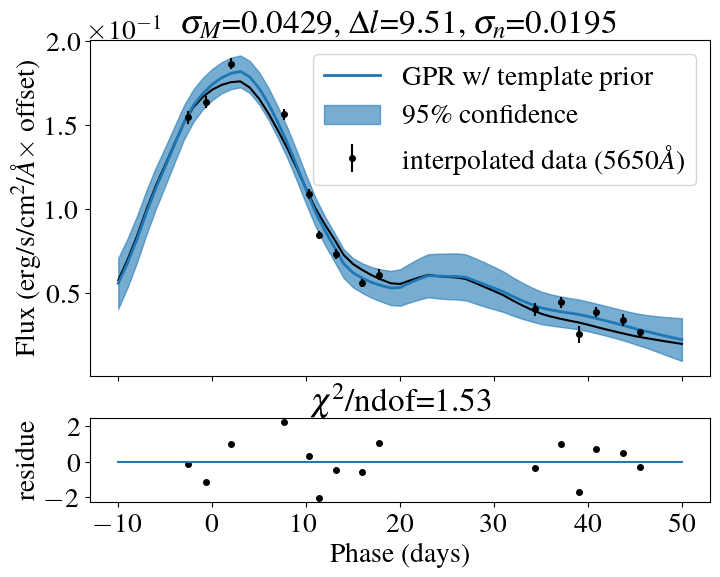

Optimization restart 1/10, f = -24.285819008181996
Optimization restart 2/10, f = -24.28581900818268
Optimization restart 3/10, f = -24.285819007868497
Optimization restart 4/10, f = -24.28581900817114
Optimization restart 5/10, f = -24.285819008182017
Optimization restart 6/10, f = -24.285819008182024
Optimization restart 7/10, f = -24.285819008182663
Optimization restart 8/10, f = -24.285819008170282
Optimization restart 9/10, f = -24.285819008182493
Optimization restart 10/10, f = -24.285819008182635


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0016491727387402781,+ve,"N(0.0016, 0.00016)"
sum.Mat52.lengthscale,10.746689166951413,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0003402764216258289,+ve,"N(0.00033, 3.3e-05)"


Optimization restart 1/10, f = -25.314396797979207
Optimization restart 2/10, f = -25.314396797917077
Optimization restart 3/10, f = -25.314396797922857
Optimization restart 4/10, f = -25.314396797973107
Optimization restart 5/10, f = -25.314396798003315
Optimization restart 6/10, f = -25.314396798007138
Optimization restart 7/10, f = -25.314396797956988
Optimization restart 8/10, f = -25.31439679800832
Optimization restart 9/10, f = -25.314396798000367
Optimization restart 10/10, f = -25.314396798009476


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.001649620197299926,+ve,"N(0.0016, 0.00016)"
sum.Mat52.lengthscale,10.826124346342864,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00033808884217020364,+ve,"N(0.00033, 3.3e-05)"


Optimization restart 1/10, f = -25.475748153799234
Optimization restart 2/10, f = -25.475748156434122
Optimization restart 3/10, f = -25.475748156431173
Optimization restart 4/10, f = -25.47574811144137
Optimization restart 5/10, f = -25.475748156412
Optimization restart 6/10, f = -25.47574815643398
Optimization restart 7/10, f = -25.475748156432527
Optimization restart 8/10, f = -25.475748156430537
Optimization restart 9/10, f = -25.475748156434108
Optimization restart 10/10, f = -25.47574815451437


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0016332317409027746,+ve,"N(0.0016, 0.00016)"
sum.Mat52.lengthscale,10.392313408323885,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0003338876232573214,+ve,"N(0.00032, 3.2e-05)"


Optimization restart 1/10, f = -26.15802626758198
Optimization restart 2/10, f = -26.15802626187502
Optimization restart 3/10, f = -26.158026267771856
Optimization restart 4/10, f = -26.158026267307434
Optimization restart 5/10, f = -26.15802626774054
Optimization restart 6/10, f = -26.158026267771874
Optimization restart 7/10, f = -26.158026267743438
Optimization restart 8/10, f = -26.158026267768754
Optimization restart 9/10, f = -26.158026267548497
Optimization restart 10/10, f = -26.15802626774433


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.001700692718861995,+ve,"N(0.0017, 0.00017)"
sum.Mat52.lengthscale,10.567044625178896,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0003465890772810279,+ve,"N(0.00034, 3.4e-05)"


Optimization restart 1/10, f = -25.918796584909614
Optimization restart 2/10, f = -25.918796584917917
Optimization restart 3/10, f = -25.91879658491802
Optimization restart 4/10, f = -25.918796584917178
Optimization restart 5/10, f = -25.91879658491812
Optimization restart 6/10, f = -25.918796584918894
Optimization restart 7/10, f = -25.91879658349748
Optimization restart 8/10, f = -25.918796584917743
Optimization restart 9/10, f = -25.918796584919033
Optimization restart 10/10, f = -25.918796584917743


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.002203836497023106,+ve,"N(0.0022, 0.00022)"
sum.Mat52.lengthscale,11.17940109511856,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0004480245511843349,+ve,"N(0.00044, 4.4e-05)"


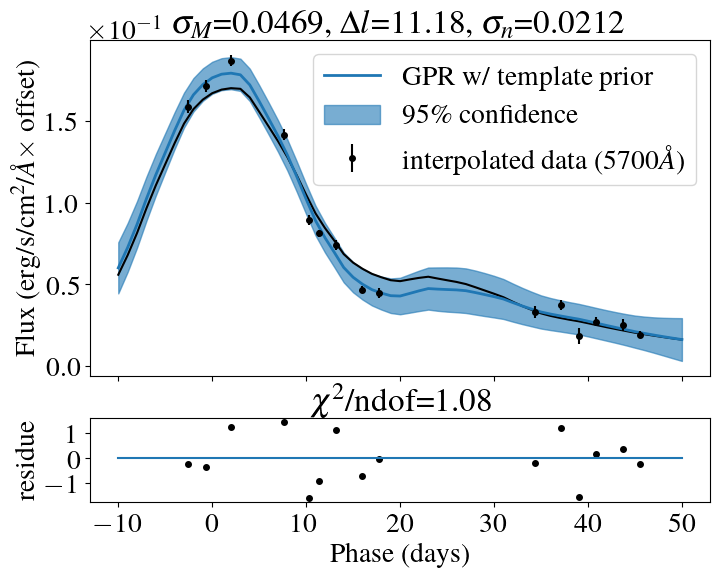

Optimization restart 1/10, f = -25.62257572603619
Optimization restart 2/10, f = -25.62257572603498
Optimization restart 3/10, f = -25.622575726030462
Optimization restart 4/10, f = -25.622575725902777
Optimization restart 5/10, f = -25.62257572603638
Optimization restart 6/10, f = -25.622575726030043
Optimization restart 7/10, f = -25.622575726035226
Optimization restart 8/10, f = -25.622575726034658
Optimization restart 9/10, f = -25.62257572603574
Optimization restart 10/10, f = -25.62257572603223


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.002100916633724284,+ve,"N(0.0021, 0.00021)"
sum.Mat52.lengthscale,11.159493163268381,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0004282569978874851,+ve,"N(0.00042, 4.2e-05)"


Optimization restart 1/10, f = -23.847927408738137
Optimization restart 2/10, f = -23.84792740870727
Optimization restart 3/10, f = -23.847927408738293
Optimization restart 4/10, f = -23.847927392817155
Optimization restart 5/10, f = -23.847927408738343
Optimization restart 6/10, f = -23.84792740651453
Optimization restart 7/10, f = -23.84792740873832
Optimization restart 8/10, f = -23.84792740833684
Optimization restart 9/10, f = -23.847927408738347
Optimization restart 10/10, f = -23.847927408737817


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0020004172189129698,+ve,"N(0.002, 0.0002)"
sum.Mat52.lengthscale,10.820324847473058,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0004117472968535495,+ve,"N(0.0004, 4e-05)"


Optimization restart 1/10, f = -24.713582589931963
Optimization restart 2/10, f = -24.71358258993194
Optimization restart 3/10, f = -24.713582589914843
Optimization restart 4/10, f = -24.713582489010726
Optimization restart 5/10, f = -24.713582589914992
Optimization restart 6/10, f = -24.713582589932024
Optimization restart 7/10, f = -24.71358258993115
Optimization restart 8/10, f = -24.713582589930425
Optimization restart 9/10, f = -24.71358258989536
Optimization restart 10/10, f = -24.71358258993218


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0015693260201914891,+ve,"N(0.0016, 0.00016)"
sum.Mat52.lengthscale,10.571755499148114,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00032363957406465597,+ve,"N(0.00031, 3.1e-05)"


Optimization restart 1/10, f = -22.122815229555506
Optimization restart 2/10, f = -22.12281522955636
Optimization restart 3/10, f = -22.1228152295565
Optimization restart 4/10, f = -22.12281522955482
Optimization restart 5/10, f = -22.122815229556483
Optimization restart 6/10, f = -22.122815229534943
Optimization restart 7/10, f = -22.122815229556245
Optimization restart 8/10, f = -22.122815229554845
Optimization restart 9/10, f = -22.122815229525287
Optimization restart 10/10, f = -22.122815229556345


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0016421073166493112,+ve,"N(0.0016, 0.00016)"
sum.Mat52.lengthscale,10.047532449699208,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0003434035667451032,+ve,"N(0.00033, 3.3e-05)"


Optimization restart 1/10, f = -20.76093655910911
Optimization restart 2/10, f = -20.760936559093132
Optimization restart 3/10, f = -20.76093655910926
Optimization restart 4/10, f = -20.760936559103946
Optimization restart 5/10, f = -20.76093655900545
Optimization restart 6/10, f = -20.76093655910483
Optimization restart 7/10, f = -20.76093655910839
Optimization restart 8/10, f = -20.760936559093842
Optimization restart 9/10, f = -20.76093655909807
Optimization restart 10/10, f = -20.760936559104287


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0015913072759916565,+ve,"N(0.0016, 0.00016)"
sum.Mat52.lengthscale,11.178678345800625,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0003384953666859326,+ve,"N(0.00032, 3.2e-05)"


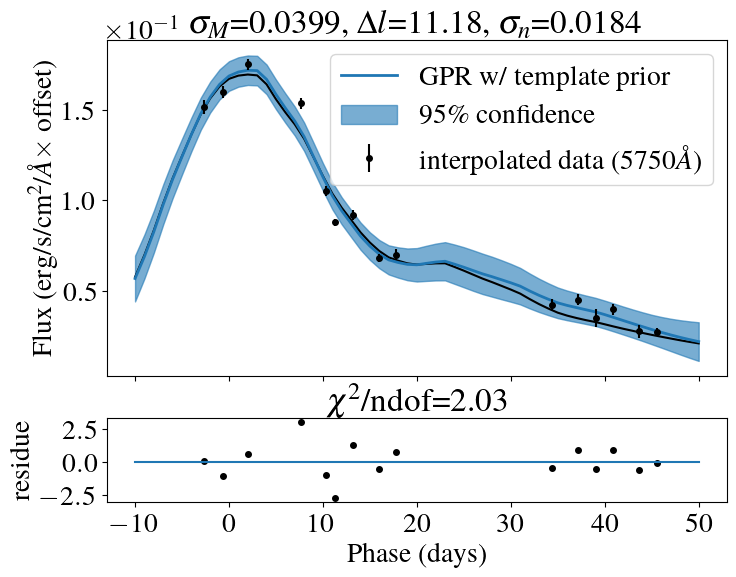

Optimization restart 1/10, f = -18.83434256962057
Optimization restart 2/10, f = -18.834342561119783
Optimization restart 3/10, f = -18.834342569620254
Optimization restart 4/10, f = -18.83434256962055
Optimization restart 5/10, f = -18.834342569620002
Optimization restart 6/10, f = -18.83434256962041
Optimization restart 7/10, f = -18.83434256945822
Optimization restart 8/10, f = -18.83434256958887
Optimization restart 9/10, f = -18.834342569617167
Optimization restart 10/10, f = -18.834342569620496


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.00179603769902012,+ve,"N(0.0018, 0.00018)"
sum.Mat52.lengthscale,11.889216228437693,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0003867616598215435,+ve,"N(0.00036, 3.6e-05)"


Optimization restart 1/10, f = -20.456065981439743
Optimization restart 2/10, f = -20.45606598143967
Optimization restart 3/10, f = -20.45606598055047
Optimization restart 4/10, f = -20.456065981439767
Optimization restart 5/10, f = -20.456065981436
Optimization restart 6/10, f = -20.456065978497797
Optimization restart 7/10, f = -20.456065969270025
Optimization restart 8/10, f = -20.456065981437668
Optimization restart 9/10, f = -20.45606597464691
Optimization restart 10/10, f = -20.456065980750218


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0016812706760087916,+ve,"N(0.0017, 0.00017)"
sum.Mat52.lengthscale,12.30282776040546,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00035865936129986757,+ve,"N(0.00034, 3.4e-05)"


Optimization restart 1/10, f = -19.75794956691501
Optimization restart 2/10, f = -19.757949566915045
Optimization restart 3/10, f = -19.757949566915087
Optimization restart 4/10, f = -19.757949566915094
Optimization restart 5/10, f = -19.75794956691317
Optimization restart 6/10, f = -19.75794956455673
Optimization restart 7/10, f = -19.757949566914817
Optimization restart 8/10, f = -19.75794956688066
Optimization restart 9/10, f = -19.75794956691508
Optimization restart 10/10, f = -19.75794956691486


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.002091573563505092,+ve,"N(0.0021, 0.00021)"
sum.Mat52.lengthscale,12.377845358470244,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0004438354198308263,+ve,"N(0.00042, 4.2e-05)"


Optimization restart 1/10, f = -18.617007048272505
Optimization restart 2/10, f = -18.61700704827113
Optimization restart 3/10, f = -18.61700704827123
Optimization restart 4/10, f = -18.617007048272413
Optimization restart 5/10, f = -18.61700704825926
Optimization restart 6/10, f = -18.617007048257026
Optimization restart 7/10, f = -18.61700703520556
Optimization restart 8/10, f = -18.61700704826894
Optimization restart 9/10, f = -18.617005013009347
Optimization restart 10/10, f = -18.617007048272512


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.002285934814462651,+ve,"N(0.0023, 0.00023)"
sum.Mat52.lengthscale,12.100004291332674,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00048726146498964397,+ve,"N(0.00046, 4.6e-05)"


Optimization restart 1/10, f = -16.807820075308314
Optimization restart 2/10, f = -16.807820075391582
Optimization restart 3/10, f = -16.80782007542111
Optimization restart 4/10, f = -16.807820075414227
Optimization restart 5/10, f = -16.80782007543243
Optimization restart 6/10, f = -16.807820075373883
Optimization restart 7/10, f = -16.807820075398194
Optimization restart 8/10, f = -16.807820075427458
Optimization restart 9/10, f = -16.807820075432396
Optimization restart 10/10, f = -16.80782007543101


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.002775594067249565,+ve,"N(0.0028, 0.00028)"
sum.Mat52.lengthscale,11.749492765158065,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0005947261889573514,+ve,"N(0.00055, 5.5e-05)"


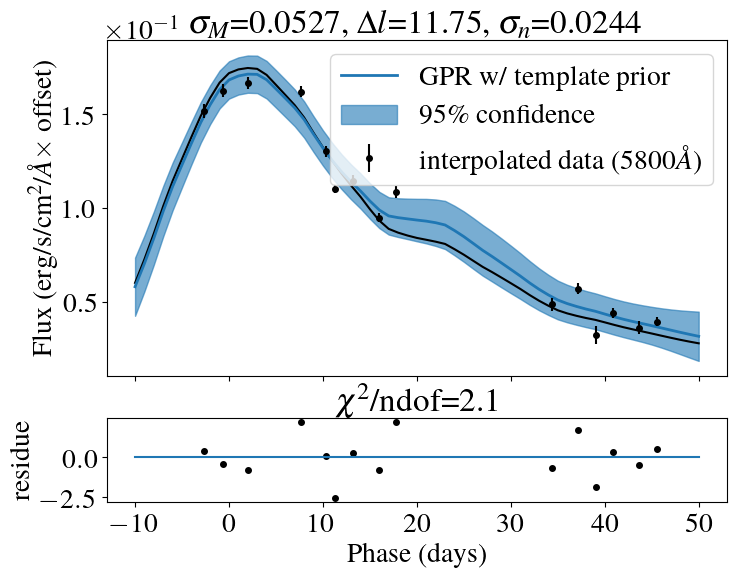

Optimization restart 1/10, f = -19.76981654097303
Optimization restart 2/10, f = -19.769816540972972
Optimization restart 3/10, f = -19.76981654065165
Optimization restart 4/10, f = -19.769816540972855
Optimization restart 5/10, f = -19.769816540945353
Optimization restart 6/10, f = -19.769816540961806
Optimization restart 7/10, f = -19.769816540972965
Optimization restart 8/10, f = -19.769816540973046
Optimization restart 9/10, f = -19.769816540973032
Optimization restart 10/10, f = -19.769816540966655


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0024184470732132087,+ve,"N(0.0024, 0.00024)"
sum.Mat52.lengthscale,11.038579746302883,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0005070722565272319,+ve,"N(0.00048, 4.8e-05)"


Optimization restart 1/10, f = -19.30051696693505
Optimization restart 2/10, f = -19.300516966913797
Optimization restart 3/10, f = -19.30051696693512
Optimization restart 4/10, f = -19.300516966935085
Optimization restart 5/10, f = -19.30051696692816
Optimization restart 6/10, f = -19.30051696693227
Optimization restart 7/10, f = -19.30051696487036
Optimization restart 8/10, f = -19.30051696693512
Optimization restart 9/10, f = -19.300516966934932
Optimization restart 10/10, f = -19.300516966834568


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0026619337745665554,+ve,"N(0.0026, 0.00026)"
sum.Mat52.lengthscale,10.531827318381398,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0005559271941654837,+ve,"N(0.00053, 5.3e-05)"


Optimization restart 1/10, f = -18.725044283694146
Optimization restart 2/10, f = -18.725044283375407
Optimization restart 3/10, f = -18.72504428369319
Optimization restart 4/10, f = -18.725044283694142
Optimization restart 5/10, f = -18.72504428369004
Optimization restart 6/10, f = -18.725044283582992
Optimization restart 7/10, f = -18.725044283693954
Optimization restart 8/10, f = -18.725044283694146
Optimization restart 9/10, f = -18.72504428369386
Optimization restart 10/10, f = -18.72504428369108


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.002960329530612244,+ve,"N(0.0029, 0.00029)"
sum.Mat52.lengthscale,10.955199290913681,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0006203780985439833,+ve,"N(0.00059, 5.9e-05)"


Optimization restart 1/10, f = -17.30194897495899
Optimization restart 2/10, f = -17.30194897221024
Optimization restart 3/10, f = -17.30194897390718
Optimization restart 4/10, f = -17.301948974958776
Optimization restart 5/10, f = -17.301948974675327
Optimization restart 6/10, f = -17.30194891404664
Optimization restart 7/10, f = -17.30194897485588
Optimization restart 8/10, f = -17.301948974958435
Optimization restart 9/10, f = -17.30194897495866
Optimization restart 10/10, f = -17.301948974958982


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0037804240393429925,+ve,"N(0.0038, 0.00038)"
sum.Mat52.lengthscale,11.233683566630576,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0007944074990326191,+ve,"N(0.00075, 7.5e-05)"


Optimization restart 1/10, f = -16.532980876659202
Optimization restart 2/10, f = -16.532980873264158
Optimization restart 3/10, f = -16.53298087665773
Optimization restart 4/10, f = -16.532980876636515
Optimization restart 5/10, f = -16.532980876641094
Optimization restart 6/10, f = -16.532980876656225
Optimization restart 7/10, f = -16.53298087665894
Optimization restart 8/10, f = -16.532980876652484
Optimization restart 9/10, f = -16.532980876220005
Optimization restart 10/10, f = -16.532980875089045


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003475878765200884,+ve,"N(0.0035, 0.00035)"
sum.Mat52.lengthscale,11.346179014630211,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0007379843971272459,+ve,"N(0.00069, 6.9e-05)"


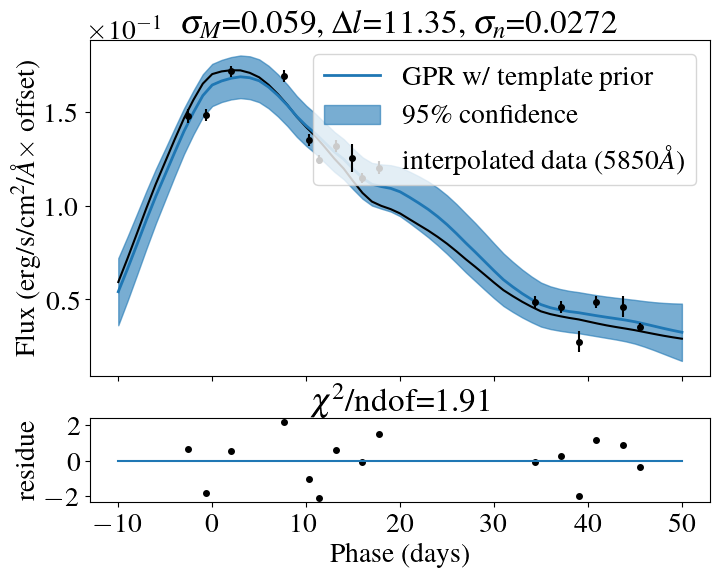

Optimization restart 1/10, f = -15.307085727003527
Optimization restart 2/10, f = -15.307085726924038
Optimization restart 3/10, f = -15.307085727003575
Optimization restart 4/10, f = -15.307085727001109
Optimization restart 5/10, f = -15.30708570837682
Optimization restart 6/10, f = -15.307085727003088
Optimization restart 7/10, f = -15.307085726997132
Optimization restart 8/10, f = -15.307085727003589
Optimization restart 9/10, f = -15.307085727003257
Optimization restart 10/10, f = -15.307085727003107


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0033010905739730063,+ve,"N(0.0033, 0.00033)"
sum.Mat52.lengthscale,11.346988237730342,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0007093971944449429,+ve,"N(0.00066, 6.6e-05)"


Optimization restart 1/10, f = -16.00672974015621
Optimization restart 2/10, f = -16.006729740155585
Optimization restart 3/10, f = -16.006729740151584
Optimization restart 4/10, f = -16.006729740156437
Optimization restart 5/10, f = -16.00672974015628
Optimization restart 6/10, f = -16.00672974015552
Optimization restart 7/10, f = -16.006729740156068
Optimization restart 8/10, f = -16.006729740154775
Optimization restart 9/10, f = -16.006729740031993
Optimization restart 10/10, f = -16.00672974015628


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.002753731236303302,+ve,"N(0.0027, 0.00027)"
sum.Mat52.lengthscale,11.101766358566048,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0005919640287658168,+ve,"N(0.00055, 5.5e-05)"


Optimization restart 1/10, f = -16.73151401678288
Optimization restart 2/10, f = -16.73151401678095
Optimization restart 3/10, f = -16.731514016759633
Optimization restart 4/10, f = -16.731514016734362
Optimization restart 5/10, f = -16.73151401678284
Optimization restart 6/10, f = -16.731514016782093
Optimization restart 7/10, f = -16.73151401678267
Optimization restart 8/10, f = -16.73151401675295
Optimization restart 9/10, f = -16.731514016782857
Optimization restart 10/10, f = -16.73151401678288


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.00251509546302403,+ve,"N(0.0025, 0.00025)"
sum.Mat52.lengthscale,10.77647837116998,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0005386108316370072,+ve,"N(0.0005, 5e-05)"


Optimization restart 1/10, f = -17.79927411497654
Optimization restart 2/10, f = -17.799274114871583
Optimization restart 3/10, f = -17.799274114988748
Optimization restart 4/10, f = -17.79927411498874
Optimization restart 5/10, f = -17.7992741149673
Optimization restart 6/10, f = -17.79927411470147
Optimization restart 7/10, f = -17.799274114980758
Optimization restart 8/10, f = -17.79927411498752
Optimization restart 9/10, f = -17.799274114986922
Optimization restart 10/10, f = -17.79927411498877


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0025642788197520945,+ve,"N(0.0025, 0.00025)"
sum.Mat52.lengthscale,10.58658920078948,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0005437394528745229,+ve,"N(0.00051, 5.1e-05)"


Optimization restart 1/10, f = -18.690854885250214
Optimization restart 2/10, f = -18.69085488524688
Optimization restart 3/10, f = -18.69085488524943
Optimization restart 4/10, f = -18.690854884200824
Optimization restart 5/10, f = -18.69085488525092
Optimization restart 6/10, f = -18.690854885250925
Optimization restart 7/10, f = -18.69085488525092
Optimization restart 8/10, f = -18.690854880279183
Optimization restart 9/10, f = -18.6908548852508
Optimization restart 10/10, f = -18.69085488523366


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0025369300533632177,+ve,"N(0.0025, 0.00025)"
sum.Mat52.lengthscale,10.511995683622585,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0005348899384531307,+ve,"N(0.0005, 5e-05)"


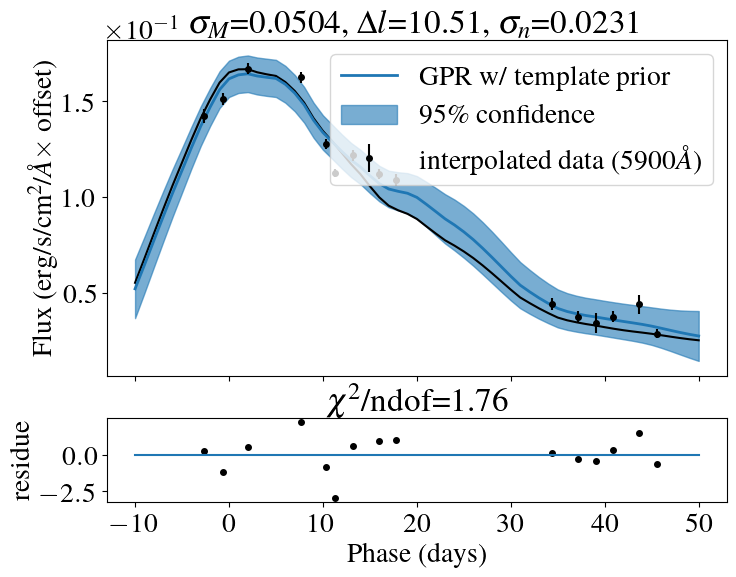

Optimization restart 1/10, f = -20.507949025838432
Optimization restart 2/10, f = -20.50794902587243
Optimization restart 3/10, f = -20.50794902585995
Optimization restart 4/10, f = -20.507949025872147
Optimization restart 5/10, f = -20.50794902582372
Optimization restart 6/10, f = -20.507949025872495
Optimization restart 7/10, f = -20.507949025116275
Optimization restart 8/10, f = -20.507949025868506
Optimization restart 9/10, f = -20.507949025830072
Optimization restart 10/10, f = -20.507949006271517


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0021802347389944863,+ve,"N(0.0022, 0.00022)"
sum.Mat52.lengthscale,10.509723356778435,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0004571915633604594,+ve,"N(0.00043, 4.3e-05)"


Optimization restart 1/10, f = -20.718493850283437
Optimization restart 2/10, f = -20.718493850261577
Optimization restart 3/10, f = -20.718493850282094
Optimization restart 4/10, f = -20.718493850282627
Optimization restart 5/10, f = -20.718493849463506
Optimization restart 6/10, f = -20.71849385028138
Optimization restart 7/10, f = -20.718493850283437
Optimization restart 8/10, f = -20.718493850283217
Optimization restart 9/10, f = -20.718493850280773
Optimization restart 10/10, f = -20.71849385023063


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.002248209519821634,+ve,"N(0.0022, 0.00022)"
sum.Mat52.lengthscale,11.049584549365058,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00047255736275088366,+ve,"N(0.00045, 4.5e-05)"


Optimization restart 1/10, f = -18.87638095446449
Optimization restart 2/10, f = -18.87638095450849
Optimization restart 3/10, f = -18.87638095362294
Optimization restart 4/10, f = -18.876380954507077
Optimization restart 5/10, f = -18.87638095450816
Optimization restart 6/10, f = -18.87638095188381
Optimization restart 7/10, f = -18.876380954505635
Optimization restart 8/10, f = -18.876380954035483
Optimization restart 9/10, f = -18.876380954508512
Optimization restart 10/10, f = -18.87638095450836


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.002661686455349777,+ve,"N(0.0026, 0.00026)"
sum.Mat52.lengthscale,11.685942846613624,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0005652489866107583,+ve,"N(0.00053, 5.3e-05)"


Optimization restart 1/10, f = -19.062420153031304
Optimization restart 2/10, f = -19.062420153030654
Optimization restart 3/10, f = -19.06242015303113
Optimization restart 4/10, f = -19.062420153027972
Optimization restart 5/10, f = -19.06242015302948
Optimization restart 6/10, f = -19.06242015303144
Optimization restart 7/10, f = -19.062420152969707
Optimization restart 8/10, f = -19.062420153031415
Optimization restart 9/10, f = -19.062420152723448
Optimization restart 10/10, f = -19.062420153030075


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0025187779231654085,+ve,"N(0.0025, 0.00025)"
sum.Mat52.lengthscale,11.996065441234556,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0005353035106868876,+ve,"N(0.0005, 5e-05)"


Optimization restart 1/10, f = -21.7795780395815
Optimization restart 2/10, f = -21.779578039579974
Optimization restart 3/10, f = -21.77957803958111
Optimization restart 4/10, f = -21.779578039322004
Optimization restart 5/10, f = -21.779578039486182
Optimization restart 6/10, f = -21.77957803793329
Optimization restart 7/10, f = -21.779578039578393
Optimization restart 8/10, f = -21.77957803958078
Optimization restart 9/10, f = -21.779578039500223
Optimization restart 10/10, f = -21.77957803956687


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0019378788197045717,+ve,"N(0.0019, 0.00019)"
sum.Mat52.lengthscale,11.802695455704171,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00040567640543901314,+ve,"N(0.00039, 3.9e-05)"


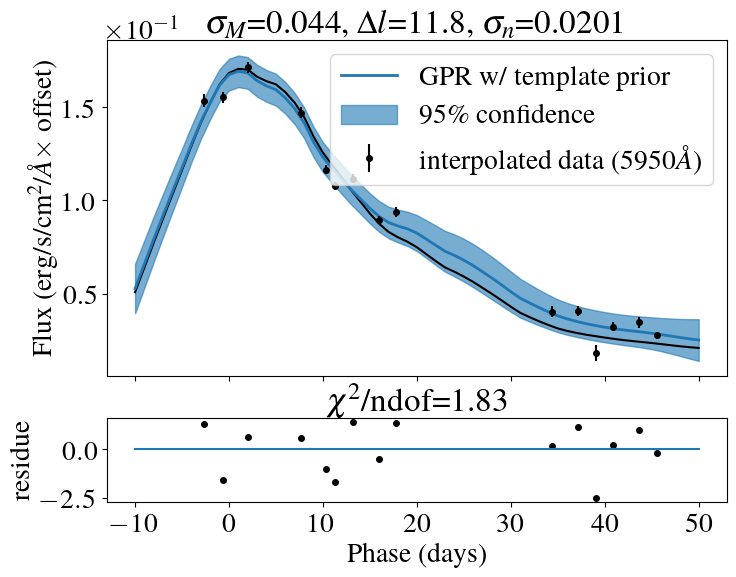

Optimization restart 1/10, f = -22.905582942351863
Optimization restart 2/10, f = -22.905582942357444
Optimization restart 3/10, f = -22.90558294235708
Optimization restart 4/10, f = -22.90558294221596
Optimization restart 5/10, f = -22.90558294235737
Optimization restart 6/10, f = -22.905582942356794
Optimization restart 7/10, f = -22.90558293893598
Optimization restart 8/10, f = -22.90558294233711
Optimization restart 9/10, f = -22.905582942357228
Optimization restart 10/10, f = -22.905582942356652


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0016398148757132394,+ve,"N(0.0016, 0.00016)"
sum.Mat52.lengthscale,11.416384525312107,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0003416049619712962,+ve,"N(0.00033, 3.3e-05)"


Optimization restart 1/10, f = -21.944378082808143
Optimization restart 2/10, f = -21.944378082805947
Optimization restart 3/10, f = -21.944378082803233
Optimization restart 4/10, f = -21.944378065427117
Optimization restart 5/10, f = -21.944378082808008
Optimization restart 6/10, f = -21.944378082808093
Optimization restart 7/10, f = -21.94437808280789
Optimization restart 8/10, f = -21.944378082807848
Optimization restart 9/10, f = -21.944378082801858
Optimization restart 10/10, f = -21.944378082808143


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0015188975527738362,+ve,"N(0.0015, 0.00015)"
sum.Mat52.lengthscale,10.841658253041354,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0003192334191588487,+ve,"N(0.0003, 3e-05)"


Optimization restart 1/10, f = -21.43064139388705
Optimization restart 2/10, f = -21.430641393894035
Optimization restart 3/10, f = -21.430641393724148
Optimization restart 4/10, f = -21.430641382227215
Optimization restart 5/10, f = -21.43064139389474
Optimization restart 6/10, f = -21.43064139389409
Optimization restart 7/10, f = -21.43064139389479
Optimization restart 8/10, f = -21.430641393872072
Optimization restart 9/10, f = -21.43064139303287
Optimization restart 10/10, f = -21.430641393894625


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0014230836766945696,+ve,"N(0.0014, 0.00014)"
sum.Mat52.lengthscale,10.698056549996593,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0003012051165088774,+ve,"N(0.00028, 2.8e-05)"


Optimization restart 1/10, f = -22.370475808450806
Optimization restart 2/10, f = -22.370475808462984
Optimization restart 3/10, f = -22.370475808401814
Optimization restart 4/10, f = -22.370475808460416
Optimization restart 5/10, f = -22.37047580814582
Optimization restart 6/10, f = -22.370475808452476
Optimization restart 7/10, f = -22.37047580845926
Optimization restart 8/10, f = -22.37047580846274
Optimization restart 9/10, f = -22.370475808460355
Optimization restart 10/10, f = -22.370475808461123


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0012584711673125704,+ve,"N(0.0013, 0.00013)"
sum.Mat52.lengthscale,11.171176556969057,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0002668162843188702,+ve,"N(0.00025, 2.5e-05)"


Optimization restart 1/10, f = -22.85521778712333
Optimization restart 2/10, f = -22.85521778712382
Optimization restart 3/10, f = -22.855217787124094
Optimization restart 4/10, f = -22.85521778712408
Optimization restart 5/10, f = -22.85521778601384
Optimization restart 6/10, f = -22.855217787058834
Optimization restart 7/10, f = -22.85521776495609
Optimization restart 8/10, f = -22.85521778712412
Optimization restart 9/10, f = -22.855217783391794
Optimization restart 10/10, f = -22.85521778659451


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0013886922041324173,+ve,"N(0.0014, 0.00014)"
sum.Mat52.lengthscale,11.14170467555502,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00029253424413821035,+ve,"N(0.00028, 2.8e-05)"


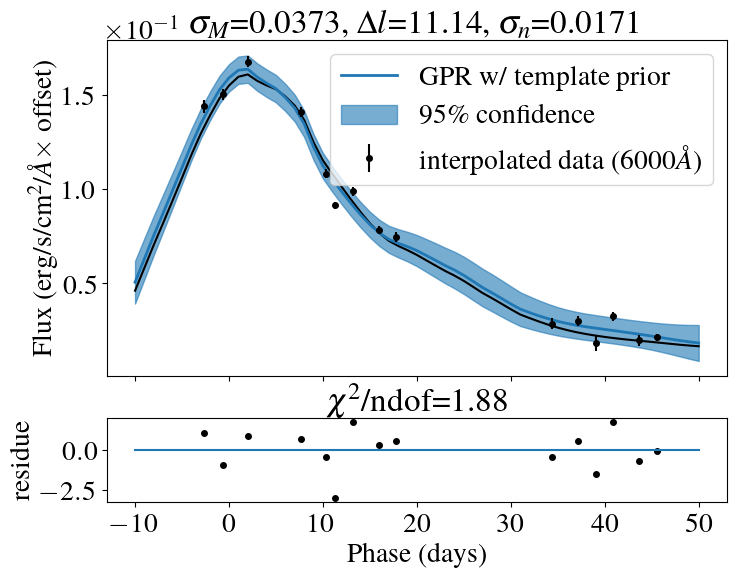

Optimization restart 1/10, f = -22.731545901012055
Optimization restart 2/10, f = -22.731545901012034
Optimization restart 3/10, f = -22.731545900989474
Optimization restart 4/10, f = -22.73154590101135
Optimization restart 5/10, f = -22.73154590101079
Optimization restart 6/10, f = -22.731545900976045
Optimization restart 7/10, f = -22.73154590101189
Optimization restart 8/10, f = -22.73154590100951
Optimization restart 9/10, f = -22.731545900965987
Optimization restart 10/10, f = -22.731545900952813


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0017593970434139745,+ve,"N(0.0017, 0.00017)"
sum.Mat52.lengthscale,11.03369156050759,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.000367543360218756,+ve,"N(0.00035, 3.5e-05)"


Optimization restart 1/10, f = -22.93680964624688
Optimization restart 2/10, f = -22.936809646246473
Optimization restart 3/10, f = -22.9368096462468
Optimization restart 4/10, f = -22.93680964624675
Optimization restart 5/10, f = -22.936809645997297
Optimization restart 6/10, f = -22.936809646245216
Optimization restart 7/10, f = -22.93680964618767
Optimization restart 8/10, f = -22.93680964624073
Optimization restart 9/10, f = -22.93680964612219
Optimization restart 10/10, f = -22.93680964199157


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.002006716566239603,+ve,"N(0.002, 0.0002)"
sum.Mat52.lengthscale,11.02494417220314,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0004163051485437797,+ve,"N(0.0004, 4e-05)"


Optimization restart 1/10, f = -23.313883290375326
Optimization restart 2/10, f = -23.31388329031395
Optimization restart 3/10, f = -23.31388329023862
Optimization restart 4/10, f = -23.313883288085957
Optimization restart 5/10, f = -23.31388329037396
Optimization restart 6/10, f = -23.313883290375095
Optimization restart 7/10, f = -23.313883290350205
Optimization restart 8/10, f = -23.313883196395555
Optimization restart 9/10, f = -23.313883290370185
Optimization restart 10/10, f = -23.31388329009615


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.002225044946343739,+ve,"N(0.0022, 0.00022)"
sum.Mat52.lengthscale,10.970986377653901,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00045813535008199695,+ve,"N(0.00044, 4.4e-05)"


Optimization restart 1/10, f = -22.605863657660645
Optimization restart 2/10, f = -22.605863657660745
Optimization restart 3/10, f = -22.6058636576574
Optimization restart 4/10, f = -22.60586365765007
Optimization restart 5/10, f = -22.60586365757632
Optimization restart 6/10, f = -22.605863657660365
Optimization restart 7/10, f = -22.605863657660176
Optimization restart 8/10, f = -22.60586365765093
Optimization restart 9/10, f = -22.605863656505896
Optimization restart 10/10, f = -22.605863649490768


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.002628206229306316,+ve,"N(0.0026, 0.00026)"
sum.Mat52.lengthscale,10.913098186524765,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0005403022277380433,+ve,"N(0.00052, 5.2e-05)"


Optimization restart 1/10, f = -21.03545357007266
Optimization restart 2/10, f = -21.035453570034477
Optimization restart 3/10, f = -21.035453564122136
Optimization restart 4/10, f = -21.035453570072594
Optimization restart 5/10, f = -21.03545357007235
Optimization restart 6/10, f = -21.03545356964364
Optimization restart 7/10, f = -21.035453570072754
Optimization restart 8/10, f = -21.03545356999099
Optimization restart 9/10, f = -21.035453570072733
Optimization restart 10/10, f = -21.035453570072804


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0031129853628915597,+ve,"N(0.0031, 0.00031)"
sum.Mat52.lengthscale,10.996959393636969,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0006439496395946973,+ve,"N(0.00062, 6.2e-05)"


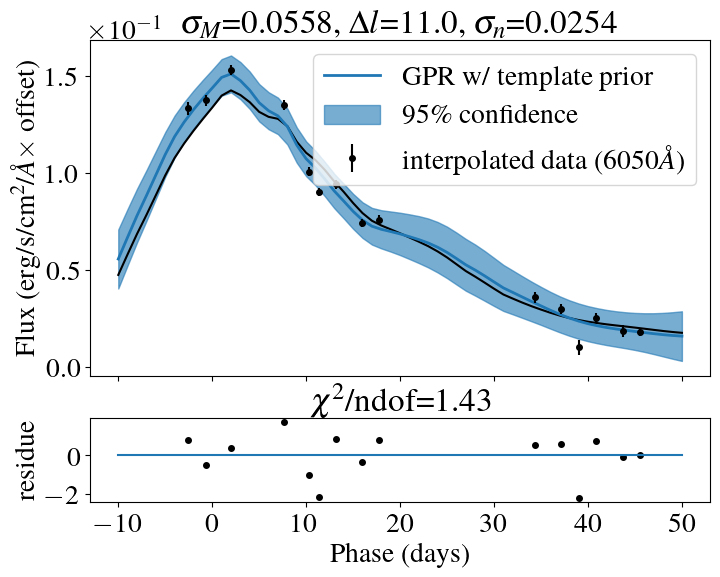

Optimization restart 1/10, f = -19.979162162553017
Optimization restart 2/10, f = -19.979162162542995
Optimization restart 3/10, f = -19.979162162552672
Optimization restart 4/10, f = -19.979162162553315
Optimization restart 5/10, f = -19.979162162553358
Optimization restart 6/10, f = -19.979162162549166
Optimization restart 7/10, f = -19.979162162553344
Optimization restart 8/10, f = -19.97916216255335
Optimization restart 9/10, f = -19.97916216255334
Optimization restart 10/10, f = -19.979162162553344


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003680501704115772,+ve,"N(0.0036, 0.00036)"
sum.Mat52.lengthscale,10.918368165536751,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0007621268573977429,+ve,"N(0.00073, 7.3e-05)"


Optimization restart 1/10, f = -19.81678137003128
Optimization restart 2/10, f = -19.816781370109034
Optimization restart 3/10, f = -19.816781370188554
Optimization restart 4/10, f = -19.816781364675265
Optimization restart 5/10, f = -19.816781370186348
Optimization restart 6/10, f = -19.816781370174123
Optimization restart 7/10, f = -19.816781370188632
Optimization restart 8/10, f = -19.81678137018809
Optimization restart 9/10, f = -19.81678137015409
Optimization restart 10/10, f = -19.81678137004679


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004168654708861116,+ve,"N(0.0041, 0.00041)"
sum.Mat52.lengthscale,10.54304630957505,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.000857273351163979,+ve,"N(0.00082, 8.2e-05)"


Optimization restart 1/10, f = -19.610297361205127
Optimization restart 2/10, f = -19.610297361202786
Optimization restart 3/10, f = -19.610297361196167
Optimization restart 4/10, f = -19.610297361183573
Optimization restart 5/10, f = -19.610297359677986
Optimization restart 6/10, f = -19.610297359794075
Optimization restart 7/10, f = -19.61029736120136
Optimization restart 8/10, f = -19.610297361205586
Optimization restart 9/10, f = -19.61029736120568
Optimization restart 10/10, f = -19.610297361203067


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004454871354494077,+ve,"N(0.0044, 0.00044)"
sum.Mat52.lengthscale,10.335387096511349,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0009134682563552239,+ve,"N(0.00088, 8.8e-05)"


Optimization restart 1/10, f = -18.7588314599608
Optimization restart 2/10, f = -18.758831459961172
Optimization restart 3/10, f = -18.758831459961016
Optimization restart 4/10, f = -18.758831459922302
Optimization restart 5/10, f = -18.7588314596644
Optimization restart 6/10, f = -18.75883145922455
Optimization restart 7/10, f = -18.758831459873235
Optimization restart 8/10, f = -18.758831459961144
Optimization restart 9/10, f = -18.758831459961094
Optimization restart 10/10, f = -18.758831459956667


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004515746059336292,+ve,"N(0.0045, 0.00045)"
sum.Mat52.lengthscale,10.20937900401915,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0009299736543685641,+ve,"N(0.00089, 8.9e-05)"


Optimization restart 1/10, f = -18.148371611553863
Optimization restart 2/10, f = -18.148371611553753
Optimization restart 3/10, f = -18.148371557027534
Optimization restart 4/10, f = -18.148371611543844
Optimization restart 5/10, f = -18.14837161155227
Optimization restart 6/10, f = -18.14837161155354
Optimization restart 7/10, f = -18.148371611552584
Optimization restart 8/10, f = -18.148371611553813
Optimization restart 9/10, f = -18.148371611553845
Optimization restart 10/10, f = -18.14837161153246


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004728621883320163,+ve,"N(0.0047, 0.00047)"
sum.Mat52.lengthscale,10.041408399613958,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0009721320645717678,+ve,"N(0.00093, 9.3e-05)"


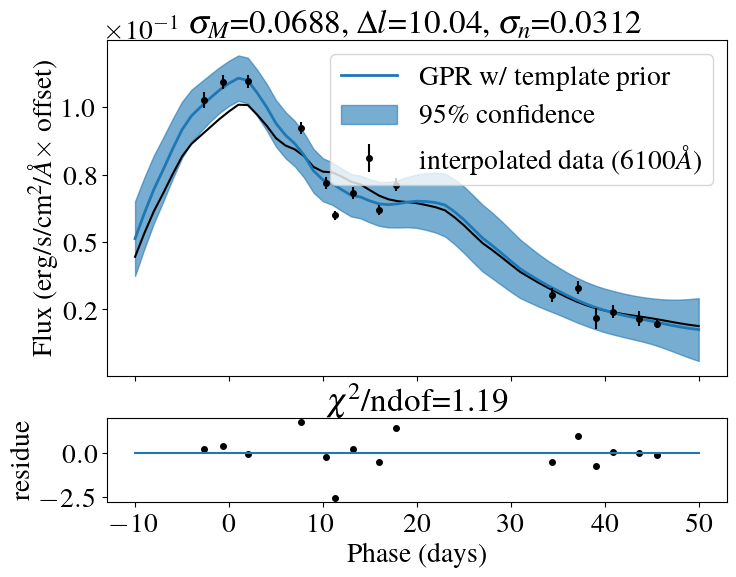

Optimization restart 1/10, f = -16.133353517573656
Optimization restart 2/10, f = -16.133353514762042
Optimization restart 3/10, f = -16.133353517517982
Optimization restart 4/10, f = -16.133353517573795
Optimization restart 5/10, f = -16.13335351757375
Optimization restart 6/10, f = -16.13335350890945
Optimization restart 7/10, f = -16.13335351757361
Optimization restart 8/10, f = -16.13335351757378
Optimization restart 9/10, f = -16.133353517312294
Optimization restart 10/10, f = -16.133353517573802


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006240446856081648,+ve,"N(0.0061, 0.00061)"
sum.Mat52.lengthscale,9.706690073630043,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001276572324831387,+ve,"N(0.0012, 0.00012)"


Optimization restart 1/10, f = -15.648845956653101
Optimization restart 2/10, f = -15.648845949552001
Optimization restart 3/10, f = -15.648845956653012
Optimization restart 4/10, f = -15.648845956653025
Optimization restart 5/10, f = -15.648845956653012
Optimization restart 6/10, f = -15.648845952039617
Optimization restart 7/10, f = -15.648845956653023
Optimization restart 8/10, f = -15.648845955552698
Optimization restart 9/10, f = -15.648845956653082
Optimization restart 10/10, f = -15.648845956652286


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.00759192065975607,+ve,"N(0.0074, 0.00074)"
sum.Mat52.lengthscale,9.705250057166822,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0015383160396780606,+ve,"N(0.0015, 0.00015)"


Optimization restart 1/10, f = -19.37543308546593
Optimization restart 2/10, f = -19.375433085370176
Optimization restart 3/10, f = -19.375433085482484
Optimization restart 4/10, f = -19.375433085366506
Optimization restart 5/10, f = -19.37543308548238
Optimization restart 6/10, f = -19.37543308547774
Optimization restart 7/10, f = -19.375433085482122
Optimization restart 8/10, f = -19.375433085481205
Optimization restart 9/10, f = -19.375433085482488
Optimization restart 10/10, f = -19.375433085482246


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006855160627544633,+ve,"N(0.0067, 0.00067)"
sum.Mat52.lengthscale,10.244357690350922,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0013546755663913755,+ve,"N(0.0013, 0.00013)"


Optimization restart 1/10, f = -20.230068948068897
Optimization restart 2/10, f = -20.230068948066823
Optimization restart 3/10, f = -20.23006894806922
Optimization restart 4/10, f = -20.230068948069164
Optimization restart 5/10, f = -20.230068948069235
Optimization restart 6/10, f = -20.230068947519005
Optimization restart 7/10, f = -20.230068948065806
Optimization restart 8/10, f = -20.23006894734603
Optimization restart 9/10, f = -20.230068947979984
Optimization restart 10/10, f = -20.230068938651666


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.007137147737329628,+ve,"N(0.007, 0.0007)"
sum.Mat52.lengthscale,10.622453280637355,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0013999806683946414,+ve,"N(0.0014, 0.00014)"


Optimization restart 1/10, f = -21.255746848273716
Optimization restart 2/10, f = -21.255746848263428
Optimization restart 3/10, f = -21.255746848271315
Optimization restart 4/10, f = -21.255746848268803
Optimization restart 5/10, f = -21.255746848199504
Optimization restart 6/10, f = -21.255746848275543
Optimization restart 7/10, f = -21.25574684789911
Optimization restart 8/10, f = -21.255746848248428
Optimization restart 9/10, f = -21.255746848275095
Optimization restart 10/10, f = -21.25574684827459


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.007017206726260366,+ve,"N(0.0069, 0.00069)"
sum.Mat52.lengthscale,11.059187901666276,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0013778700149719083,+ve,"N(0.0014, 0.00014)"


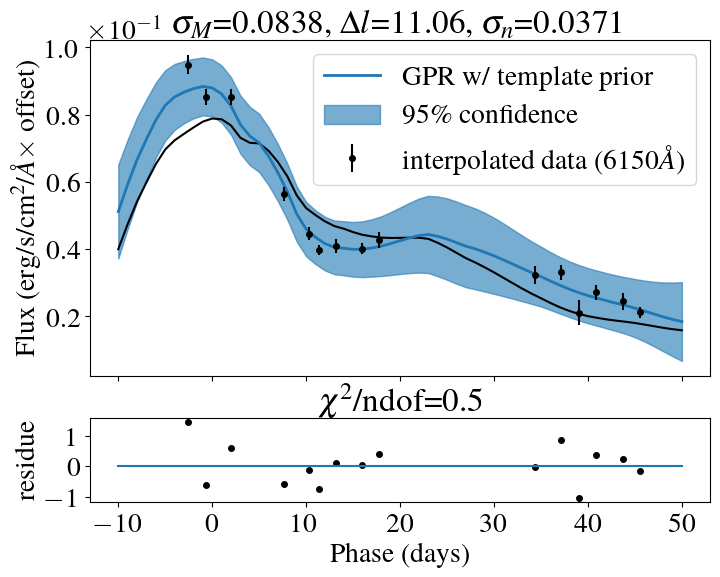

Optimization restart 1/10, f = -21.664530448251345
Optimization restart 2/10, f = -21.664530448245202
Optimization restart 3/10, f = -21.66453044821884
Optimization restart 4/10, f = -21.66453044821656
Optimization restart 5/10, f = -21.664530448251355
Optimization restart 6/10, f = -21.664530448250847
Optimization restart 7/10, f = -21.664530448251277
Optimization restart 8/10, f = -21.66453044821744
Optimization restart 9/10, f = -21.664530447002313
Optimization restart 10/10, f = -21.66453044825146


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006204853557112977,+ve,"N(0.0061, 0.00061)"
sum.Mat52.lengthscale,11.409708882471527,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0012303735888514683,+ve,"N(0.0012, 0.00012)"


Optimization restart 1/10, f = -25.40536401327109
Optimization restart 2/10, f = -25.405364002125413
Optimization restart 3/10, f = -25.405364013513783
Optimization restart 4/10, f = -25.405364013513452
Optimization restart 5/10, f = -25.405364013513164
Optimization restart 6/10, f = -25.405364013513786
Optimization restart 7/10, f = -25.40536401351381
Optimization restart 8/10, f = -25.405364013513758
Optimization restart 9/10, f = -25.405364013494403
Optimization restart 10/10, f = -25.40536401351383


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003013649856166825,+ve,"N(0.003, 0.0003)"
sum.Mat52.lengthscale,11.886692678815399,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0006037860380651924,+ve,"N(0.0006, 6e-05)"


Optimization restart 1/10, f = -25.526229500810587
Optimization restart 2/10, f = -25.52622950080637
Optimization restart 3/10, f = -25.526229500692537
Optimization restart 4/10, f = -25.526229500808036
Optimization restart 5/10, f = -25.526229500809954
Optimization restart 6/10, f = -25.526229500810423
Optimization restart 7/10, f = -25.526229500765606
Optimization restart 8/10, f = -25.526229500810025
Optimization restart 9/10, f = -25.526229499260666
Optimization restart 10/10, f = -25.52622950008321


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0026649285432762803,+ve,"N(0.0027, 0.00027)"
sum.Mat52.lengthscale,12.533862169853595,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0005397449544130801,+ve,"N(0.00053, 5.3e-05)"


Optimization restart 1/10, f = -23.549034104272128
Optimization restart 2/10, f = -23.549034104239794
Optimization restart 3/10, f = -23.549034104271875
Optimization restart 4/10, f = -23.549034104265196
Optimization restart 5/10, f = -23.5490341042658
Optimization restart 6/10, f = -23.549034104271954
Optimization restart 7/10, f = -23.549034104266276
Optimization restart 8/10, f = -23.549034098428933
Optimization restart 9/10, f = -23.549034104272135
Optimization restart 10/10, f = -23.54903410427034


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003449786802764391,+ve,"N(0.0034, 0.00034)"
sum.Mat52.lengthscale,12.527236834239304,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0007053297025717398,+ve,"N(0.00069, 6.9e-05)"


Optimization restart 1/10, f = -21.39328453321993
Optimization restart 2/10, f = -21.393284507722655
Optimization restart 3/10, f = -21.393284533408686
Optimization restart 4/10, f = -21.393284533314166
Optimization restart 5/10, f = -21.39328453334801
Optimization restart 6/10, f = -21.393284533408735
Optimization restart 7/10, f = -21.3932845268037
Optimization restart 8/10, f = -21.39328453340859
Optimization restart 9/10, f = -21.393284533408696
Optimization restart 10/10, f = -21.3932845319424


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004270688738875166,+ve,"N(0.0043, 0.00043)"
sum.Mat52.lengthscale,12.358225327734814,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0008806968591791088,+ve,"N(0.00085, 8.5e-05)"


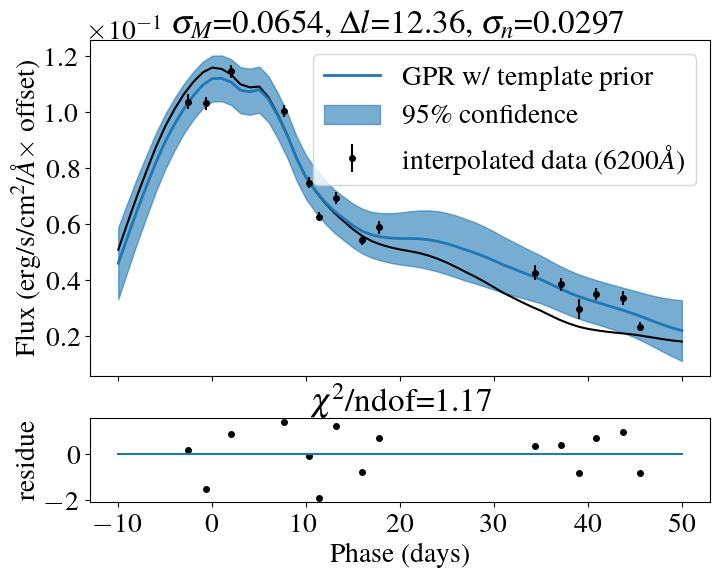

Optimization restart 1/10, f = -22.858705758671007
Optimization restart 2/10, f = -22.858705758668137
Optimization restart 3/10, f = -22.85870575867095
Optimization restart 4/10, f = -22.858705758575095
Optimization restart 5/10, f = -22.858705758641577
Optimization restart 6/10, f = -22.858705758666005
Optimization restart 7/10, f = -22.858705758650025
Optimization restart 8/10, f = -22.858705758670787
Optimization restart 9/10, f = -22.85870575867015
Optimization restart 10/10, f = -22.858705758663106


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0032978051471101544,+ve,"N(0.0033, 0.00033)"
sum.Mat52.lengthscale,12.181854223198712,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0006793121805965724,+ve,"N(0.00066, 6.6e-05)"


Optimization restart 1/10, f = -23.562537363238413
Optimization restart 2/10, f = -23.562535518626586
Optimization restart 3/10, f = -23.562537363238675
Optimization restart 4/10, f = -23.56253736323082
Optimization restart 5/10, f = -23.562537363239013
Optimization restart 6/10, f = -23.56253736323883
Optimization restart 7/10, f = -23.562537363237873
Optimization restart 8/10, f = -23.56253736322364
Optimization restart 9/10, f = -23.562537363044314
Optimization restart 10/10, f = -23.562537354732754


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.002898020005825727,+ve,"N(0.0029, 0.00029)"
sum.Mat52.lengthscale,11.914771226467817,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0005959765787444334,+ve,"N(0.00058, 5.8e-05)"


Optimization restart 1/10, f = -24.153163955858346
Optimization restart 2/10, f = -24.15316395586511
Optimization restart 3/10, f = -24.153163955723848
Optimization restart 4/10, f = -24.153163955864805
Optimization restart 5/10, f = -24.153163955864667
Optimization restart 6/10, f = -24.153163955846082
Optimization restart 7/10, f = -24.153163955864876
Optimization restart 8/10, f = -24.153163955800903
Optimization restart 9/10, f = -24.15316395213252
Optimization restart 10/10, f = -24.15316395586511


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003216867627878472,+ve,"N(0.0032, 0.00032)"
sum.Mat52.lengthscale,12.042743032592375,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0006580808247491912,+ve,"N(0.00064, 6.4e-05)"


Optimization restart 1/10, f = -22.833938593766884
Optimization restart 2/10, f = -22.833938593773844
Optimization restart 3/10, f = -22.833938593778633
Optimization restart 4/10, f = -22.83393859374747
Optimization restart 5/10, f = -22.83393859378426
Optimization restart 6/10, f = -22.833938593660765
Optimization restart 7/10, f = -22.833938593784257
Optimization restart 8/10, f = -22.833938593782257
Optimization restart 9/10, f = -22.833938593774995
Optimization restart 10/10, f = -22.833938593527257


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0037042094024974494,+ve,"N(0.0037, 0.00037)"
sum.Mat52.lengthscale,11.98599254949424,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0007612647143537356,+ve,"N(0.00074, 7.4e-05)"


Optimization restart 1/10, f = -24.514533449848006
Optimization restart 2/10, f = -24.51453344984452
Optimization restart 3/10, f = -24.51453344984769
Optimization restart 4/10, f = -24.514533449847217
Optimization restart 5/10, f = -24.514533449676208
Optimization restart 6/10, f = -24.514533449846642
Optimization restart 7/10, f = -24.514533449848038
Optimization restart 8/10, f = -24.51453344984398
Optimization restart 9/10, f = -24.51453344984801
Optimization restart 10/10, f = -24.5145334497824


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.00240682576707383,+ve,"N(0.0024, 0.00024)"
sum.Mat52.lengthscale,12.009259241529598,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0004966096717877595,+ve,"N(0.00048, 4.8e-05)"


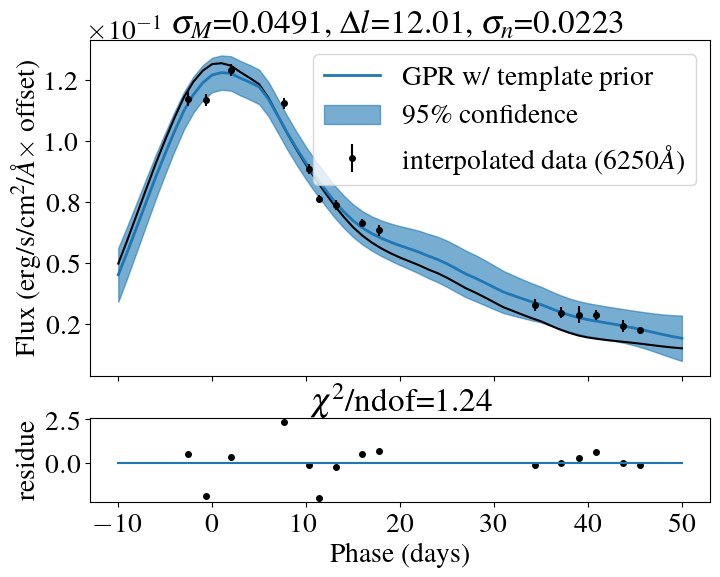

Optimization restart 1/10, f = -23.699322350007495
Optimization restart 2/10, f = -23.6993223500073
Optimization restart 3/10, f = -23.699322349976434
Optimization restart 4/10, f = -23.699322350006945
Optimization restart 5/10, f = -23.69932234842595
Optimization restart 6/10, f = -23.699322350003722
Optimization restart 7/10, f = -23.69932232916269
Optimization restart 8/10, f = -23.699322350007016
Optimization restart 9/10, f = -23.699322350001903
Optimization restart 10/10, f = -23.699322350007435


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0018110622719458055,+ve,"N(0.0018, 0.00018)"
sum.Mat52.lengthscale,11.514166220877925,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0003768886605206448,+ve,"N(0.00036, 3.6e-05)"


Optimization restart 1/10, f = -21.70996238902247
Optimization restart 2/10, f = -21.709962389020866
Optimization restart 3/10, f = -21.709962389022518
Optimization restart 4/10, f = -21.70996238896698
Optimization restart 5/10, f = -21.70996238902253
Optimization restart 6/10, f = -21.709962388780305
Optimization restart 7/10, f = -21.709962389022273
Optimization restart 8/10, f = -21.709962389022692
Optimization restart 9/10, f = -21.709962388928922
Optimization restart 10/10, f = -21.709962389022564


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0023564218294471737,+ve,"N(0.0023, 0.00023)"
sum.Mat52.lengthscale,11.379028424473663,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0004925635952567137,+ve,"N(0.00047, 4.7e-05)"


Optimization restart 1/10, f = -18.864227717375705
Optimization restart 2/10, f = -18.86422771560796
Optimization restart 3/10, f = -18.86422771737695
Optimization restart 4/10, f = -18.86422771737516
Optimization restart 5/10, f = -18.864227717370394
Optimization restart 6/10, f = -18.86422771737694
Optimization restart 7/10, f = -18.864227717372238
Optimization restart 8/10, f = -18.86422771714308
Optimization restart 9/10, f = -18.864227716940597
Optimization restart 10/10, f = -18.86422771737659


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0031435256535892494,+ve,"N(0.0031, 0.00031)"
sum.Mat52.lengthscale,11.181913172391203,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0006625979919326519,+ve,"N(0.00062, 6.2e-05)"


Optimization restart 1/10, f = -18.066354940863796
Optimization restart 2/10, f = -18.066354940856886
Optimization restart 3/10, f = -18.06635494085745
Optimization restart 4/10, f = -18.066354940857764
Optimization restart 5/10, f = -18.066354940863874
Optimization restart 6/10, f = -18.066354940862816
Optimization restart 7/10, f = -18.066354940797737
Optimization restart 8/10, f = -18.066354940771138
Optimization restart 9/10, f = -18.06635494086383
Optimization restart 10/10, f = -18.0663549407491


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.002900742803453006,+ve,"N(0.0029, 0.00029)"
sum.Mat52.lengthscale,10.392002455061213,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0006106117887151691,+ve,"N(0.00057, 5.7e-05)"


Optimization restart 1/10, f = -15.94662939014439
Optimization restart 2/10, f = -15.946629390144727
Optimization restart 3/10, f = -15.946629390143466
Optimization restart 4/10, f = -15.946629390115715
Optimization restart 5/10, f = -15.946629390144743
Optimization restart 6/10, f = -15.946629390144796
Optimization restart 7/10, f = -15.946629389631934
Optimization restart 8/10, f = -15.946629390144606
Optimization restart 9/10, f = -15.946629390144086
Optimization restart 10/10, f = -15.946629390144443


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003133551107636931,+ve,"N(0.0031, 0.00031)"
sum.Mat52.lengthscale,5.369823787708935,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0006349199263239161,+ve,"N(0.00061, 6.1e-05)"


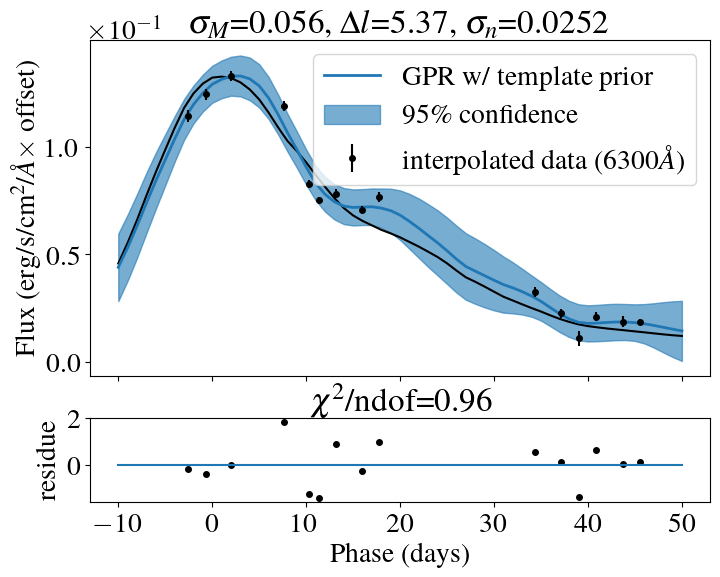

Optimization restart 1/10, f = -16.040275651439636
Optimization restart 2/10, f = -16.04027565144824
Optimization restart 3/10, f = -16.04027565144535
Optimization restart 4/10, f = -16.040275645734503
Optimization restart 5/10, f = -16.040275651281426
Optimization restart 6/10, f = -16.040275651449427
Optimization restart 7/10, f = -16.040275651450386
Optimization restart 8/10, f = -16.040275651450436
Optimization restart 9/10, f = -16.040275651366457
Optimization restart 10/10, f = -16.04027565132127


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0027975005793735115,+ve,"N(0.0028, 0.00028)"
sum.Mat52.lengthscale,8.73515542772205,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0005888347031205321,+ve,"N(0.00055, 5.5e-05)"


Optimization restart 1/10, f = -15.51846863974184
Optimization restart 2/10, f = -15.518468639558964
Optimization restart 3/10, f = -15.51846863974181
Optimization restart 4/10, f = -15.51846863974191
Optimization restart 5/10, f = -15.51846863973806
Optimization restart 6/10, f = -15.518468639741808
Optimization restart 7/10, f = -15.5184686397417
Optimization restart 8/10, f = -15.51846863973973
Optimization restart 9/10, f = -15.518468639741082
Optimization restart 10/10, f = -15.518468637474747


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0027293533480046003,+ve,"N(0.0027, 0.00027)"
sum.Mat52.lengthscale,10.699413093174979,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.000589278932048446,+ve,"N(0.00054, 5.4e-05)"


Optimization restart 1/10, f = -14.565197508432867
Optimization restart 2/10, f = -14.565197508408056
Optimization restart 3/10, f = -14.565197508321592
Optimization restart 4/10, f = -14.565197508170941
Optimization restart 5/10, f = -14.565197506488447
Optimization restart 6/10, f = -14.56519750842795
Optimization restart 7/10, f = -14.565197491985558
Optimization restart 8/10, f = -14.565197508427465
Optimization restart 9/10, f = -14.565197508432703
Optimization restart 10/10, f = -14.565197508301514


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0028091758319834055,+ve,"N(0.0028, 0.00028)"
sum.Mat52.lengthscale,10.846426254188117,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0006102815093133894,+ve,"N(0.00056, 5.6e-05)"


Optimization restart 1/10, f = -12.508565590181298
Optimization restart 2/10, f = -12.5085655901818
Optimization restart 3/10, f = -12.508565590181828
Optimization restart 4/10, f = -12.508565590179959
Optimization restart 5/10, f = -12.508565590181789
Optimization restart 6/10, f = -12.508565590181783
Optimization restart 7/10, f = -12.508565590180837
Optimization restart 8/10, f = -12.508565589974287
Optimization restart 9/10, f = -12.508565590181618
Optimization restart 10/10, f = -12.508565589317014


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003242823707128278,+ve,"N(0.0032, 0.00032)"
sum.Mat52.lengthscale,10.996792648385345,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0007103609077533383,+ve,"N(0.00065, 6.5e-05)"


Optimization restart 1/10, f = -10.428269722213686
Optimization restart 2/10, f = -10.38845923698948
Optimization restart 3/10, f = -10.428269722213788
Optimization restart 4/10, f = -10.428269722213722
Optimization restart 5/10, f = -10.42826972221383
Optimization restart 6/10, f = -10.428269722211642
Optimization restart 7/10, f = -10.428269720764401
Optimization restart 8/10, f = -10.428269707843983
Optimization restart 9/10, f = -10.42826972214398
Optimization restart 10/10, f = -10.428269647912183


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004187011154412603,+ve,"N(0.0042, 0.00042)"
sum.Mat52.lengthscale,10.664098496474734,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0009195592062284276,+ve,"N(0.00083, 8.3e-05)"


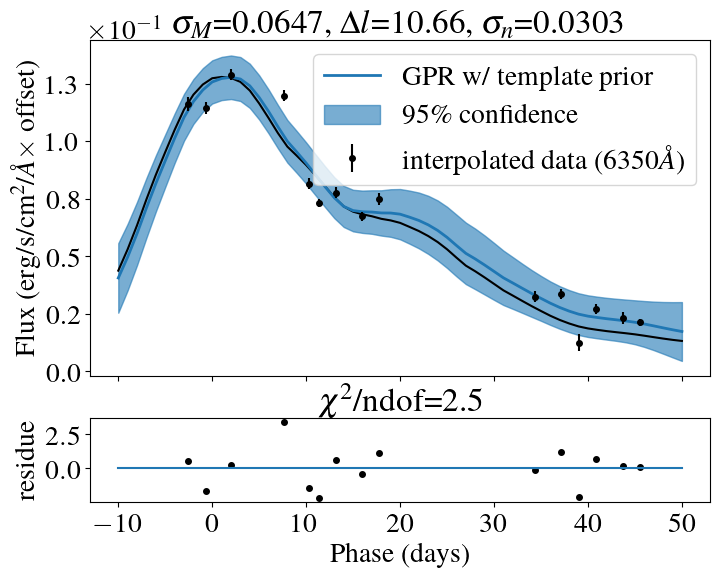

Optimization restart 1/10, f = -9.248653647197035
Optimization restart 2/10, f = -9.248653646571901
Optimization restart 3/10, f = -9.248653647184268
Optimization restart 4/10, f = -9.248653647196356
Optimization restart 5/10, f = -9.248653647197024
Optimization restart 6/10, f = -9.248653647197049
Optimization restart 7/10, f = -9.24865364712169
Optimization restart 8/10, f = -9.248653646963511
Optimization restart 9/10, f = -9.248653647196868
Optimization restart 10/10, f = -9.248653647197006


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006089674398681881,+ve,"N(0.006, 0.0006)"
sum.Mat52.lengthscale,3.8975764970683002,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0012335065058664881,+ve,"N(0.0012, 0.00012)"


Optimization restart 1/10, f = -9.45568090615322
Optimization restart 2/10, f = -9.455680906153233
Optimization restart 3/10, f = -9.455680906150075
Optimization restart 4/10, f = -9.455680906153173
Optimization restart 5/10, f = -9.455680905952594
Optimization restart 6/10, f = -9.455680906153233
Optimization restart 7/10, f = -9.455680906153239
Optimization restart 8/10, f = -9.455680906135226
Optimization restart 9/10, f = -9.455680906153061
Optimization restart 10/10, f = -9.45568090615323


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006392216349435663,+ve,"N(0.0063, 0.00063)"
sum.Mat52.lengthscale,4.749887730587425,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0013049102105757654,+ve,"N(0.0013, 0.00013)"


Optimization restart 1/10, f = -12.001153542325126
Optimization restart 2/10, f = -12.001153542261633
Optimization restart 3/10, f = -12.00115354231329
Optimization restart 4/10, f = -12.001153542298926
Optimization restart 5/10, f = -12.001153542095796
Optimization restart 6/10, f = -12.00115354232444
Optimization restart 7/10, f = -12.001153542323303
Optimization restart 8/10, f = -12.001153541758994
Optimization restart 9/10, f = -12.001153542317251
Optimization restart 10/10, f = -12.001153542325033


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004903130360518184,+ve,"N(0.0049, 0.00049)"
sum.Mat52.lengthscale,10.44871052319929,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001055293575782195,+ve,"N(0.00097, 9.7e-05)"


Optimization restart 1/10, f = -13.540231753619036
Optimization restart 2/10, f = -13.540231753588575
Optimization restart 3/10, f = -13.540231753517249
Optimization restart 4/10, f = -13.54023175353461
Optimization restart 5/10, f = -13.540231753613318
Optimization restart 6/10, f = -13.540231753619546
Optimization restart 7/10, f = -13.540231753619604
Optimization restart 8/10, f = -13.540231753574732
Optimization restart 9/10, f = -13.54023175361943
Optimization restart 10/10, f = -13.540231753619445


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004514158812501317,+ve,"N(0.0045, 0.00045)"
sum.Mat52.lengthscale,11.165440514631014,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0009684105987604058,+ve,"N(0.0009, 9e-05)"


Optimization restart 1/10, f = -13.966047858728135
Optimization restart 2/10, f = -13.966047858727535
Optimization restart 3/10, f = -13.966047858728135
Optimization restart 4/10, f = -13.96604785846685
Optimization restart 5/10, f = -13.966047858728105
Optimization restart 6/10, f = -13.966047858728118
Optimization restart 7/10, f = -13.966047858723496
Optimization restart 8/10, f = -13.966047854766597
Optimization restart 9/10, f = -13.966047858712981
Optimization restart 10/10, f = -13.966047858724231


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005071702794922944,+ve,"N(0.005, 0.0005)"
sum.Mat52.lengthscale,11.525047968572352,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0010822666830214115,+ve,"N(0.001, 0.0001)"


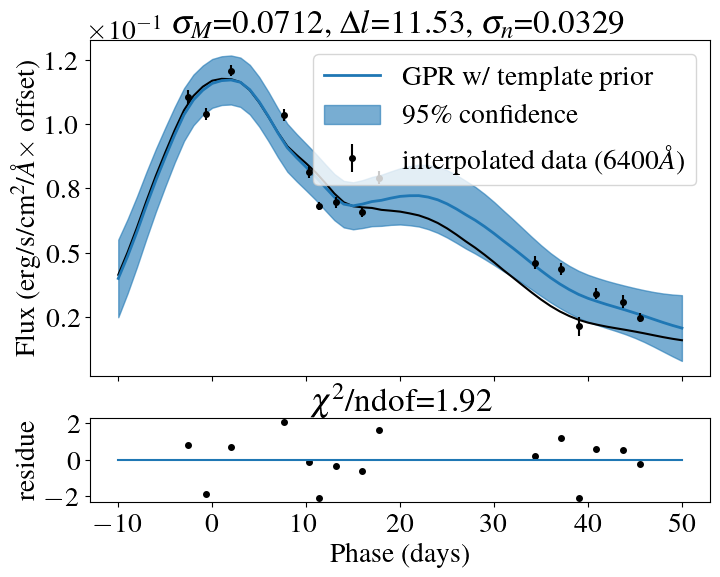

Optimization restart 1/10, f = -14.170570659934807
Optimization restart 2/10, f = -14.170570659934908
Optimization restart 3/10, f = -14.170570659935061
Optimization restart 4/10, f = -14.170570659933997
Optimization restart 5/10, f = -14.170570659934162
Optimization restart 6/10, f = -14.170570659935159
Optimization restart 7/10, f = -14.170570659217804
Optimization restart 8/10, f = -14.170570659909648
Optimization restart 9/10, f = -14.170570659934988
Optimization restart 10/10, f = -14.170570659907073


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005829716863338312,+ve,"N(0.0058, 0.00058)"
sum.Mat52.lengthscale,11.65816741104581,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0012367928214618578,+ve,"N(0.0012, 0.00012)"


Optimization restart 1/10, f = -15.093600658366046
Optimization restart 2/10, f = -15.093600658344643
Optimization restart 3/10, f = -15.093597182046688
Optimization restart 4/10, f = -15.093600658366087
Optimization restart 5/10, f = -15.09360065810712
Optimization restart 6/10, f = -15.093600658366071
Optimization restart 7/10, f = -15.093600658366054
Optimization restart 8/10, f = -15.093600646472712
Optimization restart 9/10, f = -15.093600658301979
Optimization restart 10/10, f = -15.093600658366027


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006282555568942342,+ve,"N(0.0063, 0.00063)"
sum.Mat52.lengthscale,11.894087340517798,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001326799008136996,+ve,"N(0.0013, 0.00013)"


Optimization restart 1/10, f = -15.540594757512464
Optimization restart 2/10, f = -15.540594757511693
Optimization restart 3/10, f = -15.540594757512409
Optimization restart 4/10, f = -15.540594757512492
Optimization restart 5/10, f = -15.540594757512434
Optimization restart 6/10, f = -15.540594757509137
Optimization restart 7/10, f = -15.54059475750199
Optimization restart 8/10, f = -15.540594751659693
Optimization restart 9/10, f = -15.540594757512448
Optimization restart 10/10, f = -15.540594757508794


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.007152677739856806,+ve,"N(0.0071, 0.00071)"
sum.Mat52.lengthscale,12.031264590641864,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0015017637977871024,+ve,"N(0.0014, 0.00014)"


Optimization restart 1/10, f = -16.99279217639601
Optimization restart 2/10, f = -16.992792176395945
Optimization restart 3/10, f = -16.99279217630845
Optimization restart 4/10, f = -16.99279217639267
Optimization restart 5/10, f = -16.99279217636159
Optimization restart 6/10, f = -16.992792176396016
Optimization restart 7/10, f = -16.992792176394087
Optimization restart 8/10, f = -16.99279217638589
Optimization restart 9/10, f = -16.99279217324509
Optimization restart 10/10, f = -16.992792176393056


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.007183154359576562,+ve,"N(0.0071, 0.00071)"
sum.Mat52.lengthscale,12.155069836562166,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0014934802711848033,+ve,"N(0.0014, 0.00014)"


Optimization restart 1/10, f = -17.430296311829988
Optimization restart 2/10, f = -17.430296311805847
Optimization restart 3/10, f = -17.430296311828588
Optimization restart 4/10, f = -17.430296311830247
Optimization restart 5/10, f = -17.430296311830304
Optimization restart 6/10, f = -17.430296311826453
Optimization restart 7/10, f = -17.43029631183027
Optimization restart 8/10, f = -17.430296311828606
Optimization restart 9/10, f = -17.43029631183032
Optimization restart 10/10, f = -17.430296311600113


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.007664929301442208,+ve,"N(0.0076, 0.00076)"
sum.Mat52.lengthscale,12.009681629527607,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0015811548586013,+ve,"N(0.0015, 0.00015)"


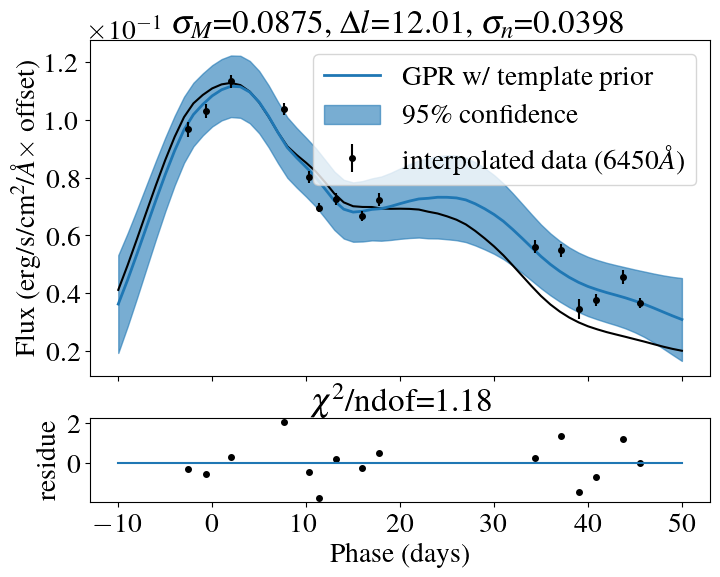

Optimization restart 1/10, f = -17.82172222451272
Optimization restart 2/10, f = -17.821722224509948
Optimization restart 3/10, f = -17.82172222451249
Optimization restart 4/10, f = -17.821722216559778
Optimization restart 5/10, f = -17.821722224511994
Optimization restart 6/10, f = -17.82172221825015
Optimization restart 7/10, f = -17.82172222451267
Optimization restart 8/10, f = -17.82172222451265
Optimization restart 9/10, f = -17.821722224512705
Optimization restart 10/10, f = -17.82172222451232


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0065534988269955585,+ve,"N(0.0065, 0.00065)"
sum.Mat52.lengthscale,12.10290295315643,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0013581947218931551,+ve,"N(0.0013, 0.00013)"


Optimization restart 1/10, f = -17.39268201427728
Optimization restart 2/10, f = -17.39268201427713
Optimization restart 3/10, f = -17.39268201423724
Optimization restart 4/10, f = -17.392682014263986
Optimization restart 5/10, f = -17.392682014276065
Optimization restart 6/10, f = -17.392682014214493
Optimization restart 7/10, f = -17.392682014276346
Optimization restart 8/10, f = -17.392682000964548
Optimization restart 9/10, f = -17.392682013903666
Optimization restart 10/10, f = -17.392681963596868


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005878397004007222,+ve,"N(0.0058, 0.00058)"
sum.Mat52.lengthscale,12.080471652814074,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0012265372681512943,+ve,"N(0.0012, 0.00012)"


Optimization restart 1/10, f = -16.07697216474333
Optimization restart 2/10, f = -16.076972164732556
Optimization restart 3/10, f = -16.07697216428012
Optimization restart 4/10, f = -16.076972164736972
Optimization restart 5/10, f = -16.076972164741775
Optimization restart 6/10, f = -16.07697216472522
Optimization restart 7/10, f = -16.076972164739367
Optimization restart 8/10, f = -16.076972164742596
Optimization restart 9/10, f = -16.076972164743328
Optimization restart 10/10, f = -16.076972164741495


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0057101274872925125,+ve,"N(0.0057, 0.00057)"
sum.Mat52.lengthscale,12.007239946092104,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0012048618876211261,+ve,"N(0.0011, 0.00011)"


Optimization restart 1/10, f = -14.278390268349108
Optimization restart 2/10, f = -14.278390268356103
Optimization restart 3/10, f = -14.27839026811705
Optimization restart 4/10, f = -14.278390268282173
Optimization restart 5/10, f = -14.278390268356377
Optimization restart 6/10, f = -14.278390214489052
Optimization restart 7/10, f = -14.278390268356365
Optimization restart 8/10, f = -14.278390268350169
Optimization restart 9/10, f = -14.278390268305365
Optimization restart 10/10, f = -14.278390268356357


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005885746326598154,+ve,"N(0.0059, 0.00059)"
sum.Mat52.lengthscale,11.792459470226435,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001255189598240148,+ve,"N(0.0012, 0.00012)"


Optimization restart 1/10, f = -14.203579772768467
Optimization restart 2/10, f = -14.20357977276158
Optimization restart 3/10, f = -14.20357977276846
Optimization restart 4/10, f = -14.203579772767542
Optimization restart 5/10, f = -14.203579772763955
Optimization restart 6/10, f = -14.20357977272651
Optimization restart 7/10, f = -14.2035797727673
Optimization restart 8/10, f = -14.203579772768416
Optimization restart 9/10, f = -14.20357977276584
Optimization restart 10/10, f = -14.203579772767146


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006419348078435725,+ve,"N(0.0064, 0.00064)"
sum.Mat52.lengthscale,11.851101794445988,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001364996912959629,+ve,"N(0.0013, 0.00013)"


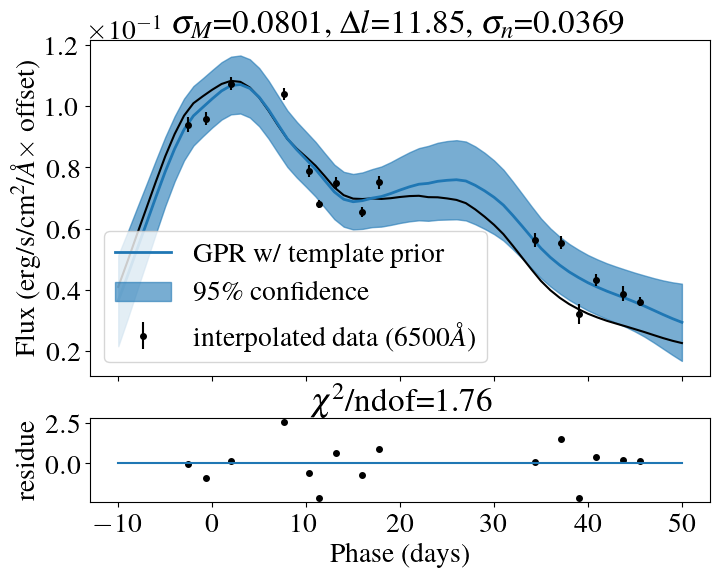

Optimization restart 1/10, f = -14.141551616928274
Optimization restart 2/10, f = -14.141551616922465
Optimization restart 3/10, f = -14.141551616909785
Optimization restart 4/10, f = -14.14155161692613
Optimization restart 5/10, f = -14.141551616925438
Optimization restart 6/10, f = -14.141551609249722
Optimization restart 7/10, f = -14.1415516169234
Optimization restart 8/10, f = -14.141551616924431
Optimization restart 9/10, f = -14.141551616928243
Optimization restart 10/10, f = -14.141551616921053


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0073683720508905025,+ve,"N(0.0073, 0.00073)"
sum.Mat52.lengthscale,12.031679272072179,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0015599568108282487,+ve,"N(0.0015, 0.00015)"


Optimization restart 1/10, f = -14.463064481351838
Optimization restart 2/10, f = -14.463064481340982
Optimization restart 3/10, f = -14.463064481351257
Optimization restart 4/10, f = -14.46306448135183
Optimization restart 5/10, f = -14.463064481326555
Optimization restart 6/10, f = -14.463064481351843
Optimization restart 7/10, f = -14.463064481348834
Optimization restart 8/10, f = -14.463064481348656
Optimization restart 9/10, f = -14.46306448117323
Optimization restart 10/10, f = -14.463064481351827


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.007357125994780632,+ve,"N(0.0073, 0.00073)"
sum.Mat52.lengthscale,11.988021554369471,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0015541848009105602,+ve,"N(0.0015, 0.00015)"


Optimization restart 1/10, f = -15.171949664295527
Optimization restart 2/10, f = -15.1719496640094
Optimization restart 3/10, f = -15.17194966428057
Optimization restart 4/10, f = -15.171949663303645
Optimization restart 5/10, f = -15.171949664295624
Optimization restart 6/10, f = -15.171949664186915
Optimization restart 7/10, f = -15.17194966429558
Optimization restart 8/10, f = -15.171949664295598
Optimization restart 9/10, f = -15.171949664295635
Optimization restart 10/10, f = -15.171949664262977


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006460769102755822,+ve,"N(0.0064, 0.00064)"
sum.Mat52.lengthscale,11.694007379163484,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0013636221256901886,+ve,"N(0.0013, 0.00013)"


Optimization restart 1/10, f = -15.558463193624537
Optimization restart 2/10, f = -15.558463193624805
Optimization restart 3/10, f = -15.558463193544254
Optimization restart 4/10, f = -15.558463193624725
Optimization restart 5/10, f = -15.558463193624734
Optimization restart 6/10, f = -15.558463192787007
Optimization restart 7/10, f = -15.55846319361927
Optimization restart 8/10, f = -15.558463193605823
Optimization restart 9/10, f = -15.558463193624805
Optimization restart 10/10, f = -15.558463193624588


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.00597007994000848,+ve,"N(0.0059, 0.00059)"
sum.Mat52.lengthscale,11.68652091509747,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0012604450523513175,+ve,"N(0.0012, 0.00012)"


Optimization restart 1/10, f = -16.04432552440237
Optimization restart 2/10, f = -16.044325524405757
Optimization restart 3/10, f = -16.044325519218038
Optimization restart 4/10, f = -16.044325524406112
Optimization restart 5/10, f = -16.04432552440614
Optimization restart 6/10, f = -16.044325524394417
Optimization restart 7/10, f = -16.044325524406
Optimization restart 8/10, f = -16.044325524401252
Optimization restart 9/10, f = -16.044325524406073
Optimization restart 10/10, f = -16.044325524403998


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.00590250118960635,+ve,"N(0.0059, 0.00059)"
sum.Mat52.lengthscale,12.143201399854075,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001243992613840126,+ve,"N(0.0012, 0.00012)"


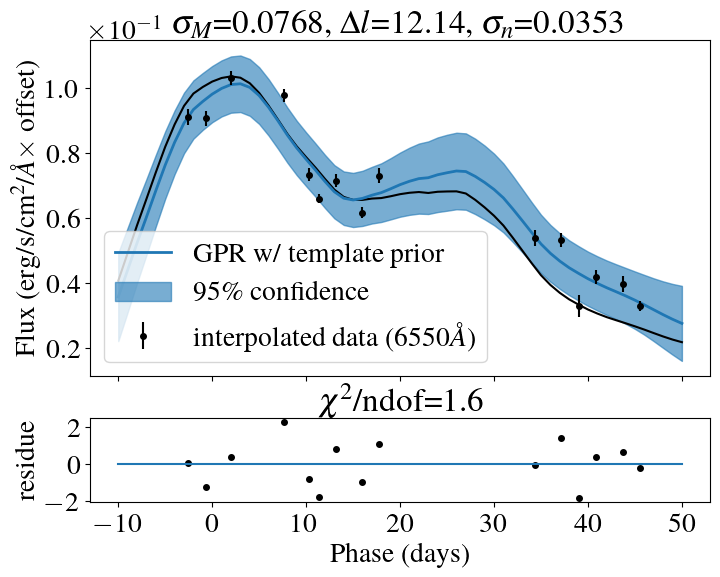

Optimization restart 1/10, f = -15.489573065624
Optimization restart 2/10, f = -15.489573063355058
Optimization restart 3/10, f = -15.489573065615064
Optimization restart 4/10, f = -15.48957306535183
Optimization restart 5/10, f = -15.489573065624002
Optimization restart 6/10, f = -15.489573060230759
Optimization restart 7/10, f = -15.489573065591024
Optimization restart 8/10, f = -15.489573065623981
Optimization restart 9/10, f = -15.489573065623983
Optimization restart 10/10, f = -15.489573065620428


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006449847388400196,+ve,"N(0.0064, 0.00064)"
sum.Mat52.lengthscale,12.331060662508378,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0013584883628020882,+ve,"N(0.0013, 0.00013)"


Optimization restart 1/10, f = -14.18117240260406
Optimization restart 2/10, f = -14.181172402603908
Optimization restart 3/10, f = -14.181172402603973
Optimization restart 4/10, f = -14.18117240259786
Optimization restart 5/10, f = -14.181172402603984
Optimization restart 6/10, f = -14.181172397635113
Optimization restart 7/10, f = -14.181172399151468
Optimization restart 8/10, f = -14.181172399973871
Optimization restart 9/10, f = -14.181172402602272
Optimization restart 10/10, f = -14.181172402603645


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.00716884485863433,+ve,"N(0.0071, 0.00071)"
sum.Mat52.lengthscale,11.87487081657548,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0015125772293525302,+ve,"N(0.0014, 0.00014)"


Optimization restart 1/10, f = -12.381150047453215
Optimization restart 2/10, f = -12.381150039778458
Optimization restart 3/10, f = -12.381150047009763
Optimization restart 4/10, f = -12.381150047454435
Optimization restart 5/10, f = -12.381150047453445
Optimization restart 6/10, f = -12.381150047454529
Optimization restart 7/10, f = -12.38115003010641
Optimization restart 8/10, f = -12.381150047454419
Optimization restart 9/10, f = -12.381150047441855
Optimization restart 10/10, f = -12.381150046349807


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.008238453372460854,+ve,"N(0.0082, 0.00082)"
sum.Mat52.lengthscale,11.237743222868998,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0017428927363555126,+ve,"N(0.0016, 0.00016)"


Optimization restart 1/10, f = -12.78140089910775
Optimization restart 2/10, f = -12.781400899105764
Optimization restart 3/10, f = -12.781400899107885
Optimization restart 4/10, f = -12.781400899107746
Optimization restart 5/10, f = -12.781400899104172
Optimization restart 6/10, f = -12.781400899080856
Optimization restart 7/10, f = -12.781400899107638
Optimization restart 8/10, f = -12.781400899103406
Optimization restart 9/10, f = -12.781400899107718
Optimization restart 10/10, f = -12.781400899072988


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.007199692792482966,+ve,"N(0.0072, 0.00072)"
sum.Mat52.lengthscale,11.17698915868877,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0015288343687887207,+ve,"N(0.0014, 0.00014)"


Optimization restart 1/10, f = -12.305019827292359
Optimization restart 2/10, f = -12.305019827288218
Optimization restart 3/10, f = -12.30501982725726
Optimization restart 4/10, f = -12.305019827292387
Optimization restart 5/10, f = -12.305019827292375
Optimization restart 6/10, f = -12.30501982729233
Optimization restart 7/10, f = -12.305019827062761
Optimization restart 8/10, f = -12.305019827292353
Optimization restart 9/10, f = -12.30501982729233
Optimization restart 10/10, f = -12.305019827292178


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006493817403120397,+ve,"N(0.0065, 0.00065)"
sum.Mat52.lengthscale,11.134501795859599,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0013913135243592712,+ve,"N(0.0013, 0.00013)"


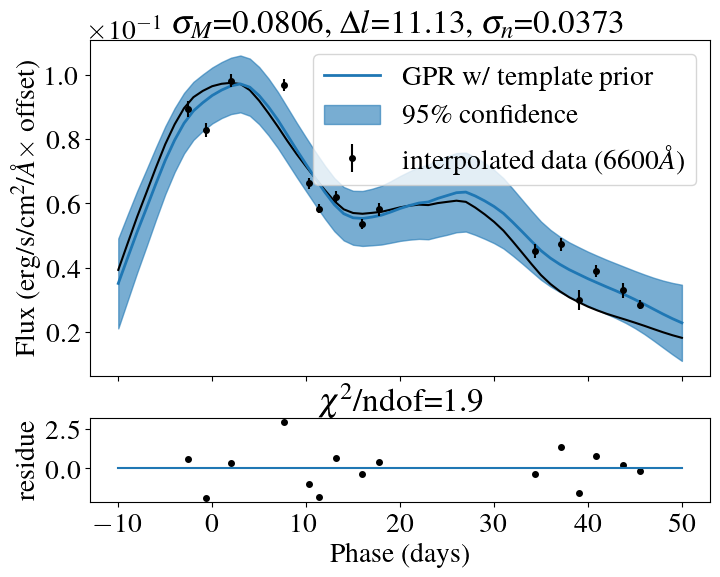

Optimization restart 1/10, f = -15.66414423129039
Optimization restart 2/10, f = -15.664144231290939
Optimization restart 3/10, f = -15.66414423129094
Optimization restart 4/10, f = -15.664144231283553
Optimization restart 5/10, f = -15.664144231290523
Optimization restart 6/10, f = -15.664144231290944
Optimization restart 7/10, f = -15.664144230767173
Optimization restart 8/10, f = -15.664144226868322
Optimization restart 9/10, f = -15.664144231255348
Optimization restart 10/10, f = -15.664144231290134


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005254567797975013,+ve,"N(0.0052, 0.00052)"
sum.Mat52.lengthscale,11.6699499760815,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0011133484590368004,+ve,"N(0.001, 0.0001)"


Optimization restart 1/10, f = -18.879588893657196
Optimization restart 2/10, f = -18.879588893624714
Optimization restart 3/10, f = -18.879588893657214
Optimization restart 4/10, f = -18.87958889359336
Optimization restart 5/10, f = -18.879588893651174
Optimization restart 6/10, f = -18.879588893656347
Optimization restart 7/10, f = -18.87958889364427
Optimization restart 8/10, f = -18.879588893656887
Optimization restart 9/10, f = -18.879588893373466
Optimization restart 10/10, f = -18.879588893605877


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.00457944177160602,+ve,"N(0.0046, 0.00046)"
sum.Mat52.lengthscale,12.107473182318534,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0009561789632682409,+ve,"N(0.00091, 9.1e-05)"


Optimization restart 1/10, f = -19.530991271729796
Optimization restart 2/10, f = -19.53099127172966
Optimization restart 3/10, f = -19.530991271490336
Optimization restart 4/10, f = -19.530991261311947
Optimization restart 5/10, f = -19.53099127170723
Optimization restart 6/10, f = -19.53099127173006
Optimization restart 7/10, f = -19.530991271730038
Optimization restart 8/10, f = -19.530991259900865
Optimization restart 9/10, f = -19.530991271729896
Optimization restart 10/10, f = -19.530991271659172


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003910307856793203,+ve,"N(0.0039, 0.00039)"
sum.Mat52.lengthscale,12.188160608445058,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0008160521449726933,+ve,"N(0.00078, 7.8e-05)"


Optimization restart 1/10, f = -16.54118171544533
Optimization restart 2/10, f = -16.541181715445347
Optimization restart 3/10, f = -16.541181715445155
Optimization restart 4/10, f = -16.541181715437446
Optimization restart 5/10, f = -16.541181696947724
Optimization restart 6/10, f = -16.541181715403503
Optimization restart 7/10, f = -16.541181706930583
Optimization restart 8/10, f = -16.541181715445315
Optimization restart 9/10, f = -16.541181715337018
Optimization restart 10/10, f = -16.541181715444612


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003881216960239563,+ve,"N(0.0039, 0.00039)"
sum.Mat52.lengthscale,12.176837582709206,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0008237378545110945,+ve,"N(0.00078, 7.8e-05)"


Optimization restart 1/10, f = -16.05827573387243
Optimization restart 2/10, f = -16.058275734479587
Optimization restart 3/10, f = -16.058275734465767
Optimization restart 4/10, f = -16.05827573447972
Optimization restart 5/10, f = -16.058275734479714
Optimization restart 6/10, f = -16.05827573447974
Optimization restart 7/10, f = -16.058275734479736
Optimization restart 8/10, f = -16.058275734479707
Optimization restart 9/10, f = -16.05827573447562
Optimization restart 10/10, f = -16.058275734430993


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0037900073053763954,+ve,"N(0.0038, 0.00038)"
sum.Mat52.lengthscale,11.980742285734339,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0008049146547723546,+ve,"N(0.00076, 7.6e-05)"


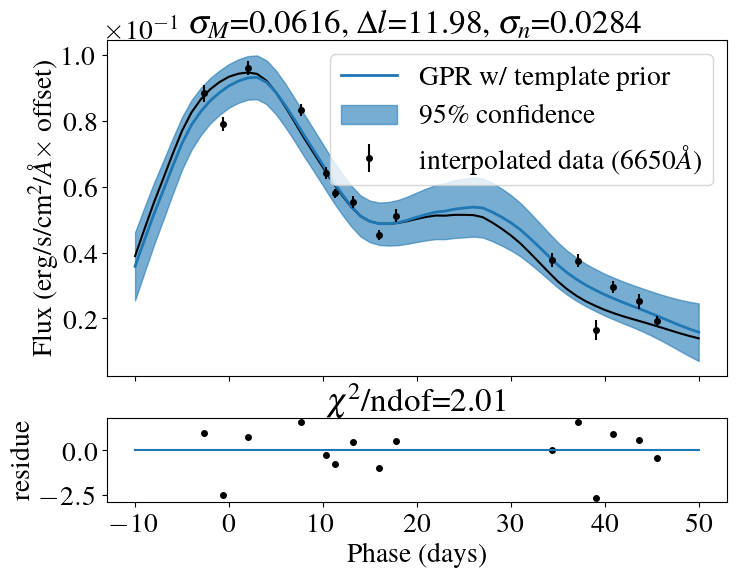

Optimization restart 1/10, f = -21.49172027802445
Optimization restart 2/10, f = -21.491720334110745
Optimization restart 3/10, f = -21.491720334089223
Optimization restart 4/10, f = -21.49172033337389
Optimization restart 5/10, f = -21.491720333082156
Optimization restart 6/10, f = -21.49172033411064
Optimization restart 7/10, f = -21.491720334078178
Optimization restart 8/10, f = -21.491720334107082
Optimization restart 9/10, f = -21.49172033388324
Optimization restart 10/10, f = -21.491720334110845


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0028041305851403344,+ve,"N(0.0028, 0.00028)"
sum.Mat52.lengthscale,11.40229116871109,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0005774562579373723,+ve,"N(0.00056, 5.6e-05)"


Optimization restart 1/10, f = -21.868809771264477
Optimization restart 2/10, f = -21.868809771258377
Optimization restart 3/10, f = -21.86880977126595
Optimization restart 4/10, f = -21.868809771267898
Optimization restart 5/10, f = -21.868809771267994
Optimization restart 6/10, f = -21.868809771268165
Optimization restart 7/10, f = -21.86880977008034
Optimization restart 8/10, f = -21.868809771268182
Optimization restart 9/10, f = -21.86880977126807
Optimization restart 10/10, f = -21.86880977126814


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0027703709434511044,+ve,"N(0.0027, 0.00027)"
sum.Mat52.lengthscale,11.048221698569346,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0005676561999459881,+ve,"N(0.00055, 5.5e-05)"


Optimization restart 1/10, f = -19.82057571776542
Optimization restart 2/10, f = -19.820575717798373
Optimization restart 3/10, f = -19.82057571779851
Optimization restart 4/10, f = -19.82057571779839
Optimization restart 5/10, f = -19.8205757177819
Optimization restart 6/10, f = -19.820575717794355
Optimization restart 7/10, f = -19.820575717798615
Optimization restart 8/10, f = -19.820575717798626
Optimization restart 9/10, f = -19.820575717798594
Optimization restart 10/10, f = -19.820575717798445


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0027569791296581784,+ve,"N(0.0027, 0.00027)"
sum.Mat52.lengthscale,11.352779264445727,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0005738793694774187,+ve,"N(0.00055, 5.5e-05)"


Optimization restart 1/10, f = -16.3962072207173
Optimization restart 2/10, f = -16.396207220717095
Optimization restart 3/10, f = -16.396207220716626
Optimization restart 4/10, f = -16.396207220461044
Optimization restart 5/10, f = -16.39620722065588
Optimization restart 6/10, f = -16.396207220679585
Optimization restart 7/10, f = -16.39620722071679
Optimization restart 8/10, f = -16.39620722071709
Optimization restart 9/10, f = -16.396207220654468
Optimization restart 10/10, f = -16.39620721715477


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0031917732827914038,+ve,"N(0.0032, 0.00032)"
sum.Mat52.lengthscale,11.688245167648153,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0006778743827199626,+ve,"N(0.00064, 6.4e-05)"


Optimization restart 1/10, f = -19.048290052159146
Optimization restart 2/10, f = -19.04829005215284
Optimization restart 3/10, f = -19.048290052157864
Optimization restart 4/10, f = -19.048290051202166
Optimization restart 5/10, f = -19.048290052157572
Optimization restart 6/10, f = -19.04828997547983
Optimization restart 7/10, f = -19.048290052158244
Optimization restart 8/10, f = -19.048290052158613
Optimization restart 9/10, f = -19.048290052159025
Optimization restart 10/10, f = -19.048290052142153


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.00320414554455446,+ve,"N(0.0032, 0.00032)"
sum.Mat52.lengthscale,11.645365299476719,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0006664943615978298,+ve,"N(0.00064, 6.4e-05)"


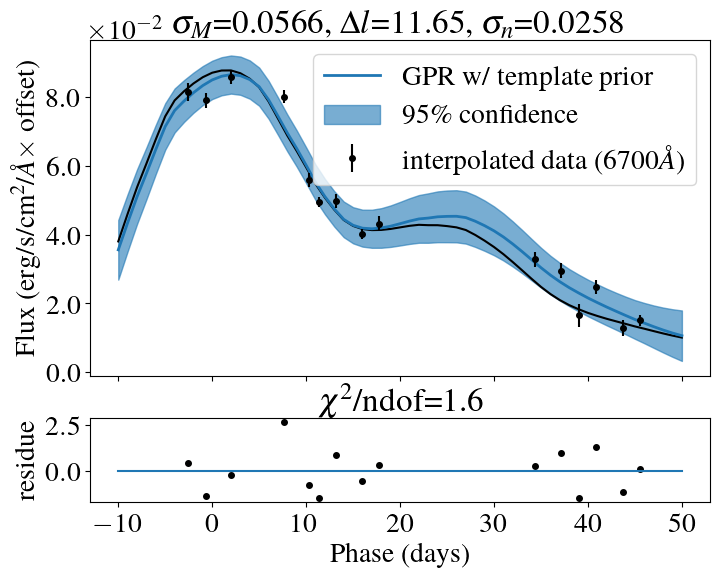

Optimization restart 1/10, f = -19.45110310835392
Optimization restart 2/10, f = -19.451103108319643
Optimization restart 3/10, f = -19.451103108353923
Optimization restart 4/10, f = -19.451103049547143
Optimization restart 5/10, f = -19.451103108043352
Optimization restart 6/10, f = -19.451103108353784
Optimization restart 7/10, f = -19.451103108353838
Optimization restart 8/10, f = -19.451103108346224
Optimization restart 9/10, f = -19.451103108353852
Optimization restart 10/10, f = -19.451103108352473


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0037970279079778788,+ve,"N(0.0038, 0.00038)"
sum.Mat52.lengthscale,11.654018382433884,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0007817607406538645,+ve,"N(0.00075, 7.5e-05)"


Optimization restart 1/10, f = -19.15067225214618
Optimization restart 2/10, f = -19.150672251743725
Optimization restart 3/10, f = -19.150672252146173
Optimization restart 4/10, f = -19.15067225214588
Optimization restart 5/10, f = -19.15067225214066
Optimization restart 6/10, f = -19.15067223432744
Optimization restart 7/10, f = -19.150672231542956
Optimization restart 8/10, f = -19.1506722521044
Optimization restart 9/10, f = -19.1506722521317
Optimization restart 10/10, f = -19.150672252119023


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003886459791519186,+ve,"N(0.0039, 0.00039)"
sum.Mat52.lengthscale,11.656746617214946,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0008008551011668831,+ve,"N(0.00077, 7.7e-05)"


Optimization restart 1/10, f = -17.267021855080174
Optimization restart 2/10, f = -17.26702185508337
Optimization restart 3/10, f = -17.26702185507778
Optimization restart 4/10, f = -17.267021854337308
Optimization restart 5/10, f = -17.267021855056647
Optimization restart 6/10, f = -17.267021855083634
Optimization restart 7/10, f = -17.267021854458683
Optimization restart 8/10, f = -17.267021854489737
Optimization restart 9/10, f = -17.26702185508413
Optimization restart 10/10, f = -17.26702185127212


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004028204405680798,+ve,"N(0.004, 0.0004)"
sum.Mat52.lengthscale,11.662528398515317,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0008397890617401429,+ve,"N(0.0008, 8e-05)"


Optimization restart 1/10, f = -15.474752383367182
Optimization restart 2/10, f = -15.474752382671833
Optimization restart 3/10, f = -15.474752383367157
Optimization restart 4/10, f = -15.474752383351243
Optimization restart 5/10, f = -15.474752383336854
Optimization restart 6/10, f = -15.474752383363702
Optimization restart 7/10, f = -15.474752383367166
Optimization restart 8/10, f = -15.474752383365244
Optimization restart 9/10, f = -15.474752383232849
Optimization restart 10/10, f = -15.474752383367157


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004643566920238301,+ve,"N(0.0046, 0.00046)"
sum.Mat52.lengthscale,11.858593302924325,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0009785884061895536,+ve,"N(0.00093, 9.3e-05)"


Optimization restart 1/10, f = -13.838241353687907
Optimization restart 2/10, f = -13.83824135368786
Optimization restart 3/10, f = -13.838241353687879
Optimization restart 4/10, f = -13.838241353687897
Optimization restart 5/10, f = -13.838241346244951
Optimization restart 6/10, f = -13.838241353687016
Optimization restart 7/10, f = -13.838241353687877
Optimization restart 8/10, f = -13.838241353687657
Optimization restart 9/10, f = -13.838241353687895
Optimization restart 10/10, f = -13.838241353687872


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006178676555815167,+ve,"N(0.0062, 0.00062)"
sum.Mat52.lengthscale,12.11557730050415,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0013088119887136756,+ve,"N(0.0012, 0.00012)"


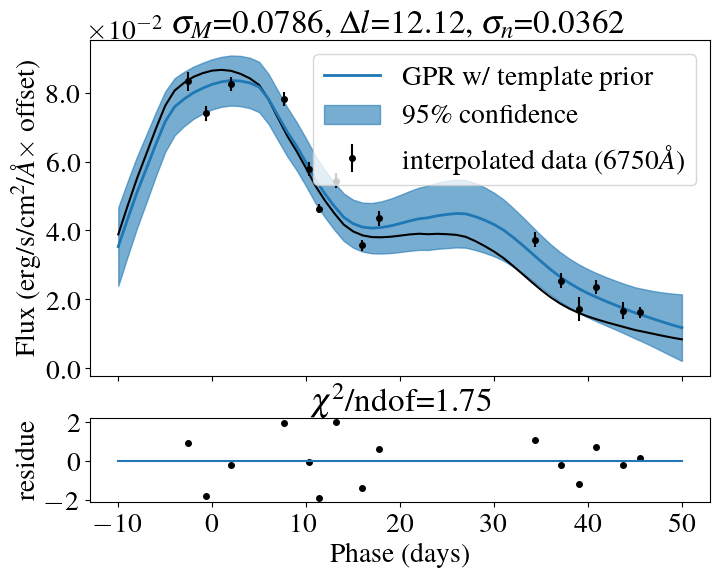

Optimization restart 1/10, f = -12.600323827183423
Optimization restart 2/10, f = -12.600323819758785
Optimization restart 3/10, f = -12.600323827180192
Optimization restart 4/10, f = -12.600323827163827
Optimization restart 5/10, f = -12.600323827183697
Optimization restart 6/10, f = -12.600323826952561
Optimization restart 7/10, f = -12.60032360428664
Optimization restart 8/10, f = -12.600323826621064
Optimization restart 9/10, f = -12.60032382718005
Optimization restart 10/10, f = -12.60032382718382


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.007375074028820377,+ve,"N(0.0073, 0.00073)"
sum.Mat52.lengthscale,12.162925064311079,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0015667952135649985,+ve,"N(0.0015, 0.00015)"


Optimization restart 1/10, f = -13.031049396916654
Optimization restart 2/10, f = -13.031049396910802
Optimization restart 3/10, f = -13.031049396916648
Optimization restart 4/10, f = -13.031049396916583
Optimization restart 5/10, f = -13.031049396916599
Optimization restart 6/10, f = -13.03104939689954
Optimization restart 7/10, f = -13.031049396159519
Optimization restart 8/10, f = -13.031049396916641
Optimization restart 9/10, f = -13.031049396910904
Optimization restart 10/10, f = -13.031049396781613


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0067647974620704595,+ve,"N(0.0067, 0.00067)"
sum.Mat52.lengthscale,11.91048765841281,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0014311803225253179,+ve,"N(0.0013, 0.00013)"


Optimization restart 1/10, f = -12.324455288845694
Optimization restart 2/10, f = -12.324455288845597
Optimization restart 3/10, f = -12.324455288844783
Optimization restart 4/10, f = -12.324455288845474
Optimization restart 5/10, f = -12.324455288845702
Optimization restart 6/10, f = -12.324455288836642
Optimization restart 7/10, f = -12.324455288751757
Optimization restart 8/10, f = -12.324455288837347
Optimization restart 9/10, f = -12.324455285482044
Optimization restart 10/10, f = -12.324455288845714


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.00671751587644941,+ve,"N(0.0067, 0.00067)"
sum.Mat52.lengthscale,11.556875665695594,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0014210742724886517,+ve,"N(0.0013, 0.00013)"


Optimization restart 1/10, f = -16.09332309152977
Optimization restart 2/10, f = -16.093323091539055
Optimization restart 3/10, f = -16.09332309153277
Optimization restart 4/10, f = -16.093323091509653
Optimization restart 5/10, f = -16.093323091538977
Optimization restart 6/10, f = -16.093323091528163
Optimization restart 7/10, f = -16.093323091539055
Optimization restart 8/10, f = -16.093323091522436
Optimization restart 9/10, f = -16.093323091537698
Optimization restart 10/10, f = -16.093323091539084


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0059078062380473724,+ve,"N(0.0059, 0.00059)"
sum.Mat52.lengthscale,11.46954232165693,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0012247884429057725,+ve,"N(0.0012, 0.00012)"


Optimization restart 1/10, f = -17.770666667679595
Optimization restart 2/10, f = -17.770666667679585
Optimization restart 3/10, f = -17.770666667679492
Optimization restart 4/10, f = -17.770666667679535
Optimization restart 5/10, f = -17.77066666767952
Optimization restart 6/10, f = -17.770666667679514
Optimization restart 7/10, f = -17.770666667679432
Optimization restart 8/10, f = -17.770666658833722
Optimization restart 9/10, f = -17.770666639392616
Optimization restart 10/10, f = -17.770666667679563


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006193818279628027,+ve,"N(0.0061, 0.00061)"
sum.Mat52.lengthscale,11.55112734603518,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001270305151165236,+ve,"N(0.0012, 0.00012)"


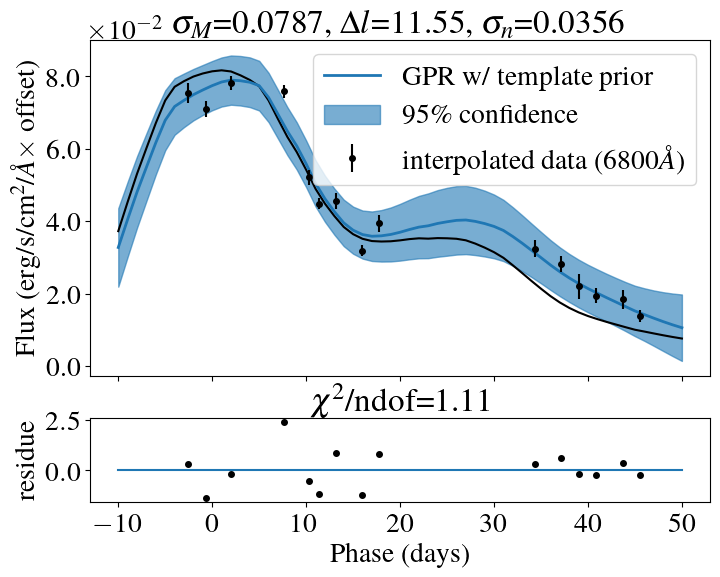

Optimization restart 1/10, f = -16.359169287018762
Optimization restart 2/10, f = -16.359169287018744
Optimization restart 3/10, f = -16.359169287018638
Optimization restart 4/10, f = -16.35916928701874
Optimization restart 5/10, f = -16.359169286077737
Optimization restart 6/10, f = -16.359169287017426
Optimization restart 7/10, f = -16.359169287018094
Optimization restart 8/10, f = -16.35916928595602
Optimization restart 9/10, f = -16.35916928695118
Optimization restart 10/10, f = -16.359169287018652


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.007089409311130067,+ve,"N(0.007, 0.0007)"
sum.Mat52.lengthscale,11.429479635081456,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0014596092345774618,+ve,"N(0.0014, 0.00014)"


Optimization restart 1/10, f = -13.832006549586254
Optimization restart 2/10, f = -13.83200654914666
Optimization restart 3/10, f = -13.832006549592581
Optimization restart 4/10, f = -13.832006547335778
Optimization restart 5/10, f = -13.83200654958781
Optimization restart 6/10, f = -13.832006528037414
Optimization restart 7/10, f = -13.832006549591531
Optimization restart 8/10, f = -13.832006548541788
Optimization restart 9/10, f = -13.83200654959259
Optimization restart 10/10, f = -13.832006549592716


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.008272214082004665,+ve,"N(0.0082, 0.00082)"
sum.Mat52.lengthscale,11.130257957061982,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0017198508975535683,+ve,"N(0.0016, 0.00016)"


Optimization restart 1/10, f = -14.052363748933697
Optimization restart 2/10, f = -14.052363748939039
Optimization restart 3/10, f = -14.05236372809823
Optimization restart 4/10, f = -14.052363748925128
Optimization restart 5/10, f = -14.052363748939534
Optimization restart 6/10, f = -14.052363748939555
Optimization restart 7/10, f = -14.052363748902287
Optimization restart 8/10, f = -14.052363748939332
Optimization restart 9/10, f = -14.052363748931805
Optimization restart 10/10, f = -14.052363748939499


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.008271655517236935,+ve,"N(0.0082, 0.00082)"
sum.Mat52.lengthscale,11.159144864520066,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0017167403125573804,+ve,"N(0.0016, 0.00016)"


Optimization restart 1/10, f = -17.52098798871636
Optimization restart 2/10, f = -17.520987988715937
Optimization restart 3/10, f = -17.520987988715618
Optimization restart 4/10, f = -17.52098798865502
Optimization restart 5/10, f = -17.52098798871633
Optimization restart 6/10, f = -17.520987988716293
Optimization restart 7/10, f = -17.520987988708363
Optimization restart 8/10, f = -17.520987988716186
Optimization restart 9/10, f = -17.520987988705812
Optimization restart 10/10, f = -17.520987988703254


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0065262677829567755,+ve,"N(0.0065, 0.00065)"
sum.Mat52.lengthscale,11.54566822145174,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001338073667721341,+ve,"N(0.0013, 0.00013)"


Optimization restart 1/10, f = -19.245427108245977
Optimization restart 2/10, f = -19.245427108234367
Optimization restart 3/10, f = -19.245427108229393
Optimization restart 4/10, f = -19.24542710824537
Optimization restart 5/10, f = -19.245427108214784
Optimization restart 6/10, f = -19.245427108246012
Optimization restart 7/10, f = -19.245427105227403
Optimization restart 8/10, f = -19.245427107451246
Optimization restart 9/10, f = -19.245427108245266
Optimization restart 10/10, f = -19.245427108227382


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005647790803430662,+ve,"N(0.0056, 0.00056)"
sum.Mat52.lengthscale,11.844361419493397,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0011529899833508856,+ve,"N(0.0011, 0.00011)"


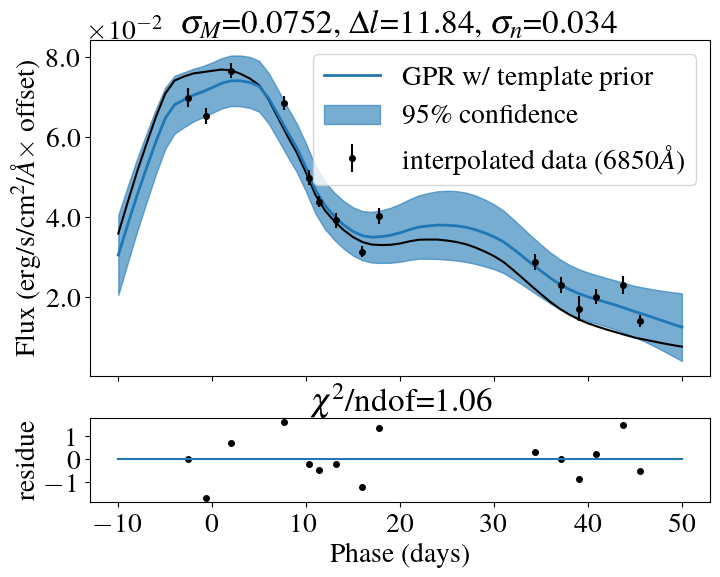

Optimization restart 1/10, f = -19.553908470878113
Optimization restart 2/10, f = -19.55390847087812
Optimization restart 3/10, f = -19.553908470829526
Optimization restart 4/10, f = -19.553908470871512
Optimization restart 5/10, f = -19.55390847087812
Optimization restart 6/10, f = -19.55390847087805
Optimization restart 7/10, f = -19.553908470875605
Optimization restart 8/10, f = -19.553908470878103
Optimization restart 9/10, f = -19.553908470806327
Optimization restart 10/10, f = -19.553908470876333


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004909205866067138,+ve,"N(0.0049, 0.00049)"
sum.Mat52.lengthscale,12.081159644487588,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001005021114813886,+ve,"N(0.00098, 9.8e-05)"


Optimization restart 1/10, f = -17.224333575082746
Optimization restart 2/10, f = -17.224333574968732
Optimization restart 3/10, f = -17.224333575083058
Optimization restart 4/10, f = -17.22433357504004
Optimization restart 5/10, f = -17.224333575076223
Optimization restart 6/10, f = -17.224333575083076
Optimization restart 7/10, f = -17.224333575082873
Optimization restart 8/10, f = -17.224333575083023
Optimization restart 9/10, f = -17.224333575083065
Optimization restart 10/10, f = -17.224333575080763


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005187286618023021,+ve,"N(0.0052, 0.00052)"
sum.Mat52.lengthscale,12.254782802832045,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0010760784002273743,+ve,"N(0.001, 0.0001)"


Optimization restart 1/10, f = -16.46351284425157
Optimization restart 2/10, f = -16.46351284425149
Optimization restart 3/10, f = -16.463512844249305
Optimization restart 4/10, f = -16.463512844251603
Optimization restart 5/10, f = -16.46351284419905
Optimization restart 6/10, f = -16.463512844243848
Optimization restart 7/10, f = -16.463512844214115
Optimization restart 8/10, f = -16.463512844248697
Optimization restart 9/10, f = -16.463512844180887
Optimization restart 10/10, f = -16.463512842811216


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005508213767247731,+ve,"N(0.0055, 0.00055)"
sum.Mat52.lengthscale,12.290837662956353,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001143970712838653,+ve,"N(0.0011, 0.00011)"


Optimization restart 1/10, f = -14.372024227713624
Optimization restart 2/10, f = -14.372024227713622
Optimization restart 3/10, f = -14.372024227711563
Optimization restart 4/10, f = -14.372024227701422
Optimization restart 5/10, f = -14.372024227694922
Optimization restart 6/10, f = -14.372024227713409
Optimization restart 7/10, f = -14.372024227713561
Optimization restart 8/10, f = -14.372024227679583
Optimization restart 9/10, f = -14.372024227713405
Optimization restart 10/10, f = -14.372024227704769


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006246528439873652,+ve,"N(0.0062, 0.00062)"
sum.Mat52.lengthscale,12.257690806505435,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0013080121884286532,+ve,"N(0.0012, 0.00012)"


Optimization restart 1/10, f = -16.26737527505053
Optimization restart 2/10, f = -16.267375275047442
Optimization restart 3/10, f = -16.267375275039672
Optimization restart 4/10, f = -16.267375275050533
Optimization restart 5/10, f = -16.26737527505047
Optimization restart 6/10, f = -16.267375275039576
Optimization restart 7/10, f = -16.26737525943053
Optimization restart 8/10, f = -16.26737527505053
Optimization restart 9/10, f = -16.2673752750505
Optimization restart 10/10, f = -16.26737527185074


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005359834985292059,+ve,"N(0.0054, 0.00054)"
sum.Mat52.lengthscale,12.33528453088619,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0011148393616770315,+ve,"N(0.0011, 0.00011)"


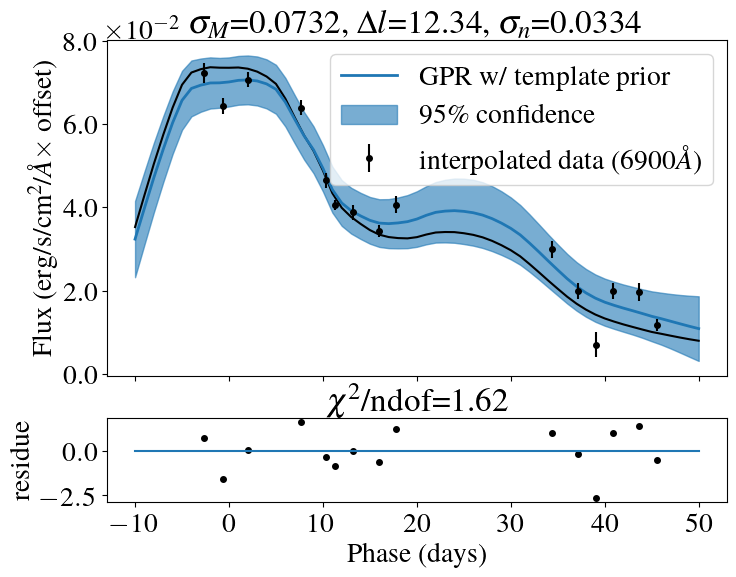

Optimization restart 1/10, f = -20.99540206351734
Optimization restart 2/10, f = -20.995402057242856
Optimization restart 3/10, f = -20.99540206354253
Optimization restart 4/10, f = -20.995402063507942
Optimization restart 5/10, f = -20.99540206354248
Optimization restart 6/10, f = -20.99540206354122
Optimization restart 7/10, f = -20.995402063534755
Optimization restart 8/10, f = -20.99540206354238
Optimization restart 9/10, f = -20.995402063541
Optimization restart 10/10, f = -20.995402063542567


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0037285719499359194,+ve,"N(0.0037, 0.00037)"
sum.Mat52.lengthscale,12.406893595874577,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0007629216177955329,+ve,"N(0.00075, 7.5e-05)"


Optimization restart 1/10, f = -22.706698028734486
Optimization restart 2/10, f = -22.706698028702775
Optimization restart 3/10, f = -22.70669802873328
Optimization restart 4/10, f = -22.706698028727978
Optimization restart 5/10, f = -22.706698020888656
Optimization restart 6/10, f = -22.70669802776468
Optimization restart 7/10, f = -22.70669802873452
Optimization restart 8/10, f = -22.70669802873455
Optimization restart 9/10, f = -22.706698028728734
Optimization restart 10/10, f = -22.706698028726688


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003172840651919175,+ve,"N(0.0032, 0.00032)"
sum.Mat52.lengthscale,12.368246311322768,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0006465775101523482,+ve,"N(0.00063, 6.3e-05)"


Optimization restart 1/10, f = -20.05476884466479
Optimization restart 2/10, f = -20.054768844568063
Optimization restart 3/10, f = -20.054768844664665
Optimization restart 4/10, f = -20.054768844664334
Optimization restart 5/10, f = -20.05476884456908
Optimization restart 6/10, f = -20.054768835957884
Optimization restart 7/10, f = -20.05476884466499
Optimization restart 8/10, f = -20.054768844488244
Optimization restart 9/10, f = -20.05476884466477
Optimization restart 10/10, f = -20.054768844664988


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003891803160095058,+ve,"N(0.0039, 0.00039)"
sum.Mat52.lengthscale,12.334895636676682,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0008011152567617323,+ve,"N(0.00078, 7.8e-05)"


Optimization restart 1/10, f = -16.668657476429775
Optimization restart 2/10, f = -16.668657476424237
Optimization restart 3/10, f = -16.66865746934309
Optimization restart 4/10, f = -16.668657476429622
Optimization restart 5/10, f = -16.668657476429484
Optimization restart 6/10, f = -16.668657476429757
Optimization restart 7/10, f = -16.668657476429672
Optimization restart 8/10, f = -16.66865747642578
Optimization restart 9/10, f = -16.66865747642927
Optimization restart 10/10, f = -16.66865747642963


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004962511708303977,+ve,"N(0.005, 0.0005)"
sum.Mat52.lengthscale,12.225126548695881,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001035957310495536,+ve,"N(0.00099, 9.9e-05)"


Optimization restart 1/10, f = -21.916464135573477
Optimization restart 2/10, f = -21.916464135573925
Optimization restart 3/10, f = -21.916464135318304
Optimization restart 4/10, f = -21.916464125476253
Optimization restart 5/10, f = -21.916464135570152
Optimization restart 6/10, f = -21.916464135460274
Optimization restart 7/10, f = -21.916464135573005
Optimization restart 8/10, f = -21.916464135556055
Optimization restart 9/10, f = -21.916464135573495
Optimization restart 10/10, f = -21.916464126647274


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003938171308414371,+ve,"N(0.0039, 0.00039)"
sum.Mat52.lengthscale,11.84299167029276,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0008009097361994885,+ve,"N(0.00078, 7.8e-05)"


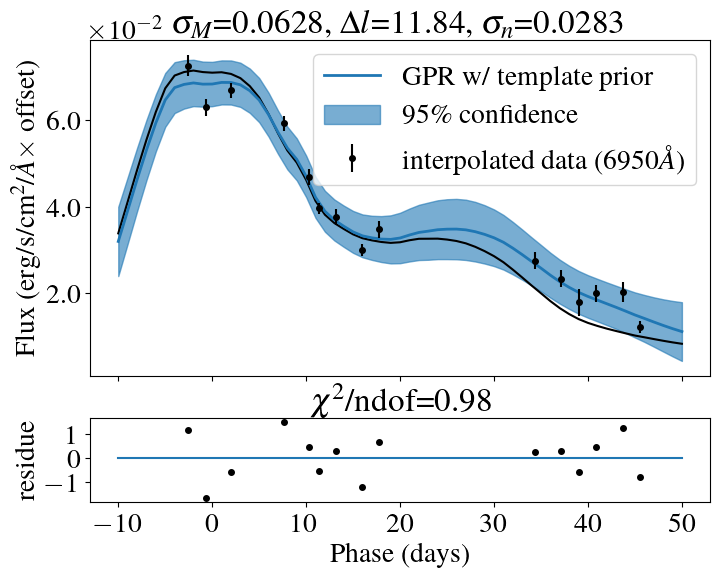

Optimization restart 1/10, f = -23.174202094200744
Optimization restart 2/10, f = -23.17420209420174
Optimization restart 3/10, f = -23.174202094201505
Optimization restart 4/10, f = -23.174202091522346
Optimization restart 5/10, f = -23.17420209405711
Optimization restart 6/10, f = -23.17420209396784
Optimization restart 7/10, f = -23.174202094201302
Optimization restart 8/10, f = -23.17420209420171
Optimization restart 9/10, f = -23.174202094200695
Optimization restart 10/10, f = -23.174202094163384


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.00424168532438107,+ve,"N(0.0042, 0.00042)"
sum.Mat52.lengthscale,11.166280091706666,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0008510200951444653,+ve,"N(0.00084, 8.4e-05)"


Optimization restart 1/10, f = -20.37683468799888
Optimization restart 2/10, f = -20.376834688021646
Optimization restart 3/10, f = -20.376834688019727
Optimization restart 4/10, f = -20.376834688022782
Optimization restart 5/10, f = -20.376834688025856
Optimization restart 6/10, f = -20.376834687989376
Optimization restart 7/10, f = -20.37683468802588
Optimization restart 8/10, f = -20.37683468802583
Optimization restart 9/10, f = -20.376834688025717
Optimization restart 10/10, f = -20.376834687942004


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005357219916538943,+ve,"N(0.0053, 0.00053)"
sum.Mat52.lengthscale,11.458131513497023,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0010876975254715956,+ve,"N(0.0011, 0.00011)"


Optimization restart 1/10, f = -15.204903572291418
Optimization restart 2/10, f = -15.204903572291459
Optimization restart 3/10, f = -15.20490357229148
Optimization restart 4/10, f = -15.204903572279665
Optimization restart 5/10, f = -15.204903572291373
Optimization restart 6/10, f = -15.204903572066671
Optimization restart 7/10, f = -15.204903572178388
Optimization restart 8/10, f = -15.204903572291371
Optimization restart 9/10, f = -15.204903572291332
Optimization restart 10/10, f = -15.20490357229156


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.007681450805182448,+ve,"N(0.0076, 0.00076)"
sum.Mat52.lengthscale,12.003809912331965,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0015987508889710842,+ve,"N(0.0015, 0.00015)"


Optimization restart 1/10, f = -13.180340852544209
Optimization restart 2/10, f = -13.180340852543491
Optimization restart 3/10, f = -13.18034085254421
Optimization restart 4/10, f = -13.1803408525439
Optimization restart 5/10, f = -13.180340852544166
Optimization restart 6/10, f = -13.180340852428792
Optimization restart 7/10, f = -13.180340852544212
Optimization restart 8/10, f = -13.180340844969658
Optimization restart 9/10, f = -13.18034085254326
Optimization restart 10/10, f = -13.180340852544015


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.008787530693184015,+ve,"N(0.0088, 0.00088)"
sum.Mat52.lengthscale,12.224421391148207,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0018457467969708629,+ve,"N(0.0018, 0.00018)"


Optimization restart 1/10, f = -16.293783075859924
Optimization restart 2/10, f = -16.29378306916937
Optimization restart 3/10, f = -16.29378305949723
Optimization restart 4/10, f = -16.29378307585983
Optimization restart 5/10, f = -16.293783075859544
Optimization restart 6/10, f = -16.29378307585982
Optimization restart 7/10, f = -16.293783075859288
Optimization restart 8/10, f = -16.293783075859732
Optimization restart 9/10, f = -16.29378307580178
Optimization restart 10/10, f = -16.29378307585977


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006690768768055518,+ve,"N(0.0067, 0.00067)"
sum.Mat52.lengthscale,12.308651491804158,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0013879711375928817,+ve,"N(0.0013, 0.00013)"


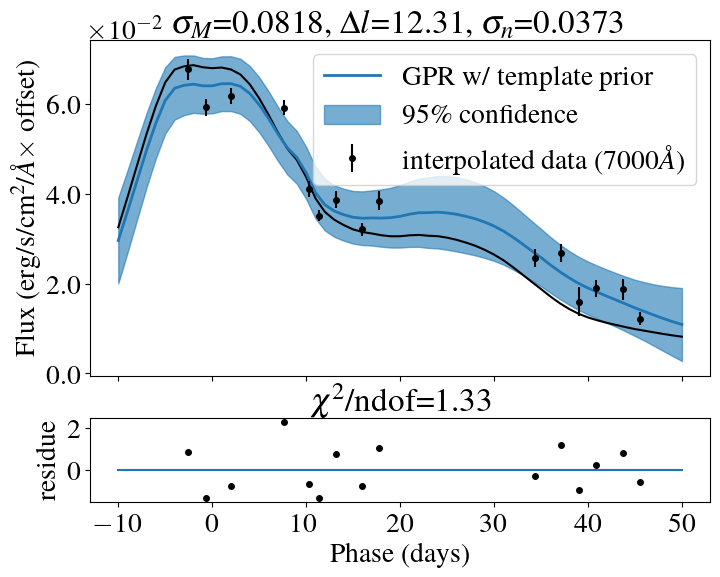

Optimization restart 1/10, f = -18.53888114926168
Optimization restart 2/10, f = -18.538881149261655
Optimization restart 3/10, f = -18.538881121264858
Optimization restart 4/10, f = -18.538881149261574
Optimization restart 5/10, f = -18.538881149261663
Optimization restart 6/10, f = -18.538881149233326
Optimization restart 7/10, f = -18.538881149261677
Optimization restart 8/10, f = -18.538881149261655
Optimization restart 9/10, f = -18.538881149253204
Optimization restart 10/10, f = -18.538881149261087


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005388285067346655,+ve,"N(0.0054, 0.00054)"
sum.Mat52.lengthscale,12.367499838727191,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0011074710765033736,+ve,"N(0.0011, 0.00011)"


Optimization restart 1/10, f = -19.259639335918493
Optimization restart 2/10, f = -19.259639335852427
Optimization restart 3/10, f = -19.259639335886806
Optimization restart 4/10, f = -19.2596393359157
Optimization restart 5/10, f = -19.25963933586049
Optimization restart 6/10, f = -19.259639335912375
Optimization restart 7/10, f = -19.259639335767787
Optimization restart 8/10, f = -19.25963933589112
Optimization restart 9/10, f = -19.259639335920923
Optimization restart 10/10, f = -19.25963933591954


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005665101669005875,+ve,"N(0.0056, 0.00056)"
sum.Mat52.lengthscale,12.20006333706952,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001150965582297102,+ve,"N(0.0011, 0.00011)"


Optimization restart 1/10, f = -15.476428745549933
Optimization restart 2/10, f = -15.476428745509972
Optimization restart 3/10, f = -15.476428745535205
Optimization restart 4/10, f = -15.476428745549924
Optimization restart 5/10, f = -15.476428745184824
Optimization restart 6/10, f = -15.476428745547322
Optimization restart 7/10, f = -15.476428745549894
Optimization restart 8/10, f = -15.476428702101213
Optimization restart 9/10, f = -15.476428745549907
Optimization restart 10/10, f = -15.476428745549908


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006860136511626386,+ve,"N(0.0068, 0.00068)"
sum.Mat52.lengthscale,11.945453086610573,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0014138613777734954,+ve,"N(0.0014, 0.00014)"


Optimization restart 1/10, f = -18.28008299237787
Optimization restart 2/10, f = -18.280082992316537
Optimization restart 3/10, f = -18.280082992377796
Optimization restart 4/10, f = -18.28008299237046
Optimization restart 5/10, f = -18.280082992353098
Optimization restart 6/10, f = -18.28008299237782
Optimization restart 7/10, f = -18.28008299237772
Optimization restart 8/10, f = -18.280082992375924
Optimization restart 9/10, f = -18.28008299237621
Optimization restart 10/10, f = -18.280082992349634


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006190986503169759,+ve,"N(0.0062, 0.00062)"
sum.Mat52.lengthscale,11.884989818448416,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0012520915721578566,+ve,"N(0.0012, 0.00012)"


Optimization restart 1/10, f = -21.383254563494276
Optimization restart 2/10, f = -21.383254563493058
Optimization restart 3/10, f = -21.38325456348455
Optimization restart 4/10, f = -21.383254563114484
Optimization restart 5/10, f = -21.383254563397227
Optimization restart 6/10, f = -21.38325456349011
Optimization restart 7/10, f = -21.38325456349428
Optimization restart 8/10, f = -21.38325456346723
Optimization restart 9/10, f = -21.38325456140641
Optimization restart 10/10, f = -21.383254563494265


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005207389596253239,+ve,"N(0.0052, 0.00052)"
sum.Mat52.lengthscale,11.926548034763272,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001038052458431046,+ve,"N(0.001, 0.0001)"


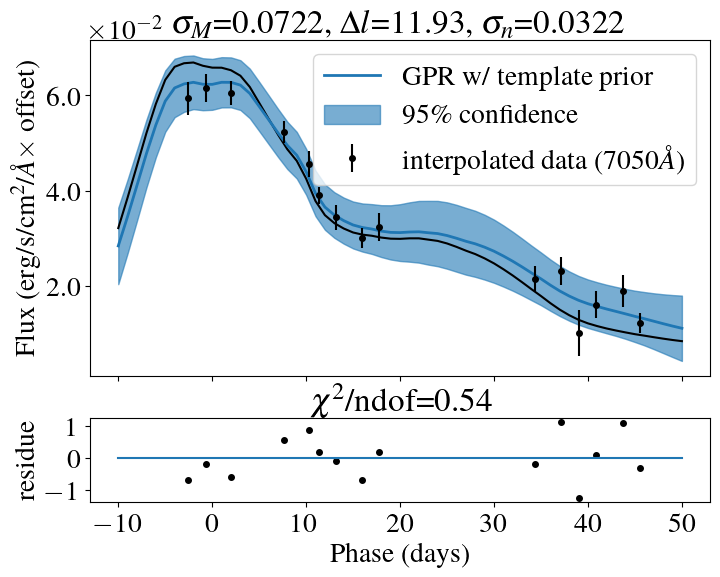

Optimization restart 1/10, f = -21.757005691375248
Optimization restart 2/10, f = -21.757005691728295
Optimization restart 3/10, f = -21.757005691728963
Optimization restart 4/10, f = -21.757005691729034
Optimization restart 5/10, f = -21.757005691723755
Optimization restart 6/10, f = -21.757005691571415
Optimization restart 7/10, f = -21.757005691696676
Optimization restart 8/10, f = -21.757005691729034
Optimization restart 9/10, f = -21.7570056917275
Optimization restart 10/10, f = -21.7570056917291


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004851960211763965,+ve,"N(0.0048, 0.00048)"
sum.Mat52.lengthscale,12.014065016294815,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0009672117651711444,+ve,"N(0.00097, 9.7e-05)"


Optimization restart 1/10, f = -20.75605182099781
Optimization restart 2/10, f = -20.756051820829686
Optimization restart 3/10, f = -20.75605182064558
Optimization restart 4/10, f = -20.756051820997563
Optimization restart 5/10, f = -20.756051820997868
Optimization restart 6/10, f = -20.756051820992077
Optimization restart 7/10, f = -20.756051820997385
Optimization restart 8/10, f = -20.756051820855944
Optimization restart 9/10, f = -20.75605182098742
Optimization restart 10/10, f = -20.75605182099784


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005091594150561311,+ve,"N(0.0051, 0.00051)"
sum.Mat52.lengthscale,12.158538168311255,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001022068358190325,+ve,"N(0.001, 0.0001)"


Optimization restart 1/10, f = -17.507330454765857
Optimization restart 2/10, f = -17.507330454754637
Optimization restart 3/10, f = -17.507330454765793
Optimization restart 4/10, f = -17.50733045476605
Optimization restart 5/10, f = -17.507330446121827
Optimization restart 6/10, f = -17.5073304547653
Optimization restart 7/10, f = -17.507330454733676
Optimization restart 8/10, f = -17.507330454766166
Optimization restart 9/10, f = -17.507330451714704
Optimization restart 10/10, f = -17.50733045475769


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005976797232770675,+ve,"N(0.006, 0.0006)"
sum.Mat52.lengthscale,12.31110450496321,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001223104009133442,+ve,"N(0.0012, 0.00012)"


Optimization restart 1/10, f = -20.645484368063386
Optimization restart 2/10, f = -20.645484365599184
Optimization restart 3/10, f = -20.645484368024377
Optimization restart 4/10, f = -20.645484368014344
Optimization restart 5/10, f = -20.645484366250756
Optimization restart 6/10, f = -20.64548436809293
Optimization restart 7/10, f = -20.645484367013818
Optimization restart 8/10, f = -20.64548436809403
Optimization restart 9/10, f = -20.645484368092752
Optimization restart 10/10, f = -20.645484368094284


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004422488135932643,+ve,"N(0.0044, 0.00044)"
sum.Mat52.lengthscale,12.404511032861135,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0008975113149296755,+ve,"N(0.00088, 8.8e-05)"


Optimization restart 1/10, f = -20.606098739390195
Optimization restart 2/10, f = -20.60609873939022
Optimization restart 3/10, f = -20.606098739388372
Optimization restart 4/10, f = -20.606098739379547
Optimization restart 5/10, f = -20.606098739388486
Optimization restart 6/10, f = -20.606098739255096
Optimization restart 7/10, f = -20.606098739390195
Optimization restart 8/10, f = -20.60609873939002
Optimization restart 9/10, f = -20.606098739120803
Optimization restart 10/10, f = -20.606098737095607


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0041934224221866585,+ve,"N(0.0042, 0.00042)"
sum.Mat52.lengthscale,12.442470413311773,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0008530139285731351,+ve,"N(0.00084, 8.4e-05)"


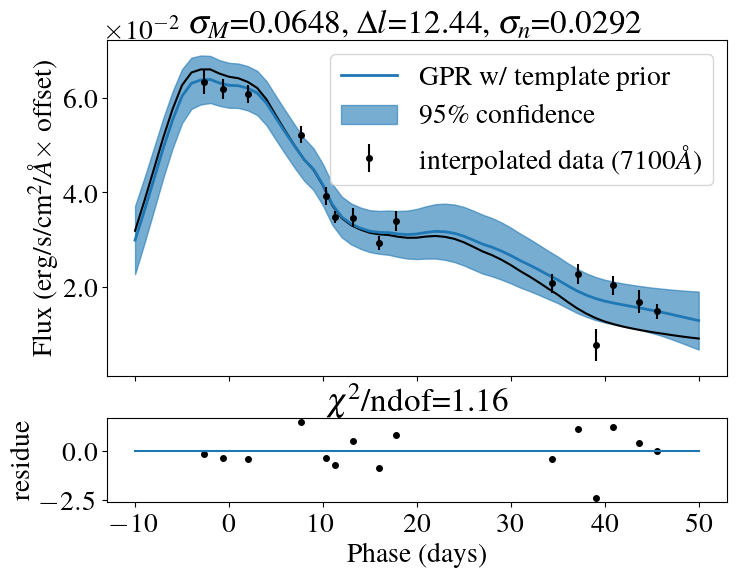

Optimization restart 1/10, f = -21.60577408216937
Optimization restart 2/10, f = -21.605774082169958
Optimization restart 3/10, f = -21.605774082171727
Optimization restart 4/10, f = -21.605774076406533
Optimization restart 5/10, f = -21.60577408214858
Optimization restart 6/10, f = -21.605774082171614
Optimization restart 7/10, f = -21.605774082171628
Optimization restart 8/10, f = -21.605774082171763
Optimization restart 9/10, f = -21.605774082155406
Optimization restart 10/10, f = -21.60577408209307


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0036029421817353633,+ve,"N(0.0036, 0.00036)"
sum.Mat52.lengthscale,12.30778516875951,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0007329291975850598,+ve,"N(0.00072, 7.2e-05)"


Optimization restart 1/10, f = -22.37509264398951
Optimization restart 2/10, f = -22.375092643964596
Optimization restart 3/10, f = -22.375092643980572
Optimization restart 4/10, f = -22.37509264397837
Optimization restart 5/10, f = -22.375092643961025
Optimization restart 6/10, f = -22.37509264395785
Optimization restart 7/10, f = -22.375092643723008
Optimization restart 8/10, f = -22.375092643307788
Optimization restart 9/10, f = -22.37509264394832
Optimization restart 10/10, f = -22.375092643989888


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0031130579930289098,+ve,"N(0.0031, 0.00031)"
sum.Mat52.lengthscale,12.084135086082203,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0006341297224981755,+ve,"N(0.00062, 6.2e-05)"


Optimization restart 1/10, f = -20.9357982011188
Optimization restart 2/10, f = -20.935798200741516
Optimization restart 3/10, f = -20.935798201123625
Optimization restart 4/10, f = -20.935798201123315
Optimization restart 5/10, f = -20.93579820112246
Optimization restart 6/10, f = -20.935798201123625
Optimization restart 7/10, f = -20.93579820112348
Optimization restart 8/10, f = -20.935798201115283
Optimization restart 9/10, f = -20.935798201118143
Optimization restart 10/10, f = -20.935798201123617


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0032723381472889476,+ve,"N(0.0033, 0.00033)"
sum.Mat52.lengthscale,11.89157176200727,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0006716219341693179,+ve,"N(0.00065, 6.5e-05)"


Optimization restart 1/10, f = -17.45225520673511
Optimization restart 2/10, f = -17.45225520669594
Optimization restart 3/10, f = -17.45225520544851
Optimization restart 4/10, f = -17.4522552067357
Optimization restart 5/10, f = -17.45225520671467
Optimization restart 6/10, f = -17.452255206735728
Optimization restart 7/10, f = -17.452255206732367
Optimization restart 8/10, f = -17.45225520673574
Optimization restart 9/10, f = -17.452255206735746
Optimization restart 10/10, f = -17.45225520673265


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004177021862437259,+ve,"N(0.0042, 0.00042)"
sum.Mat52.lengthscale,11.744353258226447,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0008662047125607705,+ve,"N(0.00083, 8.3e-05)"


Optimization restart 1/10, f = -12.84059253449226
Optimization restart 2/10, f = -12.840592534492265
Optimization restart 3/10, f = -12.840592534489932
Optimization restart 4/10, f = -12.84059253431954
Optimization restart 5/10, f = -12.84059253447844
Optimization restart 6/10, f = -12.840592534492268
Optimization restart 7/10, f = -12.840592534477011
Optimization restart 8/10, f = -12.840592534492277
Optimization restart 9/10, f = -12.840592534492252
Optimization restart 10/10, f = -12.840592534492107


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006142344308396039,+ve,"N(0.0061, 0.00061)"
sum.Mat52.lengthscale,11.518698998651733,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001289159617927472,+ve,"N(0.0012, 0.00012)"


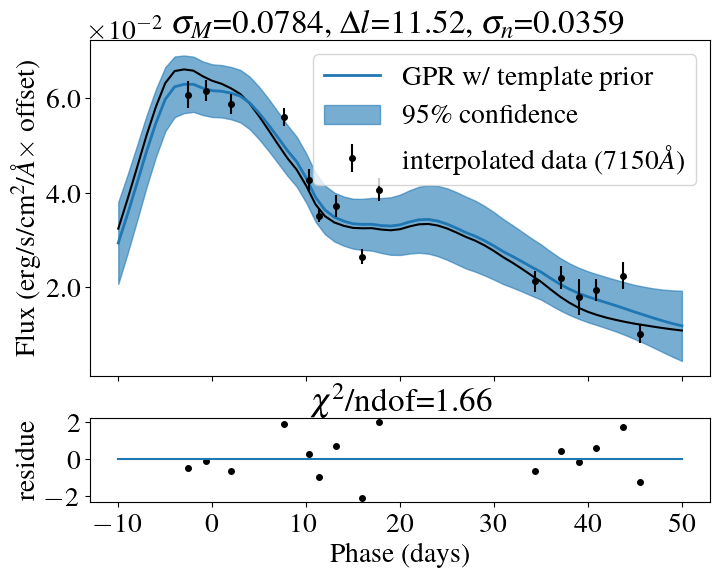

Optimization restart 1/10, f = -14.246210832670265
Optimization restart 2/10, f = -14.246210832668153
Optimization restart 3/10, f = -14.246210832670256
Optimization restart 4/10, f = -14.246210832670204
Optimization restart 5/10, f = -14.246210832604751
Optimization restart 6/10, f = -14.246210832665145
Optimization restart 7/10, f = -14.2462108326456
Optimization restart 8/10, f = -14.246210832664184
Optimization restart 9/10, f = -14.246210832666977
Optimization restart 10/10, f = -14.246210832670213


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0063309346478040785,+ve,"N(0.0063, 0.00063)"
sum.Mat52.lengthscale,11.416455254986609,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0013160472672906313,+ve,"N(0.0013, 0.00013)"


Optimization restart 1/10, f = -14.733613031974937
Optimization restart 2/10, f = -14.733613031974944
Optimization restart 3/10, f = -14.733613031970378
Optimization restart 4/10, f = -14.733613031974903
Optimization restart 5/10, f = -14.733613031973926
Optimization restart 6/10, f = -14.733613031945561
Optimization restart 7/10, f = -14.733613031932322
Optimization restart 8/10, f = -14.73361303197475
Optimization restart 9/10, f = -14.73361303197496
Optimization restart 10/10, f = -14.73361302675301


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0070395301914163546,+ve,"N(0.007, 0.0007)"
sum.Mat52.lengthscale,11.401466674632148,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001455806409571818,+ve,"N(0.0014, 0.00014)"


Optimization restart 1/10, f = -16.06394335612761
Optimization restart 2/10, f = -16.063943356083293
Optimization restart 3/10, f = -16.06394335612722
Optimization restart 4/10, f = -16.063943356127474
Optimization restart 5/10, f = -16.063943356103756
Optimization restart 6/10, f = -16.06394335611465
Optimization restart 7/10, f = -16.063943356112766
Optimization restart 8/10, f = -16.063943356126867
Optimization restart 9/10, f = -16.063943353723545
Optimization restart 10/10, f = -16.063943356010093


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0070871729118211395,+ve,"N(0.007, 0.0007)"
sum.Mat52.lengthscale,11.341394630680012,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0014517216754876543,+ve,"N(0.0014, 0.00014)"


Optimization restart 1/10, f = -17.63616984443584
Optimization restart 2/10, f = -17.63616984443579
Optimization restart 3/10, f = -17.636169844435596
Optimization restart 4/10, f = -17.63616984443584
Optimization restart 5/10, f = -17.636169844433162
Optimization restart 6/10, f = -17.636169844435784
Optimization restart 7/10, f = -17.636169844435813
Optimization restart 8/10, f = -17.63616984443574
Optimization restart 9/10, f = -17.6361698443842
Optimization restart 10/10, f = -17.636169844435795


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006903636748795074,+ve,"N(0.0068, 0.00068)"
sum.Mat52.lengthscale,11.168908587807532,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0013973626418464372,+ve,"N(0.0014, 0.00014)"


Optimization restart 1/10, f = -18.004720735352244
Optimization restart 2/10, f = -18.00472073535405
Optimization restart 3/10, f = -18.004720735353608
Optimization restart 4/10, f = -18.004720732315953
Optimization restart 5/10, f = -18.004720730731837
Optimization restart 6/10, f = -18.004720735354027
Optimization restart 7/10, f = -18.004720735354052
Optimization restart 8/10, f = -18.004720735354045
Optimization restart 9/10, f = -18.004720734935276
Optimization restart 10/10, f = -18.004720735354045


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.007050262811803613,+ve,"N(0.007, 0.0007)"
sum.Mat52.lengthscale,11.079438782201631,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0014204616974059035,+ve,"N(0.0014, 0.00014)"


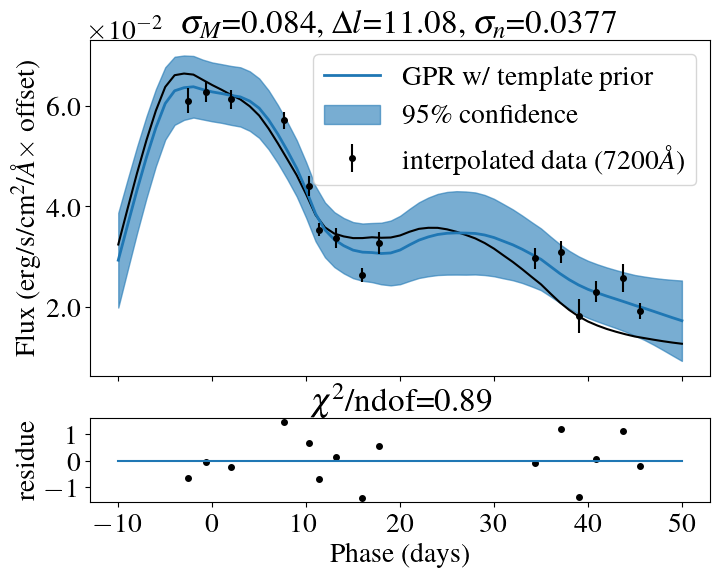

Optimization restart 1/10, f = -17.827408403097973
Optimization restart 2/10, f = -17.827408403097724
Optimization restart 3/10, f = -17.827408403066514
Optimization restart 4/10, f = -17.827408403037612
Optimization restart 5/10, f = -17.827408403034156
Optimization restart 6/10, f = -17.827408403097415
Optimization restart 7/10, f = -17.827408402908944
Optimization restart 8/10, f = -17.8274084030967
Optimization restart 9/10, f = -17.827408403097945
Optimization restart 10/10, f = -17.82740839400869


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006398735869500394,+ve,"N(0.0064, 0.00064)"
sum.Mat52.lengthscale,11.403918563103755,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001298808777169729,+ve,"N(0.0013, 0.00013)"


Optimization restart 1/10, f = -16.323360037654886
Optimization restart 2/10, f = -16.32336003765488
Optimization restart 3/10, f = -16.32336003765183
Optimization restart 4/10, f = -16.3233600321984
Optimization restart 5/10, f = -16.32336003765476
Optimization restart 6/10, f = -16.323360037654478
Optimization restart 7/10, f = -16.323360037606967
Optimization restart 8/10, f = -16.32336003086658
Optimization restart 9/10, f = -16.32336003765098
Optimization restart 10/10, f = -16.323360037654865


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006277134579962233,+ve,"N(0.0063, 0.00063)"
sum.Mat52.lengthscale,11.753897160416471,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0012906968973638866,+ve,"N(0.0013, 0.00013)"


Optimization restart 1/10, f = -15.756223035368746
Optimization restart 2/10, f = -15.756223035368755
Optimization restart 3/10, f = -15.756223035353997
Optimization restart 4/10, f = -15.756223035364398
Optimization restart 5/10, f = -15.756223035368777
Optimization restart 6/10, f = -15.756223035367901
Optimization restart 7/10, f = -15.75622303536877
Optimization restart 8/10, f = -15.756223035367437
Optimization restart 9/10, f = -15.756223035368778
Optimization restart 10/10, f = -15.756223035025846


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0076306823756143805,+ve,"N(0.0076, 0.00076)"
sum.Mat52.lengthscale,11.878498204258484,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0015648612395117855,+ve,"N(0.0015, 0.00015)"


Optimization restart 1/10, f = -13.44358958104353
Optimization restart 2/10, f = -13.443589581028714
Optimization restart 3/10, f = -13.443589580939902
Optimization restart 4/10, f = -13.443589581043991
Optimization restart 5/10, f = -13.443589579374445
Optimization restart 6/10, f = -13.443589578496056
Optimization restart 7/10, f = -13.443589579435839
Optimization restart 8/10, f = -13.44358958104414
Optimization restart 9/10, f = -13.443589581037388
Optimization restart 10/10, f = -13.443589581043984


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.011048516464748458,+ve,"N(0.011, 0.0011)"
sum.Mat52.lengthscale,11.68790098506449,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0022646544176609835,+ve,"N(0.0022, 0.00022)"


Optimization restart 1/10, f = -14.051714727722747
Optimization restart 2/10, f = -14.051714727352287
Optimization restart 3/10, f = -14.05171472399236
Optimization restart 4/10, f = -14.051714727722603
Optimization restart 5/10, f = -14.051714727722763
Optimization restart 6/10, f = -14.051714727722754
Optimization restart 7/10, f = -14.051714727721084
Optimization restart 8/10, f = -14.051714727017629
Optimization restart 9/10, f = -14.051714727722766
Optimization restart 10/10, f = -14.05171472772275


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.011328791231105154,+ve,"N(0.011, 0.0011)"
sum.Mat52.lengthscale,11.529963333010718,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0023047119656785684,+ve,"N(0.0022, 0.00022)"


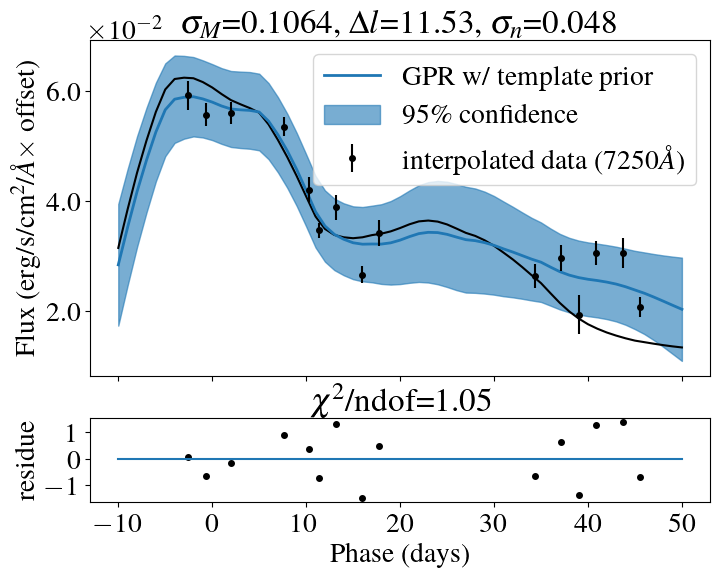

Optimization restart 1/10, f = -20.22911135000982
Optimization restart 2/10, f = -20.229111343892363
Optimization restart 3/10, f = -20.229111350025477
Optimization restart 4/10, f = -20.22911135002746
Optimization restart 5/10, f = -20.229111349811646
Optimization restart 6/10, f = -20.229111350024418
Optimization restart 7/10, f = -20.229111350026315
Optimization restart 8/10, f = -20.22911134995688
Optimization restart 9/10, f = -20.229111350024137
Optimization restart 10/10, f = -20.229111350008623


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006069514780779558,+ve,"N(0.006, 0.0006)"
sum.Mat52.lengthscale,11.568577894798397,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0012140191814221009,+ve,"N(0.0012, 0.00012)"


Optimization restart 1/10, f = -22.489346216001934
Optimization restart 2/10, f = -22.489346215991635
Optimization restart 3/10, f = -22.489346216000968
Optimization restart 4/10, f = -22.489346190201587
Optimization restart 5/10, f = -22.489346216001792
Optimization restart 6/10, f = -22.48934621039247
Optimization restart 7/10, f = -22.48934621573198
Optimization restart 8/10, f = -22.48934621600193
Optimization restart 9/10, f = -22.489346215959813
Optimization restart 10/10, f = -22.489346215978767


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0038143576662902326,+ve,"N(0.0038, 0.00038)"
sum.Mat52.lengthscale,11.524756867773839,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0007649025843444892,+ve,"N(0.00076, 7.6e-05)"


Optimization restart 1/10, f = -22.55493991005294
Optimization restart 2/10, f = -22.55493989930963
Optimization restart 3/10, f = -22.55493991005344
Optimization restart 4/10, f = -22.554939910053605
Optimization restart 5/10, f = -22.554939908862764
Optimization restart 6/10, f = -22.554939868475692
Optimization restart 7/10, f = -22.554939907509212
Optimization restart 8/10, f = -22.55493991004262
Optimization restart 9/10, f = -22.554939910049097
Optimization restart 10/10, f = -22.554939910053612


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0032992182638410705,+ve,"N(0.0033, 0.00033)"
sum.Mat52.lengthscale,11.967002786456904,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0006649325422765486,+ve,"N(0.00066, 6.6e-05)"


Optimization restart 1/10, f = -18.134762973519173
Optimization restart 2/10, f = -18.13476297351889
Optimization restart 3/10, f = -18.13476297351906
Optimization restart 4/10, f = -18.13476297351918
Optimization restart 5/10, f = -18.13476297205704
Optimization restart 6/10, f = -18.13476297351903
Optimization restart 7/10, f = -18.13476297351848
Optimization restart 8/10, f = -18.134762973519162
Optimization restart 9/10, f = -18.134762973519173
Optimization restart 10/10, f = -18.134762973514132


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004154120568734358,+ve,"N(0.0042, 0.00042)"
sum.Mat52.lengthscale,12.427222504529205,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0008555606373794627,+ve,"N(0.00083, 8.3e-05)"


Optimization restart 1/10, f = -17.170832040434483
Optimization restart 2/10, f = -17.170832040165823
Optimization restart 3/10, f = -17.17083204044952
Optimization restart 4/10, f = -17.17083204049214
Optimization restart 5/10, f = -17.17083204049214
Optimization restart 6/10, f = -17.170832040487266
Optimization restart 7/10, f = -17.170832040492144
Optimization restart 8/10, f = -17.170832040461022
Optimization restart 9/10, f = -17.17083203905642
Optimization restart 10/10, f = -17.170832035412


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003993973756774757,+ve,"N(0.004, 0.0004)"
sum.Mat52.lengthscale,12.441038985748646,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.000828579439508105,+ve,"N(0.0008, 8e-05)"


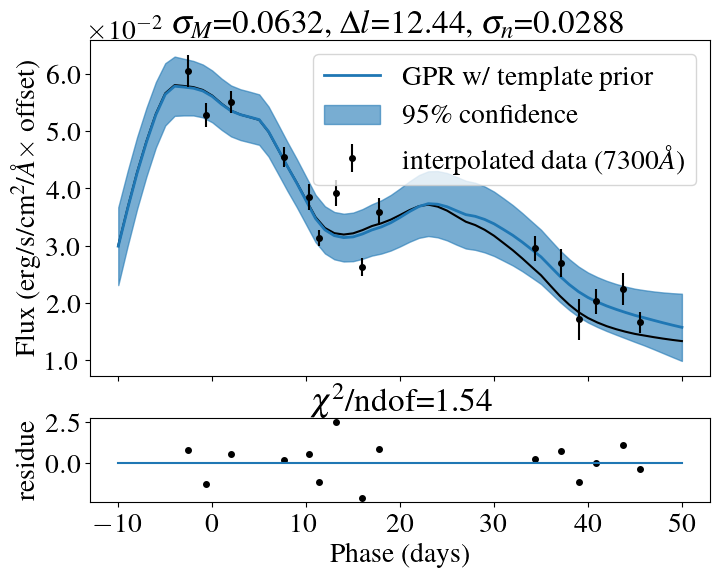

Optimization restart 1/10, f = -20.494228885734515
Optimization restart 2/10, f = -20.49422888573427
Optimization restart 3/10, f = -20.49422888573449
Optimization restart 4/10, f = -20.494228885734486
Optimization restart 5/10, f = -20.494228885692415
Optimization restart 6/10, f = -20.494228885734483
Optimization restart 7/10, f = -20.494228885734504
Optimization restart 8/10, f = -20.49422888573451
Optimization restart 9/10, f = -20.49422888573215
Optimization restart 10/10, f = -20.494228885723132


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0027996803507055893,+ve,"N(0.0028, 0.00028)"
sum.Mat52.lengthscale,11.988695966907695,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0005738855860661383,+ve,"N(0.00056, 5.6e-05)"


Optimization restart 1/10, f = -20.1221364876399
Optimization restart 2/10, f = -20.12213648848992
Optimization restart 3/10, f = -20.122136488489907
Optimization restart 4/10, f = -20.12213648848926
Optimization restart 5/10, f = -20.122136488457677
Optimization restart 6/10, f = -20.122136488489907
Optimization restart 7/10, f = -20.122136485776778
Optimization restart 8/10, f = -20.122136486574256
Optimization restart 9/10, f = -20.12213648848729
Optimization restart 10/10, f = -20.12213648848927


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0031111453902542495,+ve,"N(0.0031, 0.00031)"
sum.Mat52.lengthscale,11.646498540672283,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.000636171174280083,+ve,"N(0.00062, 6.2e-05)"


Optimization restart 1/10, f = -19.93347929487684
Optimization restart 2/10, f = -19.93347929407078
Optimization restart 3/10, f = -19.93347929480801
Optimization restart 4/10, f = -19.933479292173374
Optimization restart 5/10, f = -19.933479294841867
Optimization restart 6/10, f = -19.933479294830192
Optimization restart 7/10, f = -19.933479294877372
Optimization restart 8/10, f = -19.933479294877323
Optimization restart 9/10, f = -19.933479294877344
Optimization restart 10/10, f = -19.93347929484383


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004176755844316343,+ve,"N(0.0042, 0.00042)"
sum.Mat52.lengthscale,12.003725355697247,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0008496661537537292,+ve,"N(0.00083, 8.3e-05)"


Optimization restart 1/10, f = -16.27073267238827
Optimization restart 2/10, f = -16.270732672036498
Optimization restart 3/10, f = -16.270732672388764
Optimization restart 4/10, f = -16.27073267238877
Optimization restart 5/10, f = -16.27073267238879
Optimization restart 6/10, f = -16.27073267232753
Optimization restart 7/10, f = -16.270732672374077
Optimization restart 8/10, f = -16.27073267238879
Optimization restart 9/10, f = -16.270732672388746
Optimization restart 10/10, f = -16.27073267238783


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.008107152133307838,+ve,"N(0.0081, 0.00081)"
sum.Mat52.lengthscale,12.223764268886558,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0016534376458192915,+ve,"N(0.0016, 0.00016)"


Optimization restart 1/10, f = -16.47367341290795
Optimization restart 2/10, f = -16.47367341291003
Optimization restart 3/10, f = -16.473673412910003
Optimization restart 4/10, f = -16.47367341290356
Optimization restart 5/10, f = -16.473673412897632
Optimization restart 6/10, f = -16.473673412908845
Optimization restart 7/10, f = -16.473673412866226
Optimization restart 8/10, f = -16.473673334716906
Optimization restart 9/10, f = -16.47367341197794
Optimization restart 10/10, f = -16.473673412909925


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.007926785894646552,+ve,"N(0.0079, 0.00079)"
sum.Mat52.lengthscale,12.250734541274968,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0016147991924165004,+ve,"N(0.0016, 0.00016)"


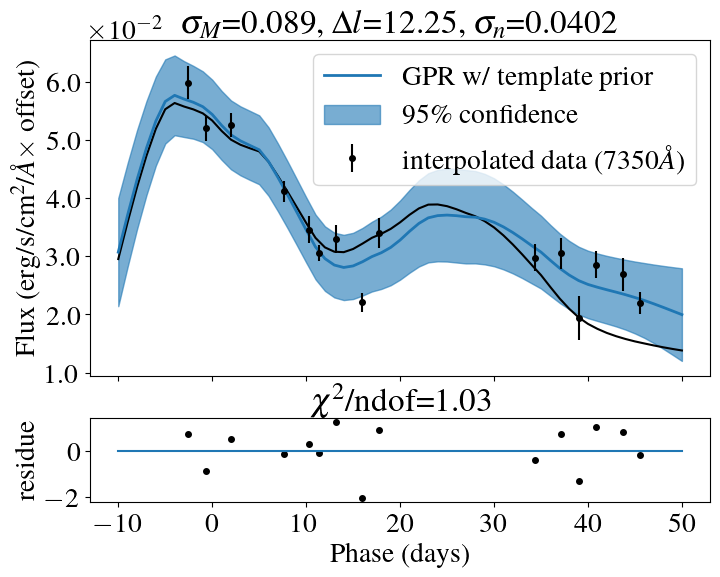

Optimization restart 1/10, f = -18.236125659669973
Optimization restart 2/10, f = -18.23612565866647
Optimization restart 3/10, f = -18.23612565966462
Optimization restart 4/10, f = -18.236125658545443
Optimization restart 5/10, f = -18.236125659669973
Optimization restart 6/10, f = -18.236125659669973
Optimization restart 7/10, f = -18.236125659625323
Optimization restart 8/10, f = -18.23612565966959
Optimization restart 9/10, f = -18.236125659669717
Optimization restart 10/10, f = -18.236125659034784


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006181563802086257,+ve,"N(0.0062, 0.00062)"
sum.Mat52.lengthscale,12.244431016471353,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0012545800266375833,+ve,"N(0.0012, 0.00012)"


Optimization restart 1/10, f = -19.345228685218206
Optimization restart 2/10, f = -19.3452286777539
Optimization restart 3/10, f = -19.34522868521912
Optimization restart 4/10, f = -19.34522868488571
Optimization restart 5/10, f = -19.345228685219286
Optimization restart 6/10, f = -19.345228685219283
Optimization restart 7/10, f = -19.345228685219297
Optimization restart 8/10, f = -19.345228685218302
Optimization restart 9/10, f = -19.3452286843568
Optimization restart 10/10, f = -19.34522868518245


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005611530270975024,+ve,"N(0.0056, 0.00056)"
sum.Mat52.lengthscale,12.207952878730568,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0011340278122762499,+ve,"N(0.0011, 0.00011)"


Optimization restart 1/10, f = -21.04002187864198
Optimization restart 2/10, f = -21.04002187864389
Optimization restart 3/10, f = -21.040021878638893
Optimization restart 4/10, f = -21.04002187853473
Optimization restart 5/10, f = -21.040021878644154
Optimization restart 6/10, f = -21.040021878644303
Optimization restart 7/10, f = -21.040021878133455
Optimization restart 8/10, f = -21.040021878644247
Optimization restart 9/10, f = -21.040021878644147
Optimization restart 10/10, f = -21.04002187864431


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005584957629410288,+ve,"N(0.0056, 0.00056)"
sum.Mat52.lengthscale,12.13770817298849,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0011183206174750872,+ve,"N(0.0011, 0.00011)"


Optimization restart 1/10, f = -20.440492410494947
Optimization restart 2/10, f = -20.44049241049173
Optimization restart 3/10, f = -20.440492410496503
Optimization restart 4/10, f = -20.440492408347
Optimization restart 5/10, f = -20.44049241048365
Optimization restart 6/10, f = -20.440492410496404
Optimization restart 7/10, f = -20.440492410494343
Optimization restart 8/10, f = -20.440492410493736
Optimization restart 9/10, f = -20.440492410373864
Optimization restart 10/10, f = -20.44049241047601


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.007076724813331092,+ve,"N(0.007, 0.0007)"
sum.Mat52.lengthscale,12.187275133415401,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0014136231037466666,+ve,"N(0.0014, 0.00014)"


Optimization restart 1/10, f = -17.72557475628919
Optimization restart 2/10, f = -17.72557475629023
Optimization restart 3/10, f = -17.725574756291067
Optimization restart 4/10, f = -17.725574752159744
Optimization restart 5/10, f = -17.72557475628067
Optimization restart 6/10, f = -17.72557475629059
Optimization restart 7/10, f = -17.725574756290325
Optimization restart 8/10, f = -17.725574756269722
Optimization restart 9/10, f = -17.72557475628126
Optimization restart 10/10, f = -17.72557475629029


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.009153457928106793,+ve,"N(0.0091, 0.00091)"
sum.Mat52.lengthscale,12.320996834879589,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0018445145593867984,+ve,"N(0.0018, 0.00018)"


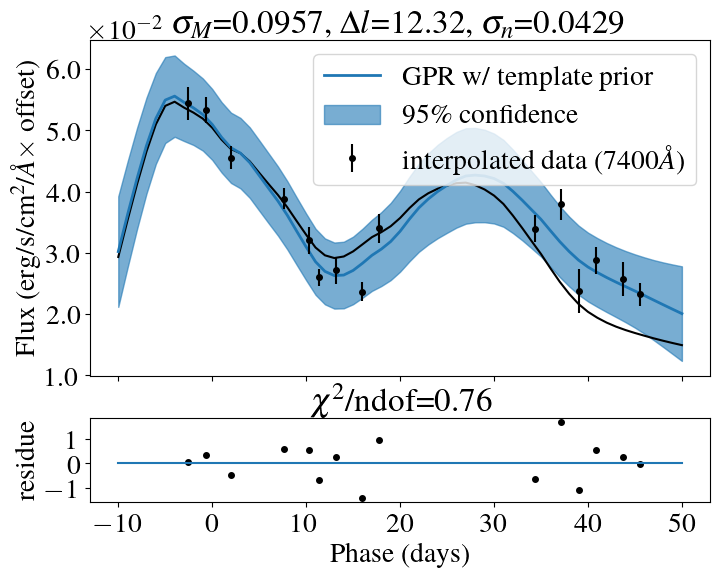

Optimization restart 1/10, f = -13.9017336989103
Optimization restart 2/10, f = -13.901733698910416
Optimization restart 3/10, f = -13.90173369890711
Optimization restart 4/10, f = -13.901733698861099
Optimization restart 5/10, f = -13.901733698415397
Optimization restart 6/10, f = -13.901733698910416
Optimization restart 7/10, f = -13.901733698910403
Optimization restart 8/10, f = -13.901733698910398
Optimization restart 9/10, f = -13.901733698892215
Optimization restart 10/10, f = -13.901733698910265


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.012139882848017142,+ve,"N(0.012, 0.0012)"
sum.Mat52.lengthscale,12.449483983049154,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0024844731525611044,+ve,"N(0.0024, 0.00024)"


Optimization restart 1/10, f = -11.996897481567812
Optimization restart 2/10, f = -11.99689748156779
Optimization restart 3/10, f = -11.996897481567817
Optimization restart 4/10, f = -11.996897481566608
Optimization restart 5/10, f = -11.99689748156777
Optimization restart 6/10, f = -11.996897480712354
Optimization restart 7/10, f = -11.996897477568513
Optimization restart 8/10, f = -11.996897481567817
Optimization restart 9/10, f = -11.996897481560541
Optimization restart 10/10, f = -11.996897479239662


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.013975972860374015,+ve,"N(0.014, 0.0014)"
sum.Mat52.lengthscale,12.478319350935378,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.002881298281871568,+ve,"N(0.0028, 0.00028)"


Optimization restart 1/10, f = -13.727067999751059
Optimization restart 2/10, f = -13.72706799953053
Optimization restart 3/10, f = -13.727067999745328
Optimization restart 4/10, f = -13.727067999721346
Optimization restart 5/10, f = -13.727067999023669
Optimization restart 6/10, f = -13.727067999750695
Optimization restart 7/10, f = -13.72706799975097
Optimization restart 8/10, f = -13.72706799975112
Optimization restart 9/10, f = -13.72706799970552
Optimization restart 10/10, f = -13.727067999750837


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.012098443967402539,+ve,"N(0.012, 0.0012)"
sum.Mat52.lengthscale,12.198355157236143,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.002469196225860138,+ve,"N(0.0024, 0.00024)"


Optimization restart 1/10, f = -11.91588970457821
Optimization restart 2/10, f = -11.915889709463173
Optimization restart 3/10, f = -11.91588970947317
Optimization restart 4/10, f = -11.915889709473149
Optimization restart 5/10, f = -11.91588970947303
Optimization restart 6/10, f = -11.915889709473152
Optimization restart 7/10, f = -11.915889709473163
Optimization restart 8/10, f = -11.91588970944484
Optimization restart 9/10, f = -11.91588970946184
Optimization restart 10/10, f = -11.915889708335797


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.012532136881092231,+ve,"N(0.012, 0.0012)"
sum.Mat52.lengthscale,11.781019182625808,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0025712905857585094,+ve,"N(0.0025, 0.00025)"


Optimization restart 1/10, f = -14.18292243423833
Optimization restart 2/10, f = -14.182922427188007
Optimization restart 3/10, f = -14.182922434239005
Optimization restart 4/10, f = -14.182922434239131
Optimization restart 5/10, f = -14.182922434239094
Optimization restart 6/10, f = -14.182922434227912
Optimization restart 7/10, f = -14.18292243423686
Optimization restart 8/10, f = -14.182922434239215
Optimization restart 9/10, f = -14.18292243423921
Optimization restart 10/10, f = -14.18292243362527


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.010692247741201144,+ve,"N(0.011, 0.0011)"
sum.Mat52.lengthscale,11.48582055256661,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.002174661074307697,+ve,"N(0.0021, 0.00021)"


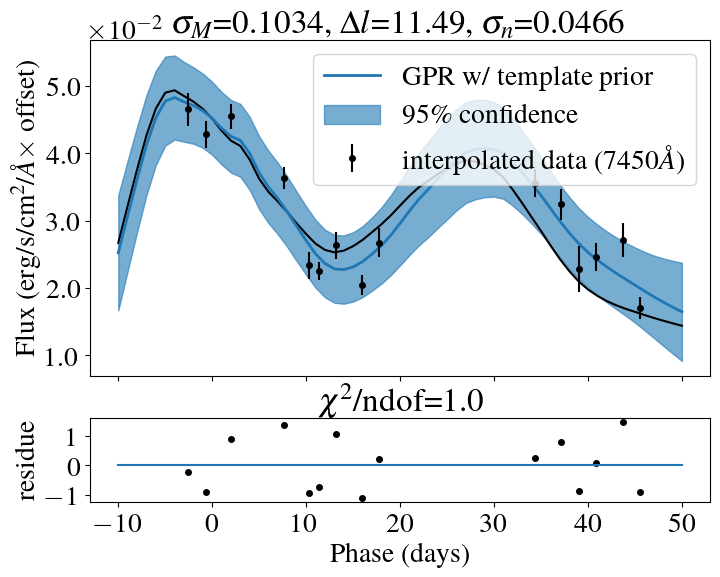

Optimization restart 1/10, f = -15.854543288018673
Optimization restart 2/10, f = -15.854543288057386
Optimization restart 3/10, f = -15.85454328805771
Optimization restart 4/10, f = -15.854543288050483
Optimization restart 5/10, f = -15.854543288055773
Optimization restart 6/10, f = -15.854543288056776
Optimization restart 7/10, f = -15.854543288057496
Optimization restart 8/10, f = -15.854543288055915
Optimization restart 9/10, f = -15.854543249622987
Optimization restart 10/10, f = -15.854543288053856


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.009709887156079474,+ve,"N(0.0096, 0.00096)"
sum.Mat52.lengthscale,11.262349663969388,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001965323152162389,+ve,"N(0.0019, 0.00019)"


Optimization restart 1/10, f = -16.42566279738064
Optimization restart 2/10, f = -16.425662778333844
Optimization restart 3/10, f = -16.425662797380664
Optimization restart 4/10, f = -16.425662797364843
Optimization restart 5/10, f = -16.425662796903
Optimization restart 6/10, f = -16.425662797380646
Optimization restart 7/10, f = -16.42566279737884
Optimization restart 8/10, f = -16.425662797380653
Optimization restart 9/10, f = -16.425662797379665
Optimization restart 10/10, f = -16.425662797324236


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.009082135594783962,+ve,"N(0.009, 0.0009)"
sum.Mat52.lengthscale,11.3629803437774,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0018406891814134164,+ve,"N(0.0018, 0.00018)"


Optimization restart 1/10, f = -17.91109265336559
Optimization restart 2/10, f = -17.911092653365323
Optimization restart 3/10, f = -17.91109265151554
Optimization restart 4/10, f = -17.9110925984823
Optimization restart 5/10, f = -17.911092650155183
Optimization restart 6/10, f = -17.9110926533656
Optimization restart 7/10, f = -17.911092653364083
Optimization restart 8/10, f = -17.911092653358164
Optimization restart 9/10, f = -17.91109265336562
Optimization restart 10/10, f = -17.91109265336561


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.007478483804722953,+ve,"N(0.0074, 0.00074)"
sum.Mat52.lengthscale,11.861359683584299,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0015150091006918658,+ve,"N(0.0015, 0.00015)"


Optimization restart 1/10, f = -16.14638364210406
Optimization restart 2/10, f = -16.146383635331947
Optimization restart 3/10, f = -16.14638364210377
Optimization restart 4/10, f = -16.146383642103437
Optimization restart 5/10, f = -16.146383642104148
Optimization restart 6/10, f = -16.146383642014484
Optimization restart 7/10, f = -16.14638364209906
Optimization restart 8/10, f = -16.14638364210412
Optimization restart 9/10, f = -16.146383639653862
Optimization restart 10/10, f = -16.146383642101057


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.008147094893740593,+ve,"N(0.0081, 0.00081)"
sum.Mat52.lengthscale,12.112013641957077,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0016617699512635896,+ve,"N(0.0016, 0.00016)"


Optimization restart 1/10, f = -15.042782305816829
Optimization restart 2/10, f = -15.042782305815182
Optimization restart 3/10, f = -15.042782305654654
Optimization restart 4/10, f = -15.042782305816836
Optimization restart 5/10, f = -15.042782305816816
Optimization restart 6/10, f = -15.042782305765924
Optimization restart 7/10, f = -15.042782305815102
Optimization restart 8/10, f = -15.042782305812228
Optimization restart 9/10, f = -15.042782305800655
Optimization restart 10/10, f = -15.0427823057925


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.007936552891796799,+ve,"N(0.0079, 0.00079)"
sum.Mat52.lengthscale,12.353419592642902,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0016318543464499098,+ve,"N(0.0016, 0.00016)"


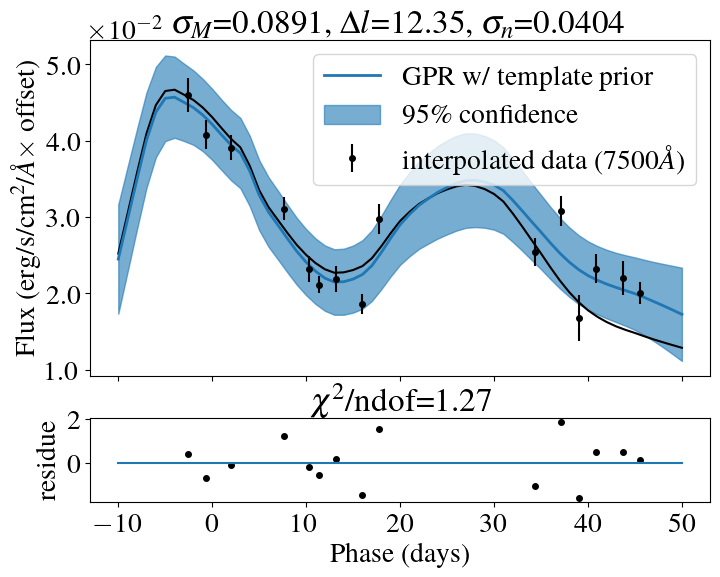

Optimization restart 1/10, f = -12.771732453158558
Optimization restart 2/10, f = -12.771732451325478
Optimization restart 3/10, f = -12.771732453174694
Optimization restart 4/10, f = -12.7717324531747
Optimization restart 5/10, f = -12.77173245317466
Optimization restart 6/10, f = -12.771732453172286
Optimization restart 7/10, f = -12.771732453174579
Optimization restart 8/10, f = -12.771732453164084
Optimization restart 9/10, f = -12.771732453174641
Optimization restart 10/10, f = -12.77173245317461


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.008464155571153511,+ve,"N(0.0085, 0.00085)"
sum.Mat52.lengthscale,12.466876859198159,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0017611567749102233,+ve,"N(0.0017, 0.00017)"


Optimization restart 1/10, f = -12.34525439249639
Optimization restart 2/10, f = -12.345254378821462
Optimization restart 3/10, f = -12.345254392469029
Optimization restart 4/10, f = -12.34525439249641
Optimization restart 5/10, f = -12.345254376272411
Optimization restart 6/10, f = -12.34525439249631
Optimization restart 7/10, f = -12.345254392495134
Optimization restart 8/10, f = -12.345254392496116
Optimization restart 9/10, f = -12.345254392491706
Optimization restart 10/10, f = -12.345254392496242


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.00793295992069995,+ve,"N(0.008, 0.0008)"
sum.Mat52.lengthscale,12.461352746762627,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0016588303159537977,+ve,"N(0.0016, 0.00016)"


Optimization restart 1/10, f = -15.209737449934137
Optimization restart 2/10, f = -15.209737449602342
Optimization restart 3/10, f = -15.209737435938168
Optimization restart 4/10, f = -15.209737449944653
Optimization restart 5/10, f = -15.209737448128232
Optimization restart 6/10, f = -15.20973744997437
Optimization restart 7/10, f = -15.209737449974428
Optimization restart 8/10, f = -15.209737449974178
Optimization restart 9/10, f = -15.209737449967244
Optimization restart 10/10, f = -15.20973744997445


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.00575019502203285,+ve,"N(0.0058, 0.00058)"
sum.Mat52.lengthscale,12.351567965058388,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0011934336671121698,+ve,"N(0.0012, 0.00012)"


Optimization restart 1/10, f = -16.076195129636933
Optimization restart 2/10, f = -16.0761951294689
Optimization restart 3/10, f = -16.07619512799775
Optimization restart 4/10, f = -16.076195129637036
Optimization restart 5/10, f = -16.076195129637036
Optimization restart 6/10, f = -16.076195129417183
Optimization restart 7/10, f = -16.076195129605694
Optimization restart 8/10, f = -16.076195129636957
Optimization restart 9/10, f = -16.076195129636588
Optimization restart 10/10, f = -16.07619512963695


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005062187956344253,+ve,"N(0.0051, 0.00051)"
sum.Mat52.lengthscale,12.049281207124137,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001046925302881683,+ve,"N(0.001, 0.0001)"


Optimization restart 1/10, f = -17.103602963983057
Optimization restart 2/10, f = -17.103602963981132
Optimization restart 3/10, f = -17.103602963982993
Optimization restart 4/10, f = -17.103602963981036
Optimization restart 5/10, f = -17.10360296398304
Optimization restart 6/10, f = -17.103602963981896
Optimization restart 7/10, f = -17.103602963982993
Optimization restart 8/10, f = -17.103602963983075
Optimization restart 9/10, f = -17.10360296265661
Optimization restart 10/10, f = -17.10360296398246


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004775520129933378,+ve,"N(0.0048, 0.00048)"
sum.Mat52.lengthscale,12.13505529478579,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0009853299691171549,+ve,"N(0.00096, 9.6e-05)"


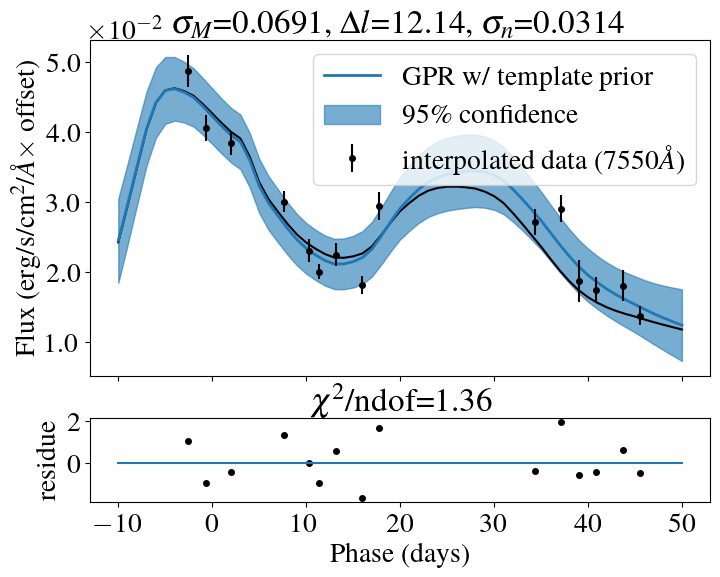

Optimization restart 1/10, f = -15.892931491141278
Optimization restart 2/10, f = -15.89293149112406
Optimization restart 3/10, f = -15.892931491136835
Optimization restart 4/10, f = -15.892931491136451
Optimization restart 5/10, f = -15.892931491141141
Optimization restart 6/10, f = -15.892931491141269
Optimization restart 7/10, f = -15.892931491140859
Optimization restart 8/10, f = -15.892931491118798
Optimization restart 9/10, f = -15.892931491099535
Optimization restart 10/10, f = -15.89293149113596


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005607635314701573,+ve,"N(0.0056, 0.00056)"
sum.Mat52.lengthscale,12.08876734291477,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001161030177706958,+ve,"N(0.0011, 0.00011)"


Optimization restart 1/10, f = -14.48105231110553
Optimization restart 2/10, f = -14.481052311105326
Optimization restart 3/10, f = -14.481052311105556
Optimization restart 4/10, f = -14.481052311099754
Optimization restart 5/10, f = -14.48105231110554
Optimization restart 6/10, f = -14.481052311078024
Optimization restart 7/10, f = -14.481052311105454
Optimization restart 8/10, f = -14.481052311096382
Optimization restart 9/10, f = -14.48105231110538
Optimization restart 10/10, f = -14.481052311097796


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006872949768101425,+ve,"N(0.0069, 0.00069)"
sum.Mat52.lengthscale,11.984471675254753,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001425691291178106,+ve,"N(0.0014, 0.00014)"


Optimization restart 1/10, f = -13.679779126318222
Optimization restart 2/10, f = -13.67977912631839
Optimization restart 3/10, f = -13.679779126318572
Optimization restart 4/10, f = -13.679779126300822
Optimization restart 5/10, f = -13.679779126318579
Optimization restart 6/10, f = -13.679779125620849
Optimization restart 7/10, f = -13.679779126287697
Optimization restart 8/10, f = -13.679779126318087
Optimization restart 9/10, f = -13.679779126317785
Optimization restart 10/10, f = -13.679779124023014


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.008144499051943666,+ve,"N(0.0081, 0.00081)"
sum.Mat52.lengthscale,12.008393098546028,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0016872518675339402,+ve,"N(0.0016, 0.00016)"


Optimization restart 1/10, f = -11.046448979891542
Optimization restart 2/10, f = -11.04644897989021
Optimization restart 3/10, f = -11.046448979891629
Optimization restart 4/10, f = -11.046448979855196
Optimization restart 5/10, f = -11.046448979642319
Optimization restart 6/10, f = -11.046448979880157
Optimization restart 7/10, f = -11.046448979854103
Optimization restart 8/10, f = -11.046448979224067
Optimization restart 9/10, f = -11.046448979891377
Optimization restart 10/10, f = -11.046448979891307


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.010643282931786955,+ve,"N(0.011, 0.0011)"
sum.Mat52.lengthscale,11.898447027556232,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00221792380993535,+ve,"N(0.0021, 0.00021)"


Optimization restart 1/10, f = -12.327769766269663
Optimization restart 2/10, f = -12.32776976627038
Optimization restart 3/10, f = -12.327769766264664
Optimization restart 4/10, f = -12.327769766270123
Optimization restart 5/10, f = -12.327769766270546
Optimization restart 6/10, f = -12.327769766270466
Optimization restart 7/10, f = -12.327769766270142
Optimization restart 8/10, f = -12.327769766270524
Optimization restart 9/10, f = -12.327769766256134
Optimization restart 10/10, f = -12.327769766270173


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.011283565335441385,+ve,"N(0.011, 0.0011)"
sum.Mat52.lengthscale,12.339875922488478,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0023329125210248144,+ve,"N(0.0023, 0.00023)"


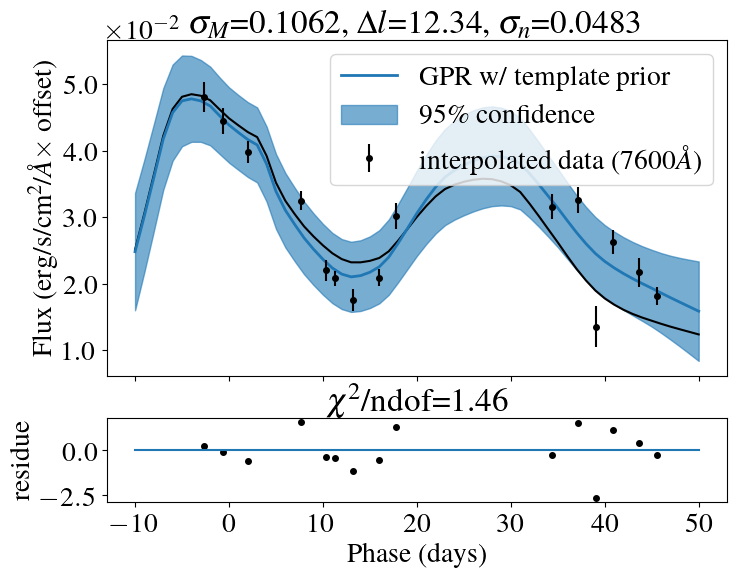

Optimization restart 1/10, f = -13.089903871886671
Optimization restart 2/10, f = -13.089903871885841
Optimization restart 3/10, f = -13.08990387188415
Optimization restart 4/10, f = -13.089903867997682
Optimization restart 5/10, f = -13.089903871886635
Optimization restart 6/10, f = -13.089903865485798
Optimization restart 7/10, f = -13.08990387016907
Optimization restart 8/10, f = -13.089903852934816
Optimization restart 9/10, f = -13.08990387188591
Optimization restart 10/10, f = -13.089903871886682


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.012731996123402351,+ve,"N(0.013, 0.0013)"
sum.Mat52.lengthscale,12.4585059052258,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0026077932082320503,+ve,"N(0.0025, 0.00025)"


Optimization restart 1/10, f = -13.697136517401784
Optimization restart 2/10, f = -13.697136517145374
Optimization restart 3/10, f = -13.697136517420025
Optimization restart 4/10, f = -13.697136517307664
Optimization restart 5/10, f = -13.697136516056878
Optimization restart 6/10, f = -13.697136517419791
Optimization restart 7/10, f = -13.697136489073609
Optimization restart 8/10, f = -13.697136517419928
Optimization restart 9/10, f = -13.697136517391964
Optimization restart 10/10, f = -13.697136517419343


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.014168071799363956,+ve,"N(0.014, 0.0014)"
sum.Mat52.lengthscale,12.306070785137367,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0028771304883439177,+ve,"N(0.0028, 0.00028)"


Optimization restart 1/10, f = -15.692044676739167
Optimization restart 2/10, f = -15.69204467676768
Optimization restart 3/10, f = -15.692044671548429
Optimization restart 4/10, f = -15.692044674760492
Optimization restart 5/10, f = -15.692044676769655
Optimization restart 6/10, f = -15.692044676763073
Optimization restart 7/10, f = -15.692044676736206
Optimization restart 8/10, f = -15.692044676769918
Optimization restart 9/10, f = -15.692044676740494
Optimization restart 10/10, f = -15.692044676769916


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.013933181642165544,+ve,"N(0.014, 0.0014)"
sum.Mat52.lengthscale,12.04223869034549,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0027990916448176,+ve,"N(0.0028, 0.00028)"


Optimization restart 1/10, f = -14.406634039895819
Optimization restart 2/10, f = -14.406634039895655
Optimization restart 3/10, f = -14.406634039895817
Optimization restart 4/10, f = -14.406634039893275
Optimization restart 5/10, f = -14.40663403989584
Optimization restart 6/10, f = -14.406634039895756
Optimization restart 7/10, f = -14.406634038169313
Optimization restart 8/10, f = -14.406634039895867
Optimization restart 9/10, f = -14.40663403989552
Optimization restart 10/10, f = -14.406634038446372


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.016581509196924957,+ve,"N(0.016, 0.0016)"
sum.Mat52.lengthscale,11.581004426292084,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0033325173493286104,+ve,"N(0.0033, 0.00033)"


Optimization restart 1/10, f = -15.344838426128986
Optimization restart 2/10, f = -15.34483842160764
Optimization restart 3/10, f = -15.344838425949483
Optimization restart 4/10, f = -15.344838426128149
Optimization restart 5/10, f = -15.344838426129108
Optimization restart 6/10, f = -15.344838426124614
Optimization restart 7/10, f = -15.344838426093993
Optimization restart 8/10, f = -15.344838152849702
Optimization restart 9/10, f = -15.344838426128907
Optimization restart 10/10, f = -15.344838426125472


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.013074544117479426,+ve,"N(0.013, 0.0013)"
sum.Mat52.lengthscale,11.900073466359109,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0026388719609355894,+ve,"N(0.0026, 0.00026)"


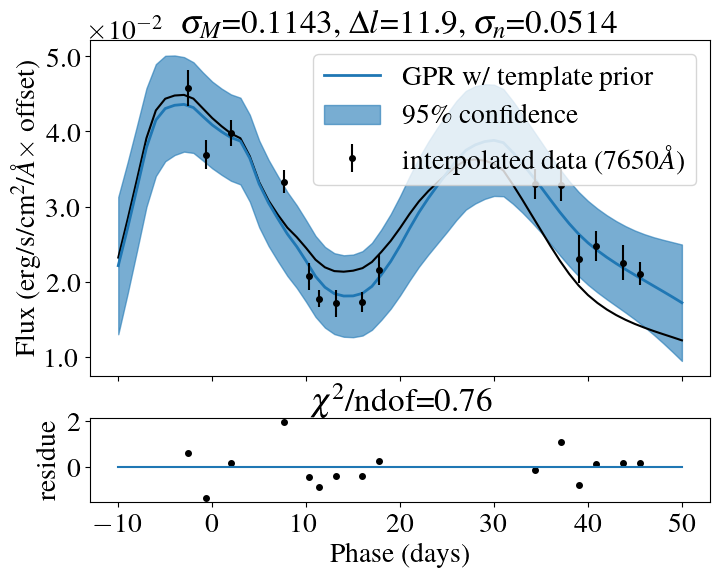

Optimization restart 1/10, f = -15.743022118065246
Optimization restart 2/10, f = -15.743022116502065
Optimization restart 3/10, f = -15.743022118065122
Optimization restart 4/10, f = -15.743022118065255
Optimization restart 5/10, f = -15.743022118065246
Optimization restart 6/10, f = -15.743022118065083
Optimization restart 7/10, f = -15.743022118064578
Optimization restart 8/10, f = -15.743022118065142
Optimization restart 9/10, f = -15.743022114980402
Optimization restart 10/10, f = -15.743022118061873


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.01015176903080206,+ve,"N(0.01, 0.001)"
sum.Mat52.lengthscale,12.265041510242792,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0020587992285978343,+ve,"N(0.002, 0.0002)"


Optimization restart 1/10, f = -15.417778725335694
Optimization restart 2/10, f = -15.417778725335491
Optimization restart 3/10, f = -15.417778725328546
Optimization restart 4/10, f = -15.417778725335637
Optimization restart 5/10, f = -15.417778725335706
Optimization restart 6/10, f = -15.417778725332225
Optimization restart 7/10, f = -15.417778724260387
Optimization restart 8/10, f = -15.417778725335577
Optimization restart 9/10, f = -15.417778725335696
Optimization restart 10/10, f = -15.417778725334138


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.009436502920419412,+ve,"N(0.0094, 0.00094)"
sum.Mat52.lengthscale,12.334349811235926,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0019154427971901516,+ve,"N(0.0019, 0.00019)"


Optimization restart 1/10, f = -16.44745626977639
Optimization restart 2/10, f = -16.44745626922886
Optimization restart 3/10, f = -16.447456269779394
Optimization restart 4/10, f = -16.44745625925191
Optimization restart 5/10, f = -16.447456269777017
Optimization restart 6/10, f = -16.44745626977802
Optimization restart 7/10, f = -16.44745626977937
Optimization restart 8/10, f = -16.447456269779494
Optimization restart 9/10, f = -16.44745626977278
Optimization restart 10/10, f = -16.447456269779458


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.010426850541128636,+ve,"N(0.01, 0.001)"
sum.Mat52.lengthscale,12.380071936799101,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0020985761724330505,+ve,"N(0.0021, 0.00021)"


Optimization restart 1/10, f = -14.054934580547755
Optimization restart 2/10, f = -14.05493458054517
Optimization restart 3/10, f = -14.05493458053162
Optimization restart 4/10, f = -14.054934580546828
Optimization restart 5/10, f = -14.054934580547705
Optimization restart 6/10, f = -14.05493457955296
Optimization restart 7/10, f = -14.054934580519824
Optimization restart 8/10, f = -14.05493458011286
Optimization restart 9/10, f = -14.05493458054531
Optimization restart 10/10, f = -14.054934580546139


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.01379669869074642,+ve,"N(0.014, 0.0014)"
sum.Mat52.lengthscale,12.350669009041914,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.002793217767068442,+ve,"N(0.0027, 0.00027)"


Optimization restart 1/10, f = -15.289437961588007
Optimization restart 2/10, f = -15.289437961583511
Optimization restart 3/10, f = -15.289437961587591
Optimization restart 4/10, f = -15.28943796158714
Optimization restart 5/10, f = -15.289437961587138
Optimization restart 6/10, f = -15.2894379615878
Optimization restart 7/10, f = -15.289437961574164
Optimization restart 8/10, f = -15.28943796153516
Optimization restart 9/10, f = -15.289437961581774
Optimization restart 10/10, f = -15.28943796158695


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.013077744830852897,+ve,"N(0.013, 0.0013)"
sum.Mat52.lengthscale,12.429484049782166,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.002637476109401373,+ve,"N(0.0026, 0.00026)"


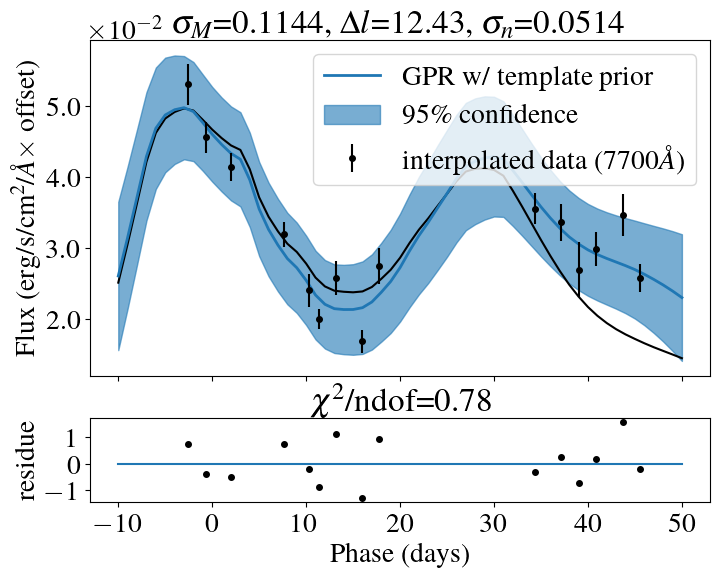

Optimization restart 1/10, f = -17.904948270056977
Optimization restart 2/10, f = -17.90494827004029
Optimization restart 3/10, f = -17.904948239670745
Optimization restart 4/10, f = -17.904948270053072
Optimization restart 5/10, f = -17.904948270053755
Optimization restart 6/10, f = -17.904948270057016
Optimization restart 7/10, f = -17.90494826996914
Optimization restart 8/10, f = -17.904948270055684
Optimization restart 9/10, f = -17.90494827005682
Optimization restart 10/10, f = -17.90494826983558


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0110859943198883,+ve,"N(0.011, 0.0011)"
sum.Mat52.lengthscale,12.513492355525889,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0022174811394199074,+ve,"N(0.0022, 0.00022)"


Optimization restart 1/10, f = -18.521108906359586
Optimization restart 2/10, f = -18.52110890635718
Optimization restart 3/10, f = -18.521108906342825
Optimization restart 4/10, f = -18.52110890456185
Optimization restart 5/10, f = -18.521108906326425
Optimization restart 6/10, f = -18.52110890635711
Optimization restart 7/10, f = -18.52110890231496
Optimization restart 8/10, f = -18.52110890374785
Optimization restart 9/10, f = -18.52110890635587
Optimization restart 10/10, f = -18.52110890636014


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.010554879860169411,+ve,"N(0.011, 0.0011)"
sum.Mat52.lengthscale,12.496260209871988,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0021085637272942786,+ve,"N(0.0021, 0.00021)"


Optimization restart 1/10, f = -15.480153939042719
Optimization restart 2/10, f = -15.48015393904214
Optimization restart 3/10, f = -15.48015393832257
Optimization restart 4/10, f = -15.480153938483236
Optimization restart 5/10, f = -15.480153939042731
Optimization restart 6/10, f = -15.480153939024172
Optimization restart 7/10, f = -15.480153938808204
Optimization restart 8/10, f = -15.480153939038942
Optimization restart 9/10, f = -15.480153939042703
Optimization restart 10/10, f = -15.480153938859134


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.011589904491032848,+ve,"N(0.012, 0.0012)"
sum.Mat52.lengthscale,12.584408050978782,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.002350449892376479,+ve,"N(0.0023, 0.00023)"


Optimization restart 1/10, f = -10.475513773915782
Optimization restart 2/10, f = -10.475513773927753
Optimization restart 3/10, f = -10.475513761061196
Optimization restart 4/10, f = -10.475513773927236
Optimization restart 5/10, f = -10.475513773927931
Optimization restart 6/10, f = -10.475513773927922
Optimization restart 7/10, f = -10.47551377390819
Optimization restart 8/10, f = -10.475513773927462
Optimization restart 9/10, f = -10.475513773927752
Optimization restart 10/10, f = -10.475513767884776


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.01557269315994216,+ve,"N(0.016, 0.0016)"
sum.Mat52.lengthscale,12.578271649684408,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.003219110054048885,+ve,"N(0.0031, 0.00031)"


Optimization restart 1/10, f = -9.194689483760582
Optimization restart 2/10, f = -9.194689483774127
Optimization restart 3/10, f = -9.194689480613158
Optimization restart 4/10, f = -9.1946894837741
Optimization restart 5/10, f = -9.194689483725284
Optimization restart 6/10, f = -9.194689483774138
Optimization restart 7/10, f = -9.194689483773363
Optimization restart 8/10, f = -9.194689483767648
Optimization restart 9/10, f = -9.194689483714807
Optimization restart 10/10, f = -9.194689483773846


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.015642111962859487,+ve,"N(0.016, 0.0016)"
sum.Mat52.lengthscale,12.538837540284366,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0032566971657428372,+ve,"N(0.0031, 0.00031)"


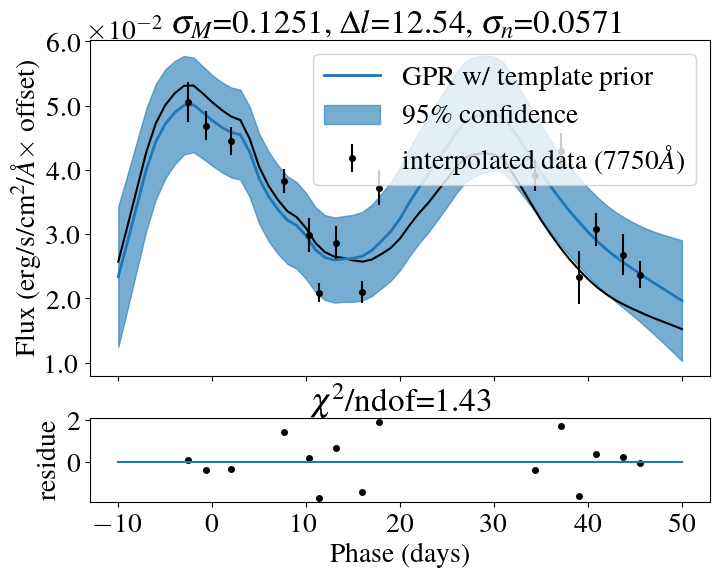

Optimization restart 1/10, f = -10.885830742139028
Optimization restart 2/10, f = -10.88583073125998
Optimization restart 3/10, f = -10.885830742139373
Optimization restart 4/10, f = -10.885830742140117
Optimization restart 5/10, f = -10.885830742135683
Optimization restart 6/10, f = -10.885830742140117
Optimization restart 7/10, f = -10.885830742139817
Optimization restart 8/10, f = -10.88583074158266
Optimization restart 9/10, f = -10.885830742119532
Optimization restart 10/10, f = -10.88583074214011


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.011323973513034045,+ve,"N(0.011, 0.0011)"
sum.Mat52.lengthscale,12.440798381006482,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0023599014294470085,+ve,"N(0.0023, 0.00023)"


Optimization restart 1/10, f = -10.484968199992439
Optimization restart 2/10, f = -10.484968199992524
Optimization restart 3/10, f = -10.484968199992519
Optimization restart 4/10, f = -10.484968199992528
Optimization restart 5/10, f = -10.484968199981873
Optimization restart 6/10, f = -10.484968199986568
Optimization restart 7/10, f = -10.484968199990355
Optimization restart 8/10, f = -10.484968197377944
Optimization restart 9/10, f = -10.48496819999114
Optimization restart 10/10, f = -10.484968199990476


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.009224503217181245,+ve,"N(0.0092, 0.00092)"
sum.Mat52.lengthscale,12.217284767465005,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0019402923500457057,+ve,"N(0.0018, 0.00018)"


Optimization restart 1/10, f = -14.72883970738594
Optimization restart 2/10, f = -14.728839707385786
Optimization restart 3/10, f = -14.728839702533271
Optimization restart 4/10, f = -14.728839707385932
Optimization restart 5/10, f = -14.728839707381113
Optimization restart 6/10, f = -14.728839707363612
Optimization restart 7/10, f = -14.728839707362503
Optimization restart 8/10, f = -14.728839707310074
Optimization restart 9/10, f = -14.72883970735138
Optimization restart 10/10, f = -14.728839707385324


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.007160008277001017,+ve,"N(0.0072, 0.00072)"
sum.Mat52.lengthscale,11.957932902670892,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0014685479176513886,+ve,"N(0.0014, 0.00014)"


Optimization restart 1/10, f = -15.408099046815902
Optimization restart 2/10, f = -15.40809904680646
Optimization restart 3/10, f = -15.408099046813488
Optimization restart 4/10, f = -15.408099046705914
Optimization restart 5/10, f = -15.408099046815556
Optimization restart 6/10, f = -15.40809904681502
Optimization restart 7/10, f = -15.408099046763976
Optimization restart 8/10, f = -15.408099046177902
Optimization restart 9/10, f = -15.408099046800308
Optimization restart 10/10, f = -15.408099046550145


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006725857751926058,+ve,"N(0.0067, 0.00067)"
sum.Mat52.lengthscale,11.7302440924916,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001372094813289175,+ve,"N(0.0013, 0.00013)"


Optimization restart 1/10, f = -14.732896837968973
Optimization restart 2/10, f = -14.732896831390153
Optimization restart 3/10, f = -14.73289683794238
Optimization restart 4/10, f = -14.732896837966697
Optimization restart 5/10, f = -14.73289683796831
Optimization restart 6/10, f = -14.732896837968777
Optimization restart 7/10, f = -14.732896837968674
Optimization restart 8/10, f = -14.73289683796893
Optimization restart 9/10, f = -14.732896837968074
Optimization restart 10/10, f = -14.732896837968928


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.007253932221423356,+ve,"N(0.0073, 0.00073)"
sum.Mat52.lengthscale,11.75705681041449,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0014827121032740835,+ve,"N(0.0015, 0.00015)"


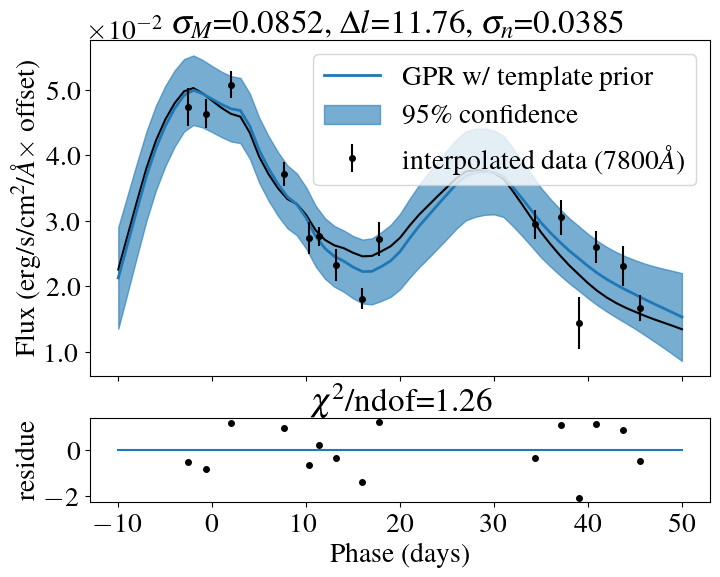

Optimization restart 1/10, f = -15.225484888758682
Optimization restart 2/10, f = -15.225484881552426
Optimization restart 3/10, f = -15.225484888758505
Optimization restart 4/10, f = -15.225484888758098
Optimization restart 5/10, f = -15.225484886668339
Optimization restart 6/10, f = -15.22548488875829
Optimization restart 7/10, f = -15.22548488875851
Optimization restart 8/10, f = -15.225484875241454
Optimization restart 9/10, f = -15.22548488875868
Optimization restart 10/10, f = -15.22548488875869


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.008409912614051135,+ve,"N(0.0084, 0.00084)"
sum.Mat52.lengthscale,12.071002326871701,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001710749773102008,+ve,"N(0.0017, 0.00017)"


Optimization restart 1/10, f = -13.820098301109692
Optimization restart 2/10, f = -13.82009828195931
Optimization restart 3/10, f = -13.820098300600769
Optimization restart 4/10, f = -13.820098301118026
Optimization restart 5/10, f = -13.820098301093626
Optimization restart 6/10, f = -13.82009830111638
Optimization restart 7/10, f = -13.820098301112163
Optimization restart 8/10, f = -13.820098301080389
Optimization restart 9/10, f = -13.820098301118032
Optimization restart 10/10, f = -13.820098301118003


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.010557847521244081,+ve,"N(0.011, 0.0011)"
sum.Mat52.lengthscale,12.350590853694516,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0021610778315917616,+ve,"N(0.0021, 0.00021)"


Optimization restart 1/10, f = -14.664035218521194
Optimization restart 2/10, f = -14.664035204637566
Optimization restart 3/10, f = -14.66403521851722
Optimization restart 4/10, f = -14.664035218517549
Optimization restart 5/10, f = -14.664035218519926
Optimization restart 6/10, f = -14.664035218509701
Optimization restart 7/10, f = -14.664035218234426
Optimization restart 8/10, f = -14.664035218506218
Optimization restart 9/10, f = -14.664035218521175
Optimization restart 10/10, f = -14.664035218521175


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.009176413815653688,+ve,"N(0.0092, 0.00092)"
sum.Mat52.lengthscale,12.281400383746497,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0018781248846563357,+ve,"N(0.0018, 0.00018)"


Optimization restart 1/10, f = -15.790937492372416
Optimization restart 2/10, f = -15.790937492316056
Optimization restart 3/10, f = -15.790937492230862
Optimization restart 4/10, f = -15.790937492371581
Optimization restart 5/10, f = -15.790937492371649
Optimization restart 6/10, f = -15.790937492372372
Optimization restart 7/10, f = -15.790937492267231
Optimization restart 8/10, f = -15.790937492372416
Optimization restart 9/10, f = -15.790937492304371
Optimization restart 10/10, f = -15.790937492372299


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.007199207731838249,+ve,"N(0.0072, 0.00072)"
sum.Mat52.lengthscale,12.11233707919715,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0014728574747467642,+ve,"N(0.0014, 0.00014)"


Optimization restart 1/10, f = -16.52291000430611
Optimization restart 2/10, f = -16.522910003960583
Optimization restart 3/10, f = -16.522910004275552
Optimization restart 4/10, f = -16.522910004294147
Optimization restart 5/10, f = -16.522910004306407
Optimization restart 6/10, f = -16.52291000426125
Optimization restart 7/10, f = -16.522910003954216
Optimization restart 8/10, f = -16.522910004252807
Optimization restart 9/10, f = -16.522910004261163
Optimization restart 10/10, f = -16.52291000430678


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005776345149929309,+ve,"N(0.0058, 0.00058)"
sum.Mat52.lengthscale,11.968951678384784,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0011828622297757883,+ve,"N(0.0012, 0.00012)"


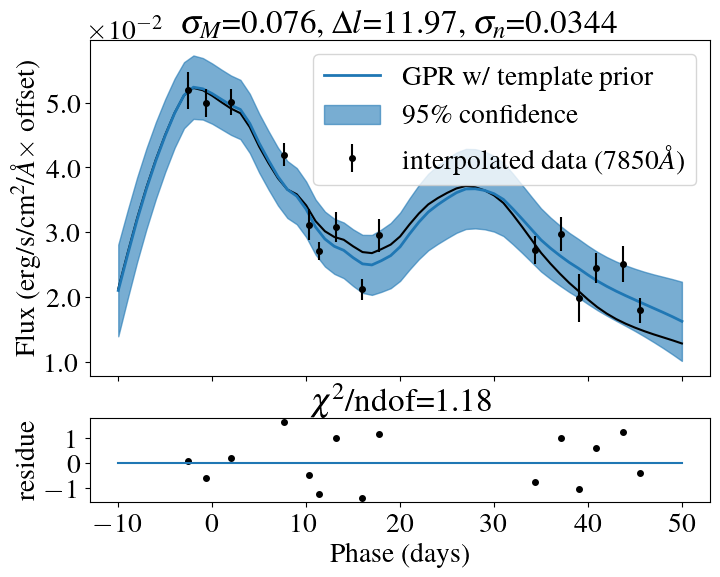

Optimization restart 1/10, f = -18.295848953847965
Optimization restart 2/10, f = -18.295848953847983
Optimization restart 3/10, f = -18.295848953828937
Optimization restart 4/10, f = -18.295848953847987
Optimization restart 5/10, f = -18.295848953847916
Optimization restart 6/10, f = -18.29584895384766
Optimization restart 7/10, f = -18.29584895384794
Optimization restart 8/10, f = -18.29584895384796
Optimization restart 9/10, f = -18.295848953847994
Optimization restart 10/10, f = -18.295848953604548


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004788078792918068,+ve,"N(0.0048, 0.00048)"
sum.Mat52.lengthscale,11.966214321229607,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0009772536404166004,+ve,"N(0.00096, 9.6e-05)"


Optimization restart 1/10, f = -18.557652172154306
Optimization restart 2/10, f = -18.557652171584017
Optimization restart 3/10, f = -18.557652172154288
Optimization restart 4/10, f = -18.557652172153546
Optimization restart 5/10, f = -18.557652171415505
Optimization restart 6/10, f = -18.55765217208762
Optimization restart 7/10, f = -18.55765217215427
Optimization restart 8/10, f = -18.557652172153524
Optimization restart 9/10, f = -18.55765217215405
Optimization restart 10/10, f = -18.5576521715413


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004749748645862271,+ve,"N(0.0048, 0.00048)"
sum.Mat52.lengthscale,11.990640341256293,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0009694014138530236,+ve,"N(0.00095, 9.5e-05)"


Optimization restart 1/10, f = -18.904756575810833
Optimization restart 2/10, f = -18.904756575799993
Optimization restart 3/10, f = -18.904756575810858
Optimization restart 4/10, f = -18.904756575810715
Optimization restart 5/10, f = -18.904756575810865
Optimization restart 6/10, f = -18.904756575810595
Optimization restart 7/10, f = -18.90475657581082
Optimization restart 8/10, f = -18.904756575809515
Optimization restart 9/10, f = -18.904756575810865
Optimization restart 10/10, f = -18.904756575810854


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.00449023744503889,+ve,"N(0.0045, 0.00045)"
sum.Mat52.lengthscale,11.92753439119457,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0009172705134093578,+ve,"N(0.0009, 9e-05)"


Optimization restart 1/10, f = -17.73436230342145
Optimization restart 2/10, f = -17.73436230340554
Optimization restart 3/10, f = -17.73436230341199
Optimization restart 4/10, f = -17.734362303421438
Optimization restart 5/10, f = -17.734362301238118
Optimization restart 6/10, f = -17.73436230342045
Optimization restart 7/10, f = -17.734362303420518
Optimization restart 8/10, f = -17.73436230342147
Optimization restart 9/10, f = -17.734362303421406
Optimization restart 10/10, f = -17.734362303420077


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0046761211440696036,+ve,"N(0.0047, 0.00047)"
sum.Mat52.lengthscale,11.616929155646694,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0009608939037380494,+ve,"N(0.00093, 9.3e-05)"


Optimization restart 1/10, f = -13.877628634522011
Optimization restart 2/10, f = -13.877628634521765
Optimization restart 3/10, f = -13.877628634522063
Optimization restart 4/10, f = -13.877628634518146
Optimization restart 5/10, f = -13.877628634522047
Optimization restart 6/10, f = -13.87762863452206
Optimization restart 7/10, f = -13.877628634521994
Optimization restart 8/10, f = -13.877628634521933
Optimization restart 9/10, f = -13.877628634521573
Optimization restart 10/10, f = -13.877628634521614


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006170071269080299,+ve,"N(0.0061, 0.00061)"
sum.Mat52.lengthscale,10.938148353680663,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0012851905059275291,+ve,"N(0.0012, 0.00012)"


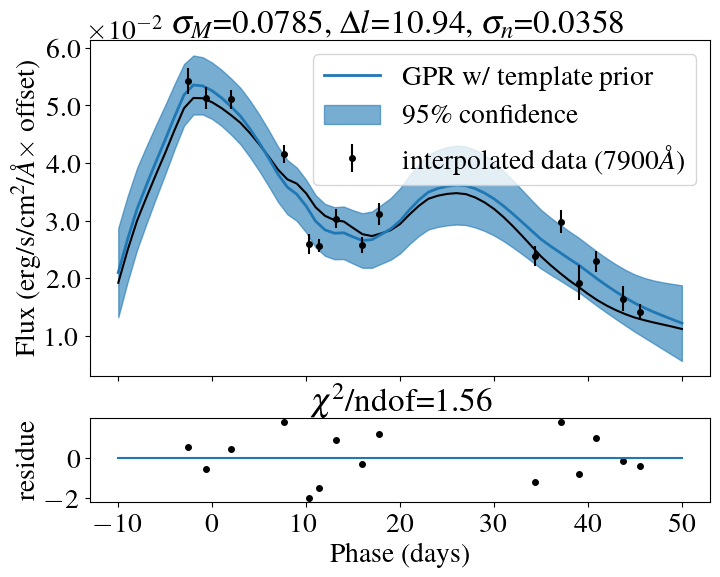

Optimization restart 1/10, f = -14.957542383642407
Optimization restart 2/10, f = -14.957542404167432
Optimization restart 3/10, f = -14.95754240417216
Optimization restart 4/10, f = -14.957542404172408
Optimization restart 5/10, f = -14.957542404170882
Optimization restart 6/10, f = -14.957542404172406
Optimization restart 7/10, f = -14.957542404172244
Optimization restart 8/10, f = -14.957542404143867
Optimization restart 9/10, f = -14.95754240417155
Optimization restart 10/10, f = -14.957542404172425


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005582480832756592,+ve,"N(0.0056, 0.00056)"
sum.Mat52.lengthscale,10.875657174110508,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0011564333366730836,+ve,"N(0.0011, 0.00011)"


Optimization restart 1/10, f = -16.094013954291015
Optimization restart 2/10, f = -16.094013954290933
Optimization restart 3/10, f = -16.09401395429113
Optimization restart 4/10, f = -16.09401395429063
Optimization restart 5/10, f = -16.09401395428707
Optimization restart 6/10, f = -16.094013954289586
Optimization restart 7/10, f = -16.094013954285586
Optimization restart 8/10, f = -16.09401395429086
Optimization restart 9/10, f = -16.094013954289935
Optimization restart 10/10, f = -16.094013954291114


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005043900711443493,+ve,"N(0.005, 0.0005)"
sum.Mat52.lengthscale,10.662393067234047,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0010378405715220339,+ve,"N(0.001, 0.0001)"


Optimization restart 1/10, f = -16.780145123024635
Optimization restart 2/10, f = -16.78014512302204
Optimization restart 3/10, f = -16.780145122956988
Optimization restart 4/10, f = -16.780145123025378
Optimization restart 5/10, f = -16.780145109306076
Optimization restart 6/10, f = -16.78014512302527
Optimization restart 7/10, f = -16.780145123025402
Optimization restart 8/10, f = -16.780145123004807
Optimization restart 9/10, f = -16.78014512296229
Optimization restart 10/10, f = -16.780145123016503


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004876493841724799,+ve,"N(0.0048, 0.00048)"
sum.Mat52.lengthscale,10.568723829153633,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0009982776797667714,+ve,"N(0.00097, 9.7e-05)"


Optimization restart 1/10, f = -18.294196907417394
Optimization restart 2/10, f = -18.294196907465825
Optimization restart 3/10, f = -18.29419690746692
Optimization restart 4/10, f = -18.2941969074733
Optimization restart 5/10, f = -18.294196907473257
Optimization restart 6/10, f = -18.294196907423817
Optimization restart 7/10, f = -18.29419690747296
Optimization restart 8/10, f = -18.294196907434365
Optimization restart 9/10, f = -18.294196877453633
Optimization restart 10/10, f = -18.294196907473278


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004288600638435326,+ve,"N(0.0043, 0.00043)"
sum.Mat52.lengthscale,11.263421072613616,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0008768108755963844,+ve,"N(0.00085, 8.5e-05)"


Optimization restart 1/10, f = -17.759014697734152
Optimization restart 2/10, f = -17.759014697691995
Optimization restart 3/10, f = -17.759014697719806
Optimization restart 4/10, f = -17.75901469773396
Optimization restart 5/10, f = -17.759014697701943
Optimization restart 6/10, f = -17.7590146975323
Optimization restart 7/10, f = -17.759014697720986
Optimization restart 8/10, f = -17.759014697734163
Optimization restart 9/10, f = -17.75901469728436
Optimization restart 10/10, f = -17.759014697724158


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004622626610623647,+ve,"N(0.0046, 0.00046)"
sum.Mat52.lengthscale,11.630671636412867,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.000947241328416468,+ve,"N(0.00092, 9.2e-05)"


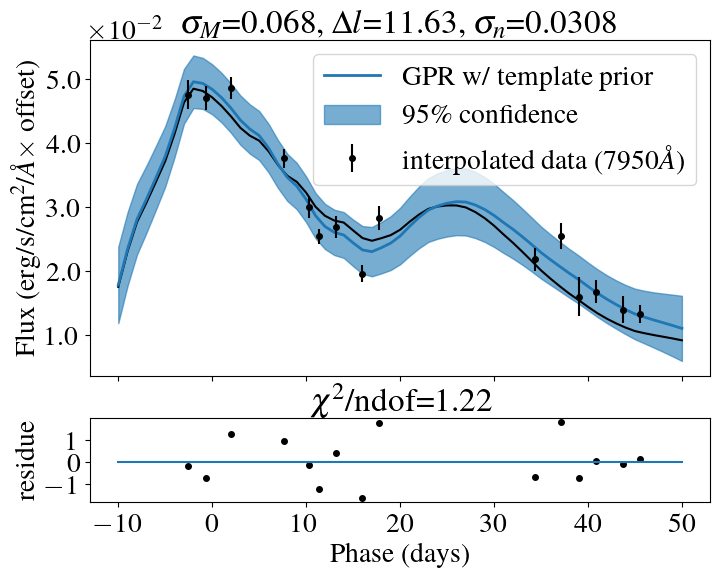

Optimization restart 1/10, f = -17.65728009607153
Optimization restart 2/10, f = -17.657280096071545
Optimization restart 3/10, f = -17.657280096068853
Optimization restart 4/10, f = -17.65728009607096
Optimization restart 5/10, f = -17.657280095758377
Optimization restart 6/10, f = -17.65728009606874
Optimization restart 7/10, f = -17.65728009606425
Optimization restart 8/10, f = -17.657280061881323
Optimization restart 9/10, f = -17.657280096061946
Optimization restart 10/10, f = -17.65728008608719


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004833260772830815,+ve,"N(0.0048, 0.00048)"
sum.Mat52.lengthscale,11.80298007893983,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0009894243203861753,+ve,"N(0.00096, 9.6e-05)"


Optimization restart 1/10, f = -15.986870490302078
Optimization restart 2/10, f = -15.986870490298125
Optimization restart 3/10, f = -15.986870490302081
Optimization restart 4/10, f = -15.986870490300285
Optimization restart 5/10, f = -15.986870490301943
Optimization restart 6/10, f = -15.986870490301879
Optimization restart 7/10, f = -15.986870490301769
Optimization restart 8/10, f = -15.986870490265993
Optimization restart 9/10, f = -15.986870490302094
Optimization restart 10/10, f = -15.986870490302096


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006017480688763548,+ve,"N(0.006, 0.0006)"
sum.Mat52.lengthscale,11.823710590208874,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0012347521981294542,+ve,"N(0.0012, 0.00012)"


Optimization restart 1/10, f = -12.356191159323448
Optimization restart 2/10, f = -12.356191159322009
Optimization restart 3/10, f = -12.356191159315019
Optimization restart 4/10, f = -12.356191159318742
Optimization restart 5/10, f = -12.35619115927635
Optimization restart 6/10, f = -12.356191159323458
Optimization restart 7/10, f = -12.356191159323442
Optimization restart 8/10, f = -12.35619115932344
Optimization restart 9/10, f = -12.35619115932336
Optimization restart 10/10, f = -12.356191159321948


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.008923086427217293,+ve,"N(0.0089, 0.00089)"
sum.Mat52.lengthscale,11.5960610218747,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0018427512960176586,+ve,"N(0.0018, 0.00018)"


Optimization restart 1/10, f = -12.337802150107459
Optimization restart 2/10, f = -12.337802150107184
Optimization restart 3/10, f = -12.337802150106777
Optimization restart 4/10, f = -12.337802150107061
Optimization restart 5/10, f = -12.337802149863352
Optimization restart 6/10, f = -12.337802150107446
Optimization restart 7/10, f = -12.337802150078778
Optimization restart 8/10, f = -12.337802150107006
Optimization restart 9/10, f = -12.337802150105908
Optimization restart 10/10, f = -12.337802150107597


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.008117196102557978,+ve,"N(0.0081, 0.00081)"
sum.Mat52.lengthscale,11.80848388134796,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001686413879141941,+ve,"N(0.0016, 0.00016)"


Optimization restart 1/10, f = -10.64702396879576
Optimization restart 2/10, f = -10.647023968794477
Optimization restart 3/10, f = -10.647023968795727
Optimization restart 4/10, f = -10.647023968795738
Optimization restart 5/10, f = -10.647023968794217
Optimization restart 6/10, f = -10.647023968793984
Optimization restart 7/10, f = -10.647023968795779
Optimization restart 8/10, f = -10.647023968795654
Optimization restart 9/10, f = -10.647023968787465
Optimization restart 10/10, f = -10.647023968795732


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.008721858513004662,+ve,"N(0.0087, 0.00087)"
sum.Mat52.lengthscale,11.87014016579186,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001827662305357927,+ve,"N(0.0017, 0.00017)"


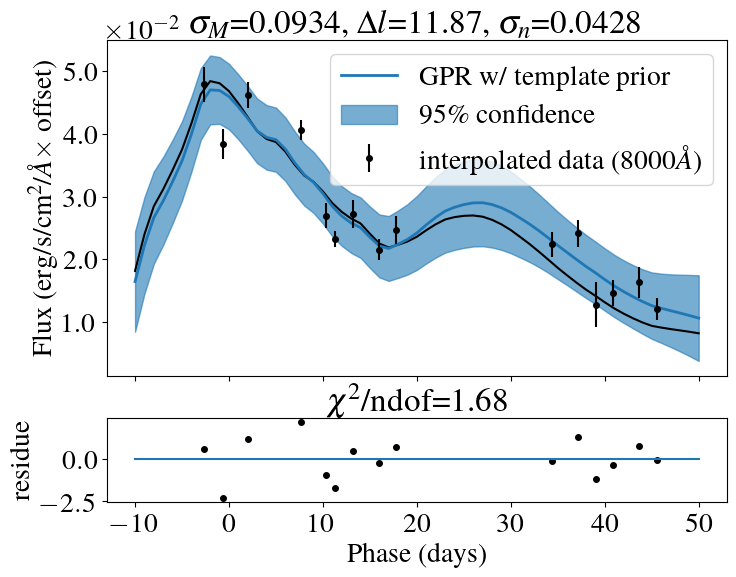

Optimization restart 1/10, f = -10.65899460590807
Optimization restart 2/10, f = -10.658994605905537
Optimization restart 3/10, f = -10.658994605892168
Optimization restart 4/10, f = -10.658994605907283
Optimization restart 5/10, f = -10.658994605901494
Optimization restart 6/10, f = -10.658992128062152
Optimization restart 7/10, f = -10.658994605907296
Optimization restart 8/10, f = -10.658994605887214
Optimization restart 9/10, f = -10.658994605880642
Optimization restart 10/10, f = -10.658994605888095


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.008847899902136736,+ve,"N(0.0089, 0.00089)"
sum.Mat52.lengthscale,11.937878448672473,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001853705662804245,+ve,"N(0.0018, 0.00018)"


Optimization restart 1/10, f = -15.952425752689303
Optimization restart 2/10, f = -15.952425752685887
Optimization restart 3/10, f = -15.952425752689315
Optimization restart 4/10, f = -15.952425752683006
Optimization restart 5/10, f = -15.952425751317028
Optimization restart 6/10, f = -15.952425752681384
Optimization restart 7/10, f = -15.952425752689061
Optimization restart 8/10, f = -15.952425752689297
Optimization restart 9/10, f = -15.952425752689207
Optimization restart 10/10, f = -15.95242575268909


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006632407144955255,+ve,"N(0.0066, 0.00066)"
sum.Mat52.lengthscale,12.168583071504747,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0013611895887863687,+ve,"N(0.0013, 0.00013)"


Optimization restart 1/10, f = -18.603539901773427
Optimization restart 2/10, f = -18.60353989899762
Optimization restart 3/10, f = -18.603539901767974
Optimization restart 4/10, f = -18.603539890981835
Optimization restart 5/10, f = -18.603539901771597
Optimization restart 6/10, f = -18.603539901575353
Optimization restart 7/10, f = -18.60353990177338
Optimization restart 8/10, f = -18.60353990177334
Optimization restart 9/10, f = -18.603539901771054
Optimization restart 10/10, f = -18.603539901772763


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006357557282098935,+ve,"N(0.0064, 0.00064)"
sum.Mat52.lengthscale,12.35531603501202,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0012891080493611085,+ve,"N(0.0013, 0.00013)"


Optimization restart 1/10, f = -20.799946789584112
Optimization restart 2/10, f = -20.799946789630617
Optimization restart 3/10, f = -20.79994678963125
Optimization restart 4/10, f = -20.799946787038287
Optimization restart 5/10, f = -20.799946789631004
Optimization restart 6/10, f = -20.799946789593726
Optimization restart 7/10, f = -20.79994678725909
Optimization restart 8/10, f = -20.799946789118106
Optimization restart 9/10, f = -20.799946789631235
Optimization restart 10/10, f = -20.799946789631214


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004888359628933812,+ve,"N(0.0049, 0.00049)"
sum.Mat52.lengthscale,12.365003727735777,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0009855791742684823,+ve,"N(0.00098, 9.8e-05)"


Optimization restart 1/10, f = -22.0714971696825
Optimization restart 2/10, f = -22.07149703425186
Optimization restart 3/10, f = -22.071497169712913
Optimization restart 4/10, f = -22.07149716973867
Optimization restart 5/10, f = -22.071497169701434
Optimization restart 6/10, f = -22.071497169726534
Optimization restart 7/10, f = -22.071497169437052
Optimization restart 8/10, f = -22.071497169735636
Optimization restart 9/10, f = -22.071497167082338
Optimization restart 10/10, f = -22.071497169738237


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0035403232476481188,+ve,"N(0.0035, 0.00035)"
sum.Mat52.lengthscale,12.333914415492751,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0007137911736413532,+ve,"N(0.00071, 7.1e-05)"


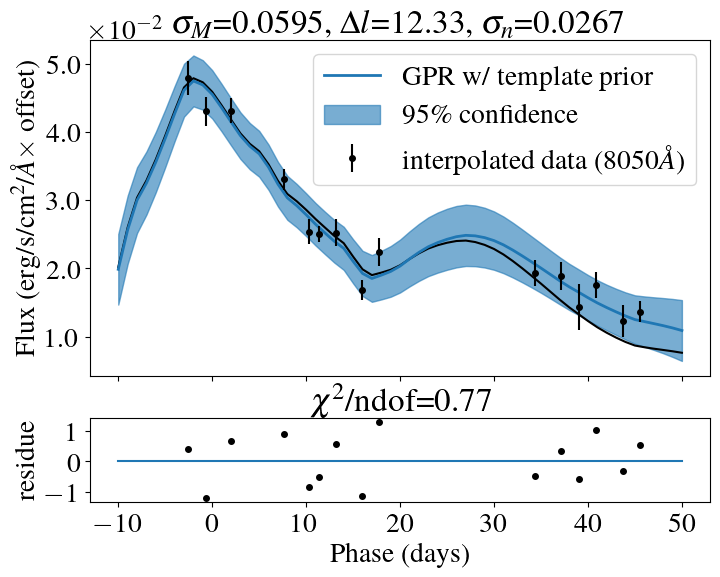

Optimization restart 1/10, f = -19.8330153792299
Optimization restart 2/10, f = -19.833015373630612
Optimization restart 3/10, f = -19.83301537923004
Optimization restart 4/10, f = -19.83301537923004
Optimization restart 5/10, f = -19.83301537860082
Optimization restart 6/10, f = -19.833015379204422
Optimization restart 7/10, f = -19.833015379227046
Optimization restart 8/10, f = -19.83301537899557
Optimization restart 9/10, f = -19.83301537922992
Optimization restart 10/10, f = -19.833015379214856


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0037726293520704006,+ve,"N(0.0038, 0.00038)"
sum.Mat52.lengthscale,12.359265375915198,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0007687457580117173,+ve,"N(0.00076, 7.6e-05)"


Optimization restart 1/10, f = -19.074669077638536
Optimization restart 2/10, f = -19.0746690776296
Optimization restart 3/10, f = -19.07466907763891
Optimization restart 4/10, f = -19.07466905079643
Optimization restart 5/10, f = -19.074669077638966
Optimization restart 6/10, f = -19.074669077626858
Optimization restart 7/10, f = -19.07466907763812
Optimization restart 8/10, f = -19.07466907763862
Optimization restart 9/10, f = -19.074669077638948
Optimization restart 10/10, f = -19.07466907625824


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004325756162286063,+ve,"N(0.0043, 0.00043)"
sum.Mat52.lengthscale,12.317777420258745,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0008820242767434855,+ve,"N(0.00086, 8.6e-05)"


Optimization restart 1/10, f = -16.97449274253733
Optimization restart 2/10, f = -16.97449274253311
Optimization restart 3/10, f = -16.974492742488813
Optimization restart 4/10, f = -16.97449274253737
Optimization restart 5/10, f = -16.97449274163248
Optimization restart 6/10, f = -16.97449274243114
Optimization restart 7/10, f = -16.974492740690426
Optimization restart 8/10, f = -16.974492742537333
Optimization restart 9/10, f = -16.974492742520205
Optimization restart 10/10, f = -16.974492742536153


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005646843710911079,+ve,"N(0.0056, 0.00056)"
sum.Mat52.lengthscale,12.196685090062095,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0011569674641493403,+ve,"N(0.0011, 0.00011)"


Optimization restart 1/10, f = -16.93039082414243
Optimization restart 2/10, f = -16.930390824133354
Optimization restart 3/10, f = -16.930390824050008
Optimization restart 4/10, f = -16.930390824142776
Optimization restart 5/10, f = -16.93039082310426
Optimization restart 6/10, f = -16.93039082413796
Optimization restart 7/10, f = -16.930390824142854
Optimization restart 8/10, f = -16.93039082414287
Optimization restart 9/10, f = -16.930390824142783
Optimization restart 10/10, f = -16.930390824142872


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005753170313657964,+ve,"N(0.0057, 0.00057)"
sum.Mat52.lengthscale,12.268182233879253,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0011800572013520184,+ve,"N(0.0011, 0.00011)"


Optimization restart 1/10, f = -19.3871158166962
Optimization restart 2/10, f = -19.387115816698397
Optimization restart 3/10, f = -19.387115816655196
Optimization restart 4/10, f = -19.387115814328695
Optimization restart 5/10, f = -19.387115816698763
Optimization restart 6/10, f = -19.387115816613914
Optimization restart 7/10, f = -19.387115816645547
Optimization restart 8/10, f = -19.387115816697136
Optimization restart 9/10, f = -19.38711581669131
Optimization restart 10/10, f = -19.38711581669877


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004344588795078751,+ve,"N(0.0043, 0.00043)"
sum.Mat52.lengthscale,12.51151005571845,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0008853221772786547,+ve,"N(0.00087, 8.7e-05)"


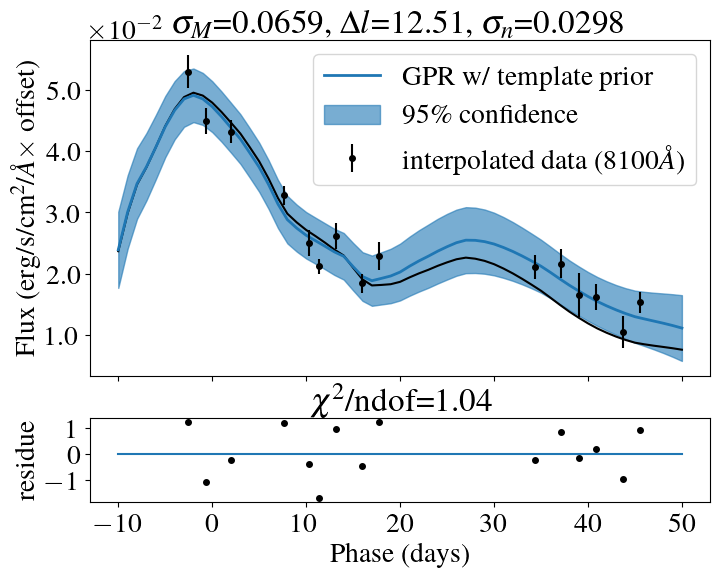

Optimization restart 1/10, f = -17.38207049477075
Optimization restart 2/10, f = -17.382070494770776
Optimization restart 3/10, f = -17.382070494770538
Optimization restart 4/10, f = -17.382070494768513
Optimization restart 5/10, f = -17.38207049477069
Optimization restart 6/10, f = -17.382070494768012
Optimization restart 7/10, f = -17.382070494770765
Optimization restart 8/10, f = -17.382070494506287
Optimization restart 9/10, f = -17.382070494766065
Optimization restart 10/10, f = -17.382070494641383


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005549362014025414,+ve,"N(0.0055, 0.00055)"
sum.Mat52.lengthscale,12.45506053712527,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0011336111750998529,+ve,"N(0.0011, 0.00011)"


Optimization restart 1/10, f = -17.660495793966934
Optimization restart 2/10, f = -17.66049579357217
Optimization restart 3/10, f = -17.660495793956443
Optimization restart 4/10, f = -17.66049579032282
Optimization restart 5/10, f = -17.660495793967883
Optimization restart 6/10, f = -17.660495763814716
Optimization restart 7/10, f = -17.66049579380822
Optimization restart 8/10, f = -17.66049579392336
Optimization restart 9/10, f = -17.660495793967893
Optimization restart 10/10, f = -17.66049579396767


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005508349751550577,+ve,"N(0.0055, 0.00055)"
sum.Mat52.lengthscale,12.409604490160604,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0011218405845599255,+ve,"N(0.0011, 0.00011)"


Optimization restart 1/10, f = -18.088770039150127
Optimization restart 2/10, f = -18.0887700369
Optimization restart 3/10, f = -18.08877003853214
Optimization restart 4/10, f = -18.088770039146787
Optimization restart 5/10, f = -18.088770039070535
Optimization restart 6/10, f = -18.088770039144237
Optimization restart 7/10, f = -18.08877003914424
Optimization restart 8/10, f = -18.08877003914808
Optimization restart 9/10, f = -18.088770039150237
Optimization restart 10/10, f = -18.08877003915027


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005048024617857052,+ve,"N(0.005, 0.0005)"
sum.Mat52.lengthscale,12.28162055881834,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0010257065924565185,+ve,"N(0.001, 0.0001)"


Optimization restart 1/10, f = -15.160548297792312
Optimization restart 2/10, f = -15.160548297764155
Optimization restart 3/10, f = -15.160548297792113
Optimization restart 4/10, f = -15.160548297792076
Optimization restart 5/10, f = -15.160548292943494
Optimization restart 6/10, f = -15.160548297448585
Optimization restart 7/10, f = -15.16054829763899
Optimization restart 8/10, f = -15.160548297792099
Optimization restart 9/10, f = -15.160548297792158
Optimization restart 10/10, f = -15.160548295469017


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006581991338245879,+ve,"N(0.0066, 0.00066)"
sum.Mat52.lengthscale,12.039900799949958,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0013443756214925012,+ve,"N(0.0013, 0.00013)"


Optimization restart 1/10, f = -15.40420392296993
Optimization restart 2/10, f = -15.40420392296442
Optimization restart 3/10, f = -15.404203922969865
Optimization restart 4/10, f = -15.404203922957558
Optimization restart 5/10, f = -15.404203922969936
Optimization restart 6/10, f = -15.404203922969595
Optimization restart 7/10, f = -15.404203922969867
Optimization restart 8/10, f = -15.404203922966508
Optimization restart 9/10, f = -15.40420392296707
Optimization restart 10/10, f = -15.404203916297774


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.00675843019541278,+ve,"N(0.0067, 0.00067)"
sum.Mat52.lengthscale,11.898894536431964,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0013770719952853313,+ve,"N(0.0013, 0.00013)"


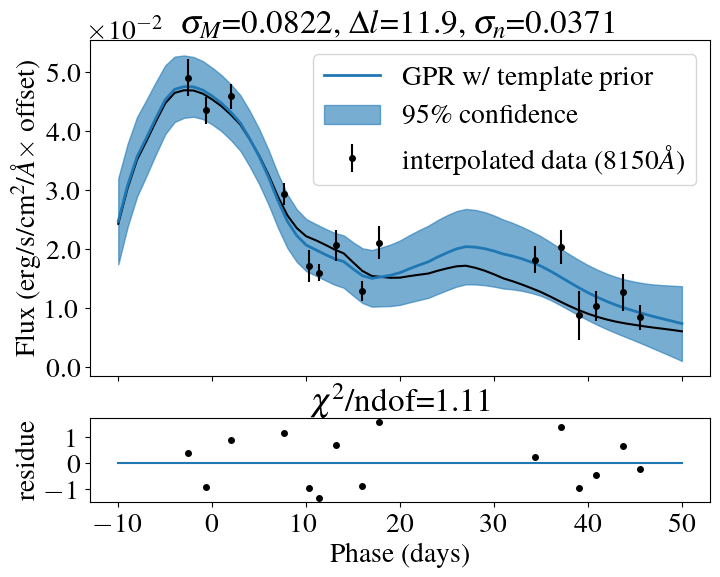

Optimization restart 1/10, f = -15.370801719622316
Optimization restart 2/10, f = -15.370801719624264
Optimization restart 3/10, f = -15.370801719634038
Optimization restart 4/10, f = -15.370801719634738
Optimization restart 5/10, f = -15.370801719633965
Optimization restart 6/10, f = -15.370801719634844
Optimization restart 7/10, f = -15.37080171963497
Optimization restart 8/10, f = -15.37080171963475
Optimization restart 9/10, f = -15.370801719635075
Optimization restart 10/10, f = -15.37080171961534


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.007245590022465734,+ve,"N(0.0072, 0.00072)"
sum.Mat52.lengthscale,11.727476675858108,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0014733528492540545,+ve,"N(0.0014, 0.00014)"


Optimization restart 1/10, f = -15.79280638572399
Optimization restart 2/10, f = -15.792806385698219
Optimization restart 3/10, f = -15.792806385703694
Optimization restart 4/10, f = -15.792806385723205
Optimization restart 5/10, f = -15.792806385724724
Optimization restart 6/10, f = -15.79280638572483
Optimization restart 7/10, f = -15.792806385724639
Optimization restart 8/10, f = -15.79280638572481
Optimization restart 9/10, f = -15.792806385697084
Optimization restart 10/10, f = -15.792806385724827


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.0074118019784605305,+ve,"N(0.0074, 0.00074)"
sum.Mat52.lengthscale,11.5961708253884,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001501766826179097,+ve,"N(0.0015, 0.00015)"


Optimization restart 1/10, f = -19.117522553102845
Optimization restart 2/10, f = -19.11752255204376
Optimization restart 3/10, f = -19.117522553102038
Optimization restart 4/10, f = -19.117522553073265
Optimization restart 5/10, f = -19.117522552731433
Optimization restart 6/10, f = -19.11752255054614
Optimization restart 7/10, f = -19.11752255310314
Optimization restart 8/10, f = -19.11752255299634
Optimization restart 9/10, f = -19.117522553103143
Optimization restart 10/10, f = -19.1175225528512


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005312433875781817,+ve,"N(0.0053, 0.00053)"
sum.Mat52.lengthscale,11.873796915681238,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001067689692702692,+ve,"N(0.0011, 0.00011)"


Optimization restart 1/10, f = -17.55636042984193
Optimization restart 2/10, f = -17.55636042977187
Optimization restart 3/10, f = -17.55636042717518
Optimization restart 4/10, f = -17.556360429815037
Optimization restart 5/10, f = -17.556360429841696
Optimization restart 6/10, f = -17.556360429841934
Optimization restart 7/10, f = -17.556360429835802
Optimization restart 8/10, f = -17.556360429838993
Optimization restart 9/10, f = -17.556360429780035
Optimization restart 10/10, f = -17.556360403615088


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006247180893420243,+ve,"N(0.0062, 0.00062)"
sum.Mat52.lengthscale,12.174564545494077,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0012624761331807449,+ve,"N(0.0012, 0.00012)"


Optimization restart 1/10, f = -19.089338478318034
Optimization restart 2/10, f = -19.089338478315412
Optimization restart 3/10, f = -19.089338477587518
Optimization restart 4/10, f = -19.089338478334824
Optimization restart 5/10, f = -19.089338478336455
Optimization restart 6/10, f = -19.08933847833659
Optimization restart 7/10, f = -19.089338478336735
Optimization restart 8/10, f = -19.089338478323864
Optimization restart 9/10, f = -19.089338478288948
Optimization restart 10/10, f = -19.08933847823768


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005254388270672229,+ve,"N(0.0053, 0.00053)"
sum.Mat52.lengthscale,12.14023547042193,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001058638229570147,+ve,"N(0.0011, 0.00011)"


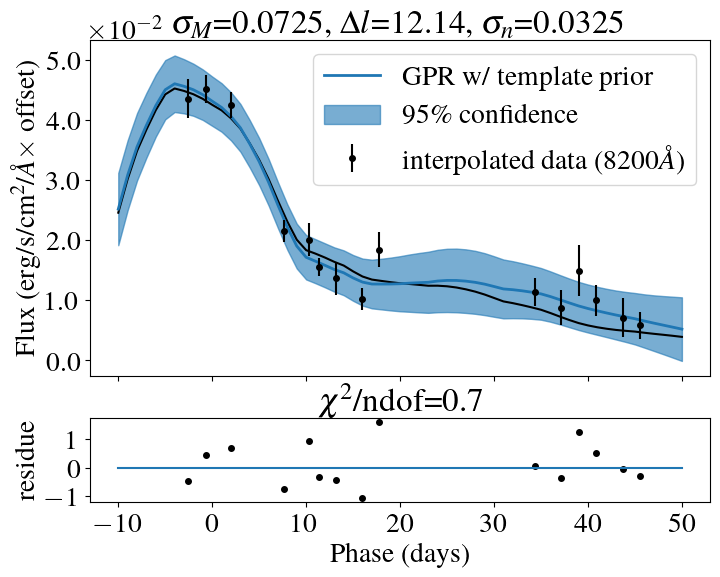

Optimization restart 1/10, f = -22.200232706507744
Optimization restart 2/10, f = -22.200232706819925
Optimization restart 3/10, f = -22.200232706820074
Optimization restart 4/10, f = -22.20023270678991
Optimization restart 5/10, f = -22.20023269875006
Optimization restart 6/10, f = -22.200232706807107
Optimization restart 7/10, f = -22.200232706818603
Optimization restart 8/10, f = -22.2002327068187
Optimization restart 9/10, f = -22.20023270681384
Optimization restart 10/10, f = -22.200232706748096


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003309129283390134,+ve,"N(0.0033, 0.00033)"
sum.Mat52.lengthscale,11.606670126547424,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.000662498404614145,+ve,"N(0.00066, 6.6e-05)"


Optimization restart 1/10, f = -15.2830774024598
Optimization restart 2/10, f = -15.283077402454932
Optimization restart 3/10, f = -15.28307740245648
Optimization restart 4/10, f = -15.283077402456502
Optimization restart 5/10, f = -15.28307740245145
Optimization restart 6/10, f = -15.283077402451555
Optimization restart 7/10, f = -15.283077402458975
Optimization restart 8/10, f = -15.283077402451154
Optimization restart 9/10, f = -15.283077402458721
Optimization restart 10/10, f = -15.283077402440098


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006157902189878981,+ve,"N(0.0061, 0.00061)"
sum.Mat52.lengthscale,10.889352786674046,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0012406164096662022,+ve,"N(0.0012, 0.00012)"


Optimization restart 1/10, f = -18.868990270693573
Optimization restart 2/10, f = -18.868990270714107
Optimization restart 3/10, f = -18.86899027071382
Optimization restart 4/10, f = -18.8689902707139
Optimization restart 5/10, f = -18.868990270713795
Optimization restart 6/10, f = -18.868990270515425
Optimization restart 7/10, f = -18.868990270713343
Optimization restart 8/10, f = -18.868990270714157
Optimization restart 9/10, f = -18.868990270706348
Optimization restart 10/10, f = -18.86899027062953


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004530369215401624,+ve,"N(0.0045, 0.00045)"
sum.Mat52.lengthscale,10.998193588390032,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0009093300211768727,+ve,"N(0.0009, 9e-05)"


Optimization restart 1/10, f = -21.33596727139612
Optimization restart 2/10, f = -21.335967271406915
Optimization restart 3/10, f = -21.335967271407277
Optimization restart 4/10, f = -21.335967271407274
Optimization restart 5/10, f = -21.335967269832295
Optimization restart 6/10, f = -21.335967271407227
Optimization restart 7/10, f = -21.335967271372994
Optimization restart 8/10, f = -21.335967271342106
Optimization restart 9/10, f = -21.3359672711902
Optimization restart 10/10, f = -21.335967271406343


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.003106676169169316,+ve,"N(0.0031, 0.00031)"
sum.Mat52.lengthscale,11.293835269544028,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0006231669597321444,+ve,"N(0.00062, 6.2e-05)"


Optimization restart 1/10, f = -19.071589394610314
Optimization restart 2/10, f = -19.071589394588585
Optimization restart 3/10, f = -19.07158939380694
Optimization restart 4/10, f = -19.071589393357453
Optimization restart 5/10, f = -19.07158939288152
Optimization restart 6/10, f = -19.071589394612367
Optimization restart 7/10, f = -19.07158939461202
Optimization restart 8/10, f = -19.071589394608743
Optimization restart 9/10, f = -19.071589394611955
Optimization restart 10/10, f = -19.07158939461233


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004131107860410261,+ve,"N(0.0041, 0.00041)"
sum.Mat52.lengthscale,11.420245563236065,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0008307088588274689,+ve,"N(0.00082, 8.2e-05)"


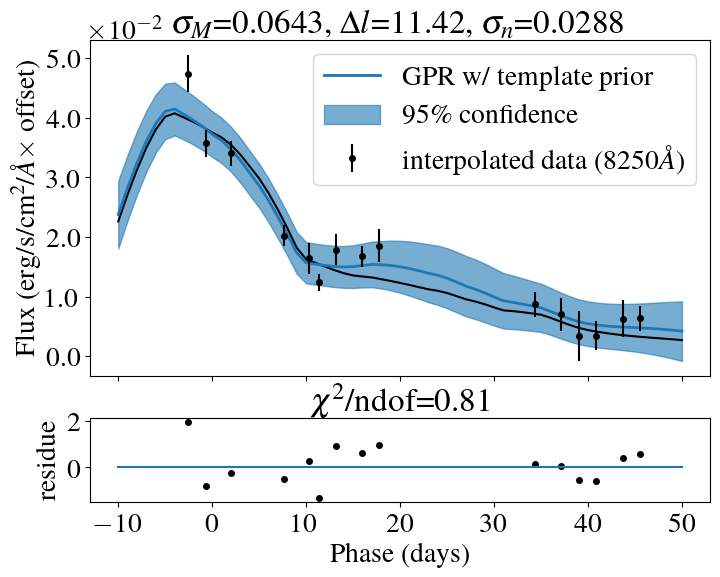

Optimization restart 1/10, f = -17.992242034672294
Optimization restart 2/10, f = -17.992242034672216
Optimization restart 3/10, f = -17.99224203467199
Optimization restart 4/10, f = -17.99224203467236
Optimization restart 5/10, f = -17.992242034607578
Optimization restart 6/10, f = -17.99224203467234
Optimization restart 7/10, f = -17.992242019782694
Optimization restart 8/10, f = -17.99224203462976
Optimization restart 9/10, f = -17.99224203467238
Optimization restart 10/10, f = -17.992242034362917


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005214327487020736,+ve,"N(0.0052, 0.00052)"
sum.Mat52.lengthscale,11.819715940450445,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0010504621012244642,+ve,"N(0.001, 0.0001)"


Optimization restart 1/10, f = -13.17551380820667
Optimization restart 2/10, f = -13.175513806926187
Optimization restart 3/10, f = -13.175513808204034
Optimization restart 4/10, f = -13.175513808206668
Optimization restart 5/10, f = -13.17551380820546
Optimization restart 6/10, f = -13.175513808199266
Optimization restart 7/10, f = -13.17551380810044
Optimization restart 8/10, f = -13.175513808206341
Optimization restart 9/10, f = -13.175513808206597
Optimization restart 10/10, f = -13.17551380820664


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.009987845095632901,+ve,"N(0.01, 0.001)"
sum.Mat52.lengthscale,12.059295101743473,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.002034460622727183,+ve,"N(0.002, 0.0002)"


Optimization restart 1/10, f = -11.156546839238832
Optimization restart 2/10, f = -11.156546837268273
Optimization restart 3/10, f = -11.156546839147705
Optimization restart 4/10, f = -11.156546835006203
Optimization restart 5/10, f = -11.156546838529302
Optimization restart 6/10, f = -11.156546839238434
Optimization restart 7/10, f = -11.156546839237933
Optimization restart 8/10, f = -11.156546839234577
Optimization restart 9/10, f = -11.156546839238603
Optimization restart 10/10, f = -11.156546839236096


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.013298266242971485,+ve,"N(0.013, 0.0013)"
sum.Mat52.lengthscale,12.279198593643326,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.002727993692797883,+ve,"N(0.0027, 0.00027)"


Optimization restart 1/10, f = -16.13207422614508
Optimization restart 2/10, f = -16.132074226147616
Optimization restart 3/10, f = -16.132074226147846
Optimization restart 4/10, f = -16.132074226141427
Optimization restart 5/10, f = -16.132074226147886
Optimization restart 6/10, f = -16.132074224342336
Optimization restart 7/10, f = -16.132074226147843
Optimization restart 8/10, f = -16.132074226147356
Optimization restart 9/10, f = -16.132074226113758
Optimization restart 10/10, f = -16.132074226147886


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.009329354577883996,+ve,"N(0.0093, 0.00093)"
sum.Mat52.lengthscale,12.332200727264715,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0018847954880062958,+ve,"N(0.0019, 0.00019)"


Optimization restart 1/10, f = -16.712160622580583
Optimization restart 2/10, f = -16.71216062258059
Optimization restart 3/10, f = -16.71216061367859
Optimization restart 4/10, f = -16.712160622580587
Optimization restart 5/10, f = -16.71216062258059
Optimization restart 6/10, f = -16.712160622568508
Optimization restart 7/10, f = -16.712160622258097
Optimization restart 8/10, f = -16.712160622579663
Optimization restart 9/10, f = -16.712160622570742
Optimization restart 10/10, f = -16.71216062256064


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.009049230391110444,+ve,"N(0.009, 0.0009)"
sum.Mat52.lengthscale,11.588443512802407,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001815291830938391,+ve,"N(0.0018, 0.00018)"


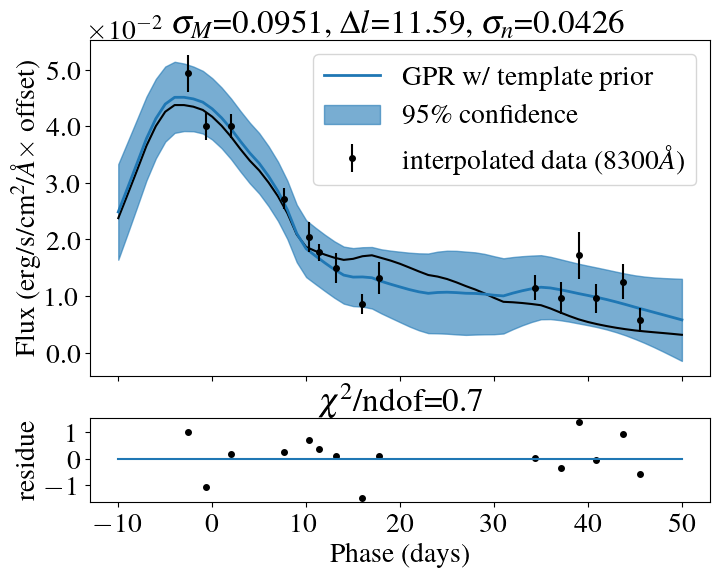

Optimization restart 1/10, f = -16.170775321745637
Optimization restart 2/10, f = -16.170775321714952
Optimization restart 3/10, f = -16.17077532168217
Optimization restart 4/10, f = -16.170775321565127
Optimization restart 5/10, f = -16.17077532174562
Optimization restart 6/10, f = -16.170775321728534
Optimization restart 7/10, f = -16.17077532164826
Optimization restart 8/10, f = -16.17077532166434
Optimization restart 9/10, f = -16.170775321745655
Optimization restart 10/10, f = -16.170775320333668


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.008754379155427868,+ve,"N(0.0087, 0.00087)"
sum.Mat52.lengthscale,11.041624432604388,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001753765536699104,+ve,"N(0.0017, 0.00017)"


Optimization restart 1/10, f = -16.388353515206422
Optimization restart 2/10, f = -16.388353515205118
Optimization restart 3/10, f = -16.388353515206063
Optimization restart 4/10, f = -16.38835351519878
Optimization restart 5/10, f = -16.3883535128966
Optimization restart 6/10, f = -16.388353515203168
Optimization restart 7/10, f = -16.388353515203143
Optimization restart 8/10, f = -16.388353514855744
Optimization restart 9/10, f = -16.38835351520615
Optimization restart 10/10, f = -16.38835349927929


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006692819678691529,+ve,"N(0.0066, 0.00066)"
sum.Mat52.lengthscale,11.089809389301857,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0013457464809743579,+ve,"N(0.0013, 0.00013)"


Optimization restart 1/10, f = -14.3158762716155
Optimization restart 2/10, f = -14.315876271615231
Optimization restart 3/10, f = -14.315876271613543
Optimization restart 4/10, f = -14.315876271615263
Optimization restart 5/10, f = -14.315876271564294
Optimization restart 6/10, f = -14.315876271592094
Optimization restart 7/10, f = -14.315876271160588
Optimization restart 8/10, f = -14.315876271611664
Optimization restart 9/10, f = -14.315876271608404
Optimization restart 10/10, f = -14.315876271615489


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006640488945196609,+ve,"N(0.0066, 0.00066)"
sum.Mat52.lengthscale,11.268846732771259,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.001348363732209009,+ve,"N(0.0013, 0.00013)"


Optimization restart 1/10, f = -15.667233428127444
Optimization restart 2/10, f = -15.667233428129052
Optimization restart 3/10, f = -15.667233428128334
Optimization restart 4/10, f = -15.66723342812921
Optimization restart 5/10, f = -15.667233428126186
Optimization restart 6/10, f = -15.667233428129306
Optimization restart 7/10, f = -15.667233428098449
Optimization restart 8/10, f = -15.66723342812893
Optimization restart 9/10, f = -15.667233428129311
Optimization restart 10/10, f = -15.667233428127602


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005702213152195643,+ve,"N(0.0057, 0.00057)"
sum.Mat52.lengthscale,11.725900923859474,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0011607171982053052,+ve,"N(0.0011, 0.00011)"


Optimization restart 1/10, f = -15.272721116627356
Optimization restart 2/10, f = -15.272721115772919
Optimization restart 3/10, f = -15.272721116627364
Optimization restart 4/10, f = -15.272721116518024
Optimization restart 5/10, f = -15.272721116627359
Optimization restart 6/10, f = -15.27272111662722
Optimization restart 7/10, f = -15.272721116238815
Optimization restart 8/10, f = -15.27272111662736
Optimization restart 9/10, f = -15.272721115128082
Optimization restart 10/10, f = -15.272721116624314


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006386538911423377,+ve,"N(0.0064, 0.00064)"
sum.Mat52.lengthscale,12.079829024634574,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0013080657305800348,+ve,"N(0.0013, 0.00013)"


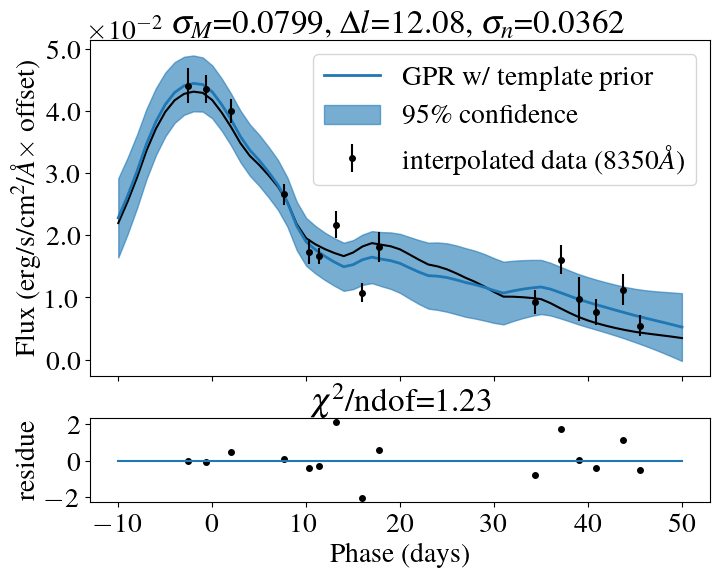

Optimization restart 1/10, f = -11.510415320388852
Optimization restart 2/10, f = -11.510415320377303
Optimization restart 3/10, f = -11.510415316636193
Optimization restart 4/10, f = -11.510415320388823
Optimization restart 5/10, f = -11.510415309572002
Optimization restart 6/10, f = -11.510415319837552
Optimization restart 7/10, f = -11.510415320388537
Optimization restart 8/10, f = -11.51041531921518
Optimization restart 9/10, f = -11.51041532038546
Optimization restart 10/10, f = -11.510415320375953


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.00880438076912602,+ve,"N(0.0088, 0.00088)"
sum.Mat52.lengthscale,11.86533259979372,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0018381977850952867,+ve,"N(0.0018, 0.00018)"


Optimization restart 1/10, f = -16.776882138316374
Optimization restart 2/10, f = -16.776882138316605
Optimization restart 3/10, f = -16.776882138316314
Optimization restart 4/10, f = -16.776882138316456
Optimization restart 5/10, f = -16.77688213820607
Optimization restart 6/10, f = -16.776882138316346
Optimization restart 7/10, f = -16.776882138306014
Optimization restart 8/10, f = -16.776882138316424
Optimization restart 9/10, f = -16.776882138301737
Optimization restart 10/10, f = -16.776882138299328


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.005736980414201825,+ve,"N(0.0057, 0.00057)"
sum.Mat52.lengthscale,12.155447911124188,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0011732993924646227,+ve,"N(0.0011, 0.00011)"


Optimization restart 1/10, f = -18.136149544117053
Optimization restart 2/10, f = -18.13614954404741
Optimization restart 3/10, f = -18.136149544067678
Optimization restart 4/10, f = -18.13614954411866
Optimization restart 5/10, f = -18.13614954411726
Optimization restart 6/10, f = -18.136149544118638
Optimization restart 7/10, f = -18.136149544052863
Optimization restart 8/10, f = -18.13614954411865
Optimization restart 9/10, f = -18.13614954411717
Optimization restart 10/10, f = -18.136149544110758


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.004961835703629465,+ve,"N(0.0049, 0.00049)"
sum.Mat52.lengthscale,12.135660225360981,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0010080590649568675,+ve,"N(0.00099, 9.9e-05)"


Optimization restart 1/10, f = -15.928719580321308
Optimization restart 2/10, f = -15.928719580318898
Optimization restart 3/10, f = -15.928719580304563
Optimization restart 4/10, f = -15.928719580259383
Optimization restart 5/10, f = -15.928719580318724
Optimization restart 6/10, f = -15.928719580319266
Optimization restart 7/10, f = -15.928719580321255
Optimization restart 8/10, f = -15.928719579472649
Optimization restart 9/10, f = -15.928719580264836
Optimization restart 10/10, f = -15.928719580320948


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.006303451778982808,+ve,"N(0.0063, 0.00063)"
sum.Mat52.lengthscale,11.940780069453593,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0012837828240349052,+ve,"N(0.0013, 0.00013)"


Optimization restart 1/10, f = -16.6732157624637
Optimization restart 2/10, f = -16.67321576246369
Optimization restart 3/10, f = -16.673215762463673
Optimization restart 4/10, f = -16.67321568567291
Optimization restart 5/10, f = -16.673215762460792
Optimization restart 6/10, f = -16.67321576246369
Optimization restart 7/10, f = -16.67321576246157
Optimization restart 8/10, f = -16.673215759112665
Optimization restart 9/10, f = -16.67321576246356
Optimization restart 10/10, f = -16.673215762463492


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.007670356295890661,+ve,"N(0.0076, 0.00076)"
sum.Mat52.lengthscale,11.756573947108008,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0015474140928186369,+ve,"N(0.0015, 0.00015)"


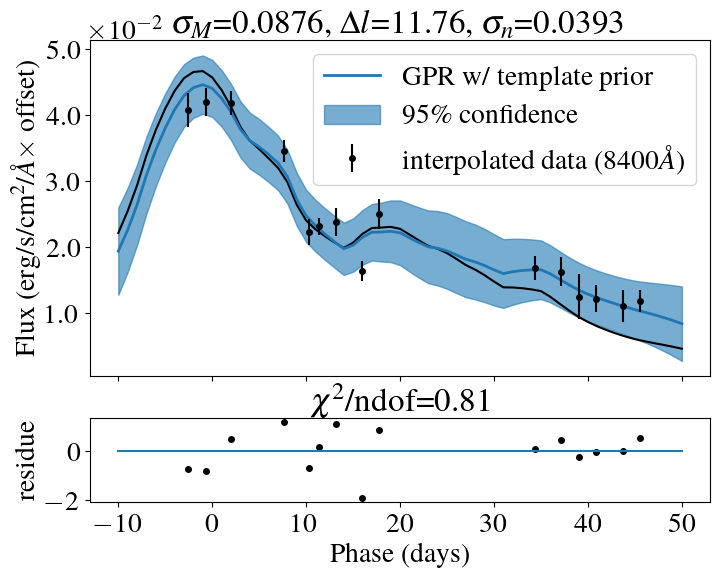

Optimization restart 1/10, f = -14.410983263665818
Optimization restart 2/10, f = -14.410983263665035
Optimization restart 3/10, f = -14.41098326366733
Optimization restart 4/10, f = -14.410983263599102
Optimization restart 5/10, f = -14.410983263651998
Optimization restart 6/10, f = -14.4109832636671
Optimization restart 7/10, f = -14.410983263666507
Optimization restart 8/10, f = -14.4109832636399
Optimization restart 9/10, f = -14.410983263651497
Optimization restart 10/10, f = -14.4109832630397


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.011005678245178667,+ve,"N(0.011, 0.0011)"
sum.Mat52.lengthscale,11.534091702712612,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0022249430033337504,+ve,"N(0.0022, 0.00022)"


Optimization restart 1/10, f = -12.127172649707154
Optimization restart 2/10, f = -12.127172649705953
Optimization restart 3/10, f = -12.127172649706274
Optimization restart 4/10, f = -12.127172649648378
Optimization restart 5/10, f = -12.127172649706345
Optimization restart 6/10, f = -12.127172649706754
Optimization restart 7/10, f = -12.127172649707102
Optimization restart 8/10, f = -12.12717264970707
Optimization restart 9/10, f = -12.127172649706743
Optimization restart 10/10, f = -12.127172648966642


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.015197465965239227,+ve,"N(0.015, 0.0015)"
sum.Mat52.lengthscale,11.50382758723294,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.003081508857534096,+ve,"N(0.003, 0.0003)"


Optimization restart 1/10, f = -11.627641430318796
Optimization restart 2/10, f = -11.627641430317803
Optimization restart 3/10, f = -11.627641430314323
Optimization restart 4/10, f = -11.62764143031889
Optimization restart 5/10, f = -11.627641430206692
Optimization restart 6/10, f = -11.627641430298194
Optimization restart 7/10, f = -11.62764143031891
Optimization restart 8/10, f = -11.62764143031896
Optimization restart 9/10, f = -11.62764142969072
Optimization restart 10/10, f = -11.627641430291947


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.019371420440845614,+ve,"N(0.019, 0.0019)"
sum.Mat52.lengthscale,11.784498359422718,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0039062346006017643,+ve,"N(0.0038, 0.00038)"


Optimization restart 1/10, f = -10.62783054846148
Optimization restart 2/10, f = -10.627830548467651
Optimization restart 3/10, f = -10.627830548461938
Optimization restart 4/10, f = -10.627830548452167
Optimization restart 5/10, f = -10.627830548466314
Optimization restart 6/10, f = -10.62783054846199
Optimization restart 7/10, f = -10.627830548467848
Optimization restart 8/10, f = -10.627830548375732
Optimization restart 9/10, f = -10.627830548468935
Optimization restart 10/10, f = -10.62783054754309


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.02311248888966907,+ve,"N(0.023, 0.0023)"
sum.Mat52.lengthscale,11.98264548155838,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.004665720115138704,+ve,"N(0.0046, 0.00046)"


Optimization restart 1/10, f = -11.268284233877093
Optimization restart 2/10, f = -11.268284233876944
Optimization restart 3/10, f = -11.268284233877097
Optimization restart 4/10, f = -11.26828423385355
Optimization restart 5/10, f = -11.26828423387708
Optimization restart 6/10, f = -11.268284233795253
Optimization restart 7/10, f = -11.268284233876168
Optimization restart 8/10, f = -11.26828421808991
Optimization restart 9/10, f = -11.268284233865828
Optimization restart 10/10, f = -11.268284233877099


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.02467198808713622,+ve,"N(0.024, 0.0024)"
sum.Mat52.lengthscale,12.133902179379131,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.004955247773215854,+ve,"N(0.0049, 0.00049)"


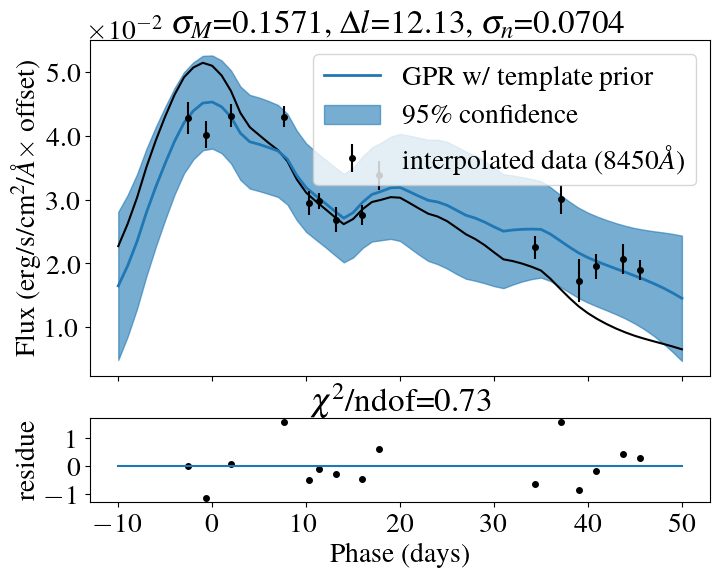

Optimization restart 1/10, f = -12.00867532207295
Optimization restart 2/10, f = -12.008675322070316
Optimization restart 3/10, f = -12.008675322073318
Optimization restart 4/10, f = -12.008675322073334
Optimization restart 5/10, f = -12.008675322072367
Optimization restart 6/10, f = -12.008675322072357
Optimization restart 7/10, f = -12.008675322068894
Optimization restart 8/10, f = -12.00867532206317
Optimization restart 9/10, f = -12.00867532155333
Optimization restart 10/10, f = -12.008675319472358


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.025464470473289376,+ve,"N(0.025, 0.0025)"
sum.Mat52.lengthscale,12.258348821377853,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.005095000022276154,+ve,"N(0.0051, 0.00051)"


Optimization restart 1/10, f = -10.89227712020057
Optimization restart 2/10, f = -10.892277118591233
Optimization restart 3/10, f = -10.892277120195414
Optimization restart 4/10, f = -10.892277120196827
Optimization restart 5/10, f = -10.892277120200474
Optimization restart 6/10, f = -10.892277120197713
Optimization restart 7/10, f = -10.89227711753899
Optimization restart 8/10, f = -10.892277120166067
Optimization restart 9/10, f = -10.89227712020038
Optimization restart 10/10, f = -10.892277120200518


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.02828419095866171,+ve,"N(0.028, 0.0028)"
sum.Mat52.lengthscale,12.319422001872285,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.005691866940298147,+ve,"N(0.0056, 0.00056)"


Optimization restart 1/10, f = -10.664719413971033
Optimization restart 2/10, f = -10.66471940753653
Optimization restart 3/10, f = -10.664719413971033
Optimization restart 4/10, f = -10.664719413954382
Optimization restart 5/10, f = -10.664719413971017
Optimization restart 6/10, f = -10.66471941377424
Optimization restart 7/10, f = -10.664719413969463
Optimization restart 8/10, f = -10.66471941397103
Optimization restart 9/10, f = -10.664719413601365
Optimization restart 10/10, f = -10.664719413962676


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.031217138359063517,+ve,"N(0.031, 0.0031)"
sum.Mat52.lengthscale,12.325414077032987,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.00625725892396908,+ve,"N(0.0062, 0.00062)"


Optimization restart 1/10, f = -9.302317578246559
Optimization restart 2/10, f = -9.302317578247086
Optimization restart 3/10, f = -9.302317578247097
Optimization restart 4/10, f = -9.302317578231095
Optimization restart 5/10, f = -9.302317578247022
Optimization restart 6/10, f = -9.302317578152756
Optimization restart 7/10, f = -9.30231757822621
Optimization restart 8/10, f = -9.30231757824691
Optimization restart 9/10, f = -9.30231757822855
Optimization restart 10/10, f = -9.302317574185299


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.03561999438003755,+ve,"N(0.035, 0.0035)"
sum.Mat52.lengthscale,12.290533984499374,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0071631704340161684,+ve,"N(0.0071, 0.00071)"


Optimization restart 1/10, f = -6.760323746376578
Optimization restart 2/10, f = -6.760323746373816
Optimization restart 3/10, f = -6.760323746376075
Optimization restart 4/10, f = -6.7603237463765655
Optimization restart 5/10, f = -6.760323746367165
Optimization restart 6/10, f = -6.760323746376571
Optimization restart 7/10, f = -6.760323746376596
Optimization restart 8/10, f = -6.760323746376558
Optimization restart 9/10, f = -6.760323746376574
Optimization restart 10/10, f = -6.760323746376368


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.04094457328074116,+ve,"N(0.041, 0.0041)"
sum.Mat52.lengthscale,12.228233707894248,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.008340441983412841,+ve,"N(0.0081, 0.00081)"


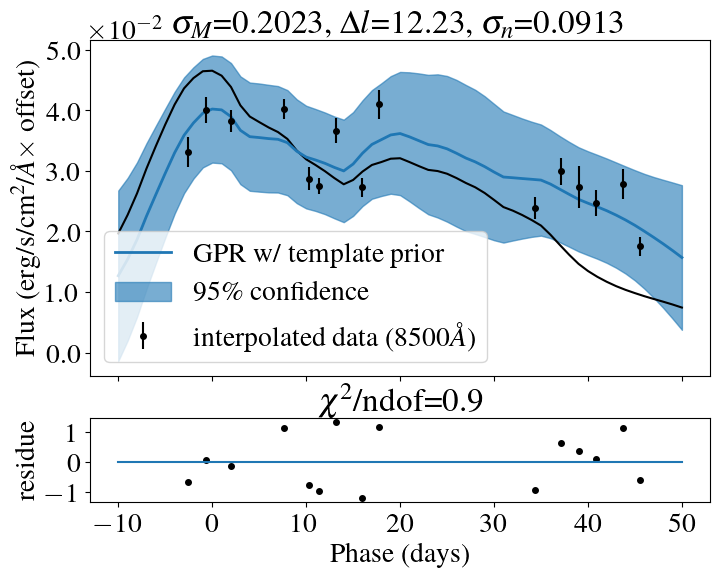

Optimization restart 1/10, f = -8.487008956989046
Optimization restart 2/10, f = -8.487008956989065
Optimization restart 3/10, f = -8.487008956986406
Optimization restart 4/10, f = -8.48700895682118
Optimization restart 5/10, f = -8.487008956983638
Optimization restart 6/10, f = -8.487008956988626
Optimization restart 7/10, f = -8.487008956989033
Optimization restart 8/10, f = -8.487008956988237
Optimization restart 9/10, f = -8.487008956989063
Optimization restart 10/10, f = -8.48700895698905


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.03162907586818876,+ve,"N(0.031, 0.0031)"
sum.Mat52.lengthscale,12.286513607806592,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0064480439839581325,+ve,"N(0.0063, 0.00063)"


Optimization restart 1/10, f = -9.356842596102025
Optimization restart 2/10, f = -9.356842590865169
Optimization restart 3/10, f = -9.356842596065574
Optimization restart 4/10, f = -9.356842596102293
Optimization restart 5/10, f = -9.35684259610282
Optimization restart 6/10, f = -9.356842596102796
Optimization restart 7/10, f = -9.356842596077506
Optimization restart 8/10, f = -9.356842596102778
Optimization restart 9/10, f = -9.35684259610279
Optimization restart 10/10, f = -9.356842596102789


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.025539078672733004,+ve,"N(0.025, 0.0025)"
sum.Mat52.lengthscale,12.2663527702921,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.005224907832724354,+ve,"N(0.0051, 0.00051)"


Optimization restart 1/10, f = -9.433379308482904
Optimization restart 2/10, f = -9.433379308466579
Optimization restart 3/10, f = -9.43337930848247
Optimization restart 4/10, f = -9.433379308481582
Optimization restart 5/10, f = -9.43337930848288
Optimization restart 6/10, f = -9.433379308471418
Optimization restart 7/10, f = -9.433379308482179
Optimization restart 8/10, f = -9.433379308482788
Optimization restart 9/10, f = -9.4333793084829
Optimization restart 10/10, f = -9.433379308482774


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.02181783142926705,+ve,"N(0.022, 0.0022)"
sum.Mat52.lengthscale,12.140434123795933,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.004484441867431673,+ve,"N(0.0043, 0.00043)"


Optimization restart 1/10, f = -10.866066975930542
Optimization restart 2/10, f = -10.866066975932418
Optimization restart 3/10, f = -10.86606697593248
Optimization restart 4/10, f = -10.866066930443012
Optimization restart 5/10, f = -10.866066975932448
Optimization restart 6/10, f = -10.866066975931997
Optimization restart 7/10, f = -10.866066975932418
Optimization restart 8/10, f = -10.866066975867904
Optimization restart 9/10, f = -10.866066975929572
Optimization restart 10/10, f = -10.866066975932487


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.017957629286554772,+ve,"N(0.018, 0.0018)"
sum.Mat52.lengthscale,11.896972242678071,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0036683883471815715,+ve,"N(0.0036, 0.00036)"


Optimization restart 1/10, f = -12.191190241064415
Optimization restart 2/10, f = -12.191190241064861
Optimization restart 3/10, f = -12.1911902410655
Optimization restart 4/10, f = -12.191190207056925
Optimization restart 5/10, f = -12.19119024102642
Optimization restart 6/10, f = -12.191190240933802
Optimization restart 7/10, f = -12.191190241065504
Optimization restart 8/10, f = -12.191190241026638
Optimization restart 9/10, f = -12.19119024106551
Optimization restart 10/10, f = -12.191190241008867


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.014304195351078743,+ve,"N(0.014, 0.0014)"
sum.Mat52.lengthscale,11.386003296859517,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.002902650386362796,+ve,"N(0.0028, 0.00028)"


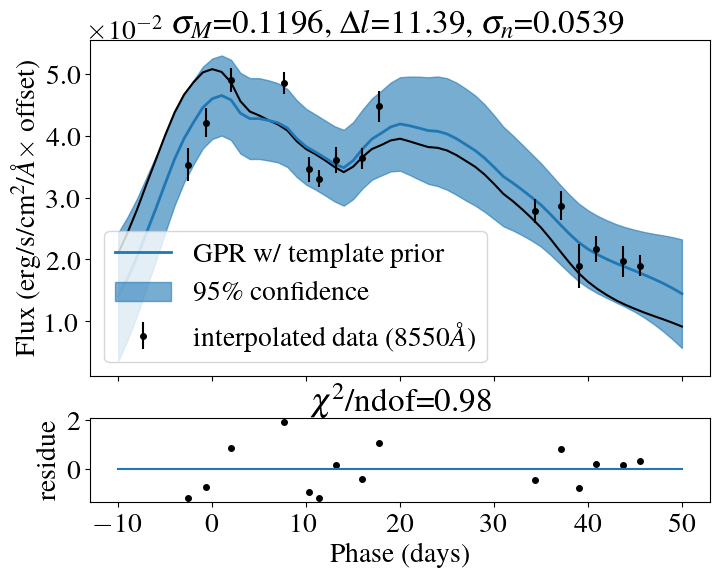

Optimization restart 1/10, f = -12.648814082522374
Optimization restart 2/10, f = -12.648814082492787
Optimization restart 3/10, f = -12.64881408252457
Optimization restart 4/10, f = -12.648814082523083
Optimization restart 5/10, f = -12.648814068723699
Optimization restart 6/10, f = -12.648814082524765
Optimization restart 7/10, f = -12.648814082524106
Optimization restart 8/10, f = -12.64881408252512
Optimization restart 9/10, f = -12.648814082525105
Optimization restart 10/10, f = -12.648814082524137


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.012519483914497701,+ve,"N(0.012, 0.0012)"
sum.Mat52.lengthscale,11.10285910434477,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.002536164081081981,+ve,"N(0.0025, 0.00025)"


Optimization restart 1/10, f = -12.741152303114202
Optimization restart 2/10, f = -12.741152296961028
Optimization restart 3/10, f = -12.74115230219315
Optimization restart 4/10, f = -12.741152282905913
Optimization restart 5/10, f = -12.741152303050592
Optimization restart 6/10, f = -12.741152303113942
Optimization restart 7/10, f = -12.741152303108873
Optimization restart 8/10, f = -12.741152303115825
Optimization restart 9/10, f = -12.741152303103519
Optimization restart 10/10, f = -12.741152303113408


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.011686953357670081,+ve,"N(0.012, 0.0012)"
sum.Mat52.lengthscale,11.79009787829717,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.0023913917515374287,+ve,"N(0.0023, 0.00023)"


Optimization restart 1/10, f = -11.715699911803219
Optimization restart 2/10, f = -11.715699911765746
Optimization restart 3/10, f = -11.715699910559936
Optimization restart 4/10, f = -11.715699911803322
Optimization restart 5/10, f = -11.71569991180338
Optimization restart 6/10, f = -11.715699911802485
Optimization restart 7/10, f = -11.715699911779371
Optimization restart 8/10, f = -11.715699911797486
Optimization restart 9/10, f = -11.715699911800224
Optimization restart 10/10, f = -11.71569991179486


GP_regression.,value,constraints,priors
sum.Mat52.variance,0.012439838718551316,+ve,"N(0.012, 0.0012)"
sum.Mat52.lengthscale,12.189671760616685,+ve,"N(12, 2.4)"
sum.fixed.variance,1.0,+ve fixed,
Gaussian_noise.variance,0.002566925308310352,+ve,"N(0.0025, 0.00025)"


100%|████████████████████████████████████████████| 1/1 [08:52<00:00, 532.20s/it]


In [14]:
for sn in tqdm(interpolated_reg_data.keys()):

    for wave in w_grid_reg:
        flux=[]
        fluxerr=[]
        p=[]
        for phase in interpolated_reg_data[sn].keys():
            if (phase>=-20) and (phase<=70):
                data_phase=interpolated_reg_data[sn][phase]
                if len(data_phase[data_phase["wave"]==wave]["flux"])>0:
                    flux.append(np.array(data_phase[data_phase["wave"]==wave]["flux"])[0])
                    fluxerr.append(np.array(data_phase[data_phase["wave"]==wave]["eflux"])[0]) 
                    p.append(phase)
                else:
                    continue
            else:
                continue
        norm=max(flux)
        p=np.array(p)[np.array(flux)>0]
        fluxerr=np.array(fluxerr)[np.array(flux)>0]/norm
        flux=np.array(flux)[np.array(flux)>0]/norm
        
        y_mean, y_var, mean_temp, modelpar = gp_w_prior(sn,wave,p,flux,fluxerr)
        
        p_reduced=p[(p>=-10) & (p<=50)]
        flux_reduced=flux[(p>=-10) & (p<=50)]
        fluxerr_reduced=fluxerr[(p>=-10) & (p<=50)]
        y_mean_interp=interp1d(p_grid,y_mean.reshape(-1)*norm)(p_reduced)
        y_mean_err_interp=interp1d(p_grid,np.sqrt(y_var.reshape(-1))*norm)(p_reduced)

        chisqndof=np.sum((flux_reduced*norm-y_mean_interp)**2/((fluxerr_reduced*norm)**2+(y_mean_err_interp)**2))/(len(flux)-3)

        if (wave in np.arange(3310,3340,10)) or (wave in w_grid_plot):
                       
            fig, ax=plt.subplots(2,1,figsize=(8,6), sharex=True, gridspec_kw={'height_ratios': [4, 1]})
            ax[0].set_title(f"$\\sigma_M$={np.round(np.sqrt(modelpar[0]),4)}, $\\Delta l$={np.round(modelpar[1],2)},  $\\sigma_n$={np.round(np.sqrt(modelpar[3]),4)}")
            ax[0].plot(np.arange(-10,51,1),mean_temp*norm,c="black")
            ax[0].plot(p_grid,y_mean*norm,lw=2,color="#1f77b4",label=f"GPR w/ template prior")
            ax[0].fill_between(p_grid,y_mean.reshape(-1)*norm+2.*np.sqrt(y_var.reshape(-1))*norm,y_mean.reshape(-1)*norm-2.*np.sqrt(y_var.reshape(-1))*norm,alpha=0.6,color="#1f77b4",label="95\\% confidence")
            ax[0].set_ylabel(r"Flux (erg/s/cm$^2$/$\AA \times$ offset)")
            ax[0].errorbar(p_reduced,flux_reduced*norm,yerr=fluxerr_reduced*norm,color="black",ls="none",fmt=".",markersize=8,label=f"interpolated data ({wave}$\\AA$)")
            formatter11=ScalarFormatterClass1()
            formatter11.set_scientific(True)
            formatter11.set_powerlimits((0,0))
            ax[0].yaxis.set_major_formatter(formatter11)
            ax[0].legend()
            
            ax[1].set_title(f"$\\chi^2$/ndof={np.round(chisqndof,2)}")
            ax[1].plot(p_reduced,(flux_reduced*norm-y_mean_interp)/np.sqrt((fluxerr_reduced*norm)**2+(y_mean_err_interp)**2),color="black",marker='.',markersize=8,lw=0)
            ax[1].plot(p_grid,np.array([0.]*len(p_grid)),color="#1f77b4")
            ax[1].set_xlabel(r"Phase (days)")
            ax[1].set_ylabel(r"residue")
            plt.show()